In [6]:
import torch
import torch.nn as nn
import numpy as np

In [7]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
import os
import random
from tqdm.notebook import tqdm, trange

In [8]:
%load_ext autoreload
%autoreload 2

from utils import *

In [9]:
import os

indlist = []  # einige Dateien wären doppelt und fehlen im Ordner

filelist = os.listdir('F:/$Daten/mandelbrot_gallery/')
for i in range(len(filelist)):
    if f'img{i}_hr.png' in filelist:
        indlist.append(i)

In [10]:
# Imagegenerator

n = len(indlist)
train_num = n//5*4
val_num = n//5

np.random.seed(10)

img_data = (256, 256, 4)
img_data_lr = (64, 64, 4)
img_shape = (192, 192)
img_shape_lr = (48, 48)



def showimg(img):
    try: img = img.cpu().detach().numpy()
    except: pass
    plt.imshow(img)
    plt.show()



# Todo: Farben augmentieren? (siehe bei Ressourcen)

def getimages(inds, augment=True, img_shape=img_shape):
    f = img_data[0]//img_data_lr[0]  # skalierungsfaktor zwischen hr und lr
    
    def crop(lr, hr):
        x = (img_data_lr[0]-img_shape_lr[0])//2
        y = (img_data_lr[1]-img_shape_lr[1])//2
        return lr[:, x:(x+img_shape_lr[0]), y:(y+img_shape_lr[1])], hr[:, f*x:f*x+img_shape[0], f*y:f*y+img_shape[1]]

    def randomcrop(lr, hr):
        x = np.random.randint(0, img_data_lr[0]-img_shape_lr[0])
        y = np.random.randint(0, img_data_lr[1]-img_shape_lr[1])
        return lr[:, x:(x+img_shape_lr[0]), y:(y+img_shape_lr[1])], hr[:, f*x:f*x+img_shape[0], f*y:f*y+img_shape[1]]
    
    lr = np.zeros((len(inds),) + img_data_lr)
    hr = np.zeros((len(inds),) + img_data)
    
    for i, k in enumerate(inds):
        lr[i] = plt.imread(f'F:/$Daten/mandelbrot_gallery/img{indlist[k]}_lr.png')
        hr[i] = plt.imread(f'F:/$Daten/mandelbrot_gallery/img{indlist[k]}_hr.png')
    lr = lr.mean(-1, keepdims=True)
    hr = hr.mean(-1, keepdims=True)
        
    if augment:
        lr, hr = randomcrop(lr, hr)
        #lr, hr = fliprot_mult(lr, hr)
        
    else:
        lr, hr = crop(lr, hr)
        
    hr = downscale(hr, 4)
    return lr, hr



# Variant without augmentation
getimages_val = lambda inds: getimages([i+train_num for i in inds], augment=False)


train_gen, train_steps = getbatchgen(range(train_num), getimages, batchsize=8)
val_gen, val_steps = getbatchgen(range(val_num), getimages_val, batchsize=8, permute=False)

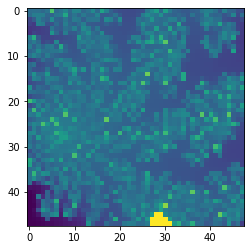

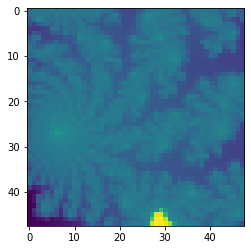

In [11]:
ifixed = 30
lr, hr = getimages_val([ifixed])
#lr, hr = getimages([ifixed])
showimg(lr[0])
showimg(hr[0])

In [12]:

actv = nn.functional.relu

from torch.nn.functional import interpolate

class EDSR(nn.Module):
    def __init__(self, channels=64, inter=5):
        super().__init__()
        self.conv1 = nn.Conv2d(1, channels, 5, padding=2, padding_mode='reflect')
        # EDSR Variant
        self.convblocks1 = nn.ModuleList([nn.Conv2d(channels, channels, 3, padding=1, padding_mode='reflect') for k in range(inter)])
        self.convblocks2 = nn.ModuleList([nn.Conv2d(channels, channels, 3, padding=1, padding_mode='reflect') for k in range(inter)])
        
        self.conv_post = nn.Conv2d(channels, channels, 3, padding=1, padding_mode='reflect')
        self.upconv1 = nn.Conv2d(channels, 4*channels, 3, padding=1, padding_mode='reflect')
        self.upconv2 = nn.Conv2d(channels, 4*channels, 3, padding=1, padding_mode='reflect')
        self.convlast = nn.Conv2d(channels, 1, 9, padding=4, padding_mode='reflect')
        
        self.cuda()
        self.epoch = 0
        self.iters = 0
        self.trainloss = []
        self.valloss = []
        
    @staticmethod
    def pixelshuffle(x, f=2):
        'Pixel shuffle im Format NCHW'
        n, c, h, w = x.shape
        x = x.view(n, c//f**2, f, f, h, w)
        x = x.permute(0, 1, 4, 2, 5, 3)
        #x = x.permute(0, 1, 2, 4, 3, 5)
        x = x.reshape(n, c//f**2, f*h, f*w)
        return x
            
    def forward(self, x):
        # NHWC zu NCHW
        x = x.permute([0, 3, 1, 2])
        x_bilin = interpolate(x, scale_factor=4, mode='bilinear', align_corners=False)
        x_res = x = actv(self.conv1(x))
        
        for conv1, conv2 in zip(self.convblocks1, self.convblocks2):
            x = x + 0.1 * conv2(actv(conv1(x)))
        x = x_res + self.conv_post(x)
        
       ## x = self.pixelshuffle(self.upconv1(x))
       ## x = self.pixelshuffle(self.upconv2(x))
        
        x = self.convlast(x)
        
        # restore NHWC-Format
        x = x.permute([0, 2, 3, 1])
        return x
    
    def eval(self, x, mbs=2):
        batches = [ x[mbs*i:mbs*(i+1)] for i in range(len(x)//mbs)]
        return torch.cat([self(b) for b in batches])
    
net = EDSR()

In [17]:

actv = nn.functional.relu

from torch.nn.functional import interpolate

class EDSR(nn.Module):
    def __init__(self,channels=16):
        super().__init__()
        self.conv1 = nn.Conv2d(1, channels, 3, padding=1, padding_mode='reflect')
        
        self.convlast = nn.Conv2d(channels, 1, 3, padding=1, padding_mode='reflect')
        
        self.cuda()
        self.epoch = 0
        self.iters = 0
        self.trainloss = []
        self.valloss = []
            
    def forward(self, x):
        # NHWC zu NCHW
        x = x.permute([0, 3, 1, 2])
        
        x = self.conv1(x)
        x = actv(x)
        x = self.convlast(x)
        
        # restore NHWC-Format
        x = x.permute([0, 2, 3, 1])
        return x
    
    def eval(self, x, mbs=2):
        batches = [ x[mbs*i:mbs*(i+1)] for i in range(len(x)//mbs)]
        return torch.cat([self(b) for b in batches])
    
net = EDSR()

In [122]:
lrelu = nn.LeakyReLU(.2)

class Disc(nn.Module):
    def __init__(self, channels=64, inter=10):
        super().__init__()
        self.conv1 = nn.Conv2d(3, channels, 1)
        self.convblocks1 = nn.ModuleList([nn.Conv2d(channels, channels, 3, padding=1, padding_mode='reflect') for k in range(inter)])
        self.convblocks2 = nn.ModuleList([nn.Conv2d(channels, channels, 3, padding=1, padding_mode='reflect') for k in range(inter)])
        self.conv_post1 = nn.Conv2d(channels, channels, 3, padding=1, padding_mode='reflect')
        self.conv_post2 = nn.Conv2d(channels, 1, 1)
        
        self.cuda()
            
    def forward(self, x):
        # NHWC zu NCHW
        x = x.permute([0, 3, 1, 2])
        x -= 0.5
        x = actv(self.conv1(x))
        
        for conv1, conv2 in zip(self.convblocks1, self.convblocks2):
            x = x + 0.1 * conv1(lrelu(conv2(lrelu(x))))
        x = lrelu(self.conv_post1(x))
        x = self.conv_post2(x)
        return x

disc = Disc()

In [9]:
for k in range(200, 99, -1):
    epoch = 0
    try:
        PATH = f'F:/$Daten/Modelcp/torchfirst/model{epoch*100000+k}.pt'
        params = torch.load(PATH)["model_state_dict"]
        net.load_state_dict(state_dict=params)
    except:
        continue
    print(f'Loaded from {PATH}!')
    break
else:
    print(f'Couldnt load!')

Loaded from F:/$Daten/Modelcp/torchfirst/model200.pt!


In [14]:
from math import ceil
from scipy import signal

radius = 2
n = ceil(2.5*radius)*2+1 # odd number important!
kernel1D = signal.gaussian(n, std=radius)
kernel2D = np.outer(kernel1D, kernel1D)
kernel2D = kernel2D / kernel2D.sum()
tkernel = torch.zeros(1, 1, n, n)
for i in range(1):
    tkernel[i,i] = torch.from_numpy(kernel2D)
tkernel = tkernel.cuda()

def blurr(y):
    n = tkernel.shape[-1] # kernel size
    y = y.permute([0, 3, 1, 2]) # nhwc to nchw
    ##y=torch.nn.functional.pad(y, (0, 0, n//2, n//2), mode='reflect')
    y = torch.nn.functional.conv2d(y, tkernel)
    y = y.permute([0, 2, 3, 1])
    return y

def torch_randomcrop(y1, y2, h, w=None):
    if isinstance(w, type(None)):
        w = h
    dx = torch.randint(img_shape[0]-h, size=(1,))
    dy = torch.randint(img_shape[1]-w, size=(1,))
    y1 = y1[:, dy:dy+h, dx:dx+w]        # displace in x and y
    y2 = y2[:, dy:dy+h, dx:dx+w]
    return y1, y2

In [15]:
def getextra(x):
    # Mittelwert und STD in einer Gaußen umgebung
    mn = blurr(x) # mittelwert
    x = x[:,5:-5, 5:-5,:]
    std = blurr((x-mn)**2)
    return std

def lossfunction(x, y):
    
    y = y[:,2:-2,2:-2,:]  # crop
    
    MAE = torch.mean(abs(x - y))
    MSE = torch.mean(abs(x - y)**2)
    
    #xstd = getextra(x)
    #ystd = getextra(y)
    
    devstd = 0#torch.mean((xstd-ystd)**2)
    
    return 10000*MSE, 0*  50000000*devstd, 0, 0

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 0] losses: (376.2944198989868, nan)


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


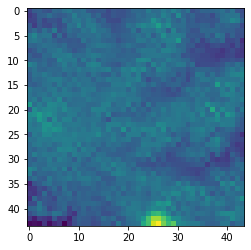

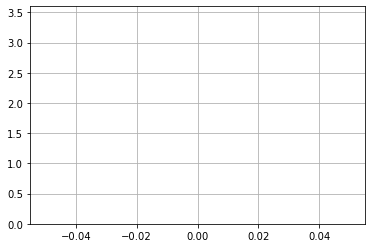

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 1] losses: (20.963681511878967, nan)


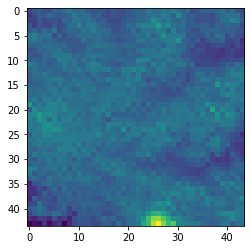

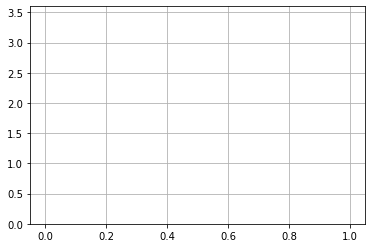

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 2] losses: (18.83202160358429, nan)


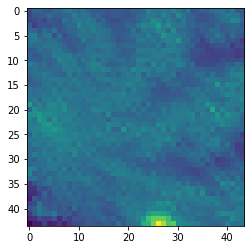

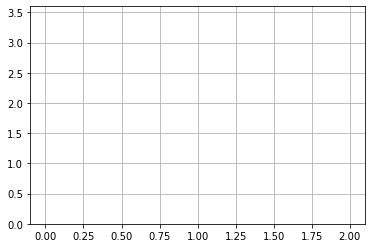

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 3] losses: (16.78078556537628, nan)


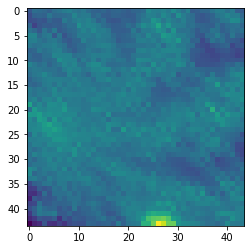

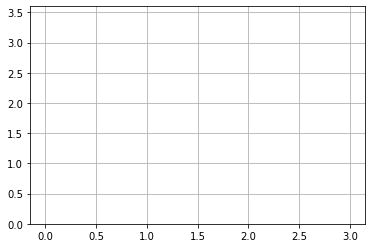

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 4] losses: (14.608134422302246, nan)


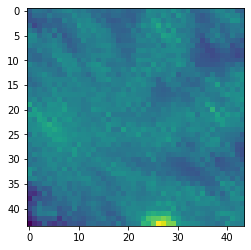

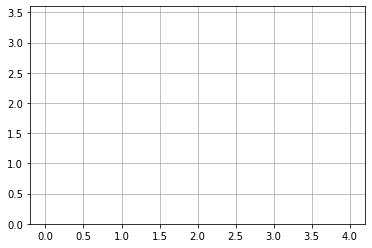

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 5] losses: (12.64939826488495, nan)


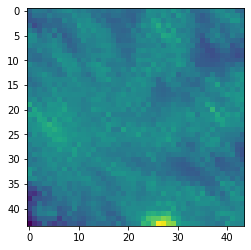

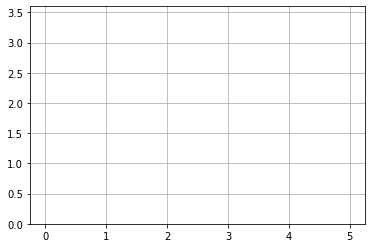

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 6] losses: (11.006010797023773, nan)


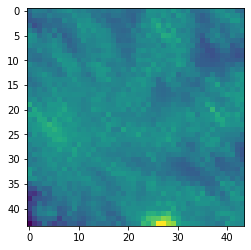

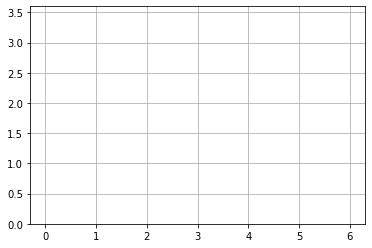

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 7] losses: (9.83881660938263, nan)


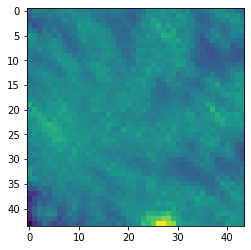

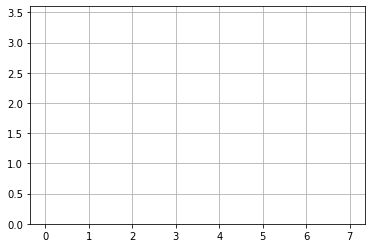

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 8] losses: (8.772733719348908, nan)


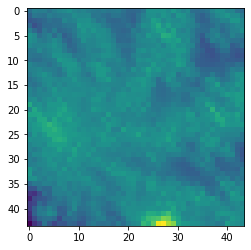

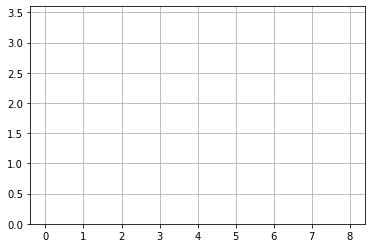

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 9] losses: (7.897913212776184, nan)


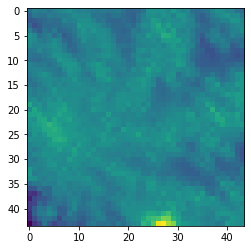

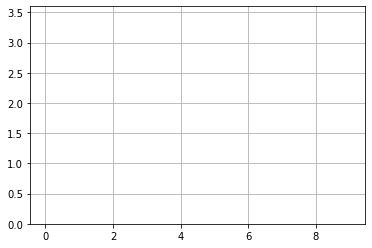

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 10] losses: (7.431455633640289, nan)


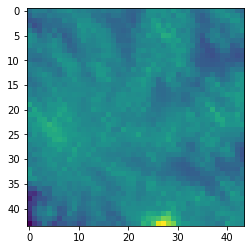

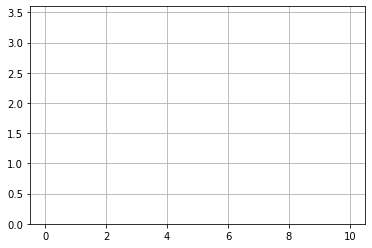

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 11] losses: (7.038811869621277, nan)


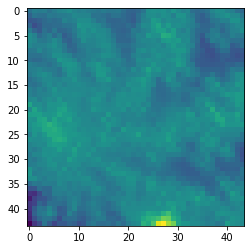

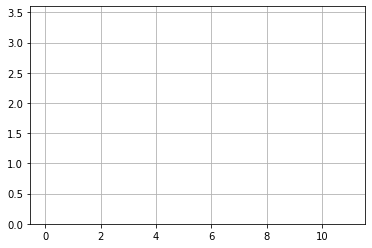

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 12] losses: (6.672971222400665, nan)


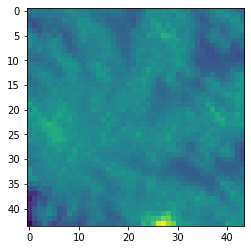

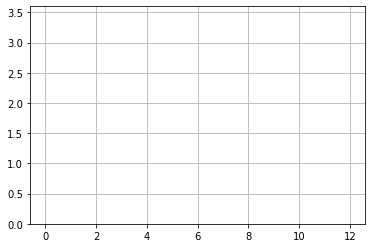

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 13] losses: (6.6113731777668, nan)


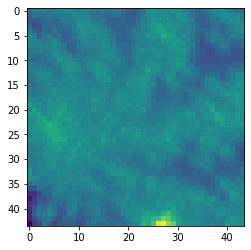

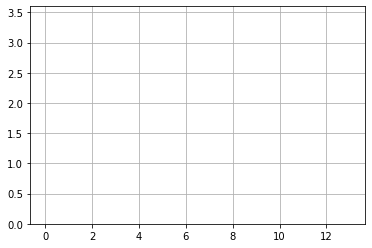

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 14] losses: (6.4287693047523495, nan)


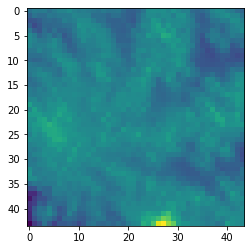

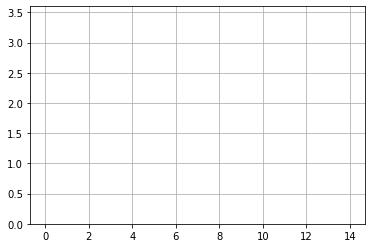

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 15] losses: (6.1000614631176, nan)


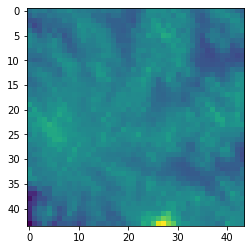

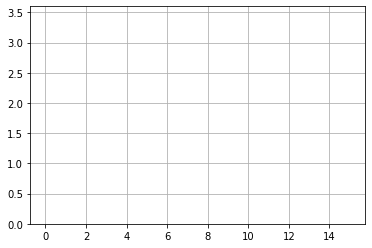

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 16] losses: (6.1766222441196446, nan)


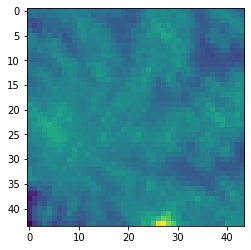

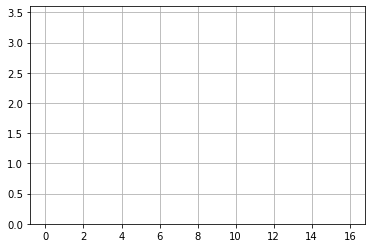

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 17] losses: (5.998651942014694, nan)


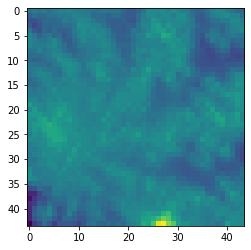

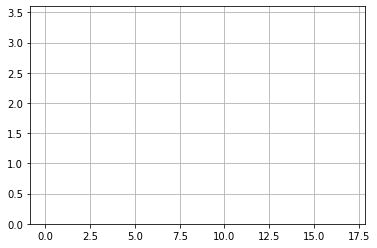

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 18] losses: (5.847338000535965, nan)


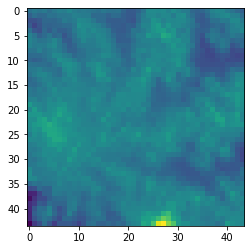

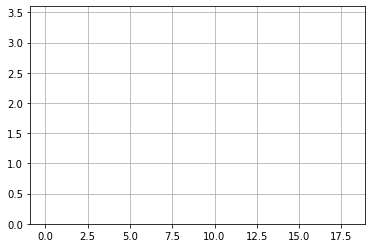

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 19] losses: (5.714140075445175, nan)


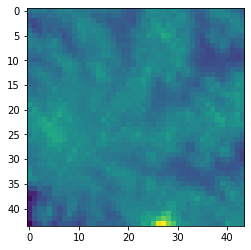

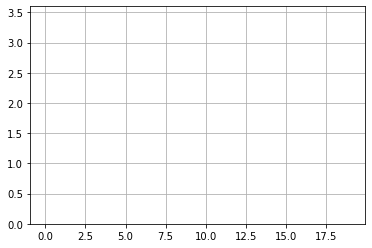

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 20] losses: (5.643717963695526, nan)


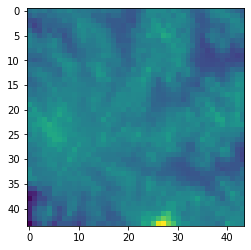

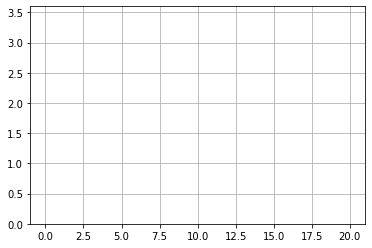

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 21] losses: (5.584317744970321, nan)


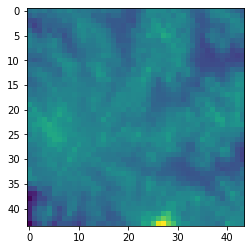

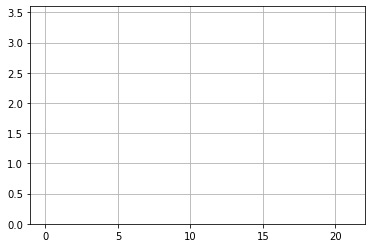

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 22] losses: (5.479644684791565, nan)


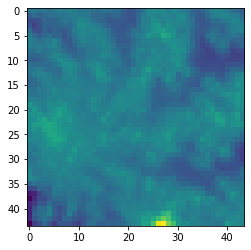

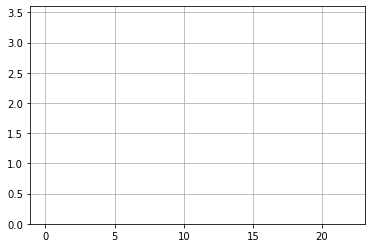

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 23] losses: (5.37019029378891, nan)


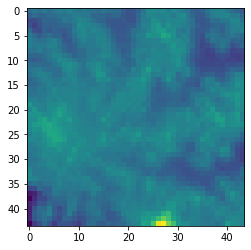

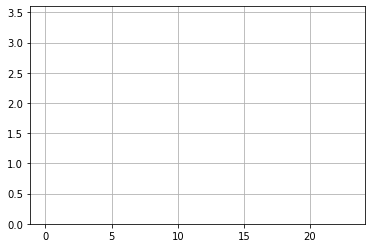

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 24] losses: (5.352726261615754, nan)


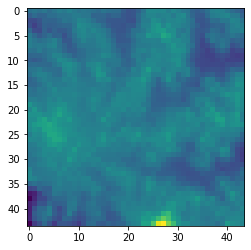

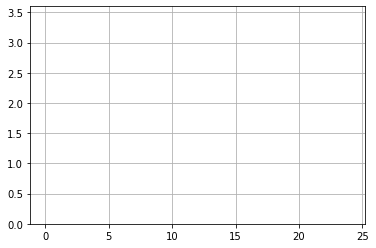

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 25] losses: (5.312709332704544, nan)


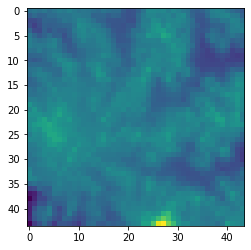

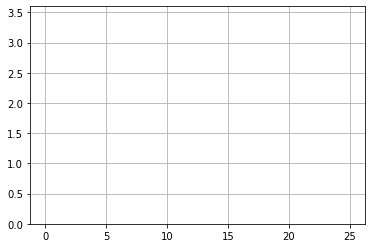

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 26] losses: (5.174758943319321, nan)


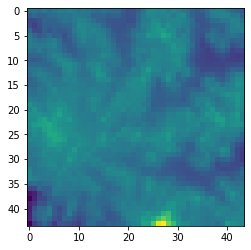

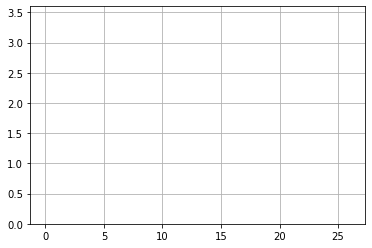

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 27] losses: (5.162248852252961, nan)


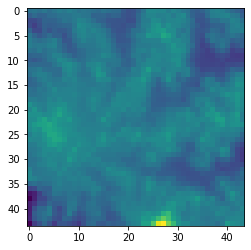

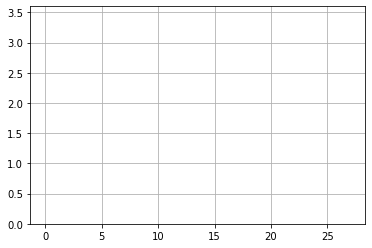

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 28] losses: (5.070781337022781, nan)


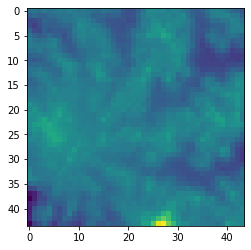

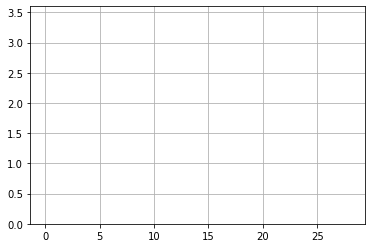

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 29] losses: (5.052206493616104, nan)


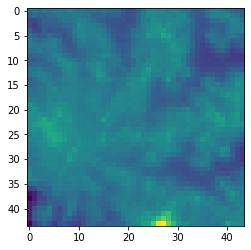

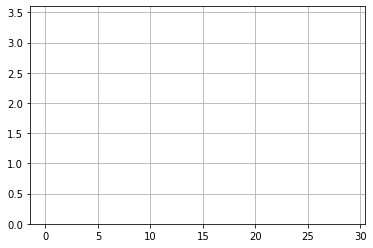

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 30] losses: (5.072976306676865, nan)


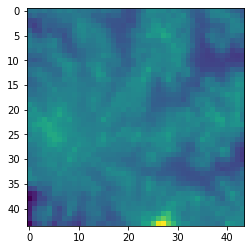

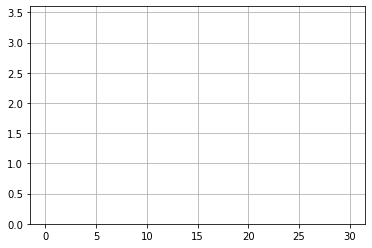

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 31] losses: (5.019029326438904, nan)


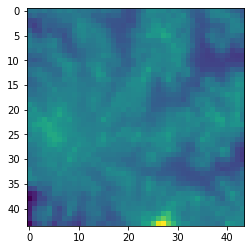

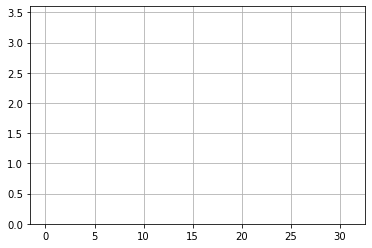

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 32] losses: (4.859048454761505, nan)


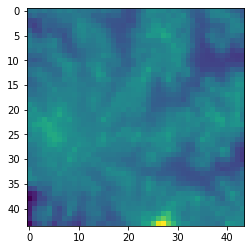

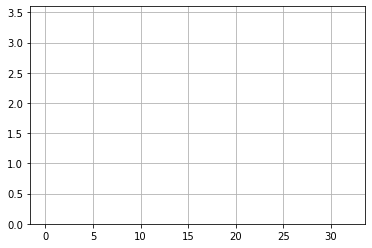

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 33] losses: (4.921007310152054, nan)


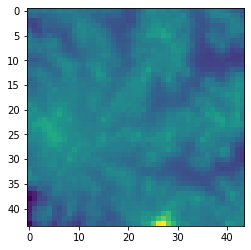

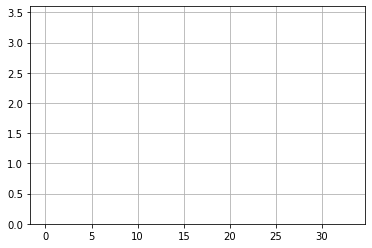

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 34] losses: (4.834399472475052, nan)


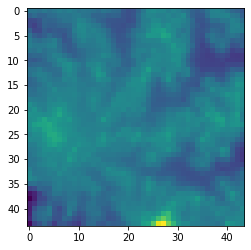

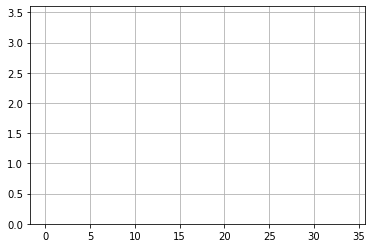

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 35] losses: (4.9115021276474, nan)


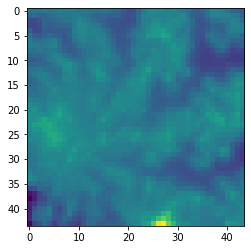

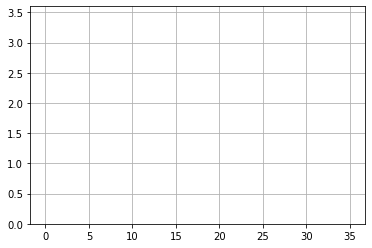

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 36] losses: (4.861509320735931, nan)


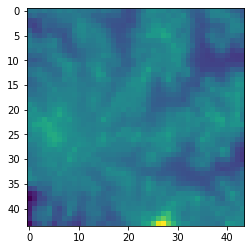

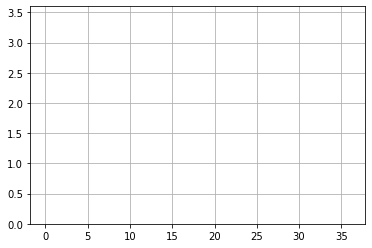

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 37] losses: (4.727416123151779, nan)


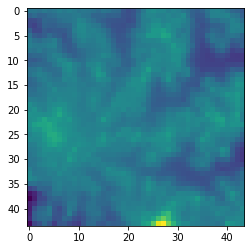

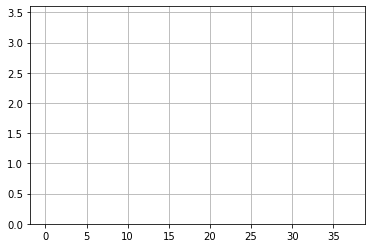

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 38] losses: (4.871275395154953, nan)


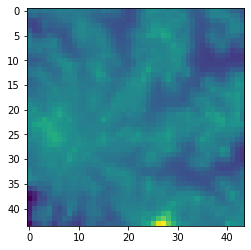

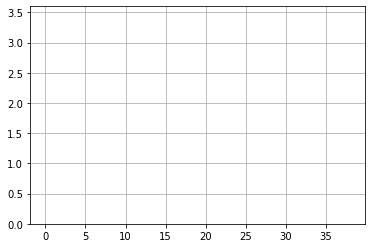

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 39] losses: (4.821124724149704, nan)


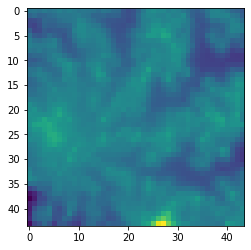

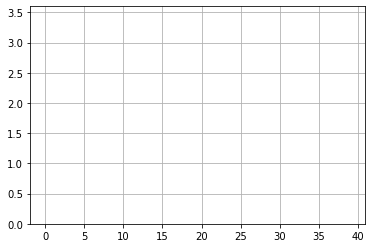

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 40] losses: (4.706878054141998, nan)


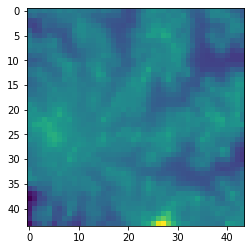

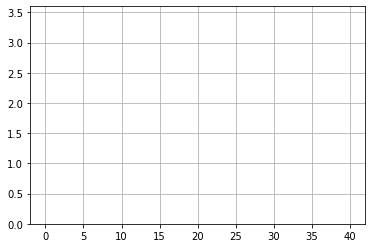

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 41] losses: (4.754388035535812, nan)


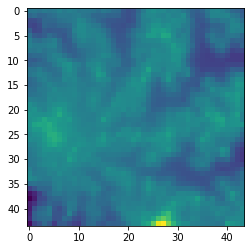

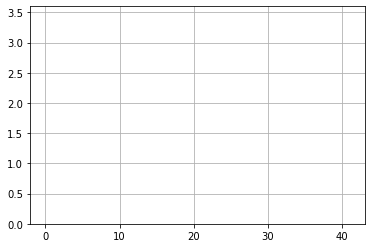

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 42] losses: (4.715839166641235, nan)


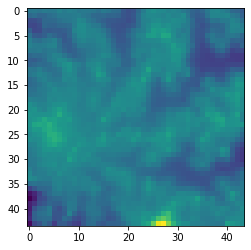

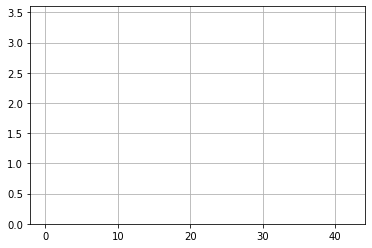

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 43] losses: (4.707181181907654, nan)


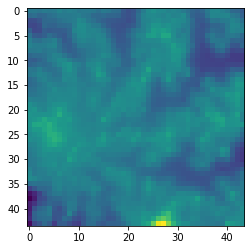

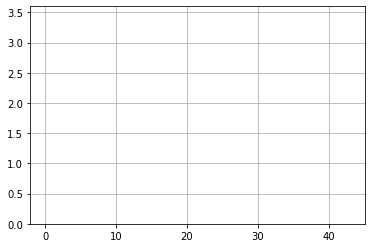

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 44] losses: (4.598145884275437, nan)


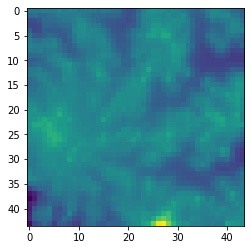

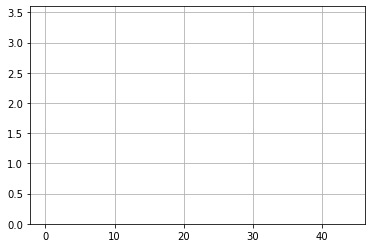

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 45] losses: (4.626093702316284, nan)


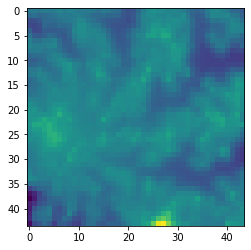

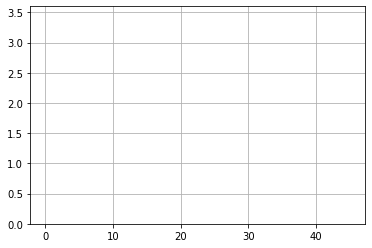

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 46] losses: (4.647545838356018, nan)


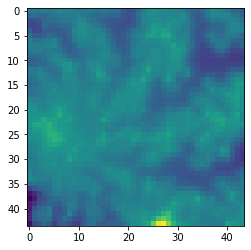

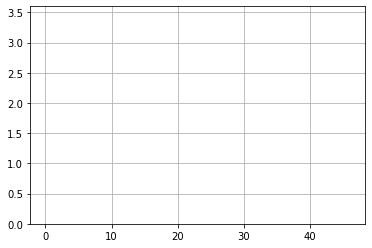

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 47] losses: (4.603291455507279, nan)


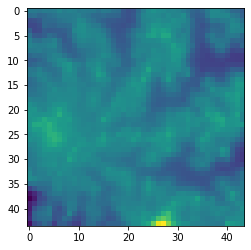

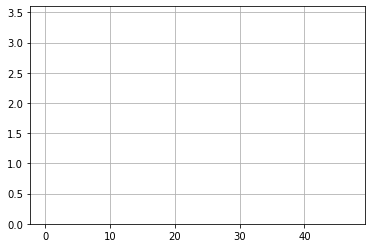

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 48] losses: (4.560007362365723, nan)


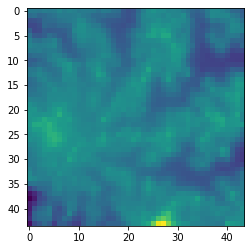

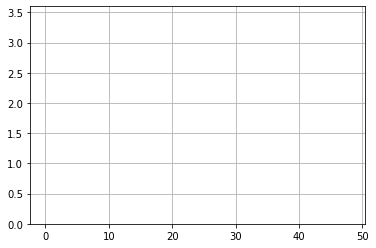

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 49] losses: (4.566814638376236, nan)


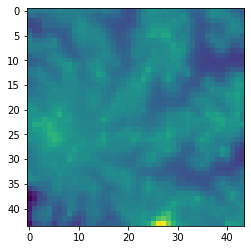

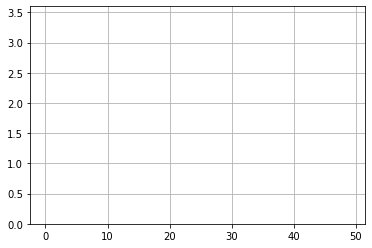

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 50] losses: (4.5721391379833225, nan)


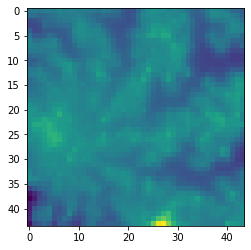

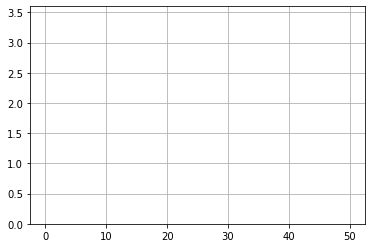

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 51] losses: (4.551439366340637, nan)


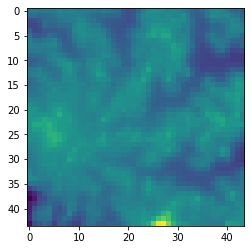

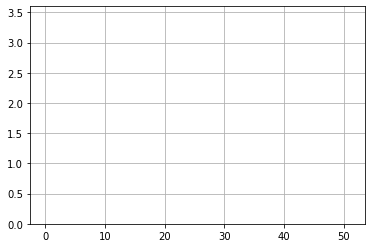

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 52] losses: (4.535708130598068, nan)


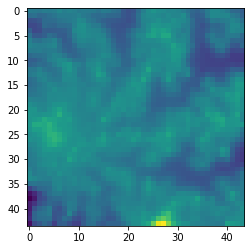

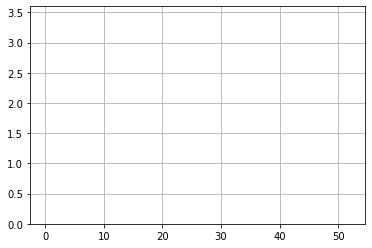

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 53] losses: (4.616159354448318, nan)


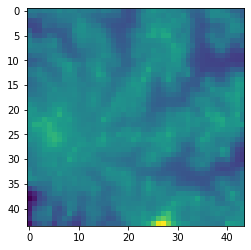

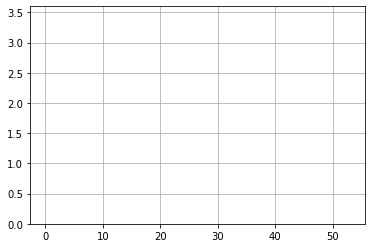

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 54] losses: (4.5491435182094575, nan)


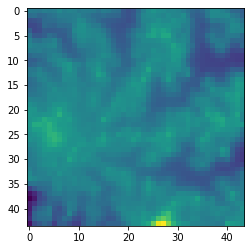

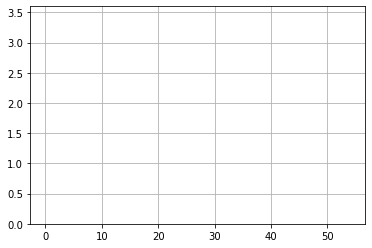

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 55] losses: (4.507070013284683, nan)


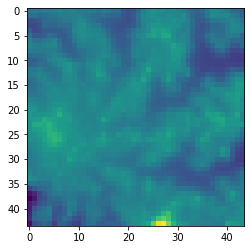

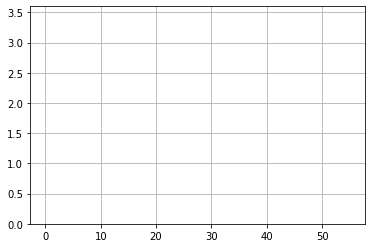

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 56] losses: (4.490963567495346, nan)


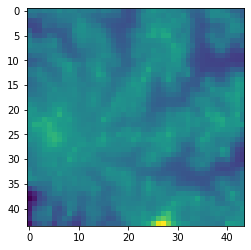

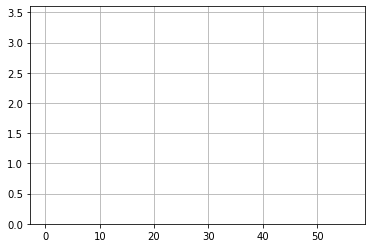

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 57] losses: (4.551574614048004, nan)


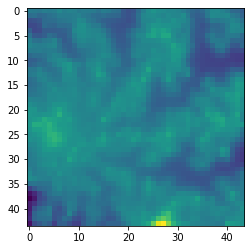

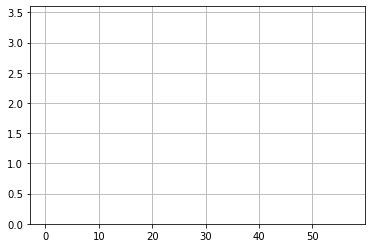

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 58] losses: (4.430071933269501, nan)


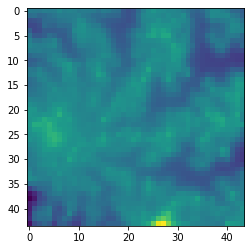

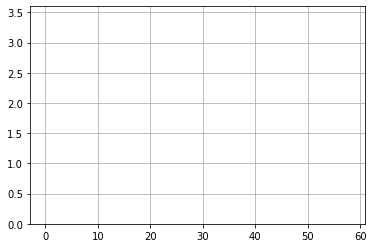

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 59] losses: (4.587112001180649, nan)


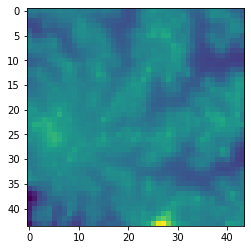

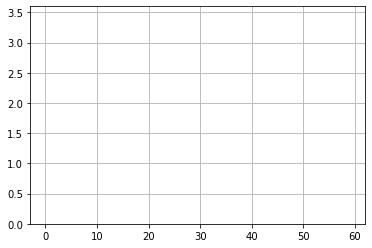

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 60] losses: (4.4921232914924625, nan)


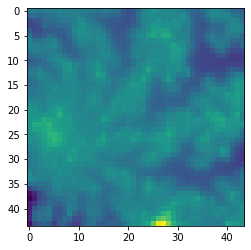

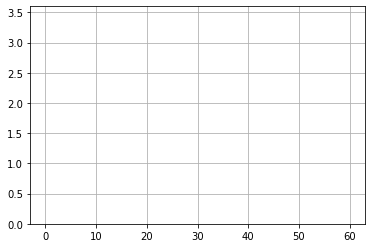

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 61] losses: (4.576573693752289, nan)


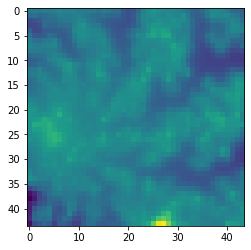

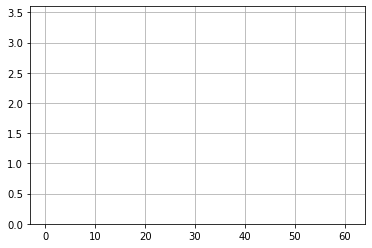

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 62] losses: (4.407730096578598, nan)


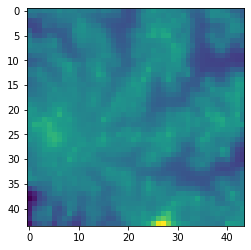

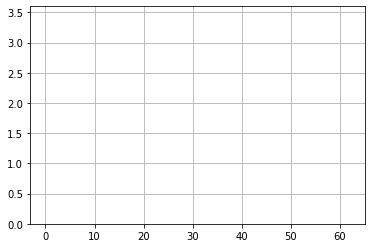

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 63] losses: (4.498860577344894, nan)


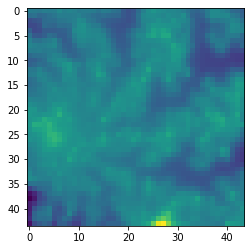

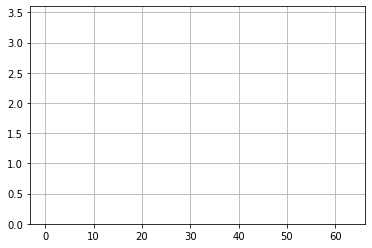

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 64] losses: (4.475268312692642, nan)


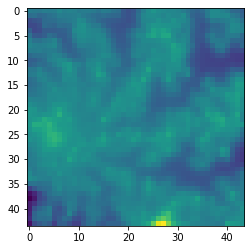

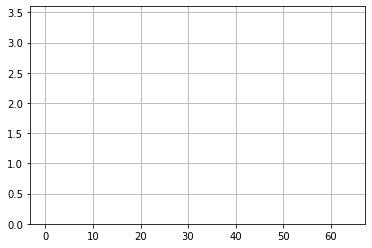

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 65] losses: (4.522762002944947, nan)


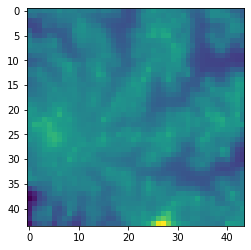

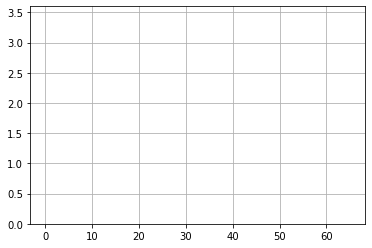

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 66] losses: (4.538133343458176, nan)


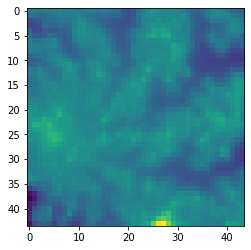

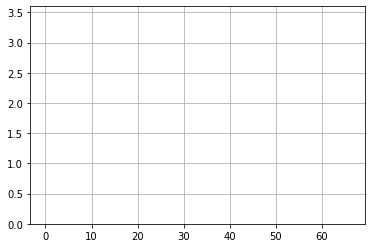

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 67] losses: (4.467736290693283, nan)


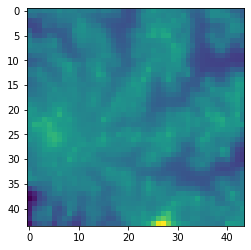

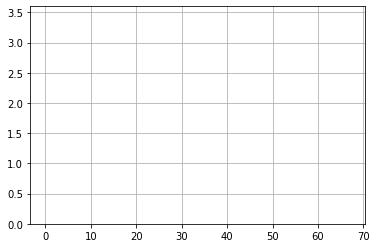

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 68] losses: (4.4666092073917385, nan)


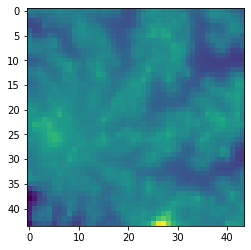

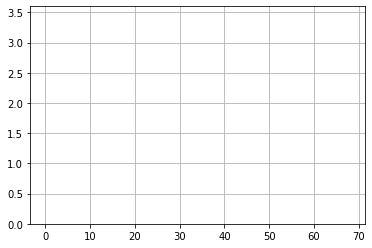

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 69] losses: (4.444150197505951, nan)


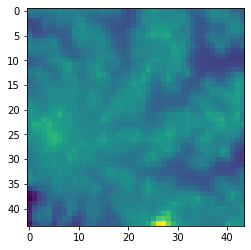

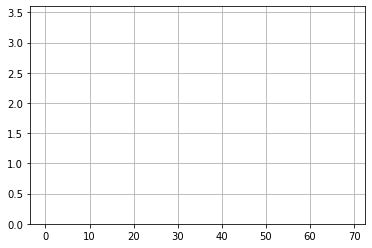

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 70] losses: (4.46625911951065, nan)


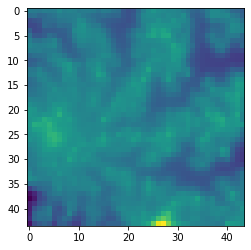

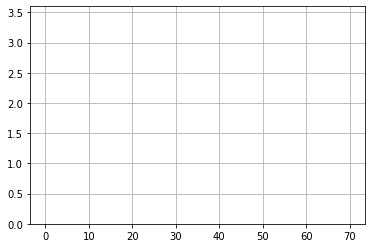

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 71] losses: (4.491455334424972, nan)


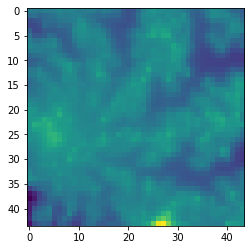

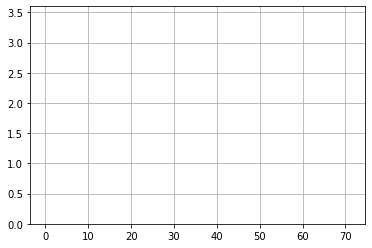

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 72] losses: (4.422694318294525, nan)


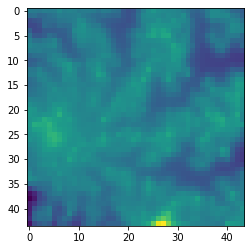

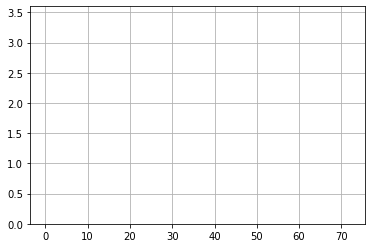

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 73] losses: (4.435395621061325, nan)


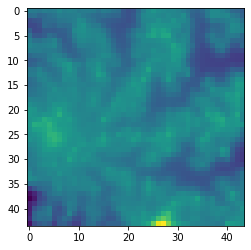

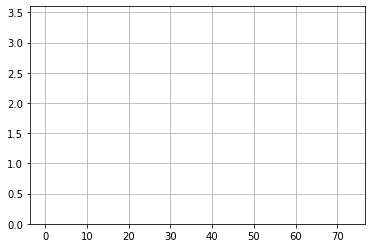

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 74] losses: (4.483068165779113, nan)


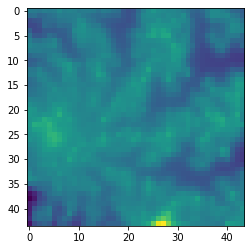

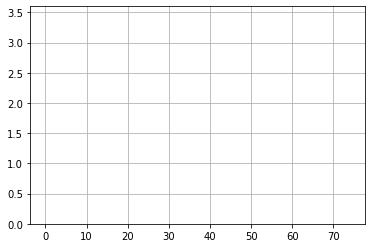

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 75] losses: (4.460939073562622, nan)


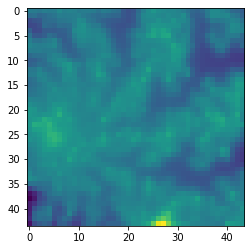

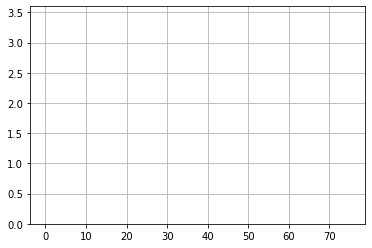

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 76] losses: (4.424833242893219, nan)


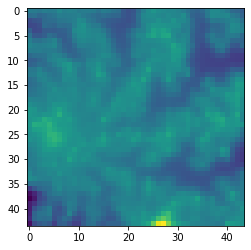

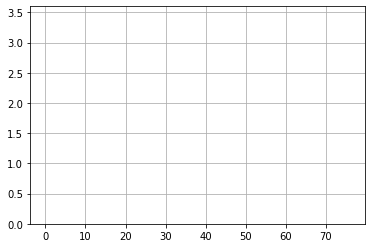

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 77] losses: (4.458467973470688, nan)


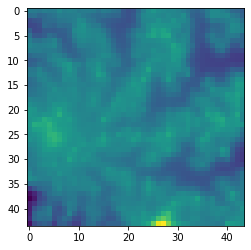

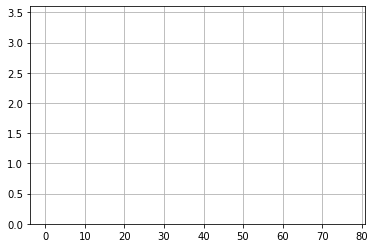

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 78] losses: (4.421659396886826, nan)


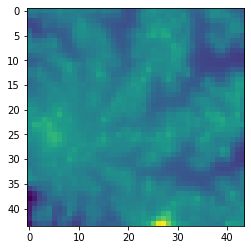

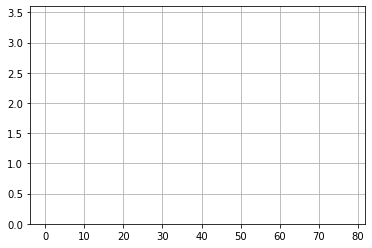

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 79] losses: (4.485280431509018, nan)


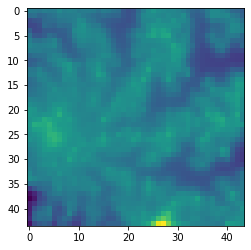

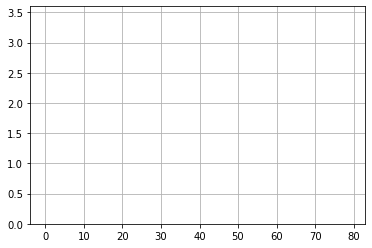

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 80] losses: (4.437033591270446, nan)


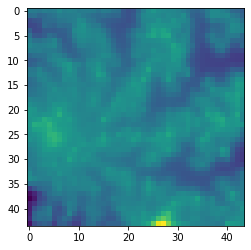

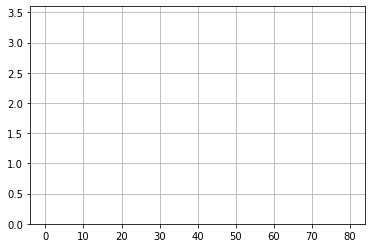

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 81] losses: (4.481507309675217, nan)


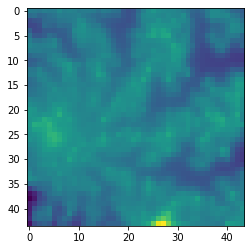

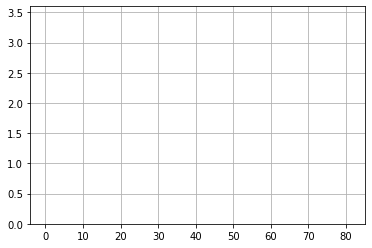

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 82] losses: (4.424537117481232, nan)


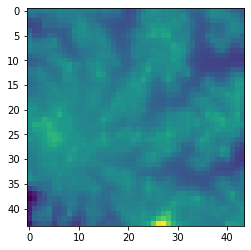

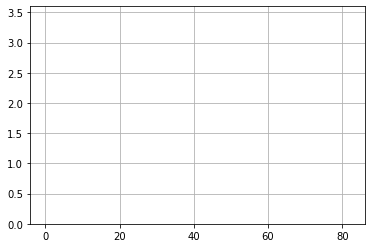

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 83] losses: (4.428541804552078, nan)


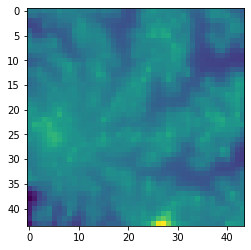

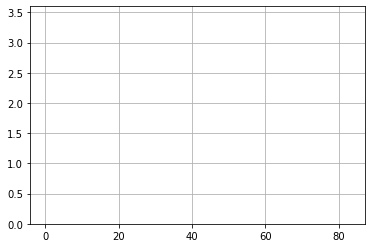

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 84] losses: (4.422570328712464, nan)


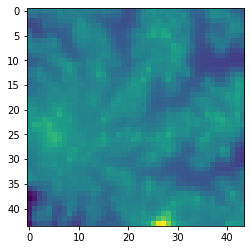

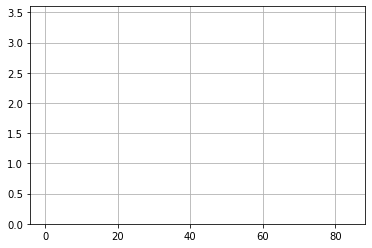

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 85] losses: (4.425233370065689, nan)


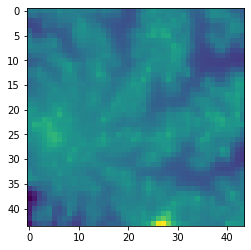

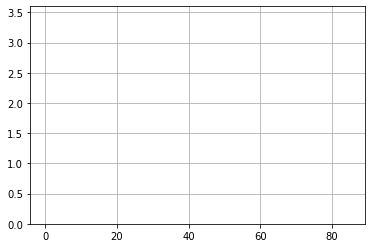

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 86] losses: (4.493693091869354, nan)


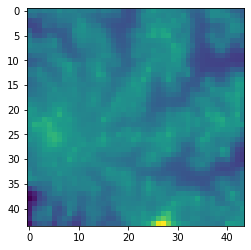

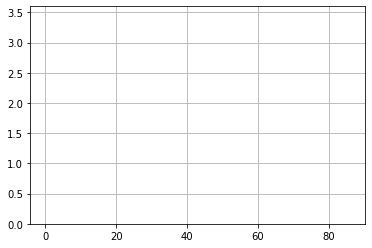

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 87] losses: (4.4142726302146915, nan)


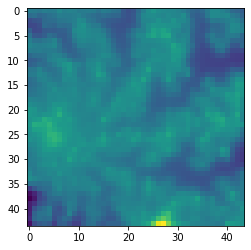

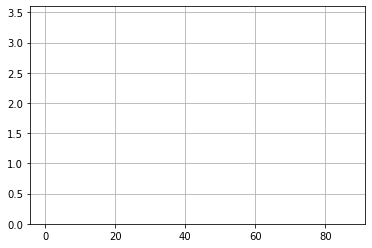

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 88] losses: (4.4437661504745485, nan)


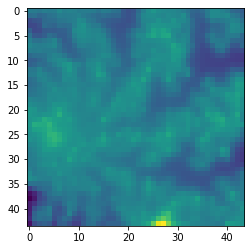

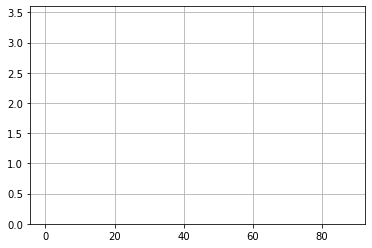

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 89] losses: (4.448832011222839, nan)


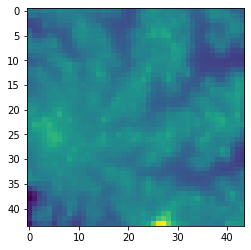

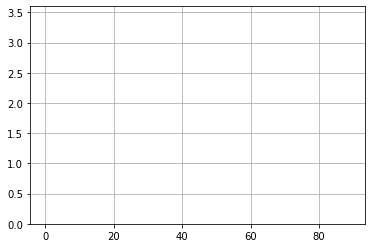

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 90] losses: (4.380986567735672, nan)


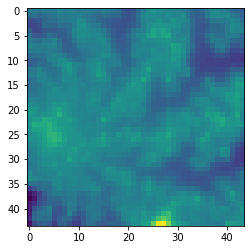

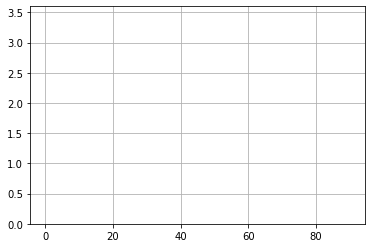

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 91] losses: (4.441063070297242, nan)


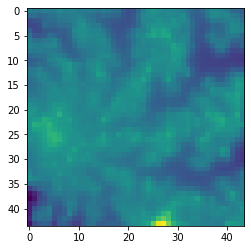

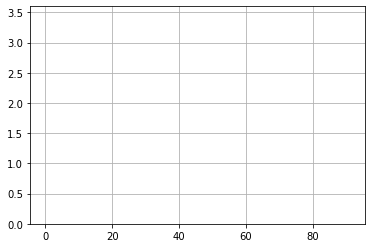

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 92] losses: (4.466941256523132, nan)


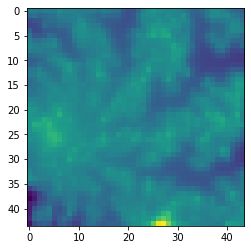

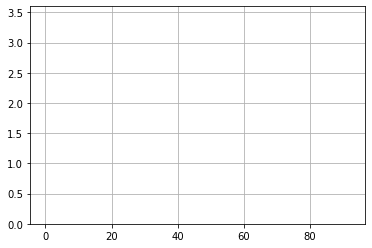

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 93] losses: (4.39142196893692, nan)


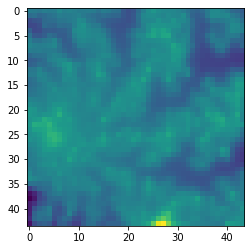

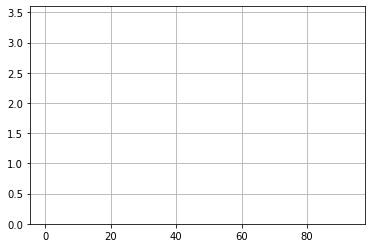

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 94] losses: (4.429340300559997, nan)


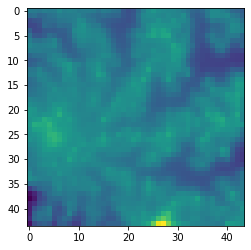

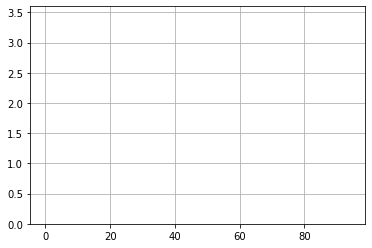

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 95] losses: (4.458465547561645, nan)


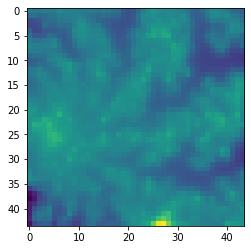

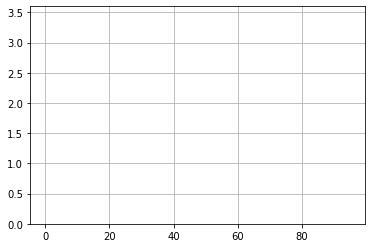

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 96] losses: (4.407342699766159, nan)


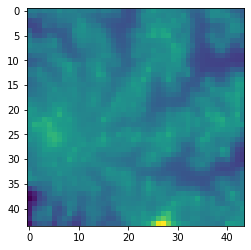

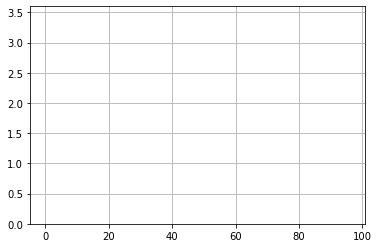

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 97] losses: (4.474200713634491, nan)


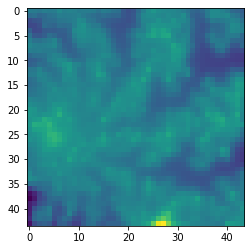

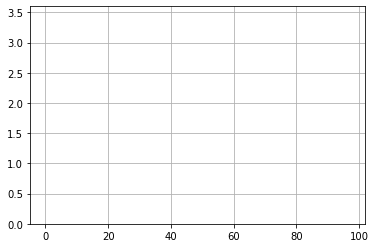

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 98] losses: (4.367607328891754, nan)


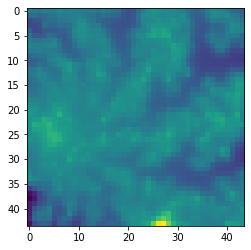

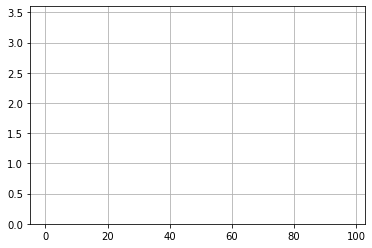

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 99] losses: (4.484259691238403, nan)


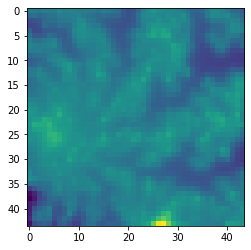

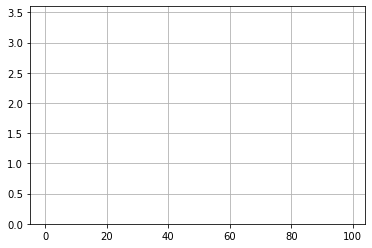

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 100] losses: (4.409988969564438, nan)


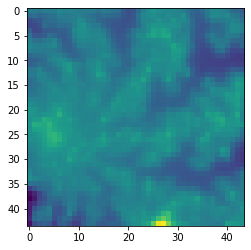

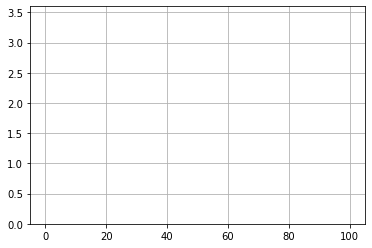

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 101] losses: (4.4540367650985715, nan)


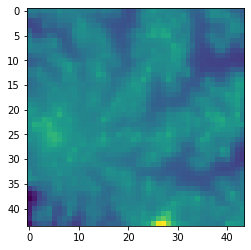

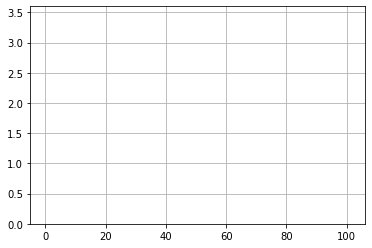

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 102] losses: (4.343063209056854, nan)


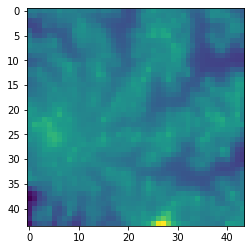

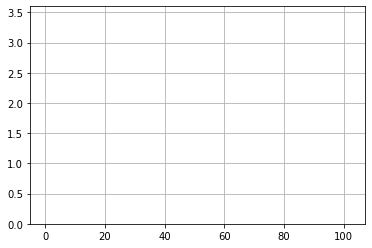

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 103] losses: (4.444337126016617, nan)


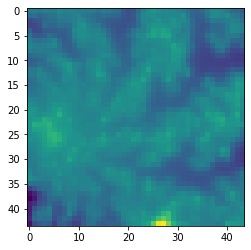

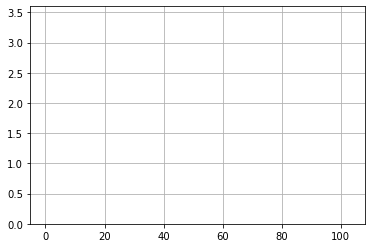

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 104] losses: (4.417908780574798, nan)


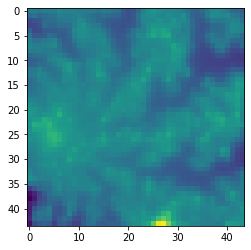

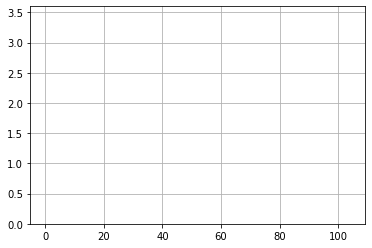

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 105] losses: (4.400229038000107, nan)


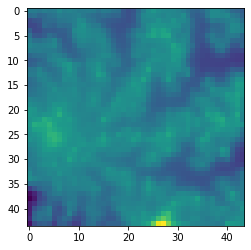

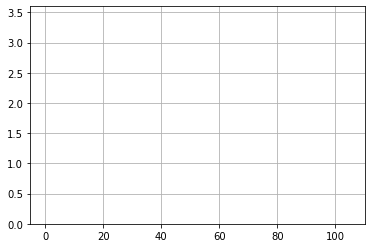

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 106] losses: (4.409662487506867, nan)


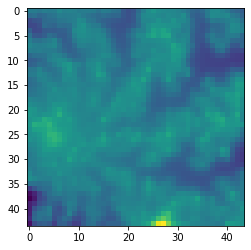

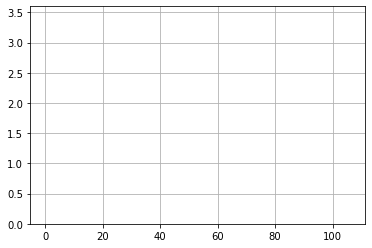

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 107] losses: (4.397891407012939, nan)


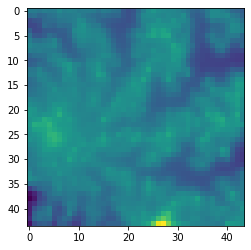

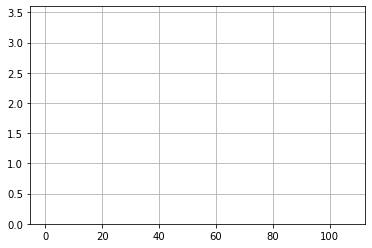

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 108] losses: (4.460398238897324, nan)


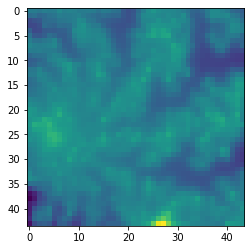

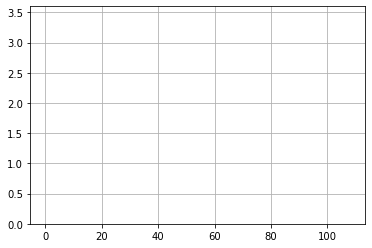

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 109] losses: (4.411169271469117, nan)


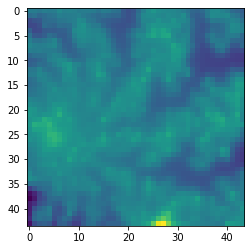

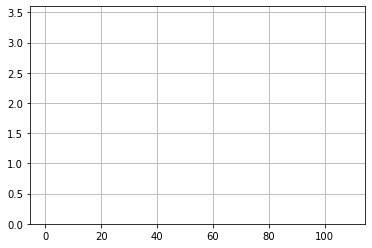

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 110] losses: (4.4407106566429135, nan)


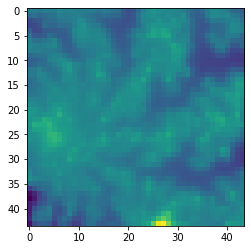

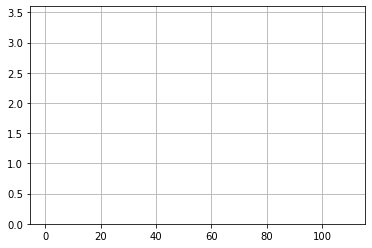

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 111] losses: (4.379594492912292, nan)


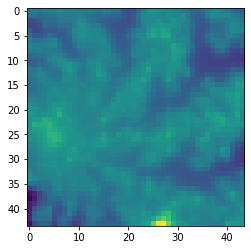

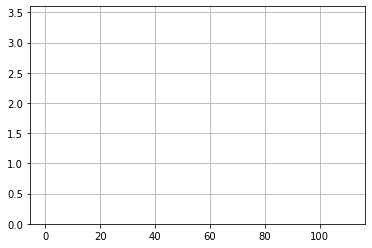

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 112] losses: (4.441553423404693, nan)


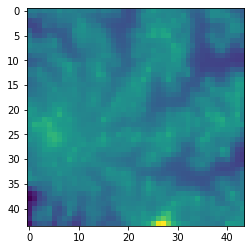

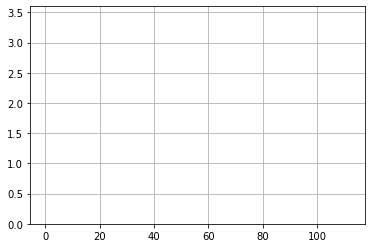

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 113] losses: (4.421882816553116, nan)


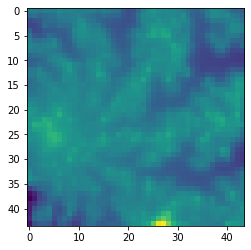

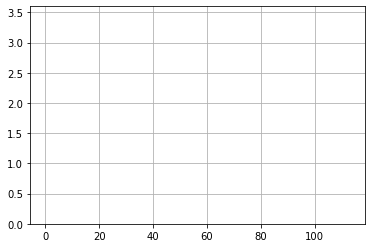

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 114] losses: (4.3879513013362885, nan)


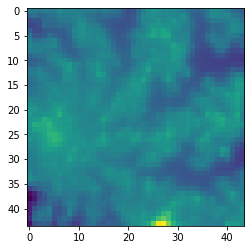

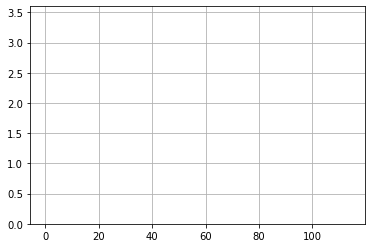

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 115] losses: (4.423006191253662, nan)


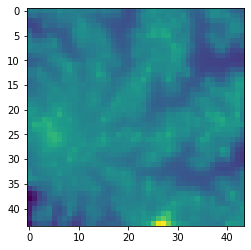

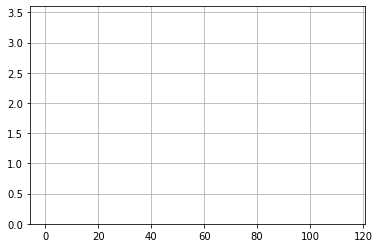

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 116] losses: (4.441890717744827, nan)


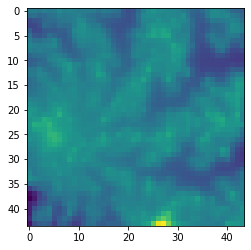

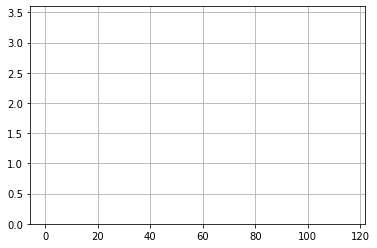

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 117] losses: (4.370834407806396, nan)


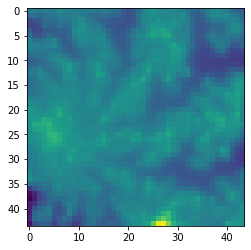

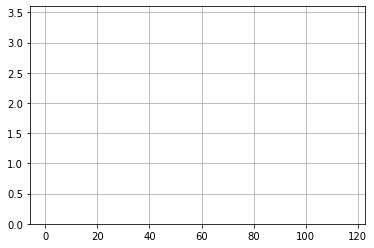

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 118] losses: (4.326930236816406, nan)


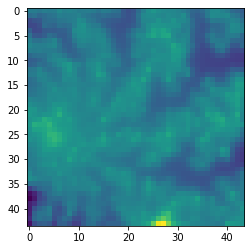

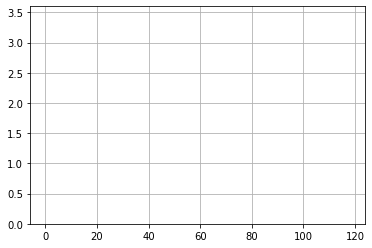

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 119] losses: (4.452303035259247, nan)


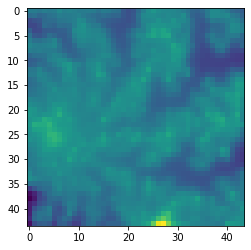

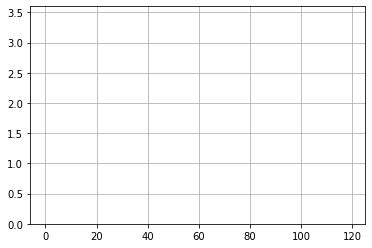

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 120] losses: (4.393311686515808, nan)


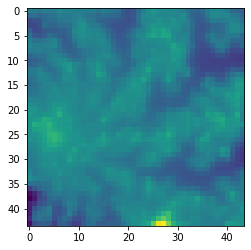

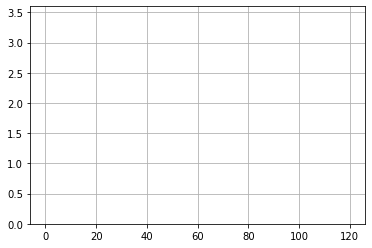

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 121] losses: (4.441003657579422, nan)


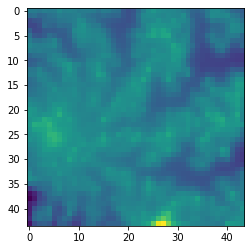

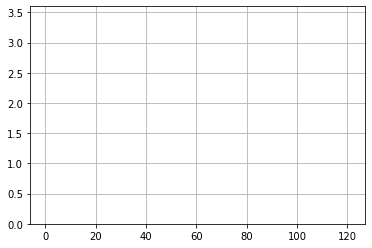

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 122] losses: (4.3843477499485015, nan)


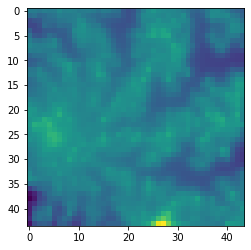

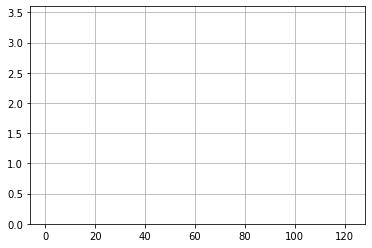

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 123] losses: (4.470771198272705, nan)


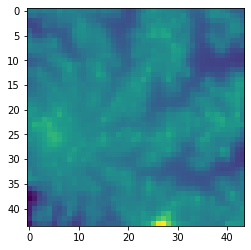

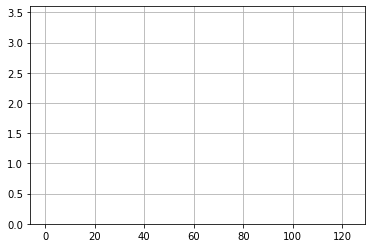

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 124] losses: (4.415456647872925, nan)


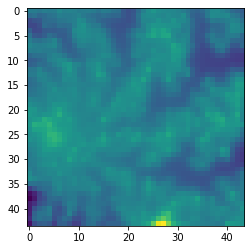

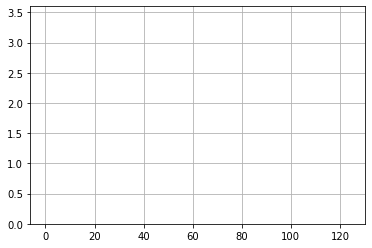

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 125] losses: (4.389533535242081, nan)


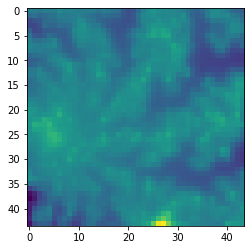

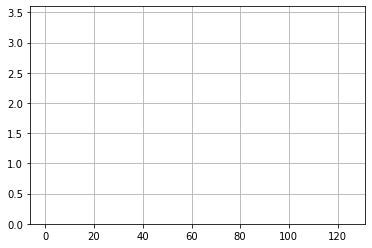

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 126] losses: (4.363329856395722, nan)


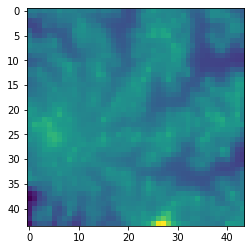

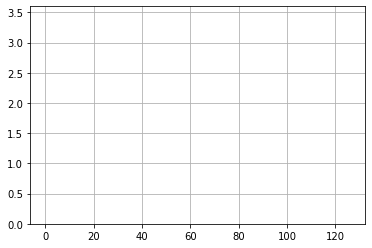

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 127] losses: (4.421805005073548, nan)


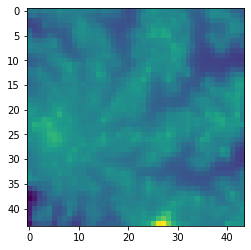

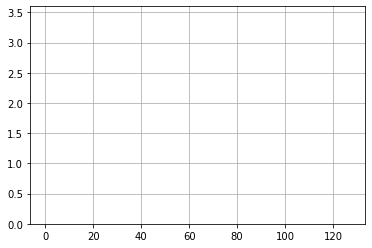

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 128] losses: (4.35969061255455, nan)


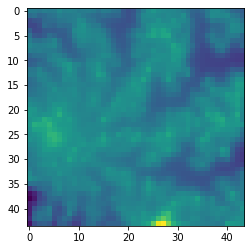

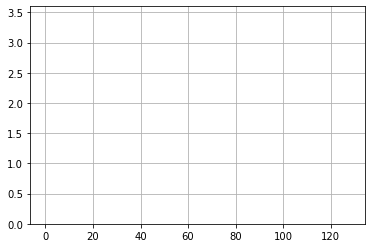

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 129] losses: (4.399004751443863, nan)


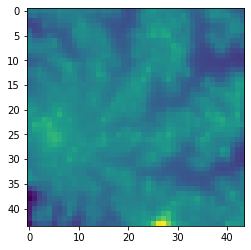

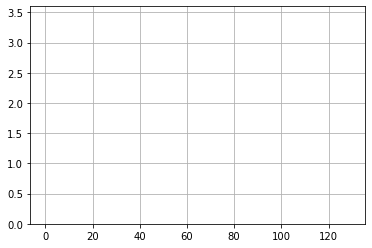

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 130] losses: (4.478152400255203, nan)


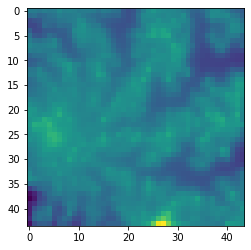

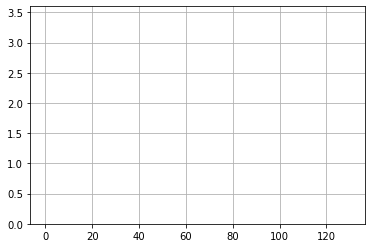

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 131] losses: (4.360419874191284, nan)


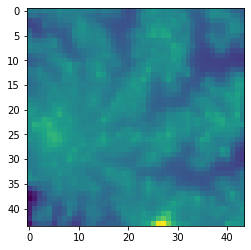

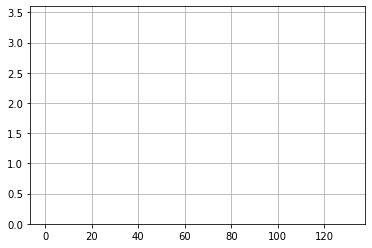

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 132] losses: (4.42716691493988, nan)


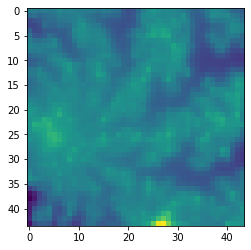

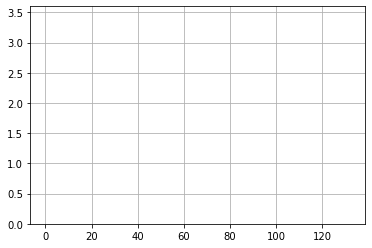

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 133] losses: (4.3525201666355136, nan)


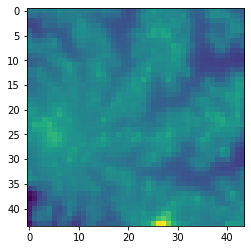

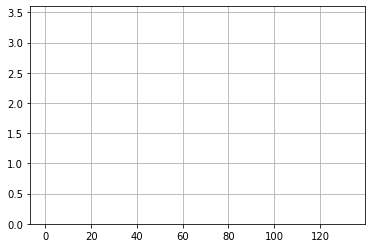

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 134] losses: (4.48672366976738, nan)


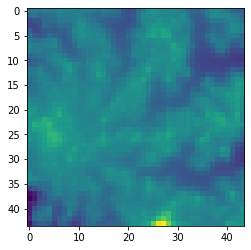

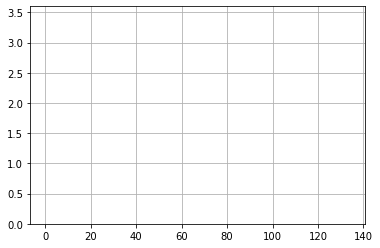

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 135] losses: (4.350966347455978, nan)


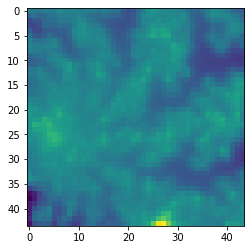

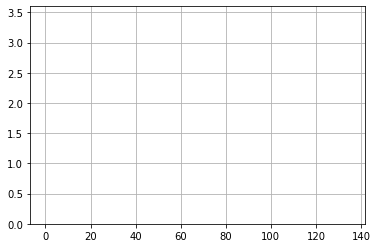

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 136] losses: (4.393172070980072, nan)


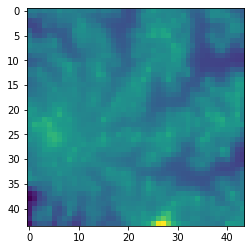

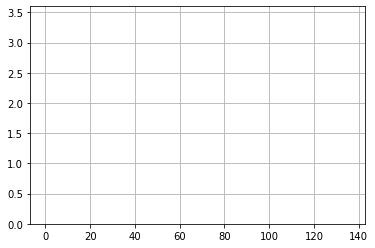

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 137] losses: (4.431745235919952, nan)


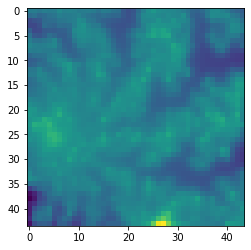

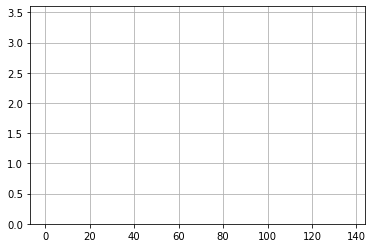

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 138] losses: (4.3992057394981385, nan)


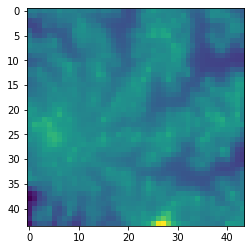

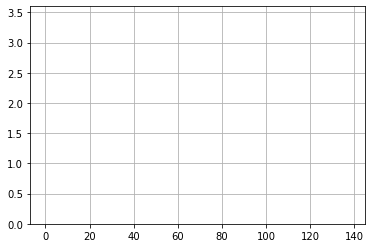

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 139] losses: (4.400660964250565, nan)


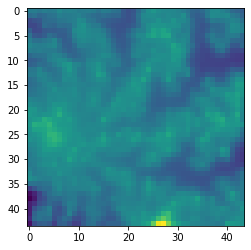

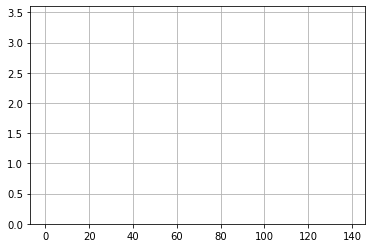

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 140] losses: (4.35001691699028, nan)


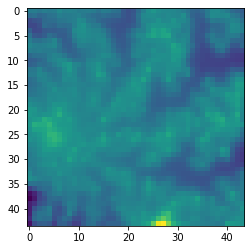

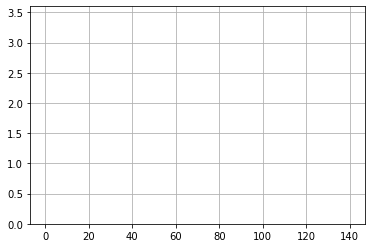

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 141] losses: (4.407851195335388, nan)


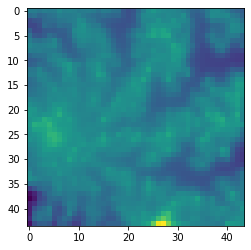

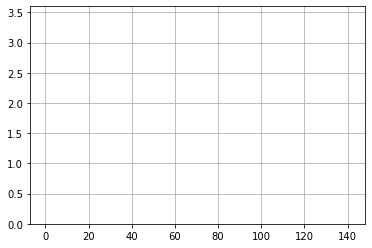

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 142] losses: (4.351711655855179, nan)


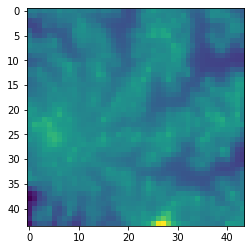

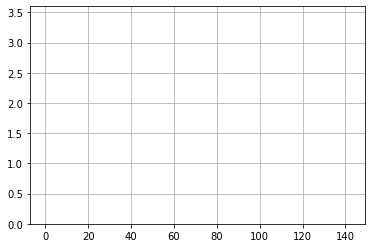

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 143] losses: (4.4285638451576235, nan)


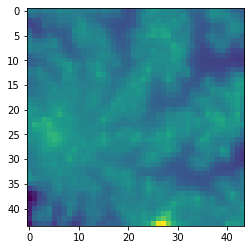

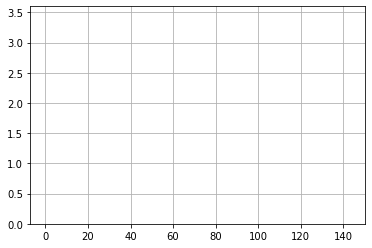

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 144] losses: (4.381504609584808, nan)


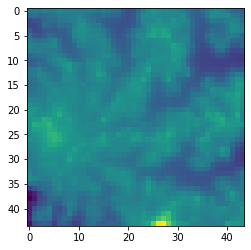

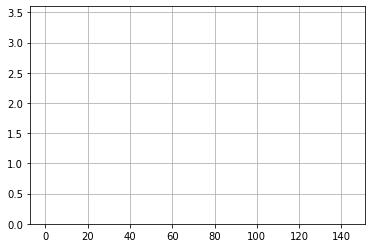

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 145] losses: (4.32426566362381, nan)


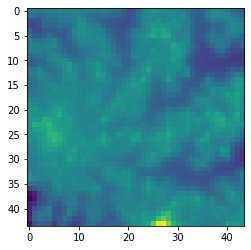

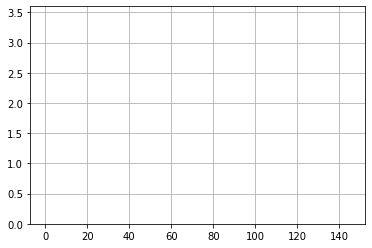

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 146] losses: (4.504968960285186, nan)


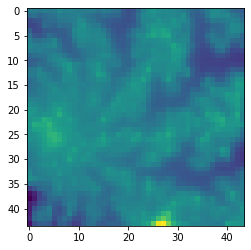

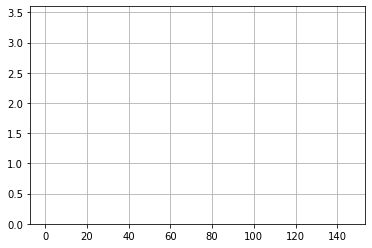

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 147] losses: (4.356119667291641, nan)


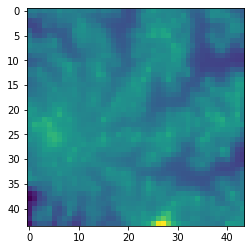

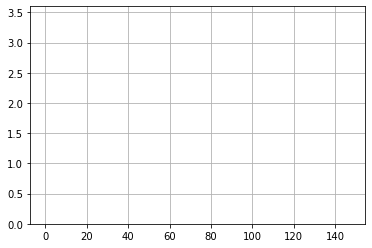

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 148] losses: (4.40347617149353, nan)


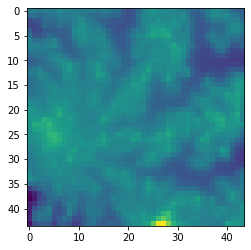

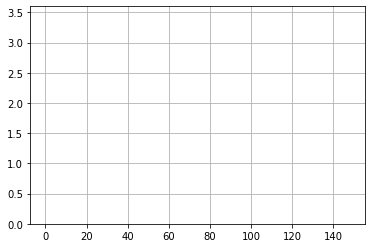

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 149] losses: (4.397647259235382, nan)


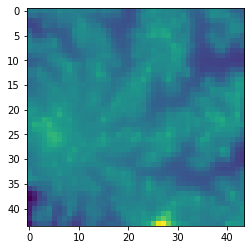

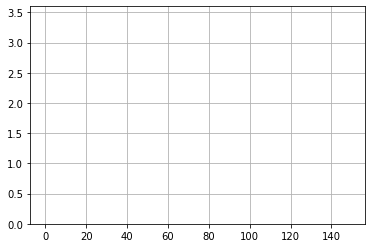

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 150] losses: (4.378827291727066, nan)


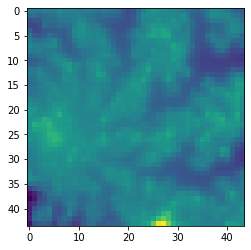

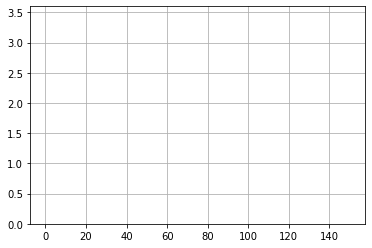

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 151] losses: (4.439323660135269, nan)


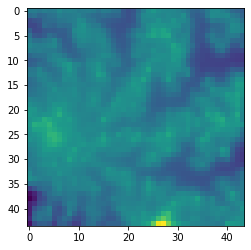

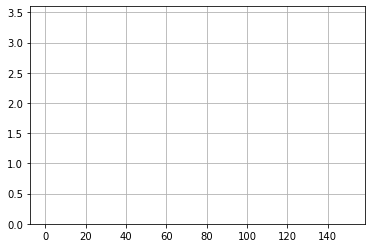

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 152] losses: (4.387973439693451, nan)


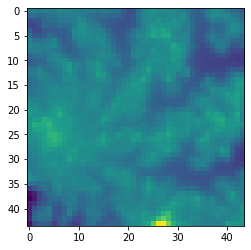

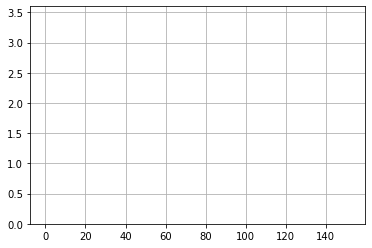

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 153] losses: (4.296807308197021, nan)


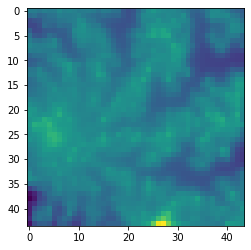

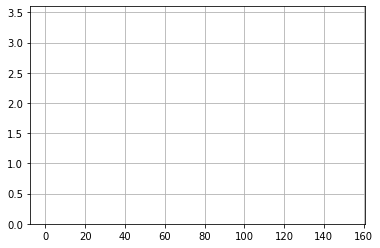

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 154] losses: (4.470277485847473, nan)


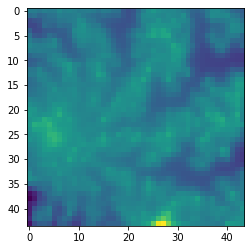

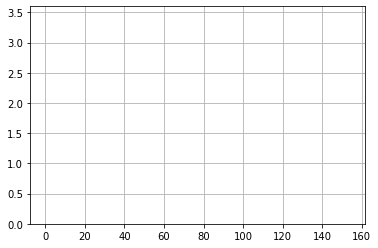

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 155] losses: (4.398975578546524, nan)


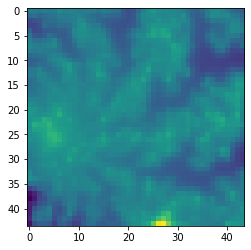

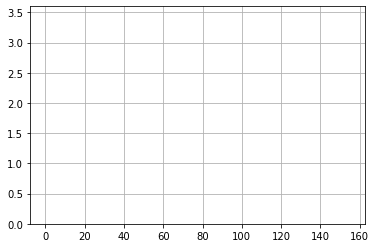

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 156] losses: (4.435457987785339, nan)


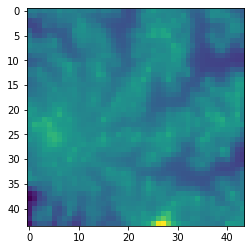

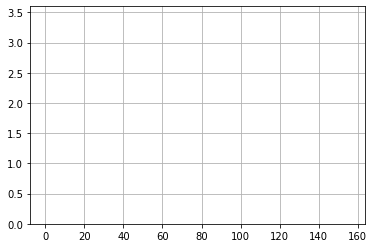

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 157] losses: (4.369178631305695, nan)


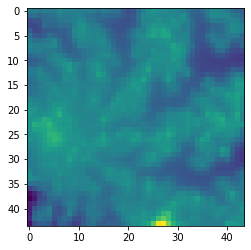

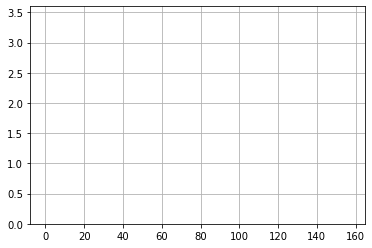

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 158] losses: (4.454071140289306, nan)


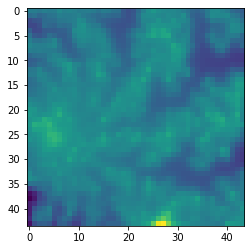

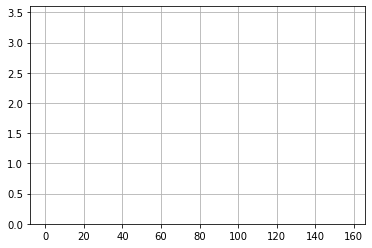

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 159] losses: (4.33455445766449, nan)


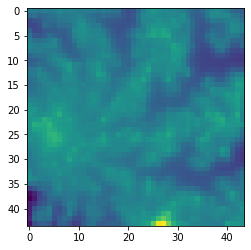

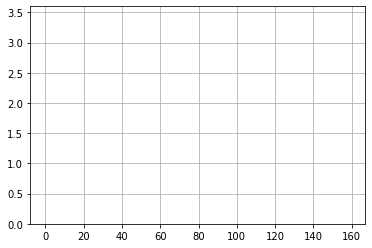

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 160] losses: (4.402253804206848, nan)


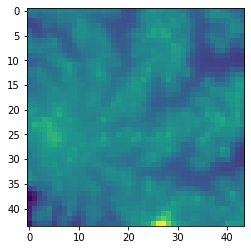

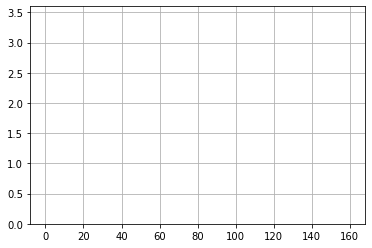

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 161] losses: (4.385931307077408, nan)


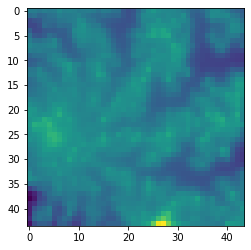

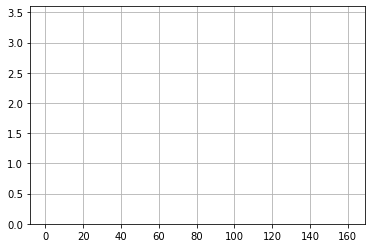

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 162] losses: (4.451343908309936, nan)


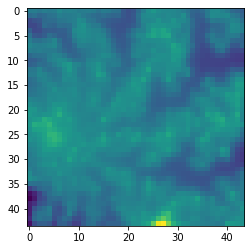

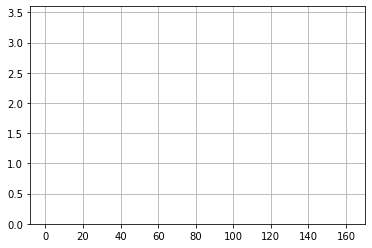

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 163] losses: (4.288820561170578, nan)


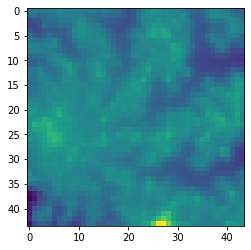

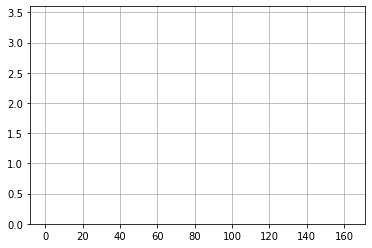

  0%|          | 0/200 [00:00<?, ?it/s]

In [ ]:
bnum = 15
train_gen, train_steps = getbatchgen(range(train_num), getimages, batchsize=bnum)
optimizer = torch.optim.Adam(lr=1e-4, betas=(0.9, 0.999), params=net.parameters())
#doptimizer = torch.optim.Adam(lr=1e-4, betas=(0.9, 0.999), params=disc.parameters())
rdp, rdt = 0, 0  # running losses of disc(p) and disc(t)

for epoch in range(net.epoch, 2000):  # loop over the dataset multiple times
    net.epoch = epoch

    running_loss1 = []
    running_loss2 = []
    for k in range(train_num//bnum):
        for _ in trange(200):
            # get the inputs; data is a list of [inputs, labels]
            LR, HR = next(train_gen)
            LR, HR = np2t(LR, HR)

            # forward
            SR = net(LR)
            
            # update network
            net.zero_grad()
            loss1, loss2, loss3, loss4 = lossfunction(SR, HR)
            loss = loss1 + loss2 + loss3 + loss4
            loss.backward()
            optimizer.step()

            # print statistics
            running_loss1 += [loss1.item()]
            #running_loss2 += [loss2.item()]
            
            if net.iters % 200 == 0:
                LR, HR = getimages_val(range(0, 500, 10))
                LR, HR = np2t(LR, HR)
                SR = net.eval(LR)
                loss1, loss2, loss3, loss4 = lossfunction(SR, HR)
                loss = loss1 + loss2 + loss3 + loss4
                net.trainloss.append(loss.item())
                net.valloss.append(loss.item())
            net.iters += 1
            
            # Gewichte untersuchen
            ##net.weights.append(t2np(net.convblocks1[2].weight[10, 10:20, 1, 1]))

        ### All kind of around-stuff ###
        print('[{}, {}] losses: {}'.format(epoch, k, (np.mean(running_loss1), np.mean(running_loss2))))
        #print(f'dt = {rdt: .03f}, dp = {rdp: .03f}')
        running_loss1 = []

        # Show fixed image (validation)
        LR, HR = getimages_val([ifixed])
        LR = torch.from_numpy(1*LR.astype('float32')).cuda()
        SR = net(LR)
        showimg(SR[0])
        plt.plot(net.valloss)
        plt.ylim((0,3.6))
        plt.grid()
        plt.show()

print('Finished Training')


In [97]:
indlist[train_num+ifixed]

5444

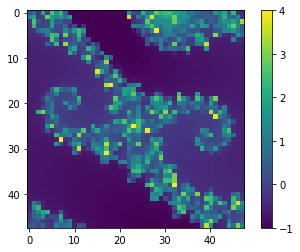

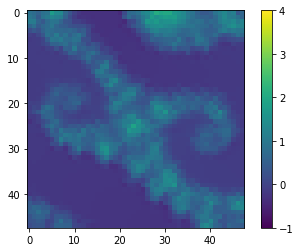

In [117]:
from mandel_algorithms import *

'Leichter Zoom'
mid = -0.5, 0.6 #0.625
width = 0.4

'Stärkerer Zoom'
mid = -0.743642, 0.13183
width = 0.000116


xarr = np.linspace(mid[0]-width/2, mid[0]+width/2, 48)
yarr = np.linspace(mid[1]-width/2, mid[1]+width/2, 48)
nmax = 1000

xarr, yarr = meshgrid(xarr, yarr)

mandel = mandelbrot(xarr, yarr, nmax)
mandel = np.log(mandel).T[::-1]
mandel = (mandel-mandel.mean())/mandel.std()

mandel = mandel[None,:,:,None]
LR = torch.from_numpy(mandel.astype('float32')).cuda()
SR = net(LR)
plt.imshow(t2np(LR[0]), vmin=-1, vmax=4.)
plt.colorbar()
plt.show()
plt.imshow(t2np(SR[0]), vmin=-1, vmax=4.)
plt.colorbar()

In [83]:

'Stärkerer Zoom'
mid = -0.743642, 0.13183
width = 0.000116
xarr = np.linspace(mid[0]-width/2, mid[0]+width/2, 400)
yarr = np.linspace(mid[1]-width/2, mid[1]+width/2, 400)
nmax = 1000

xarr, yarr = meshgrid(xarr, yarr)

mandel = mandelbrot(xarr, yarr, nmax)
mandel = np.log(mandel.T[::-1])
mandel = (mandel-mandel.mean())/mandel.std()

plt.imshow(mandel, vmin=-1, vmax=4.)
plt.colorbar()

NameError: name 'meshgrid' is not defined

In [72]:
LR, HR = getimages_val(range(0, 500, 10))
LR, HR = np2t(LR, HR)
SR = net.eval(LR)
loss1, loss2, loss3, loss4 = lossfunction(SR, HR)

(16, 1, 3, 3)


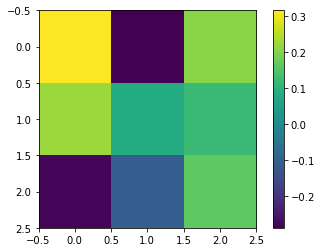

In [39]:
print(t2np(net.conv1.weight).shape)
plt.imshow(t2np(net.conv1.weight)[2,0])
plt.colorbar()

In [115]:
def maxfilter(img):
    top = np.concatenate((img[[0]]*0, img[:-1]))
    left = np.concatenate((img[:,[0]]*0, img[:,:-1]), 1)
    right = np.concatenate((img[:,1:], img[:,[0]]*0), 1)
    bott = np.concatenate((img[1:], img[[0]]*0))
    ref = np.max((top, left, right, bott), 0)
    return np.min((img, ref), 0)

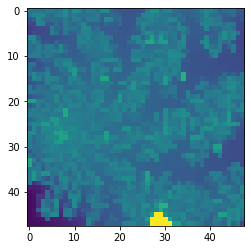

In [113]:
img = lr[0,:,:,0]
plt.imshow(sdflkj(img), vmin=.4, vmax=.75)
#plt.imshow(img, vmin=.4, vmax=.75)
#plt.colorbar()

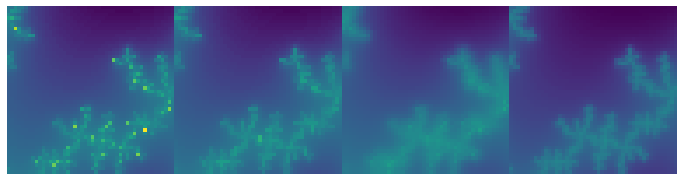

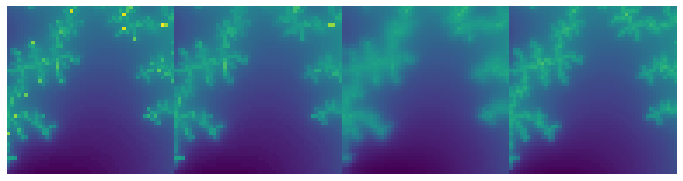

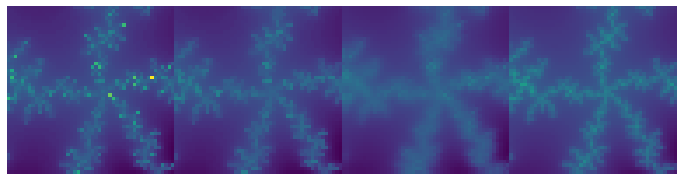

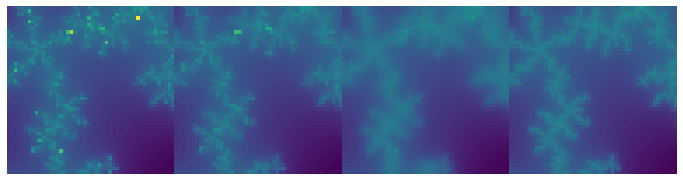

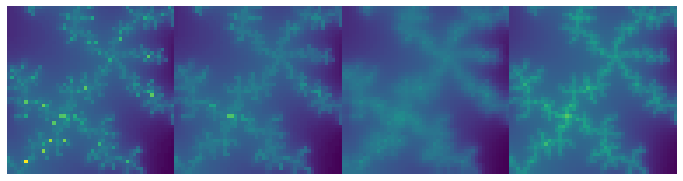

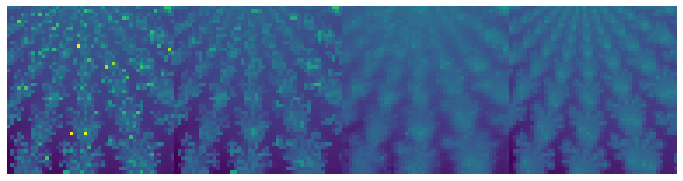

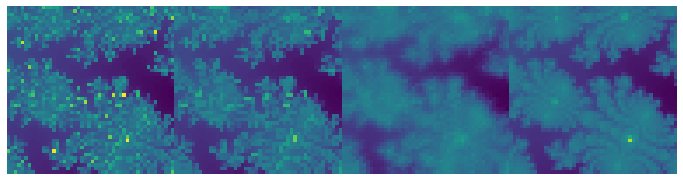

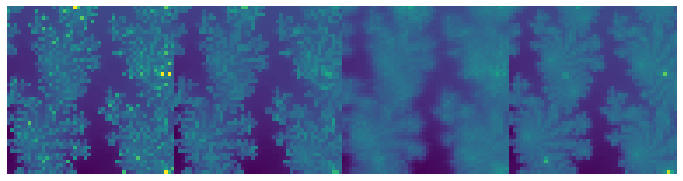

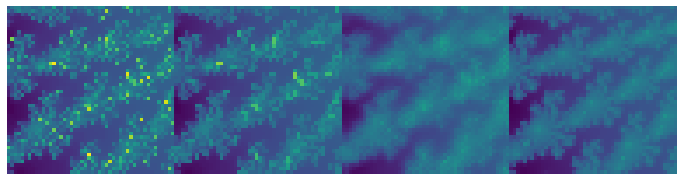

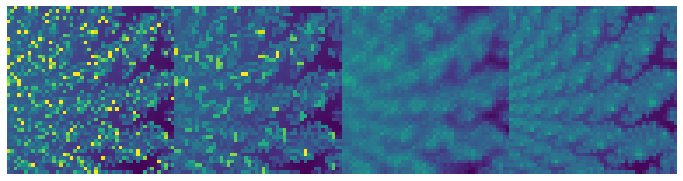

In [116]:
for i in range(10):
    LR, HR = getimages_val([i])
    LR = torch.from_numpy(1*LR.astype('float32')).cuda()
    SR = net(LR)
    LR, SR = t2np(LR, SR)
    plt.figure(figsize=(12,8))
    plt.imshow(np.concatenate((LR[0], maxfilter(LR[0]), SR[0], HR[0]), axis=1))
    plt.axis('off')

In [11]:

actv = nn.functional.relu

from torch.nn.functional import interpolate

class Restore(nn.Module):
    def __init__(self,channels=64, inter=15):
        super().__init__()
        self.conv1 = nn.Conv2d(4, channels, 3, padding=1, padding_mode='reflect')
        self.convblocks1 = nn.ModuleList([nn.Conv2d(channels, channels, 3, padding=1, padding_mode='reflect') for k in range(inter)])
        self.convblocks2 = nn.ModuleList([nn.Conv2d(channels, channels, 3, padding=1, padding_mode='reflect') for k in range(inter)])
        self.attentions = nn.ModuleList([AttentionLayer(channels, channels) for k in range(inter)])
        self.convlast = nn.Conv2d(channels, 1, 3, padding=1, padding_mode='reflect')
        
        self.posx = None
        self.posy = None
        
        self.cuda()
        self.epoch = 0
        self.iters = 0
        self.trainloss = []
        self.valloss = []
            
    def forward(self, x):
        # NHWC zu NCHW
        x = x.permute([0, 3, 1, 2])
        b, c, h, w = x.shape
        if type(self.posx) is type(None):
            # Init posx and posy
            xarr = np.linspace(-1, 1, h)
            posx, posy = meshgrid(xarr, xarr)
            posxy = np.array([posx, posy])
            self.posxy = np2t(posxy)
        convblock = lambda i, x: x + 0.1*self.convblocks1[0](actv(self.convblocks2[0](x)))
        
        x = torch.cat((x, torch.stack(b*[self.posxy], 0)), 1)
        x = self.conv1(x)
        x = actv(x)
        x = convblock(0, x)
        x = convblock(1, x)
        x = self.attentions[0](x)
        x = convblock(2, x)
        x = self.attentions[1](x)
        x = convblock(3, x)
        #x = convblock(4, x)
        #x = convblock(5, x)
        #x = self.attentions[2](x)
        
        x = self.convlast(x)
        
        # restore NHWC-Format
        x = x.permute([0, 2, 3, 1])
        return x
    
    def eval(self, x, mbs=2):
        batches = [ x[mbs*i:mbs*(i+1)] for i in range(len(x)//mbs)]
        return torch.cat([self(b) for b in batches])
    
net = Restore()

In [53]:
from mandel_algorithms import *

@njit
def addmask(lr):
    b, h, w, c = lr.shape
    N = h*w
    masks = np.zeros((b, h, w, 1))
    for k in range(b):
        n = [5, 10, 15, N//16, N//8, N//2, N//4*3, N//10*9][np.random.randint(8)]
        for l in range(n):
            i = np.random.randint(h)
            j = np.random.randint(w)
            masks[k,i,j,0] = 1
    mean = lr.sum(2).sum(1)/h/w
    mean = lr.reshape((b, 1, 1, c))
    return np.concatenate(( lr*masks+mean*(1-masks), masks ), -1)

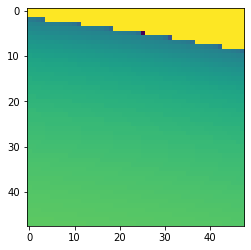

TypingError: Failed in nopython mode pipeline (step: nopython frontend)
[1m[1m[1m[1m- Resolution failure for literal arguments:
[1mreshape() supports contiguous array only[0m
[0m[1m- Resolution failure for non-literal arguments:
[1mreshape() supports contiguous array only[0m
[0m[0m
[0m[1mDuring: resolving callee type: BoundFunction(array.reshape for array(float64, 4d, A))[0m
[0m[1mDuring: typing of call at <ipython-input-53-27ab06e126c6> (15)
[0m
[1m
File "<ipython-input-53-27ab06e126c6>", line 15:[0m
[1mdef addmask(lr):
    <source elided>
    mean = lr.sum(2).sum(1)/h/w
[1m    mean = lr.reshape((b, 1, 1, c))
[0m    [1m^[0m[0m


In [54]:
LR, HR = next(train_gen)
showimg(LR[1])
showimg(addmask(LR)[1,:,:,0])

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 0] losses: (31.639675011634825, nan)


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


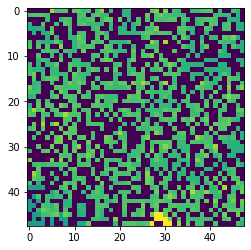

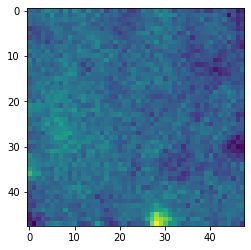

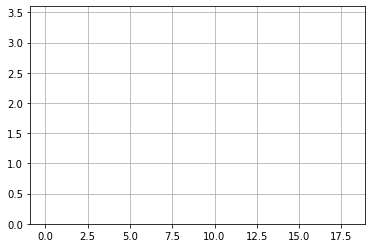

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 1] losses: (32.67963436603546, nan)


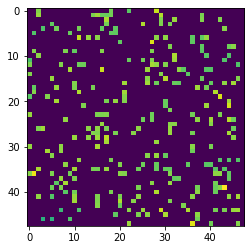

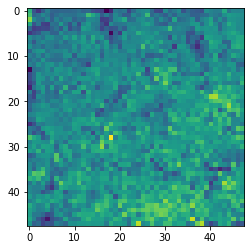

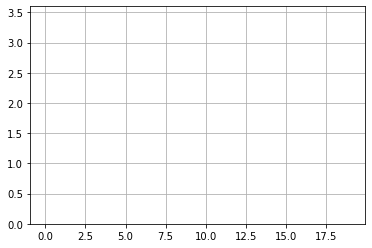

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 2] losses: (31.91456582069397, nan)


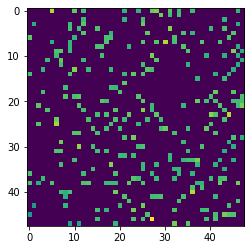

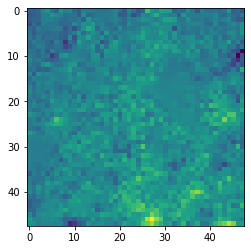

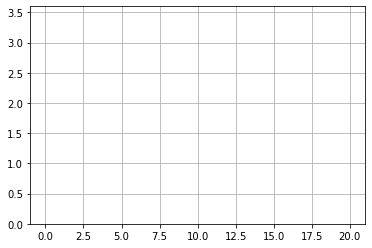

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 3] losses: (29.357264308929444, nan)


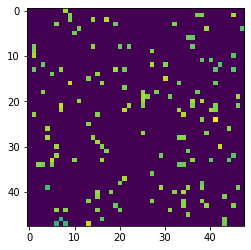

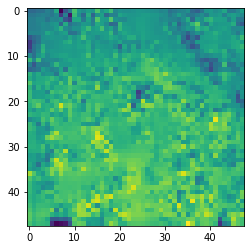

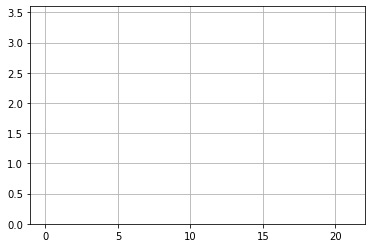

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 4] losses: (31.83538148880005, nan)


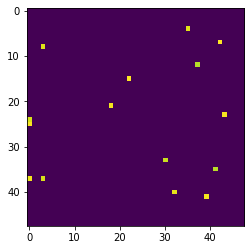

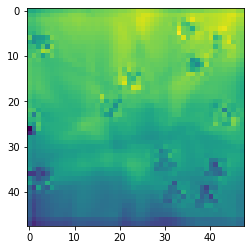

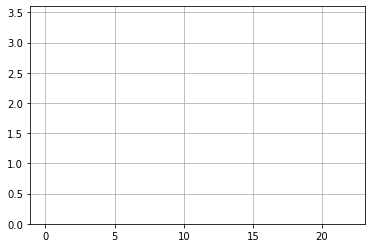

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 5] losses: (31.023682684898375, nan)


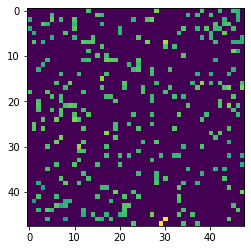

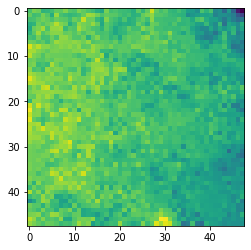

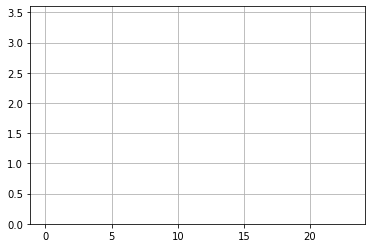

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 6] losses: (31.40307683944702, nan)


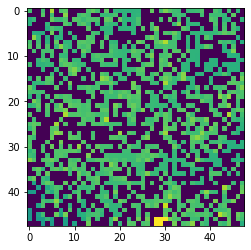

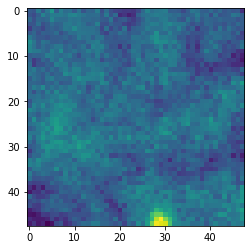

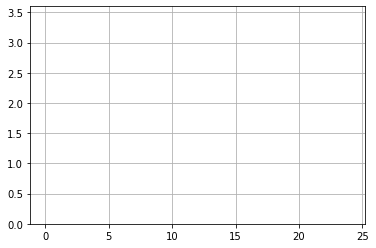

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 7] losses: (26.95464234828949, nan)


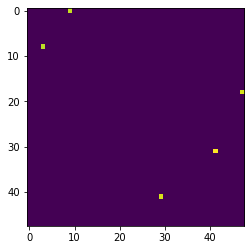

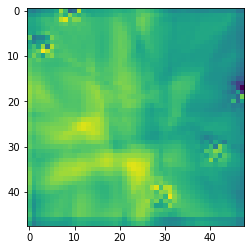

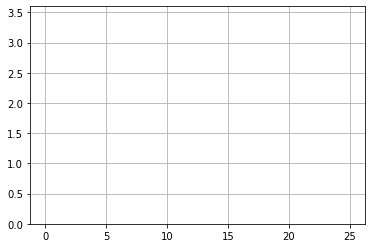

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 8] losses: (30.806728200912474, nan)


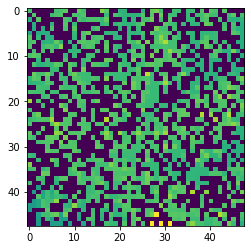

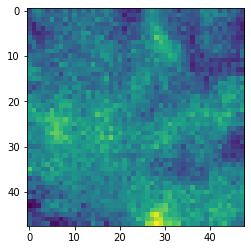

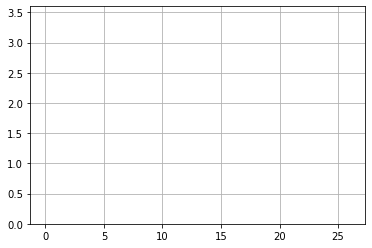

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 9] losses: (30.03047195672989, nan)


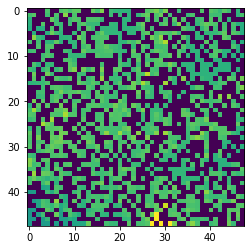

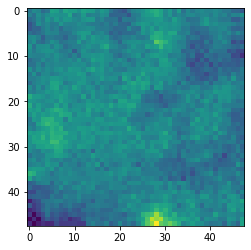

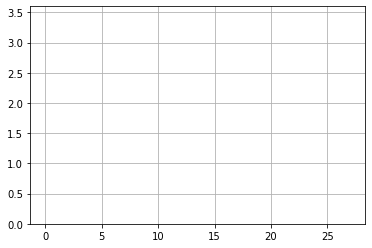

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 10] losses: (30.85194127559662, nan)


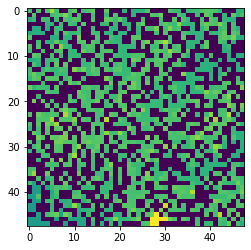

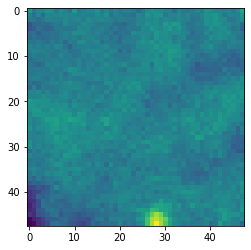

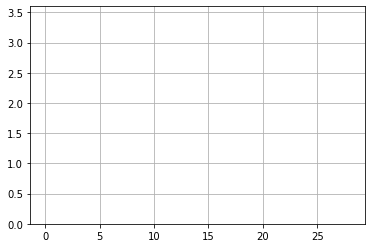

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 11] losses: (29.937872586250304, nan)


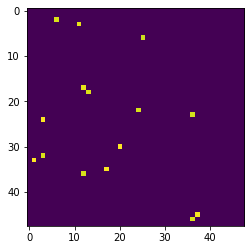

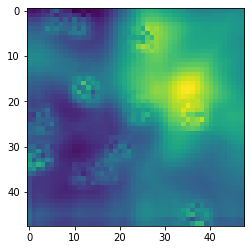

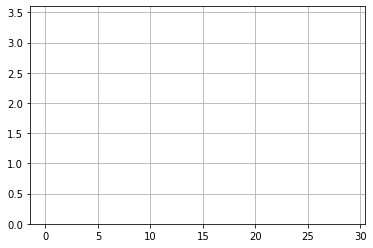

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 12] losses: (30.138534507751466, nan)


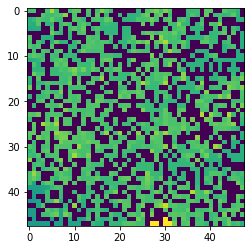

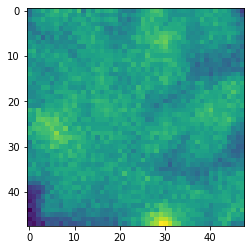

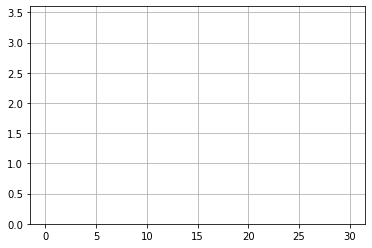

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 13] losses: (26.398179140090942, nan)


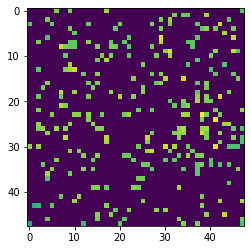

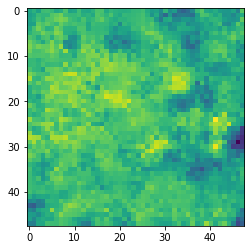

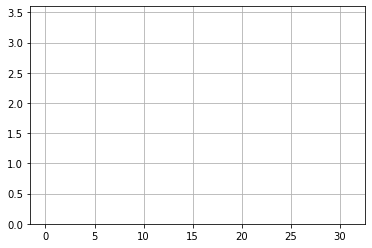

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 14] losses: (28.47314267873764, nan)


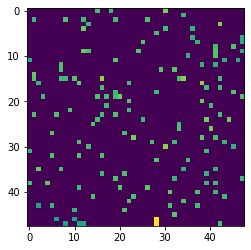

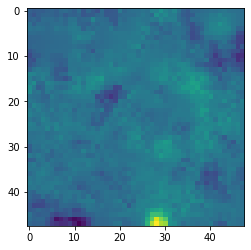

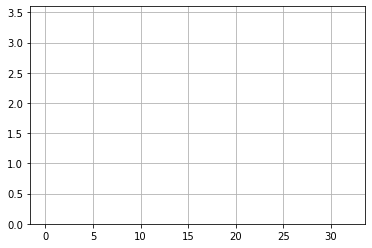

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 15] losses: (32.46272984027863, nan)


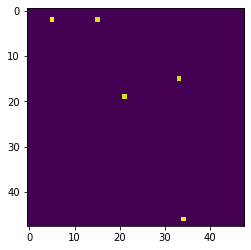

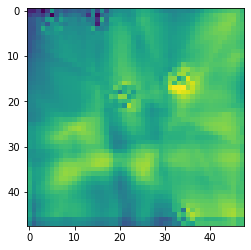

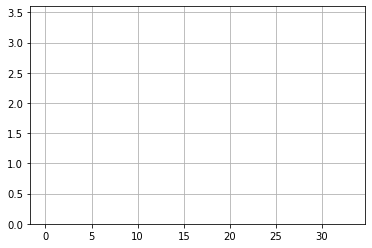

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 16] losses: (29.77563341140747, nan)


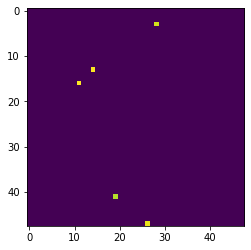

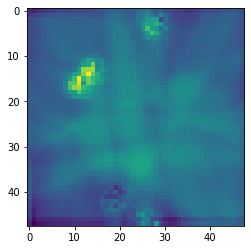

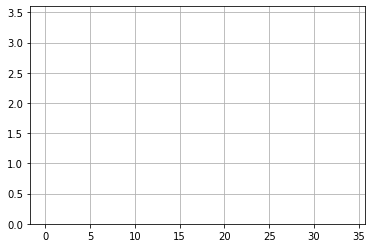

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 17] losses: (24.174845905303954, nan)


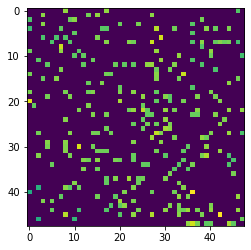

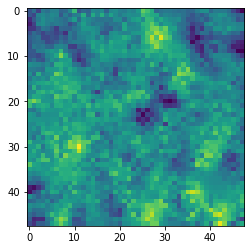

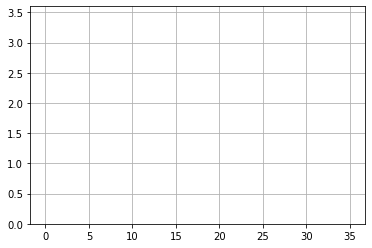

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 18] losses: (29.604926714897157, nan)


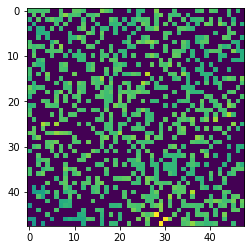

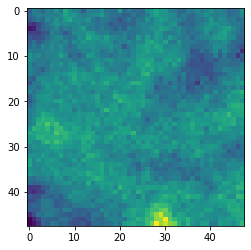

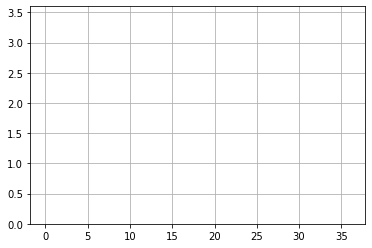

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 19] losses: (28.211760597229002, nan)


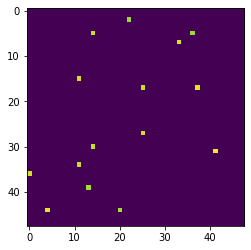

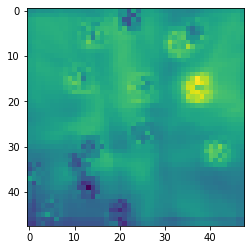

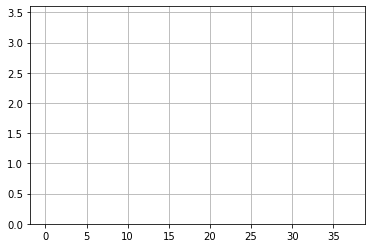

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 20] losses: (26.710214648246765, nan)


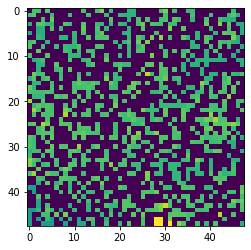

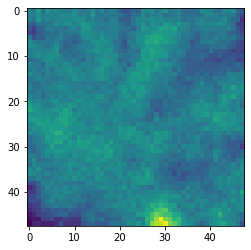

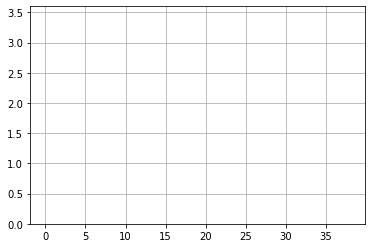

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 21] losses: (26.700044124126435, nan)


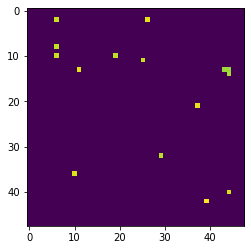

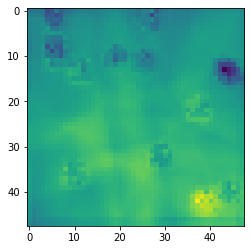

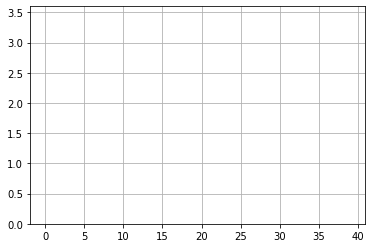

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 22] losses: (25.410262999534606, nan)


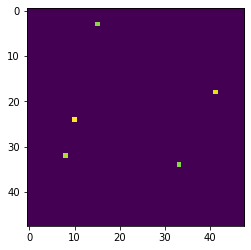

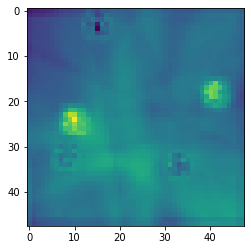

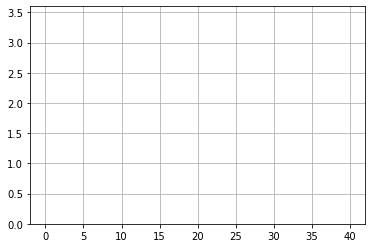

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 23] losses: (25.09437006473541, nan)


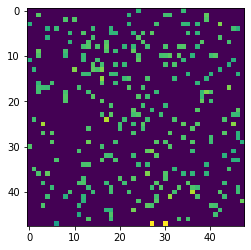

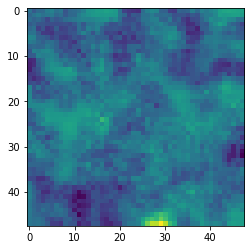

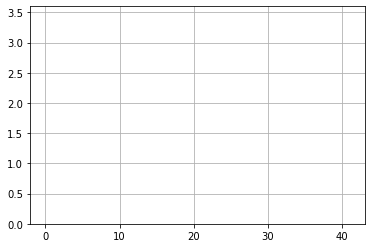

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 24] losses: (24.28125657558441, nan)


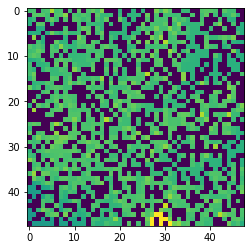

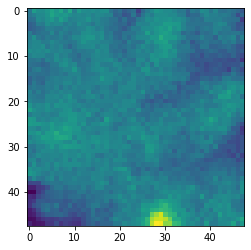

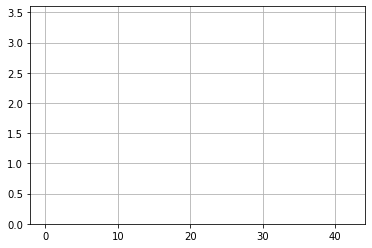

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 25] losses: (27.628201868534088, nan)


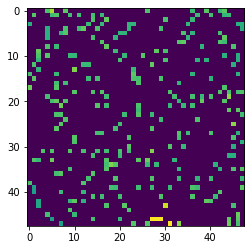

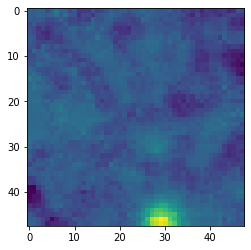

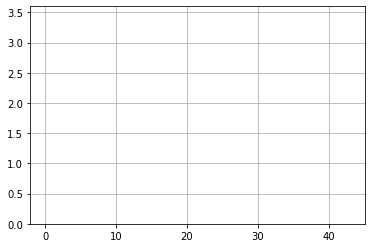

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 26] losses: (24.011739912033082, nan)


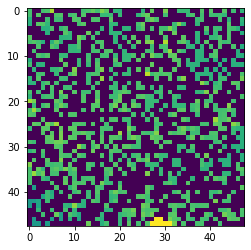

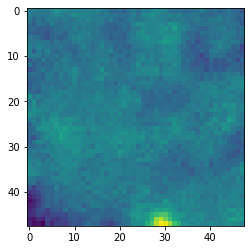

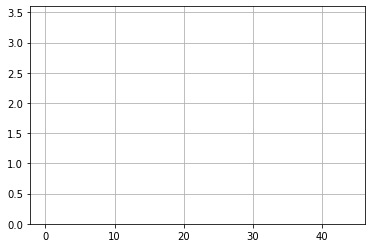

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 27] losses: (29.980635726451872, nan)


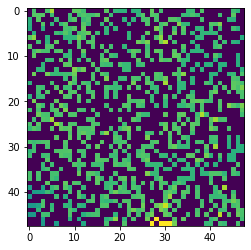

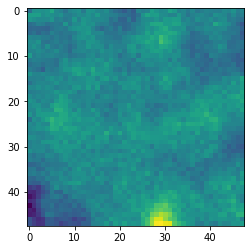

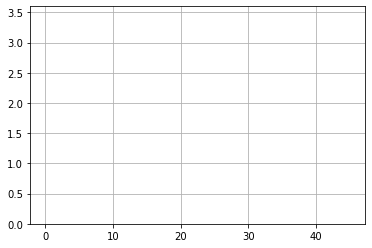

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 28] losses: (26.10315227508545, nan)


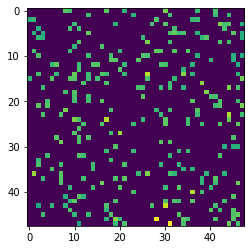

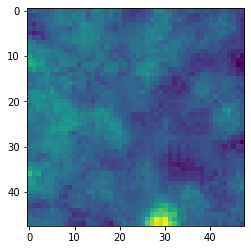

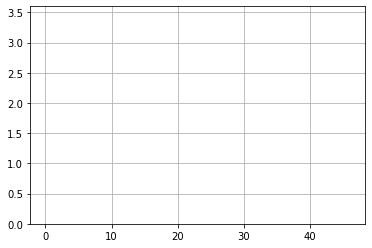

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 29] losses: (26.266410851478575, nan)


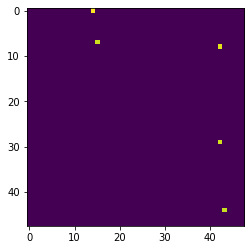

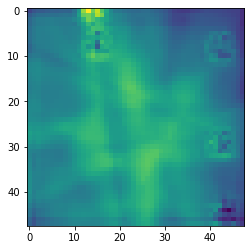

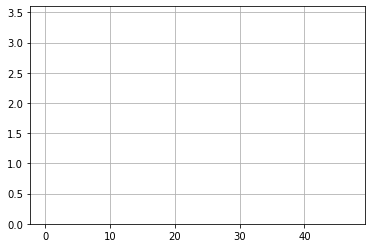

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 30] losses: (21.725794200897216, nan)


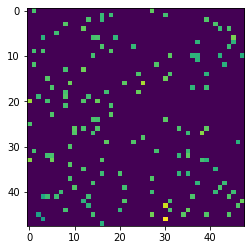

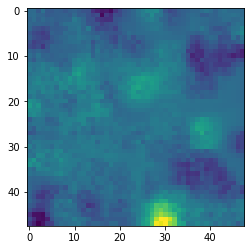

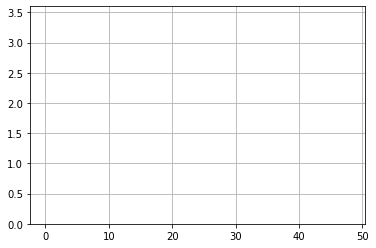

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 31] losses: (25.12419241428375, nan)


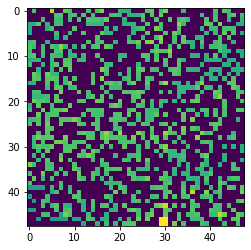

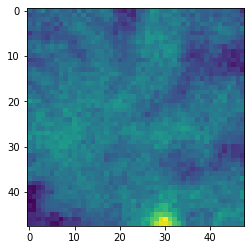

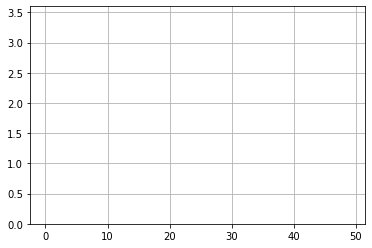

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 32] losses: (20.448519904613494, nan)


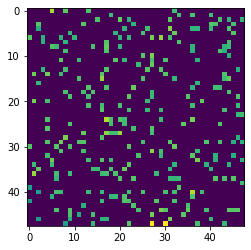

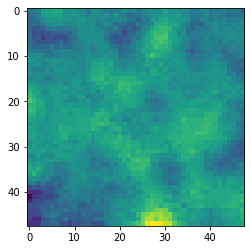

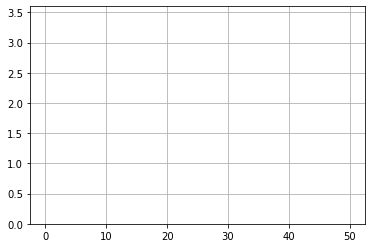

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 33] losses: (24.622465736865998, nan)


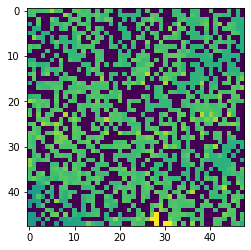

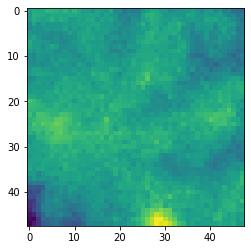

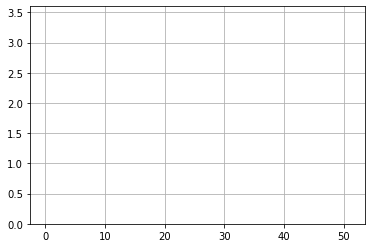

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 34] losses: (25.273446044921876, nan)


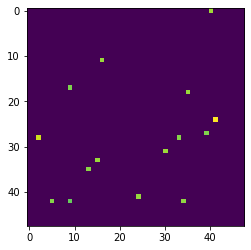

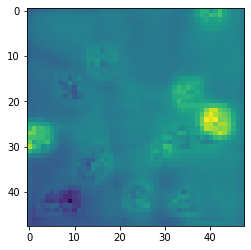

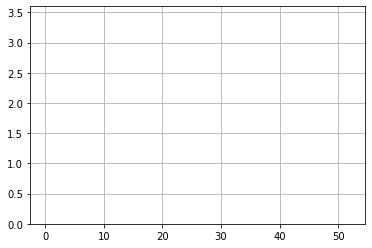

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 35] losses: (27.307446076869965, nan)


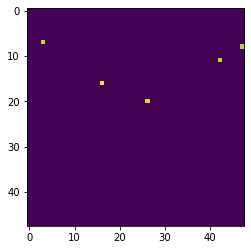

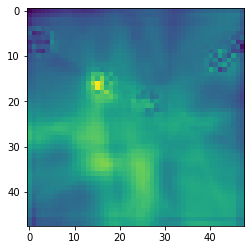

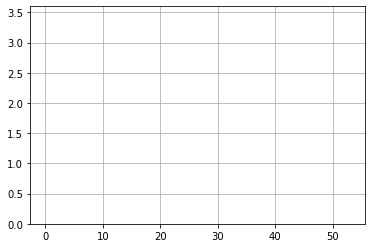

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 36] losses: (23.026859068870543, nan)


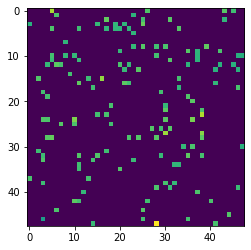

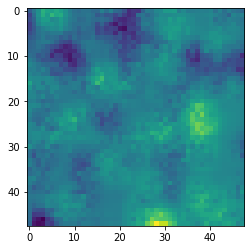

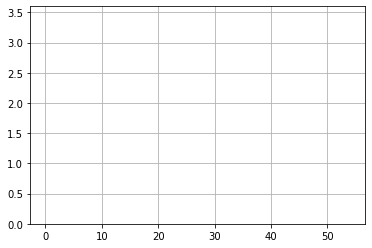

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 37] losses: (24.288932375907898, nan)


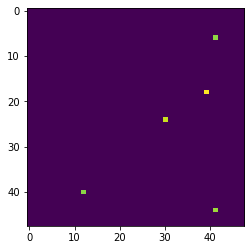

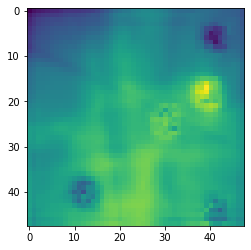

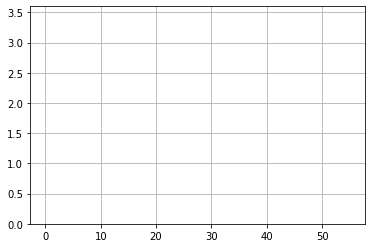

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 38] losses: (24.745693809986115, nan)


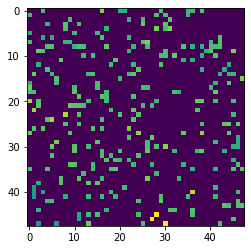

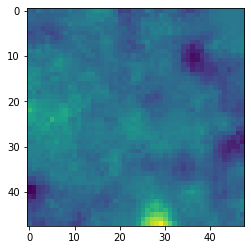

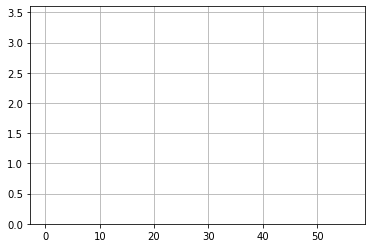

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 39] losses: (24.505106925964355, nan)


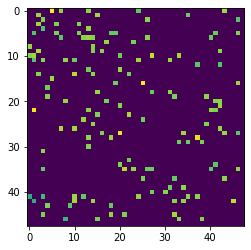

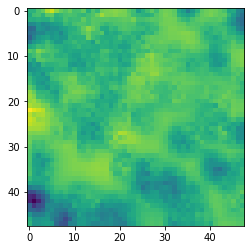

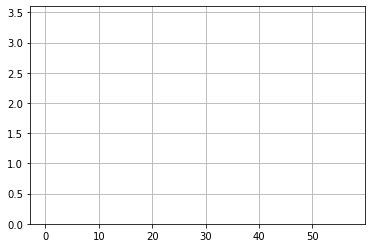

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 40] losses: (23.787273564338683, nan)


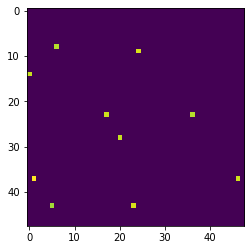

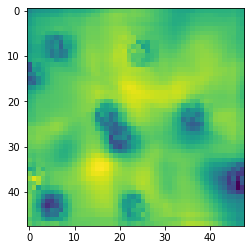

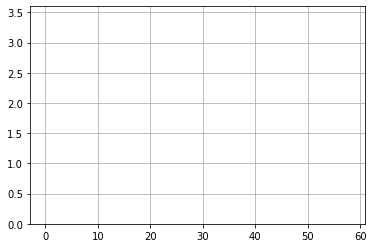

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 41] losses: (25.536837487220765, nan)


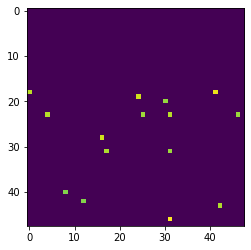

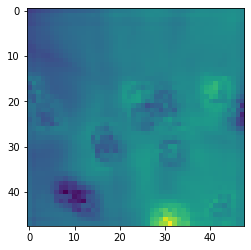

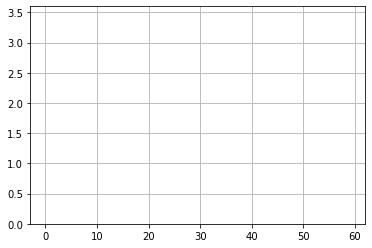

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 42] losses: (23.425651879310607, nan)


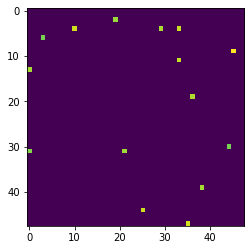

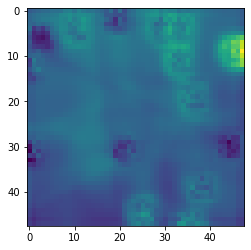

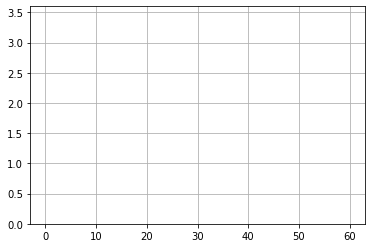

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 43] losses: (27.432496426105498, nan)


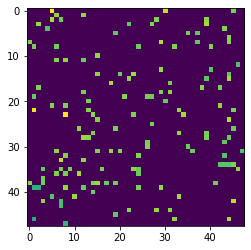

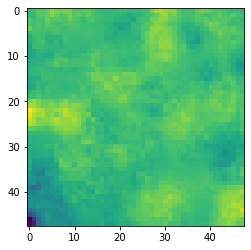

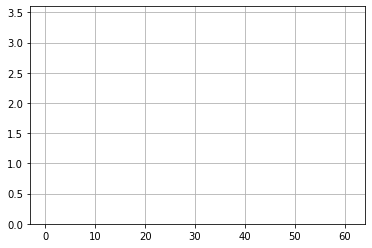

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 44] losses: (25.541032490730284, nan)


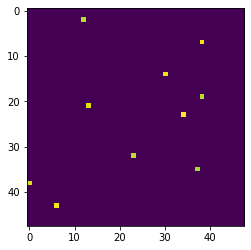

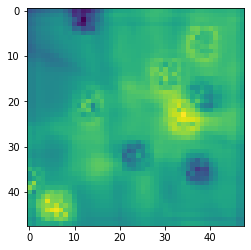

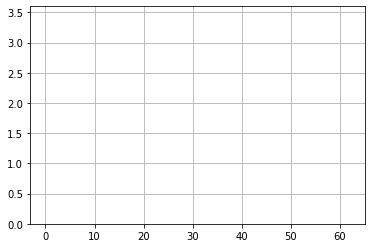

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 45] losses: (25.878227832317354, nan)


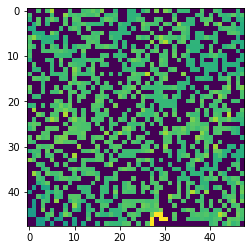

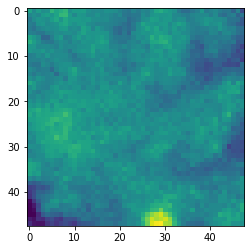

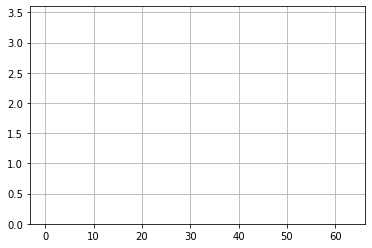

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 46] losses: (24.21900531053543, nan)


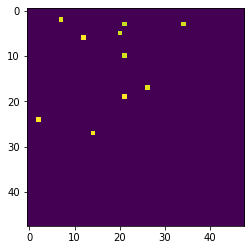

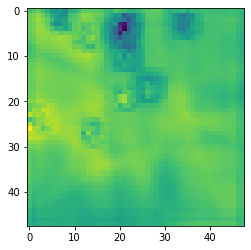

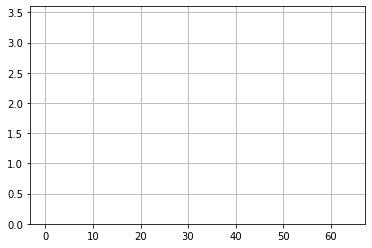

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 47] losses: (21.683544569015503, nan)


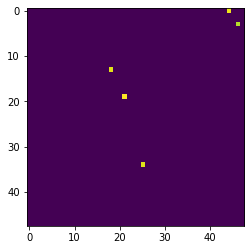

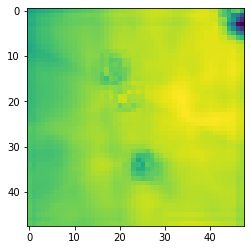

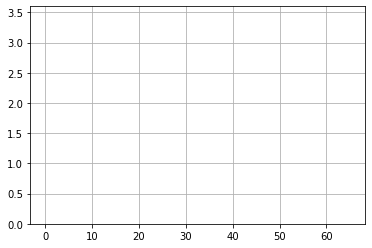

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 48] losses: (23.051672773361204, nan)


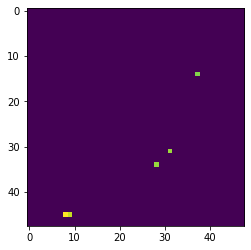

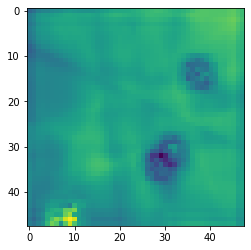

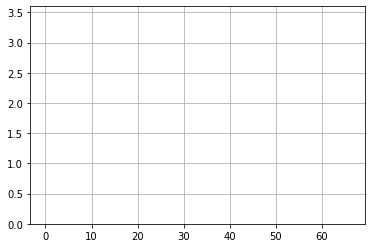

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 49] losses: (23.816134605407715, nan)


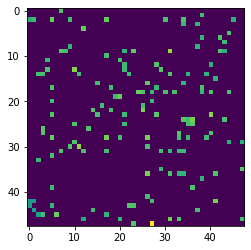

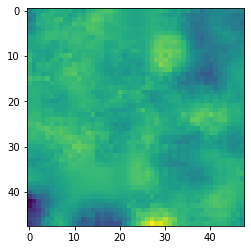

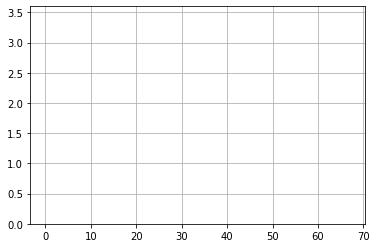

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 50] losses: (24.664007182121278, nan)


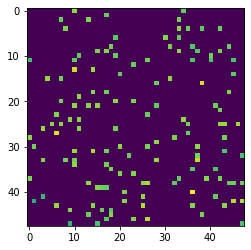

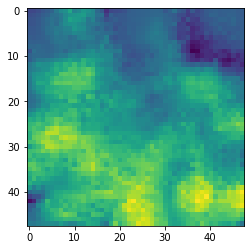

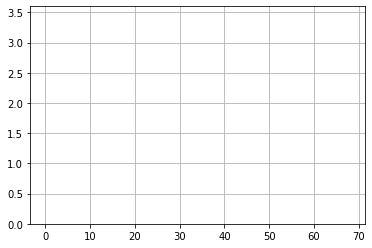

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 51] losses: (23.33381716012955, nan)


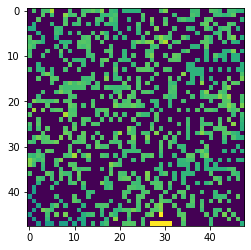

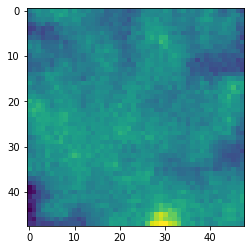

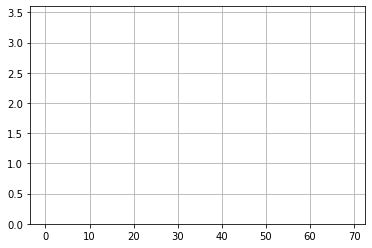

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 52] losses: (24.123258152008056, nan)


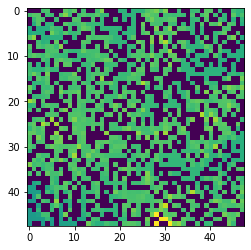

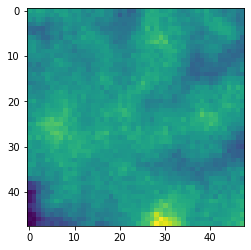

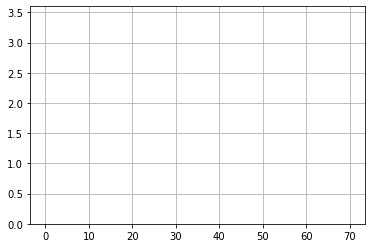

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 53] losses: (21.607381995916366, nan)


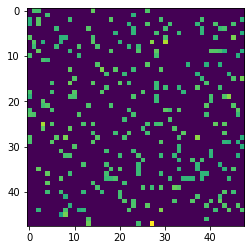

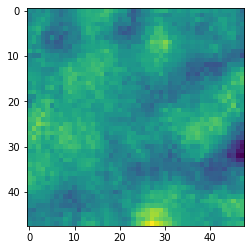

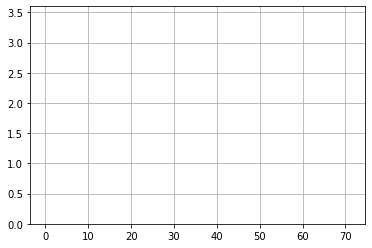

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 54] losses: (22.77611468076706, nan)


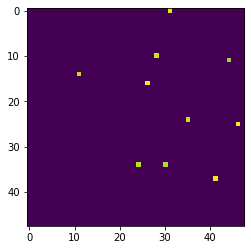

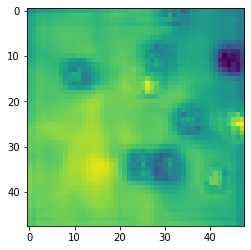

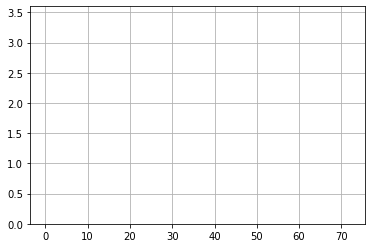

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 55] losses: (23.995970633029938, nan)


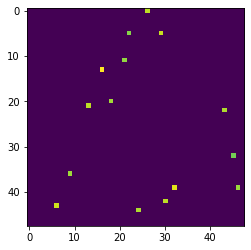

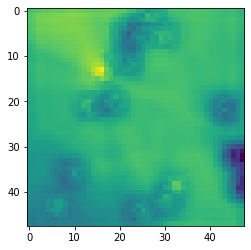

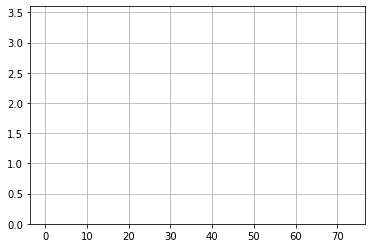

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 56] losses: (19.777985734939577, nan)


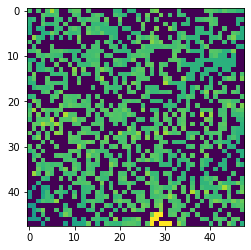

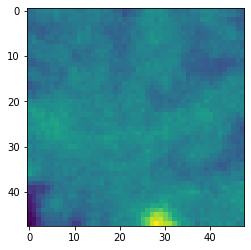

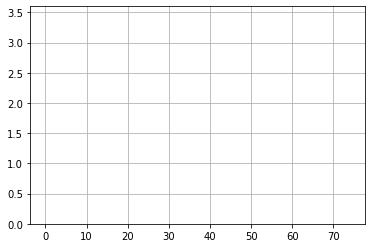

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 57] losses: (20.58909282207489, nan)


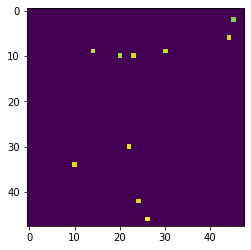

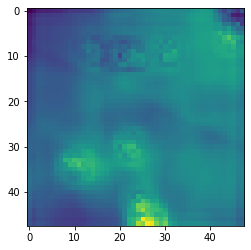

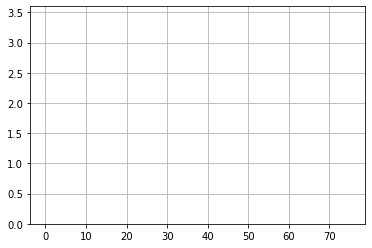

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 58] losses: (22.305320982933043, nan)


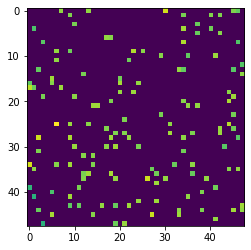

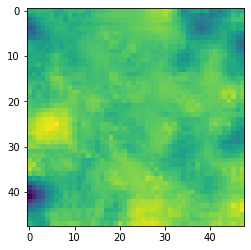

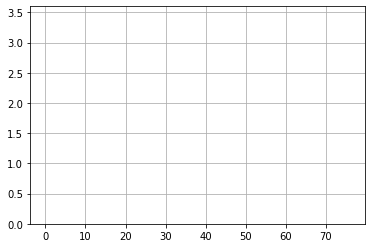

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 59] losses: (24.086371676921843, nan)


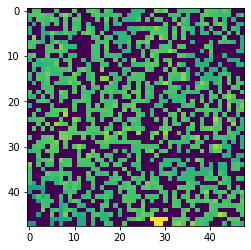

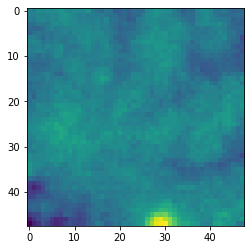

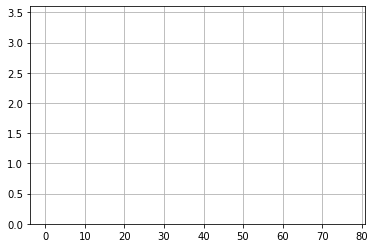

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 60] losses: (23.06572457551956, nan)


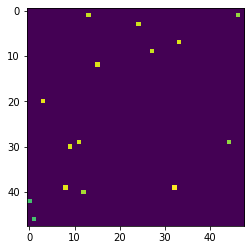

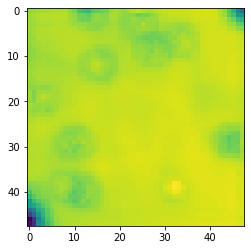

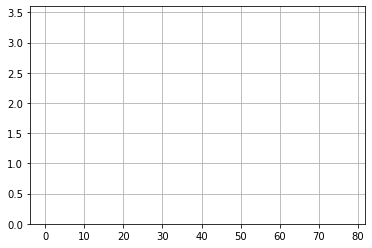

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 61] losses: (23.15869195461273, nan)


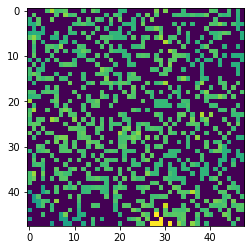

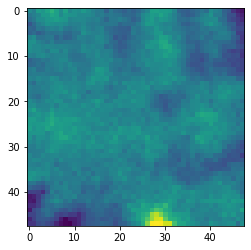

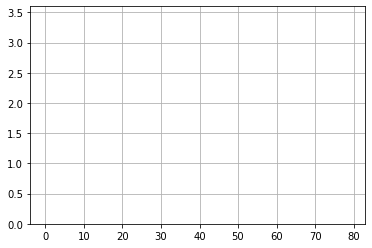

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 62] losses: (17.843714694976807, nan)


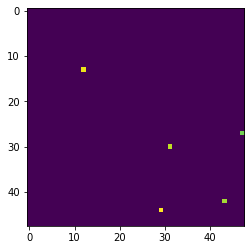

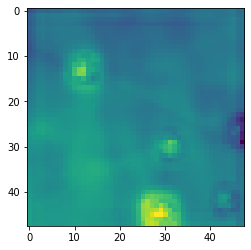

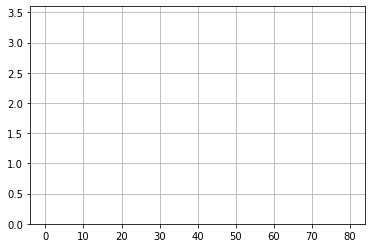

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 63] losses: (22.888165991306305, nan)


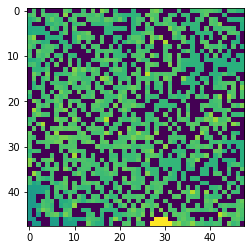

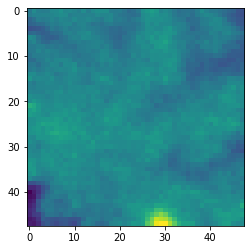

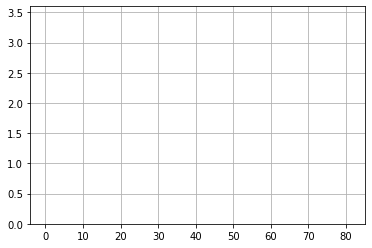

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 64] losses: (22.918751401901247, nan)


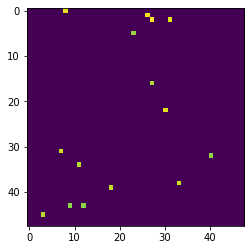

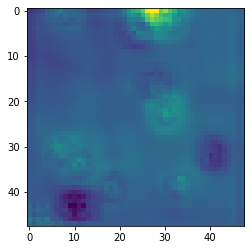

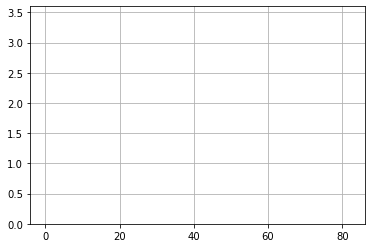

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 65] losses: (19.262992656230928, nan)


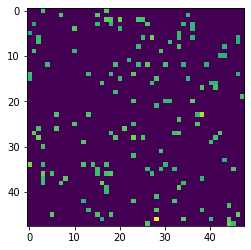

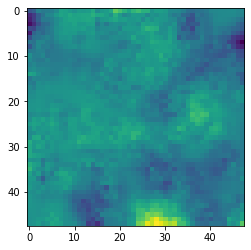

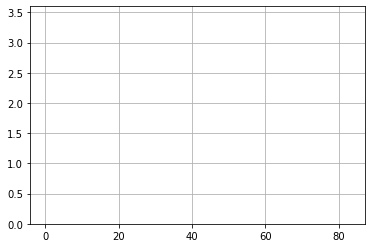

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 66] losses: (21.791860806941987, nan)


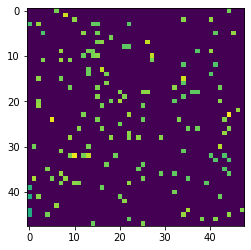

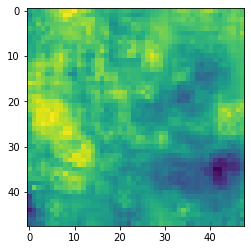

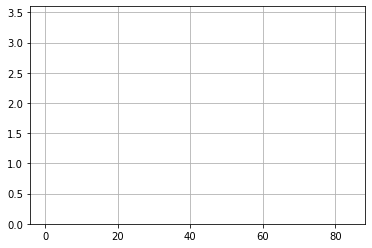

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 67] losses: (27.11024504184723, nan)


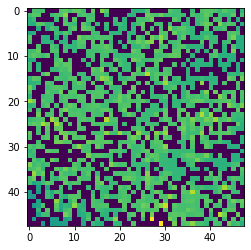

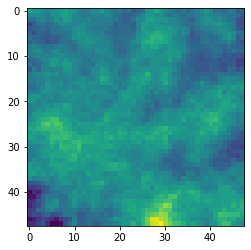

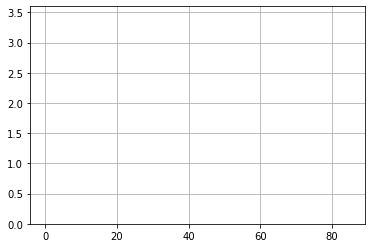

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 68] losses: (24.774369924068452, nan)


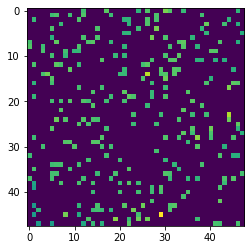

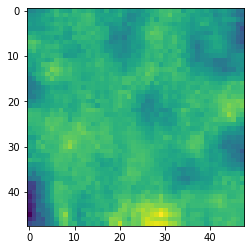

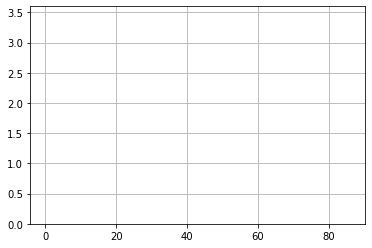

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 69] losses: (21.073735404014588, nan)


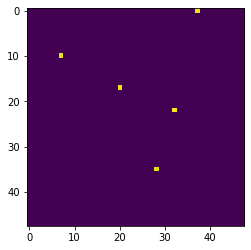

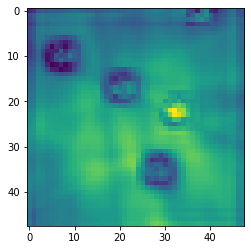

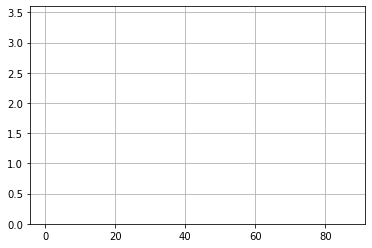

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 70] losses: (20.720824851989747, nan)


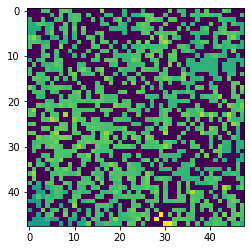

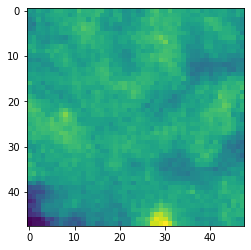

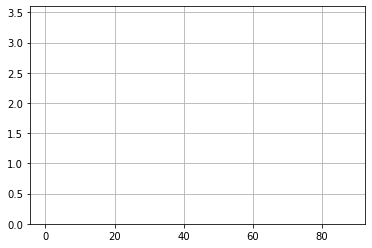

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 71] losses: (19.517051367759706, nan)


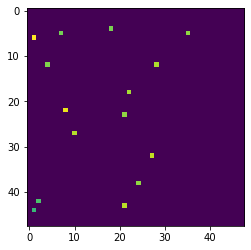

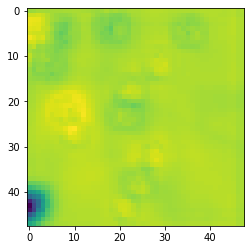

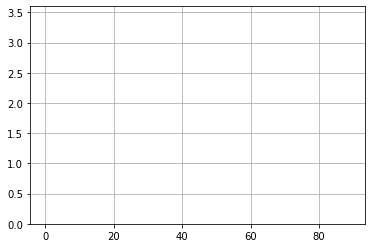

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 72] losses: (21.300639507770537, nan)


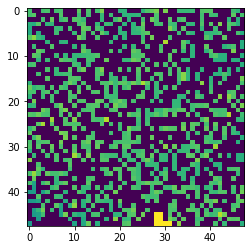

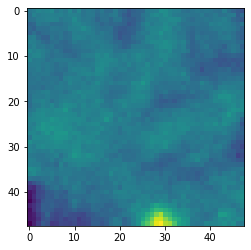

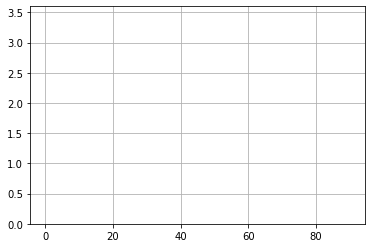

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 73] losses: (19.513697595596312, nan)


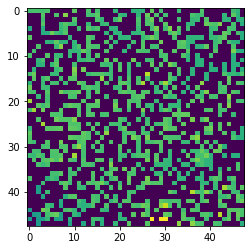

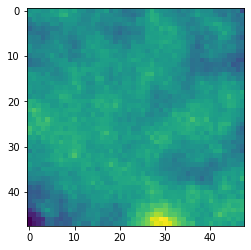

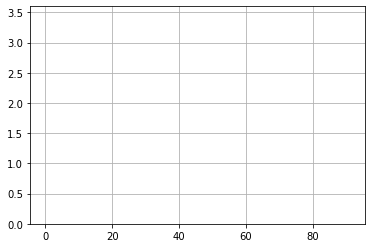

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 74] losses: (20.037084290981294, nan)


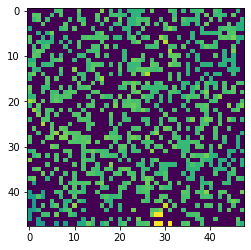

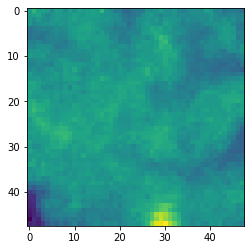

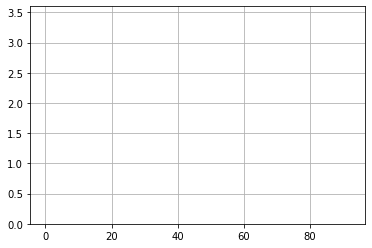

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 75] losses: (18.908239533901213, nan)


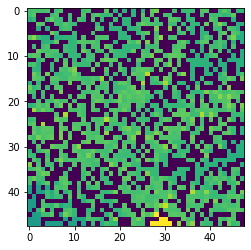

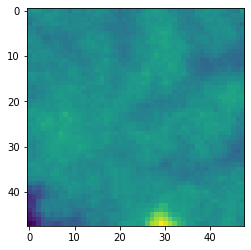

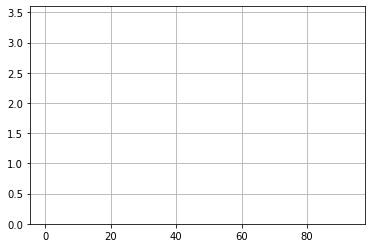

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 76] losses: (18.31983239889145, nan)


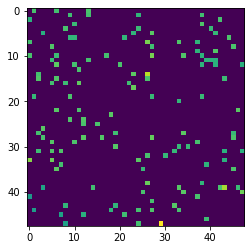

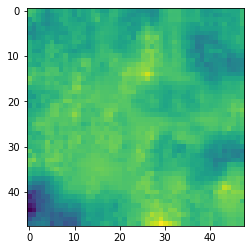

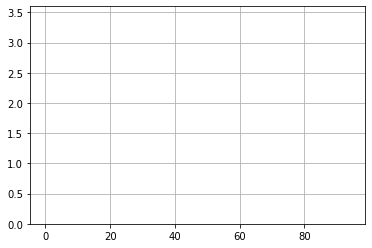

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 77] losses: (19.50650665283203, nan)


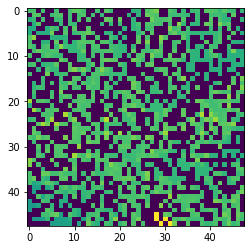

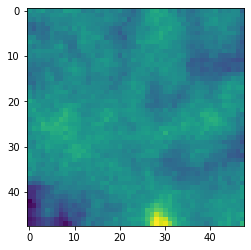

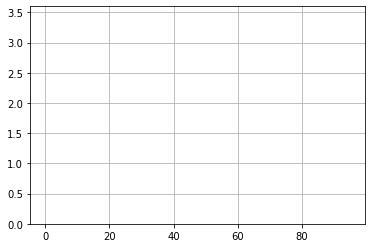

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 78] losses: (17.83519575595856, nan)


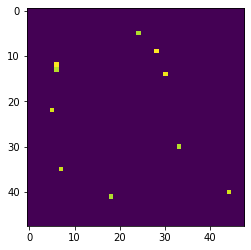

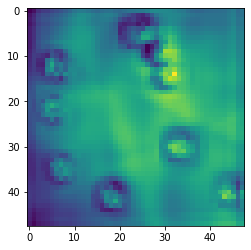

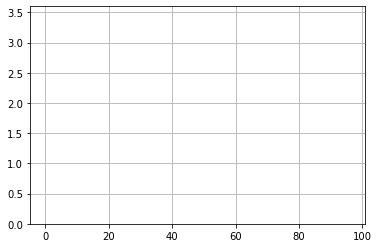

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 79] losses: (17.987709414958953, nan)


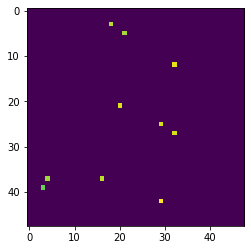

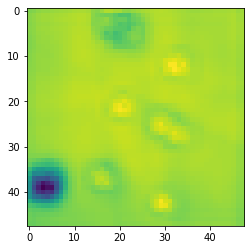

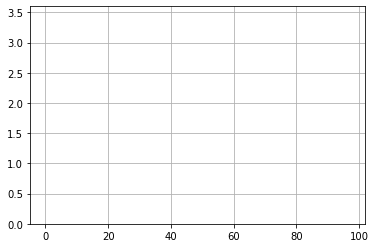

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 80] losses: (17.152115564346314, nan)


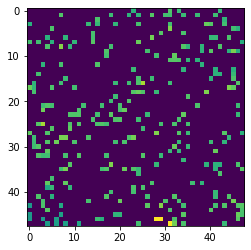

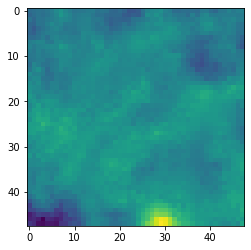

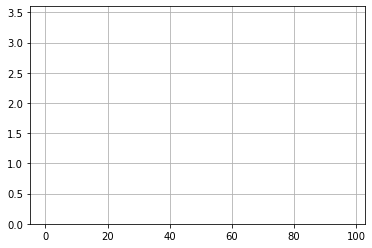

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 81] losses: (17.264321138858794, nan)


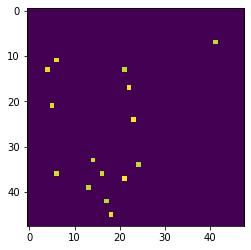

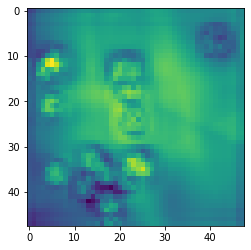

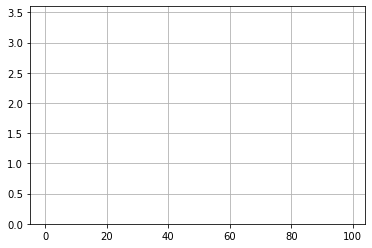

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 82] losses: (18.277676084041595, nan)


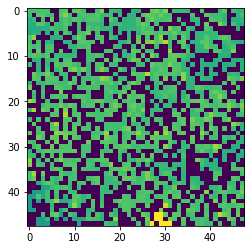

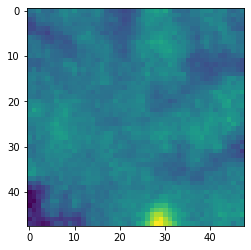

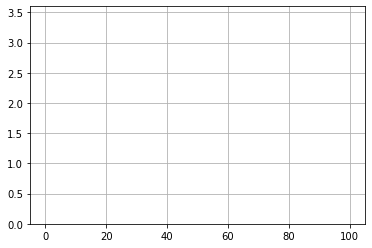

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 83] losses: (18.259153776168823, nan)


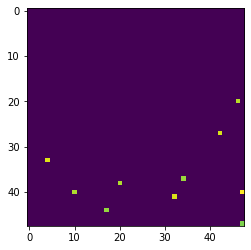

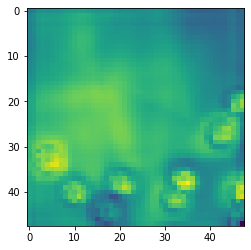

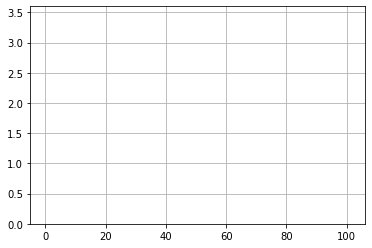

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 84] losses: (17.78450291156769, nan)


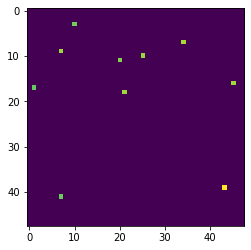

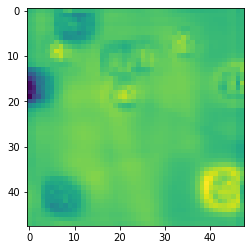

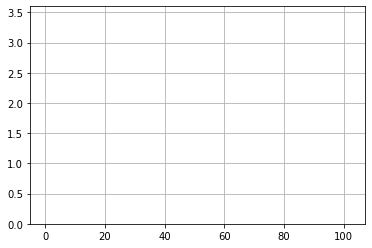

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 85] losses: (16.579078361988067, nan)


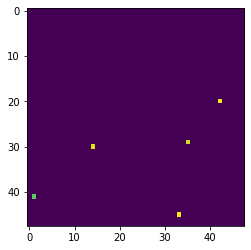

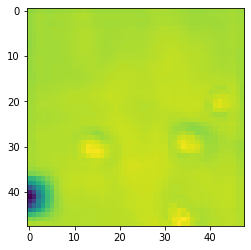

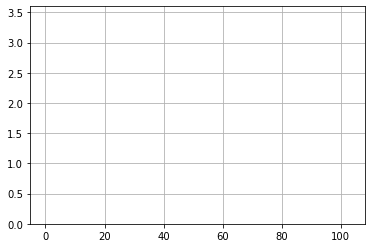

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 86] losses: (17.805025987625122, nan)


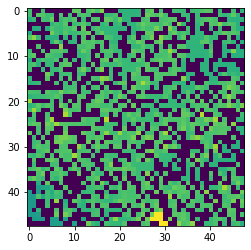

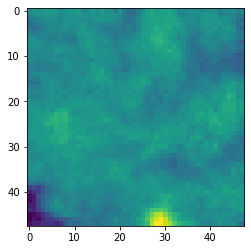

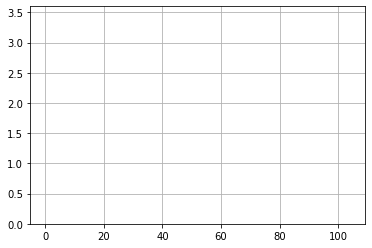

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 87] losses: (17.285228543281555, nan)


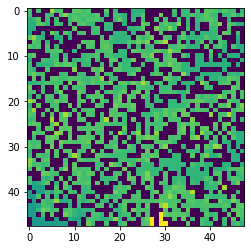

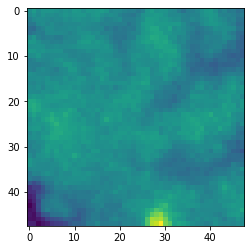

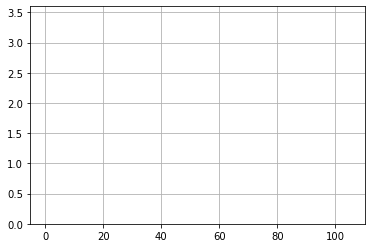

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 88] losses: (17.941639058589935, nan)


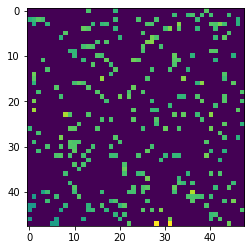

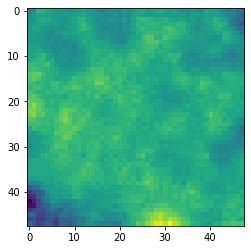

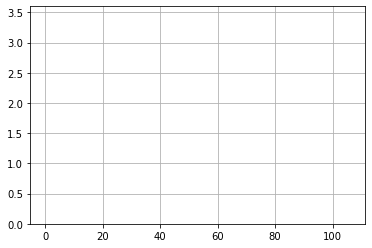

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 89] losses: (16.367822719812395, nan)


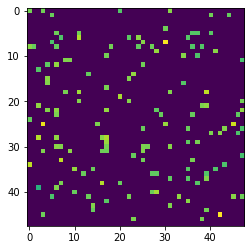

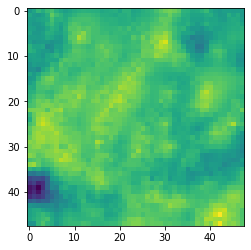

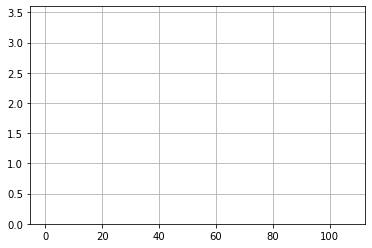

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 90] losses: (16.174163978099823, nan)


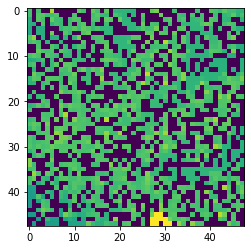

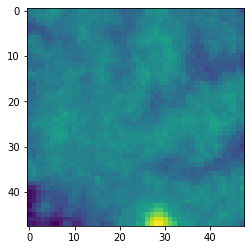

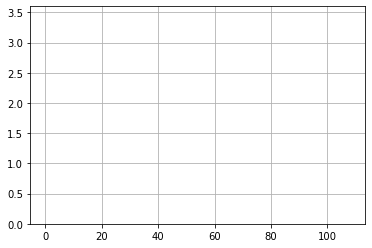

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 91] losses: (16.580188705921174, nan)


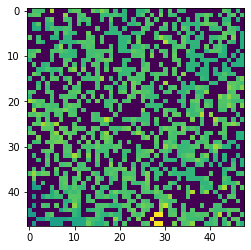

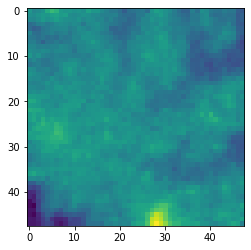

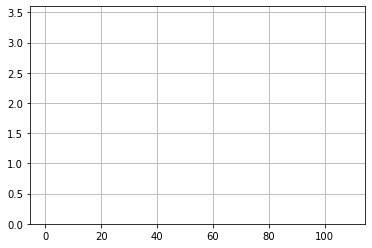

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 92] losses: (16.616189886331558, nan)


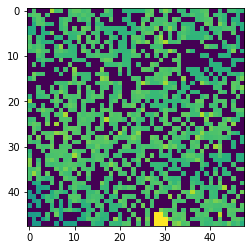

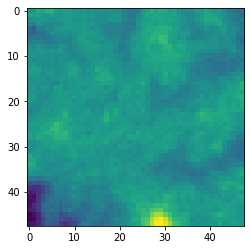

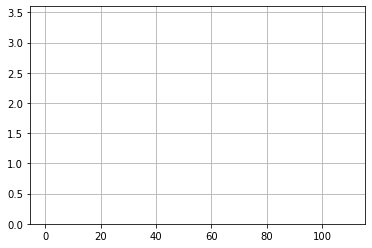

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 93] losses: (15.655862340927124, nan)


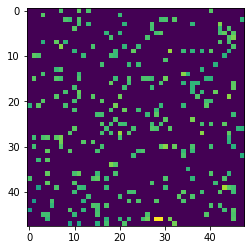

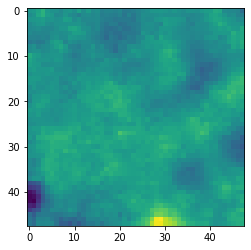

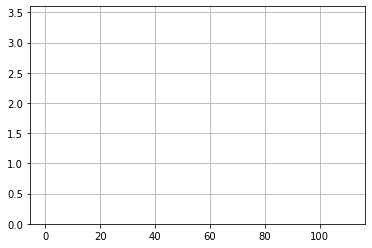

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 94] losses: (16.20957780838013, nan)


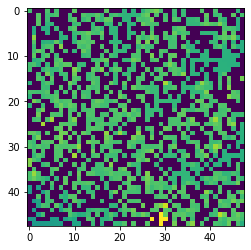

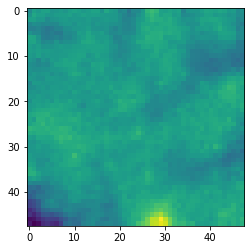

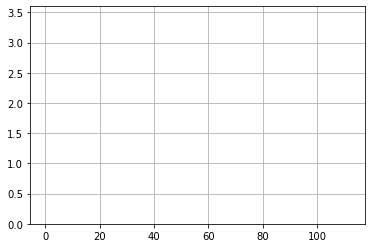

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 95] losses: (15.859038171768189, nan)


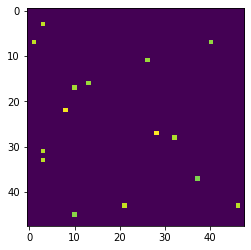

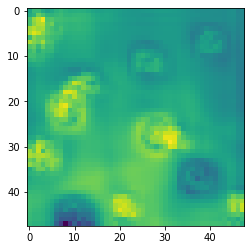

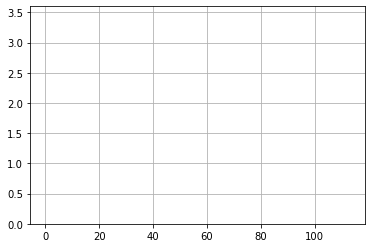

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 96] losses: (16.408870301246644, nan)


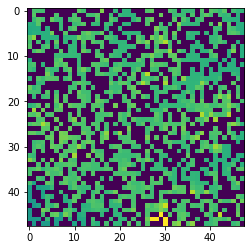

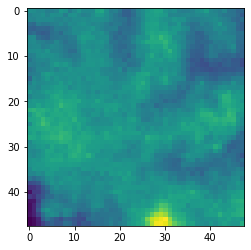

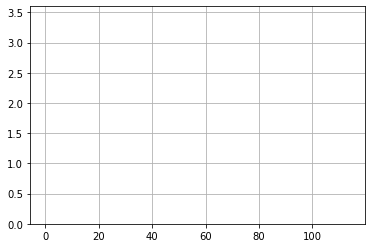

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 97] losses: (15.99237563610077, nan)


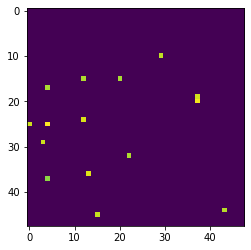

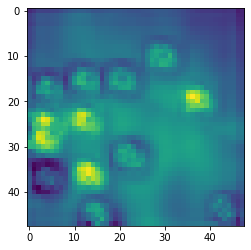

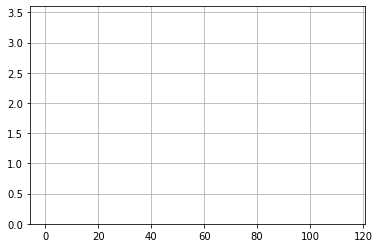

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 98] losses: (15.900074732303619, nan)


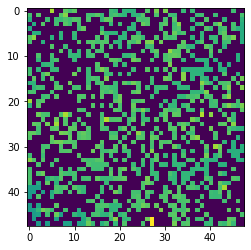

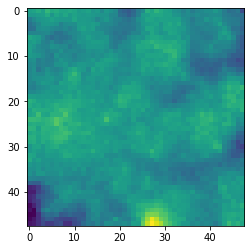

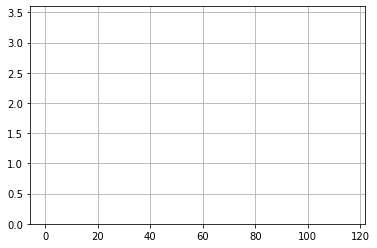

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 99] losses: (15.762617585659028, nan)


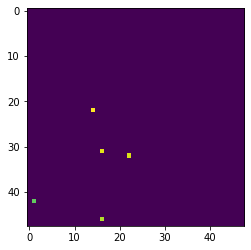

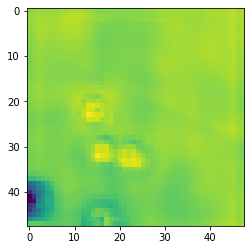

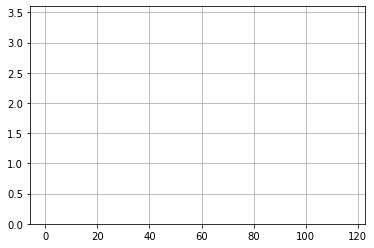

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 100] losses: (14.83302188873291, nan)


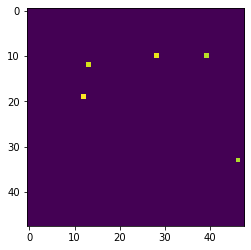

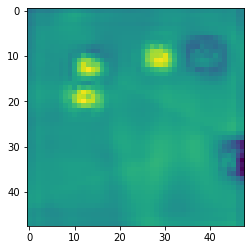

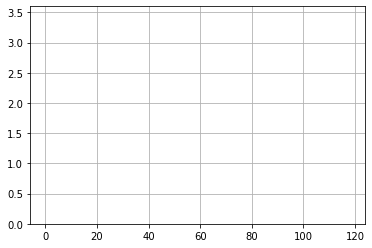

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 101] losses: (15.73069993019104, nan)


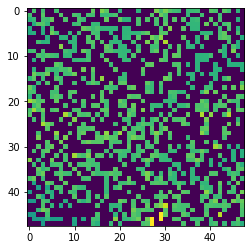

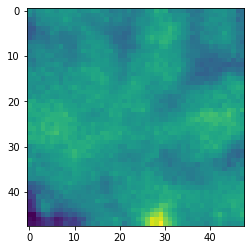

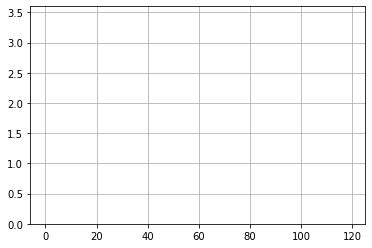

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 102] losses: (16.5835759139061, nan)


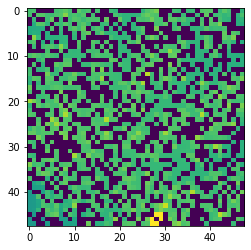

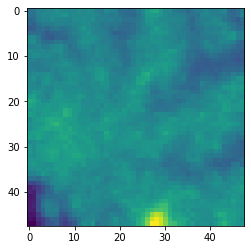

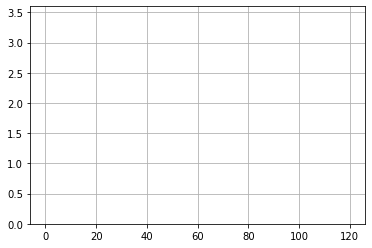

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 103] losses: (16.992037099599838, nan)


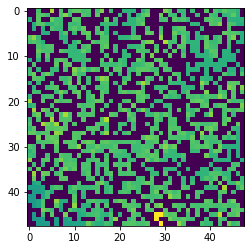

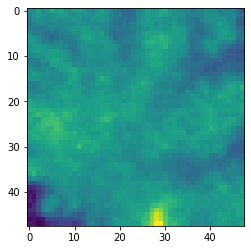

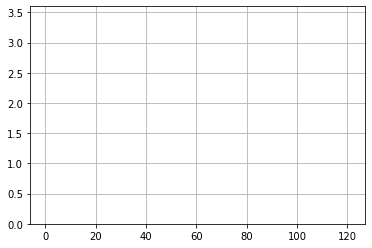

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 104] losses: (15.538213639259338, nan)


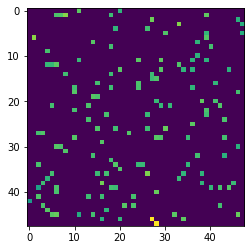

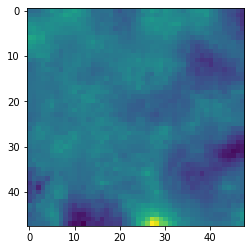

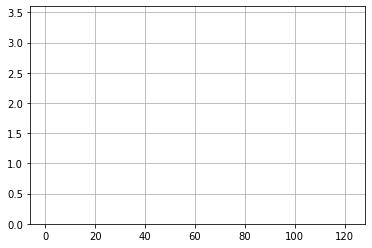

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 105] losses: (15.04780035495758, nan)


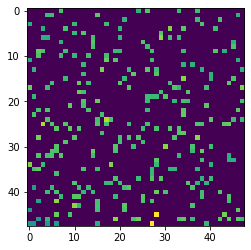

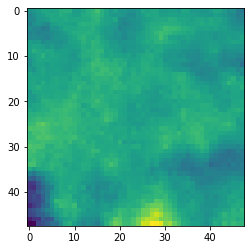

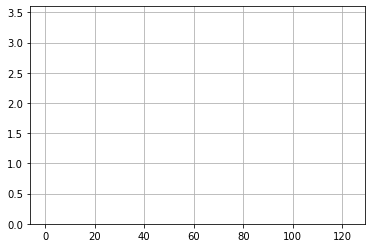

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 106] losses: (15.623865416049957, nan)


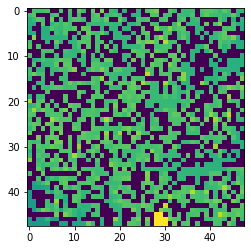

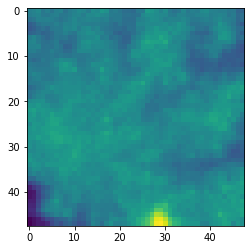

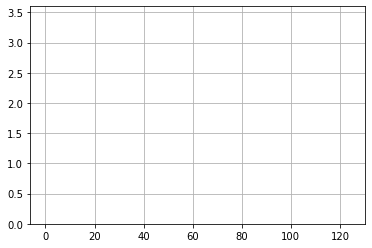

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 107] losses: (16.711465175151826, nan)


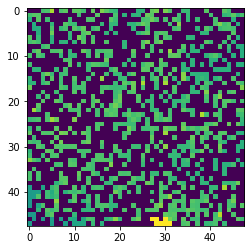

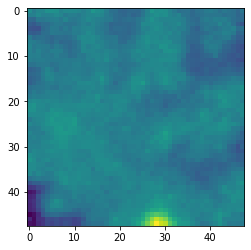

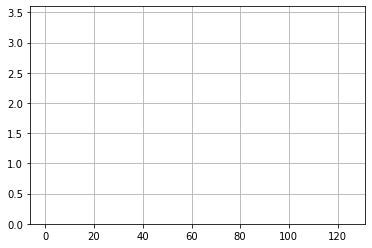

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 108] losses: (15.211309609413147, nan)


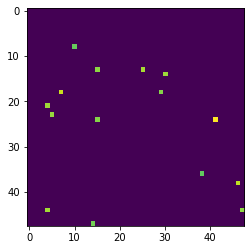

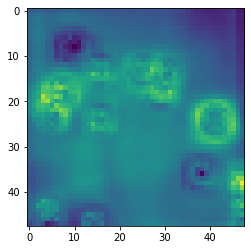

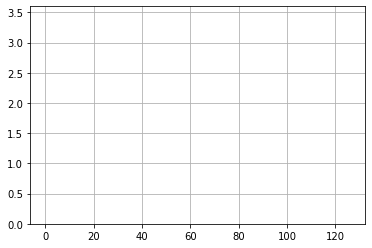

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 109] losses: (16.23306460380554, nan)


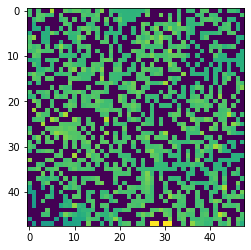

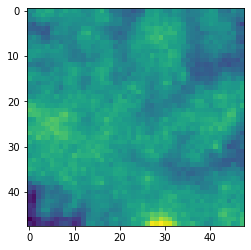

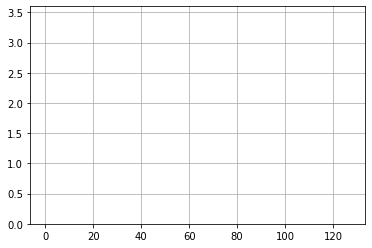

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 110] losses: (13.856637309789658, nan)


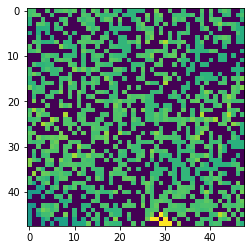

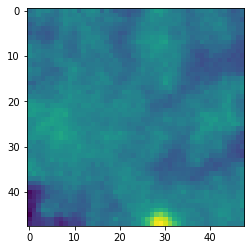

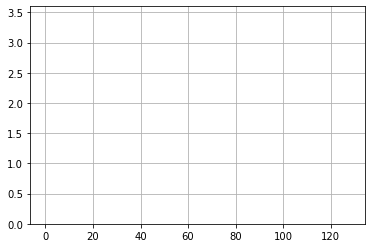

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 111] losses: (15.700169429779052, nan)


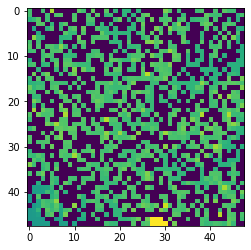

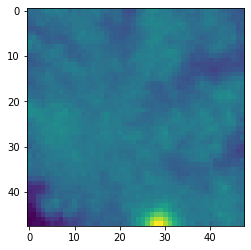

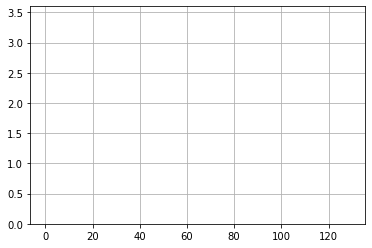

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 112] losses: (15.646137712001801, nan)


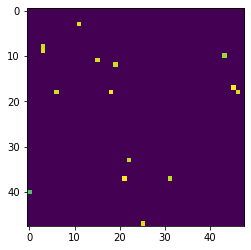

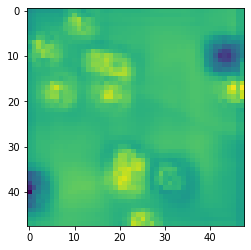

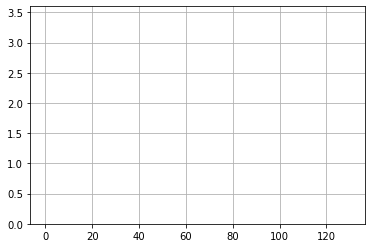

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 113] losses: (16.939011541604994, nan)


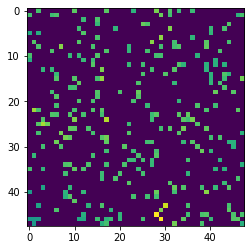

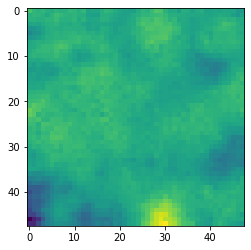

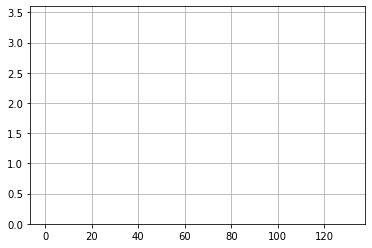

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 114] losses: (13.59093100786209, nan)


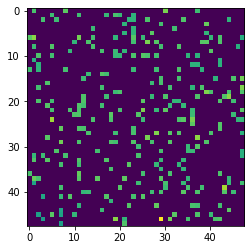

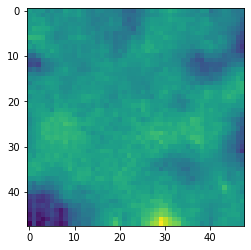

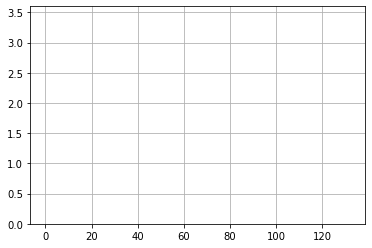

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 115] losses: (15.532922534942626, nan)


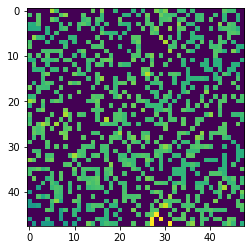

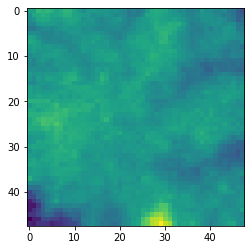

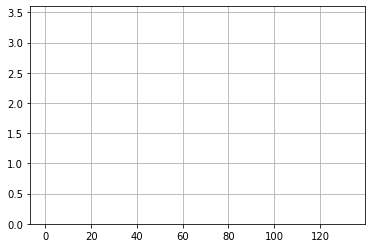

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 116] losses: (17.73213685274124, nan)


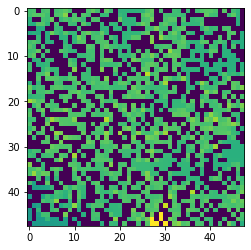

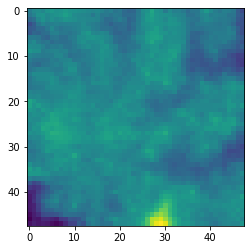

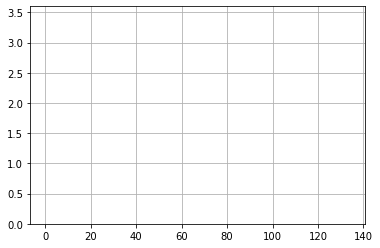

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 117] losses: (16.285659155845643, nan)


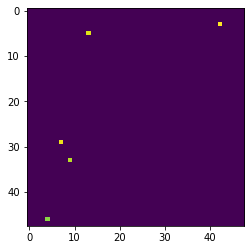

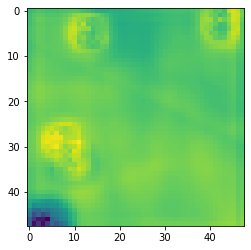

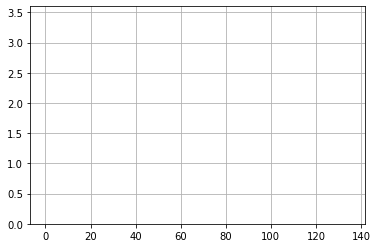

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 118] losses: (15.679294440746308, nan)


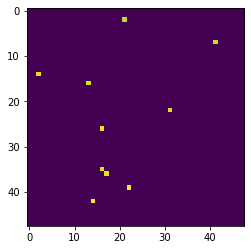

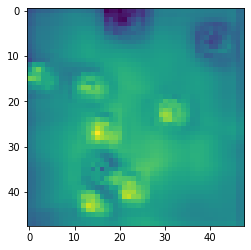

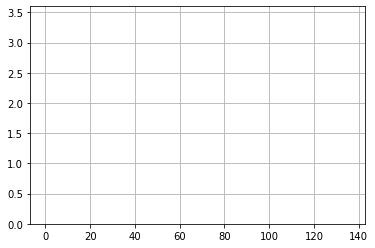

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 119] losses: (16.0634365439415, nan)


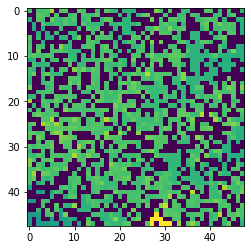

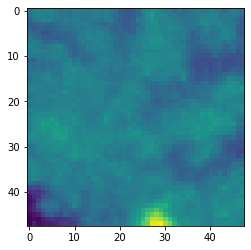

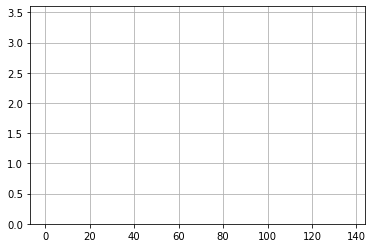

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 120] losses: (16.234081978797914, nan)


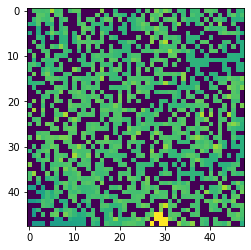

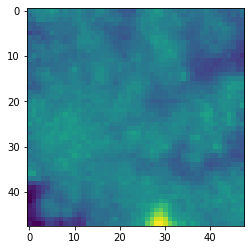

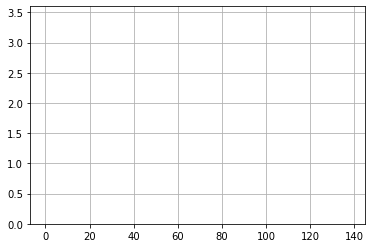

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 121] losses: (14.830116755962372, nan)


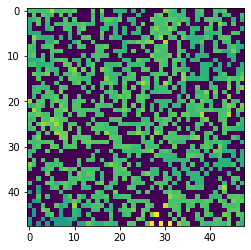

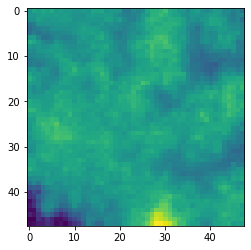

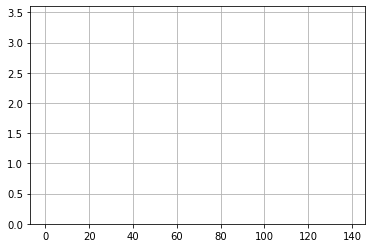

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 122] losses: (15.50601868391037, nan)


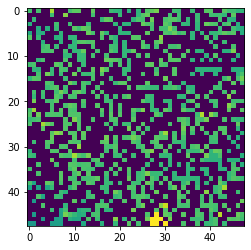

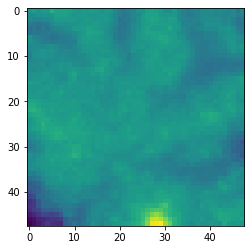

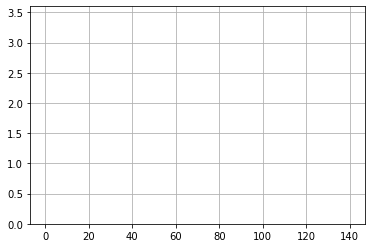

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 123] losses: (15.989024310111999, nan)


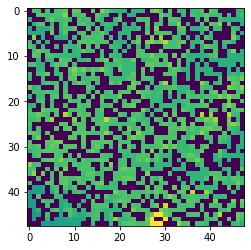

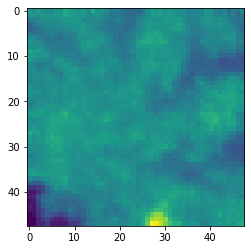

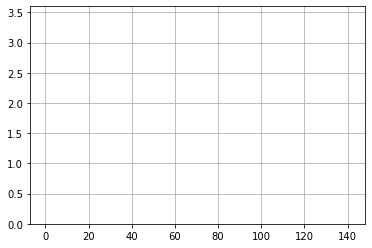

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 124] losses: (16.22485605955124, nan)


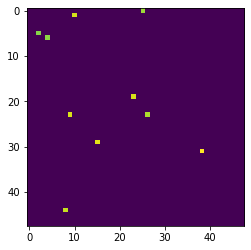

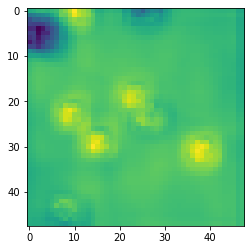

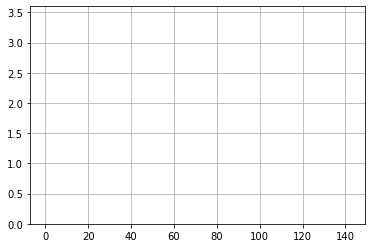

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 125] losses: (14.254182289838791, nan)


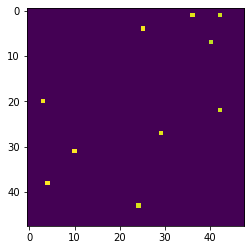

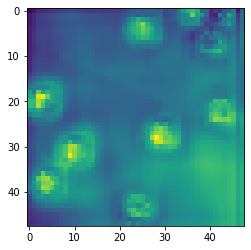

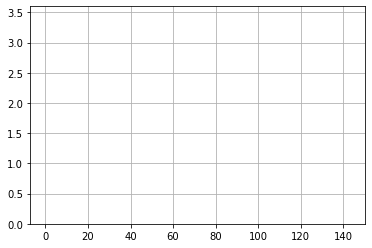

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 126] losses: (15.164215788841247, nan)


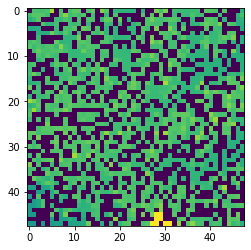

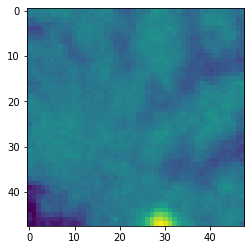

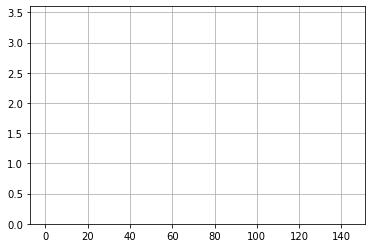

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 127] losses: (15.49969223856926, nan)


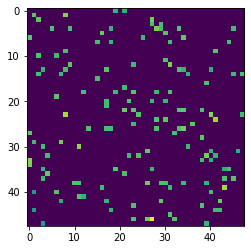

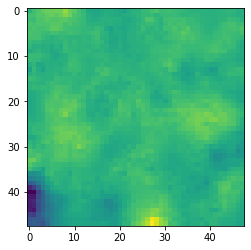

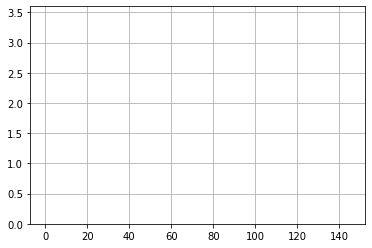

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 128] losses: (13.938310117721558, nan)


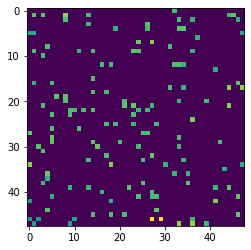

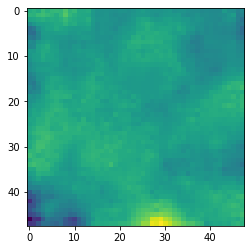

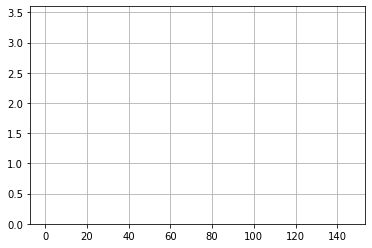

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 129] losses: (15.866896784305572, nan)


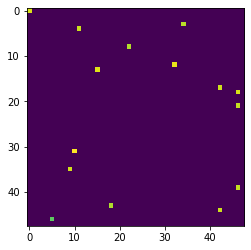

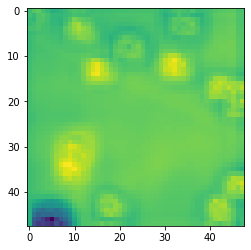

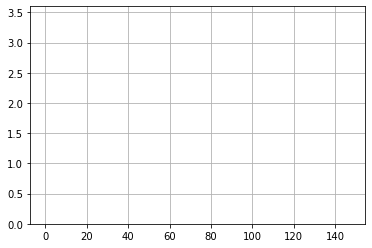

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 130] losses: (15.586449811458587, nan)


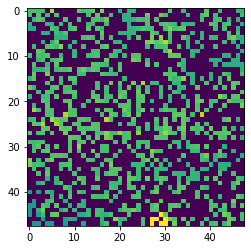

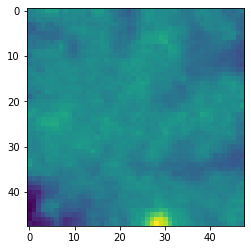

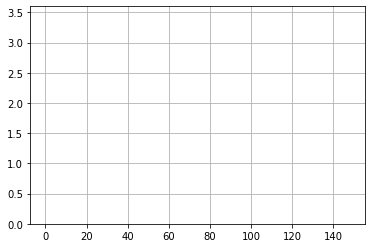

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 131] losses: (15.260583262443543, nan)


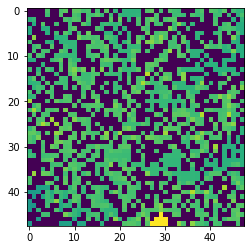

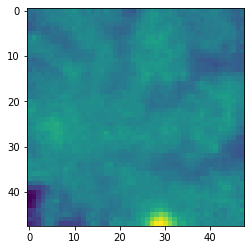

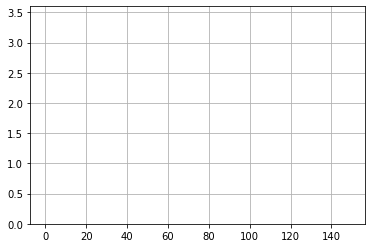

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 132] losses: (15.020813145637511, nan)


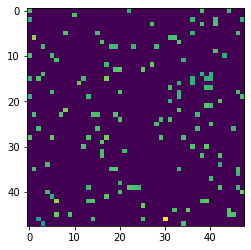

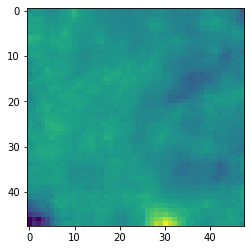

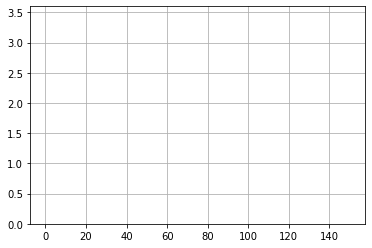

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 133] losses: (16.02309450387955, nan)


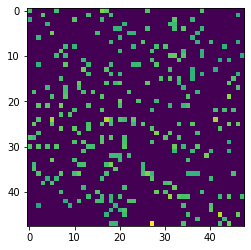

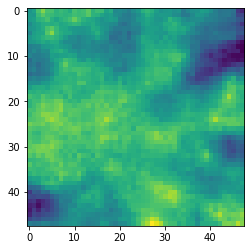

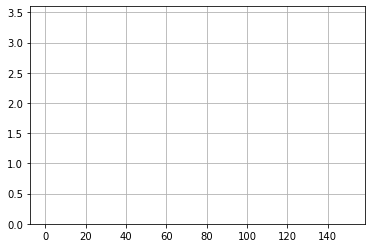

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 134] losses: (15.556866708993912, nan)


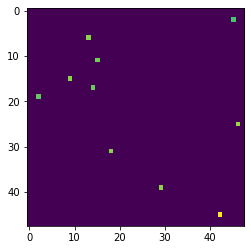

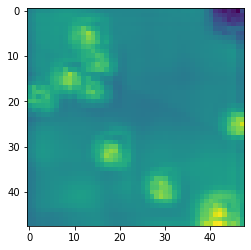

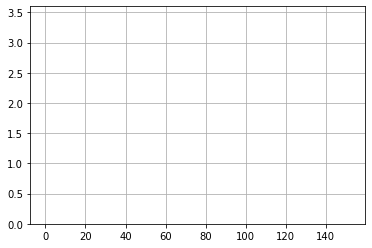

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 135] losses: (16.779541685581208, nan)


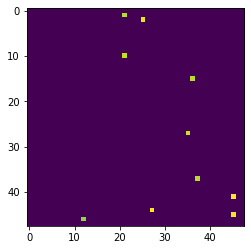

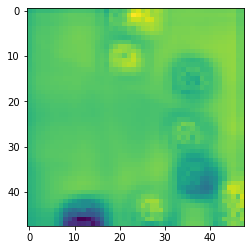

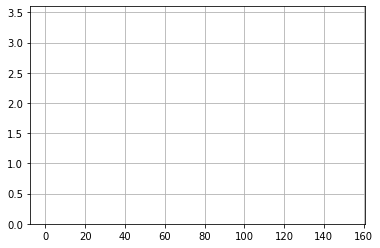

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 136] losses: (16.245099747180937, nan)


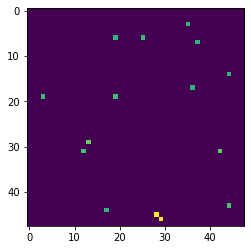

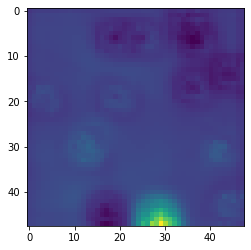

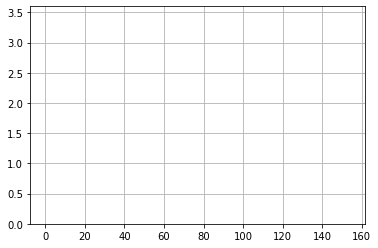

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 137] losses: (13.908897699117661, nan)


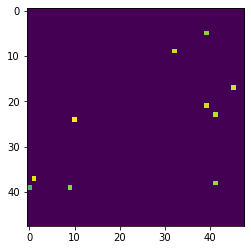

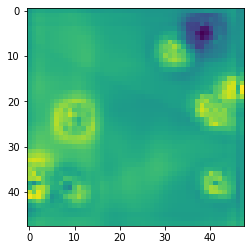

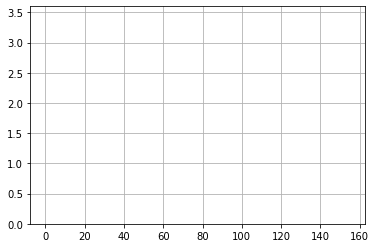

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 138] losses: (14.91648770570755, nan)


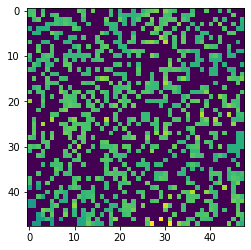

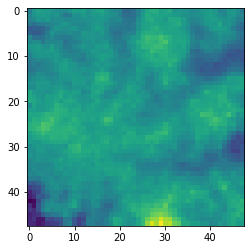

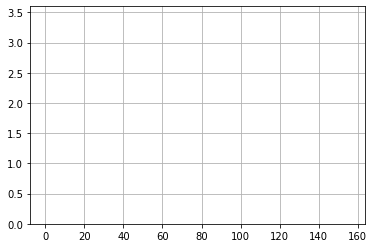

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 139] losses: (13.812793316841125, nan)


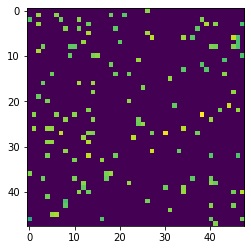

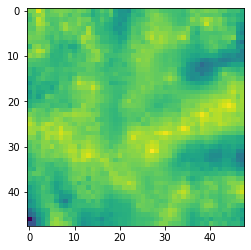

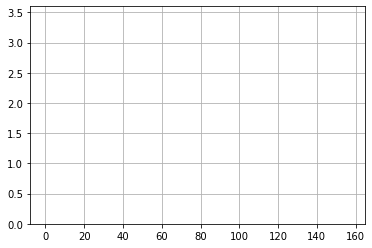

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 140] losses: (14.338366539478303, nan)


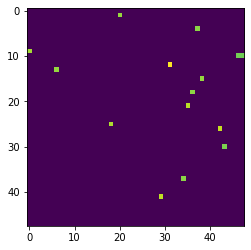

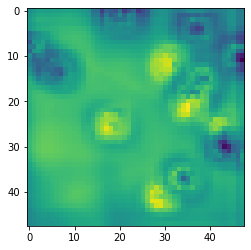

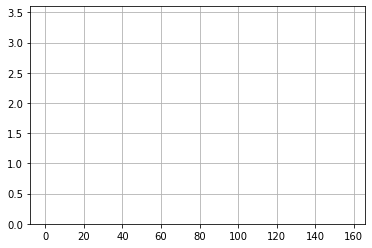

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 141] losses: (15.040213989019394, nan)


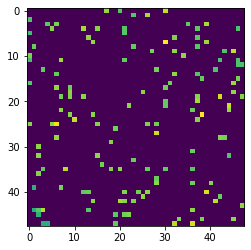

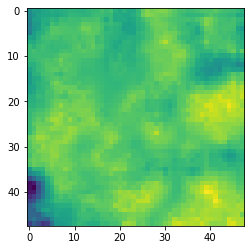

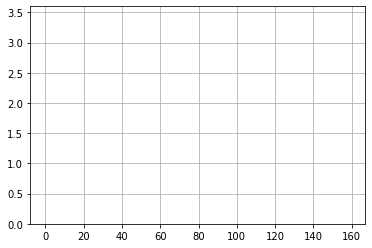

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 142] losses: (14.657399061918259, nan)


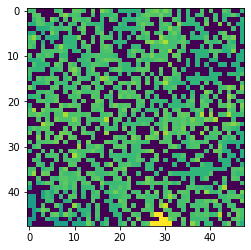

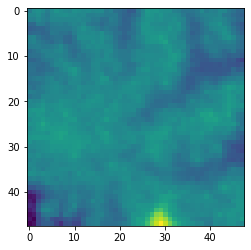

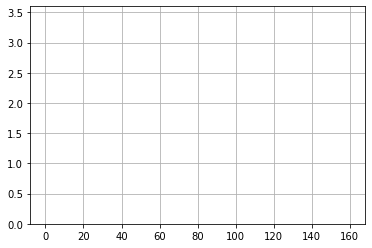

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 143] losses: (14.814479680061341, nan)


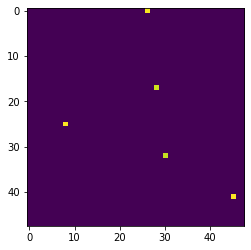

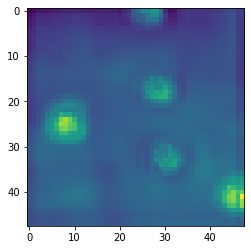

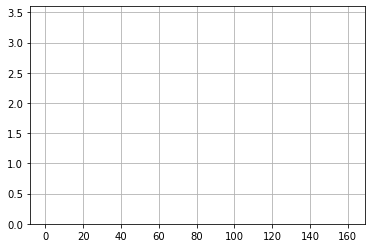

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 144] losses: (14.280376663208008, nan)


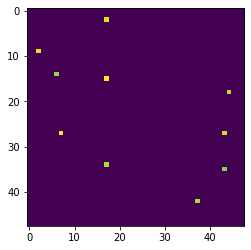

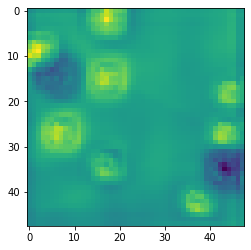

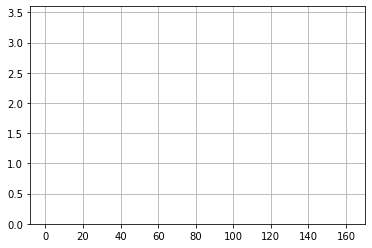

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 145] losses: (14.337512607574462, nan)


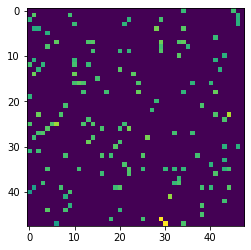

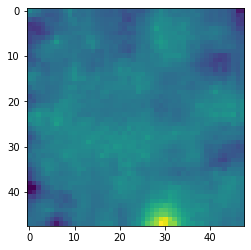

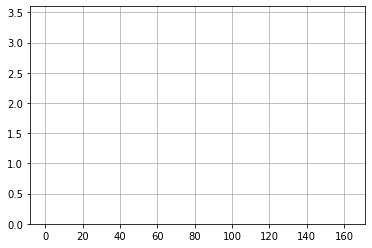

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 146] losses: (15.097407810688019, nan)


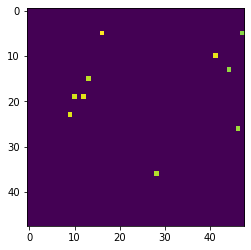

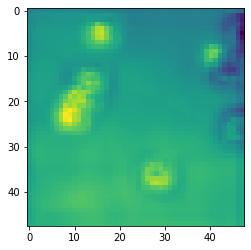

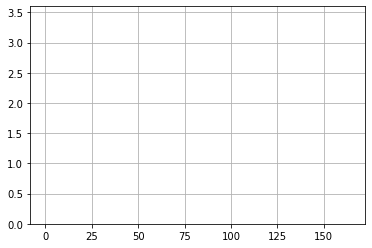

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 147] losses: (14.071884541511535, nan)


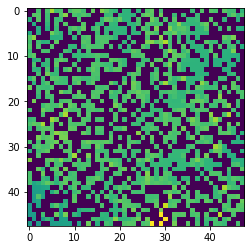

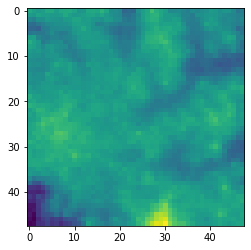

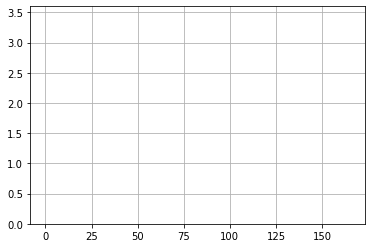

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 148] losses: (16.502839576005936, nan)


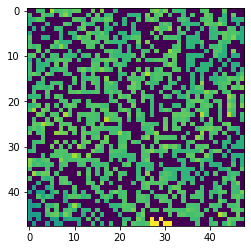

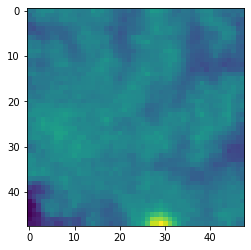

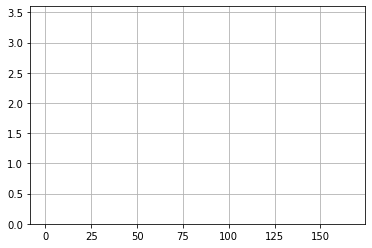

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 149] losses: (15.79360427260399, nan)


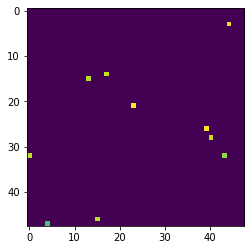

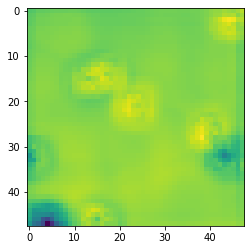

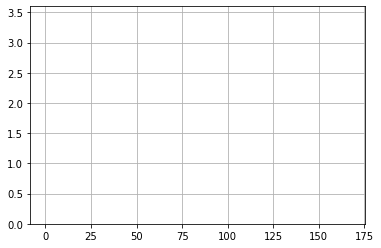

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 150] losses: (14.864040298461914, nan)


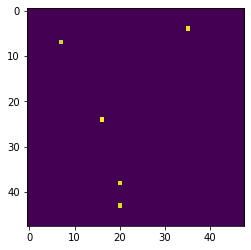

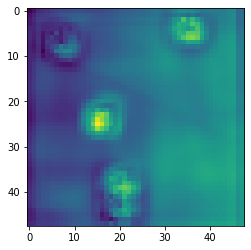

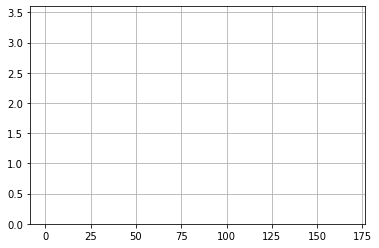

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 151] losses: (15.384303061962127, nan)


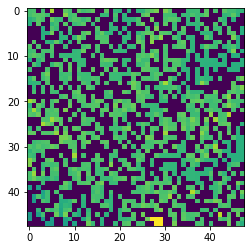

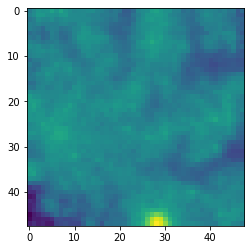

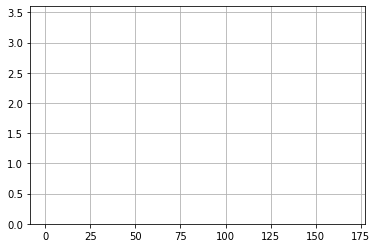

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 152] losses: (16.06175045490265, nan)


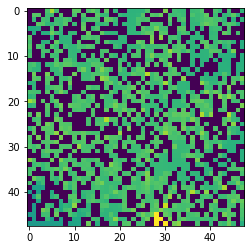

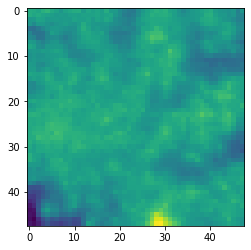

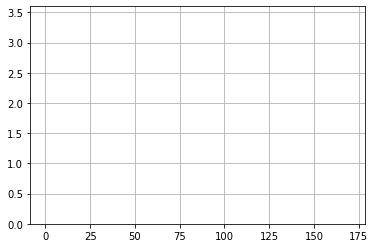

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 153] losses: (14.513307476043702, nan)


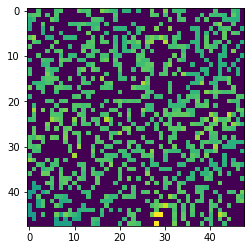

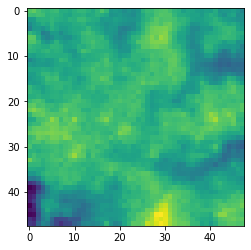

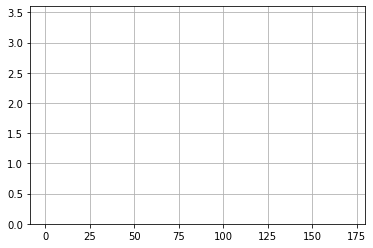

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 154] losses: (14.687900062799454, nan)


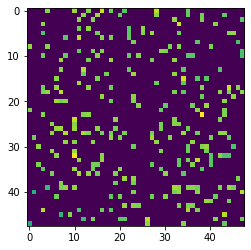

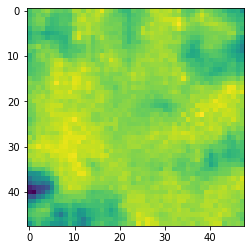

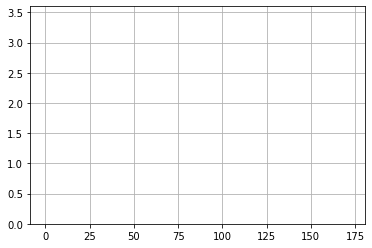

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 155] losses: (16.186571233272552, nan)


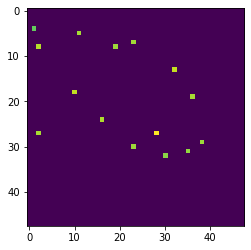

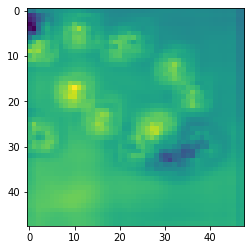

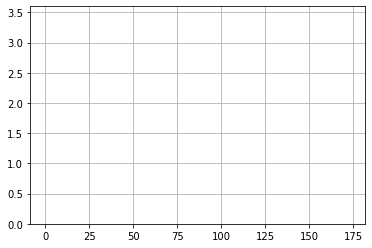

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 156] losses: (14.61253809928894, nan)


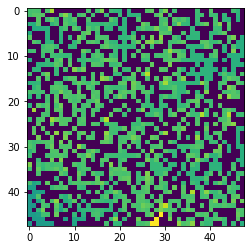

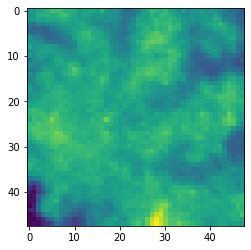

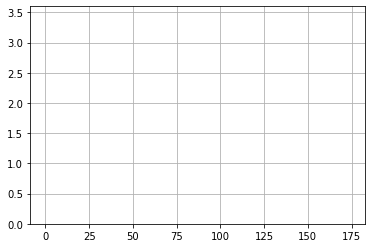

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 157] losses: (16.260589436292648, nan)


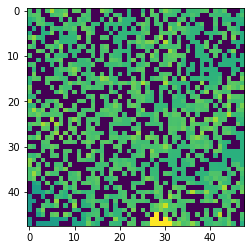

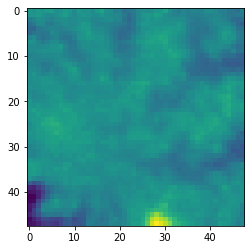

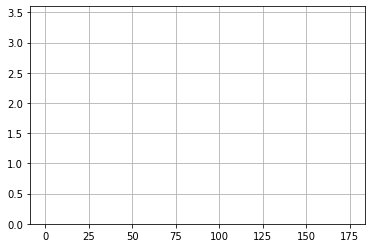

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 158] losses: (14.609103651046754, nan)


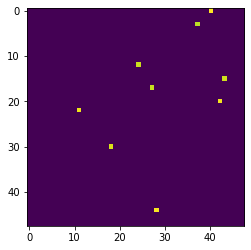

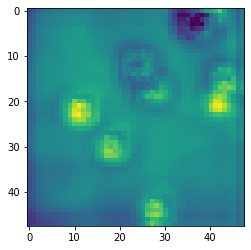

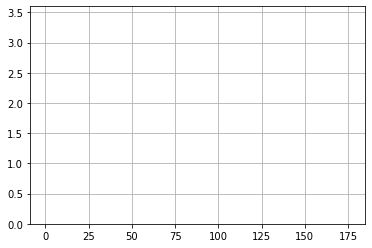

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 159] losses: (14.478747870922088, nan)


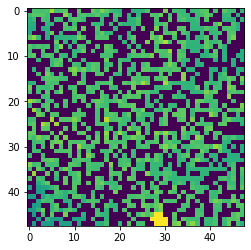

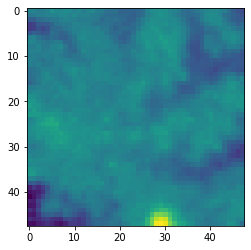

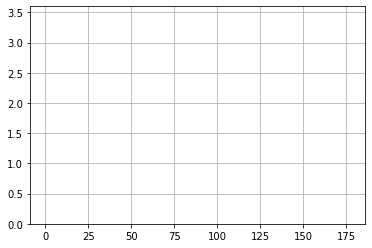

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 160] losses: (15.87626924753189, nan)


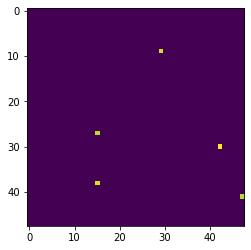

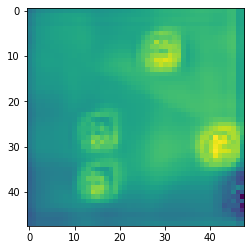

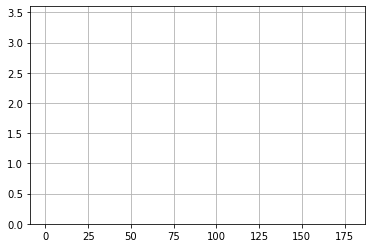

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 161] losses: (14.126794421672821, nan)


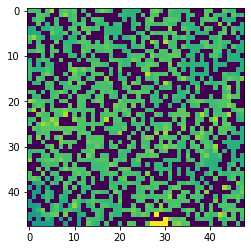

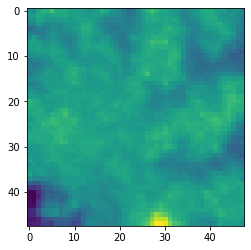

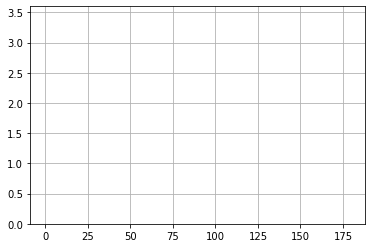

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 162] losses: (15.152521984577179, nan)


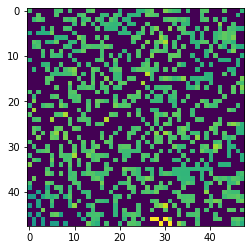

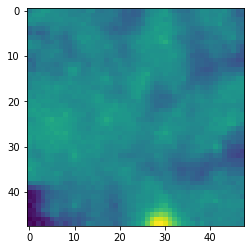

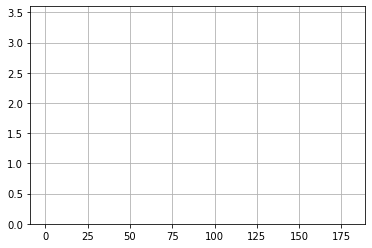

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 163] losses: (15.036643763780594, nan)


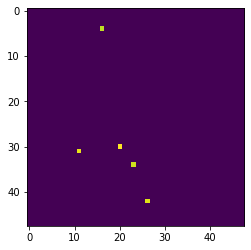

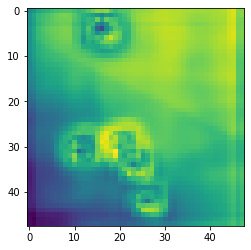

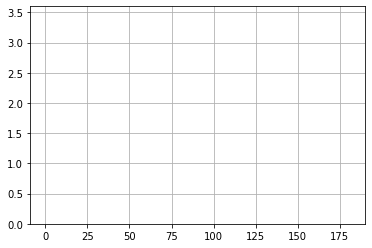

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 164] losses: (14.664870548248292, nan)


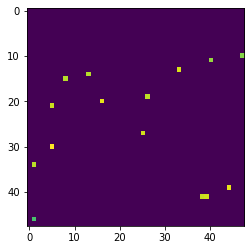

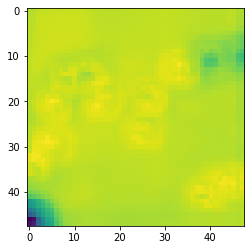

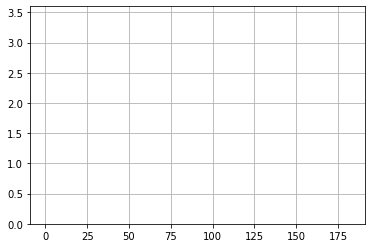

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 165] losses: (14.759003584384919, nan)


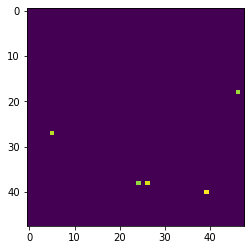

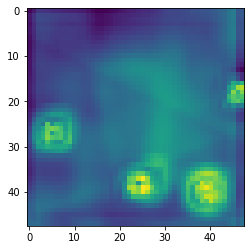

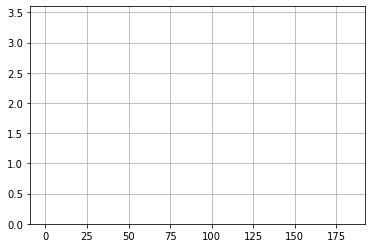

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 166] losses: (14.664870479106902, nan)


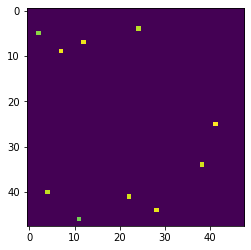

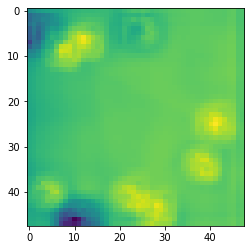

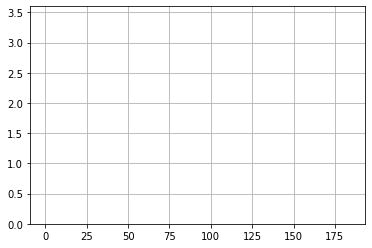

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 167] losses: (14.924647970199585, nan)


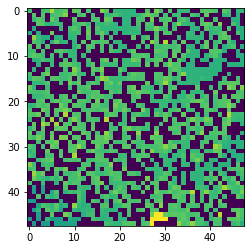

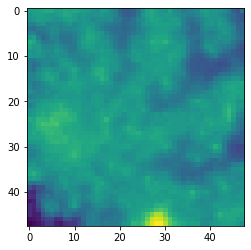

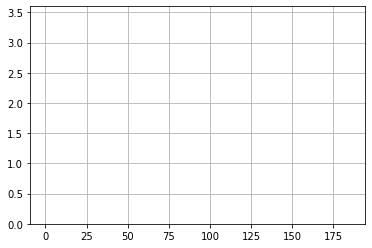

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 168] losses: (15.117986832857133, nan)


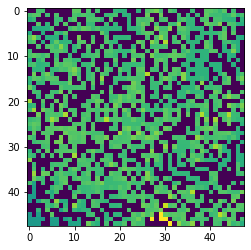

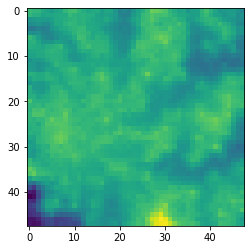

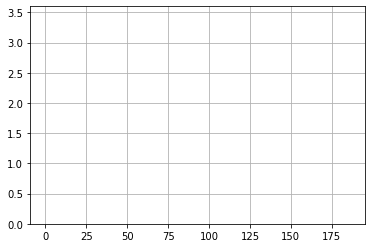

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 169] losses: (13.409745163917542, nan)


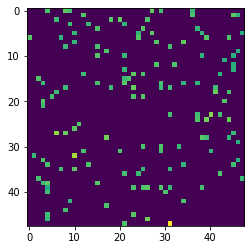

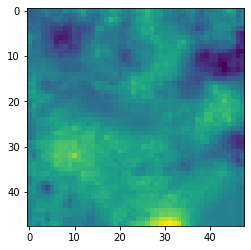

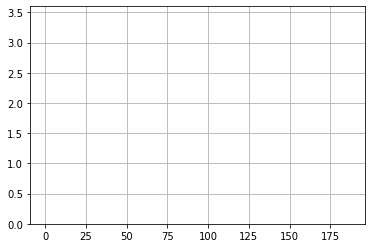

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 170] losses: (15.409300630092622, nan)


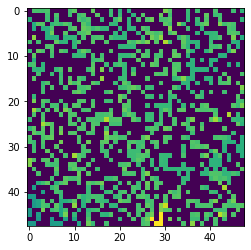

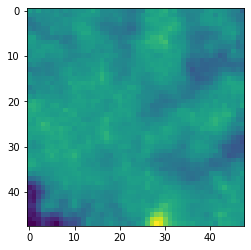

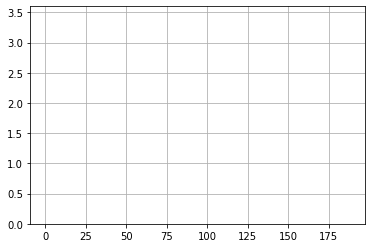

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 171] losses: (14.758541983366012, nan)


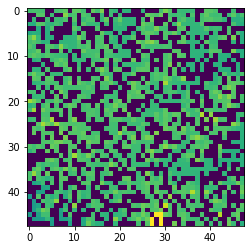

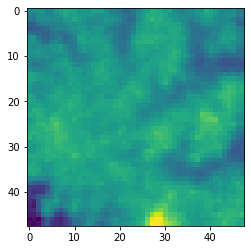

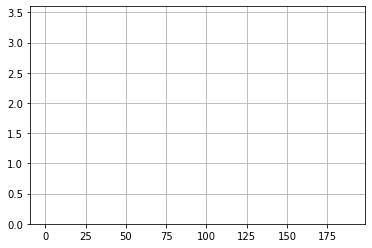

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 172] losses: (14.90735145688057, nan)


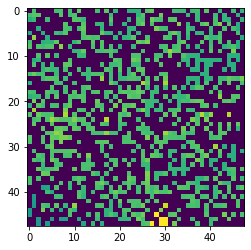

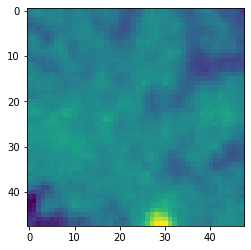

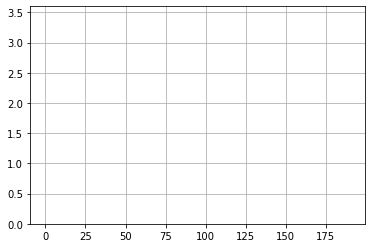

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 173] losses: (15.646127216815948, nan)


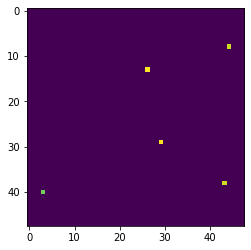

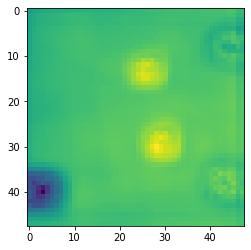

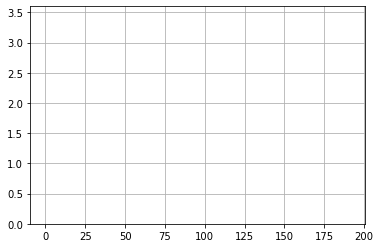

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 174] losses: (15.238888914585113, nan)


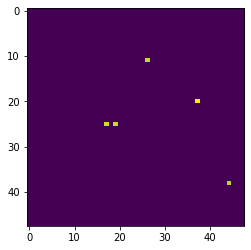

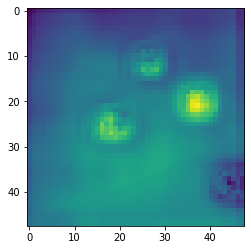

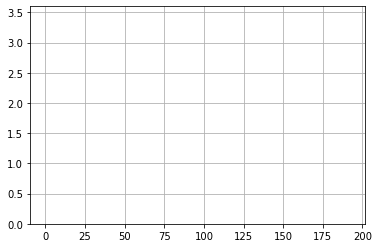

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 175] losses: (14.32217857480049, nan)


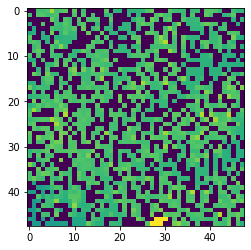

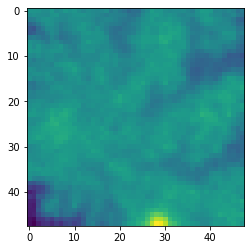

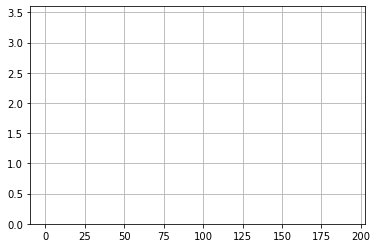

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 176] losses: (14.799423940181732, nan)


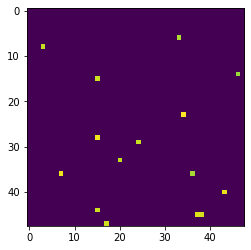

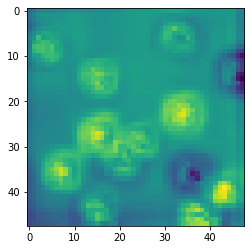

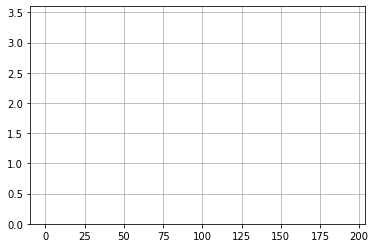

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 177] losses: (13.360708993673324, nan)


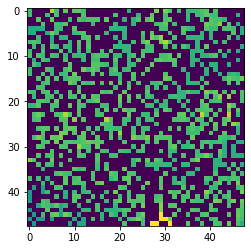

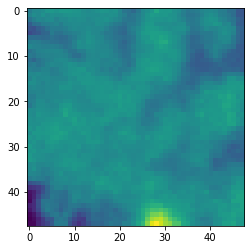

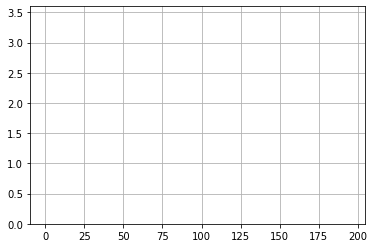

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 178] losses: (16.135567477941514, nan)


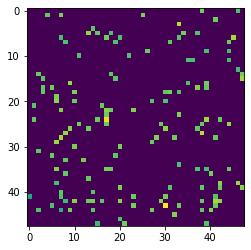

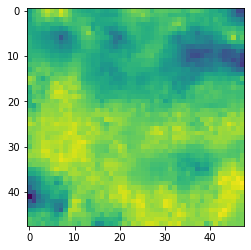

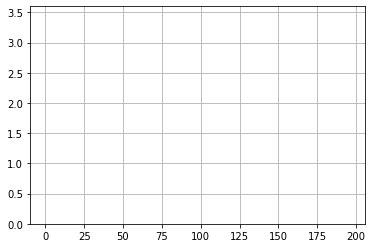

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 179] losses: (14.686918833255767, nan)


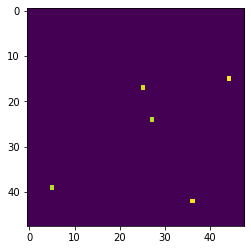

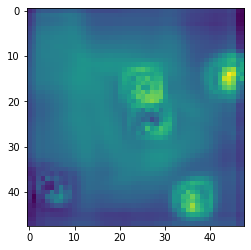

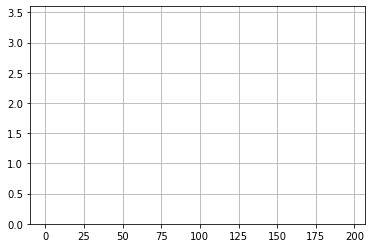

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 180] losses: (14.820488599538804, nan)


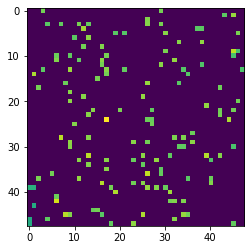

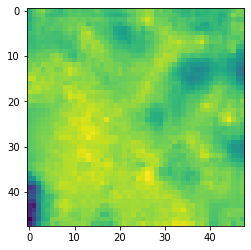

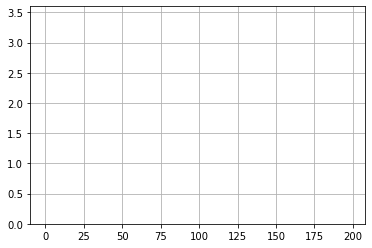

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 181] losses: (14.557403070926666, nan)


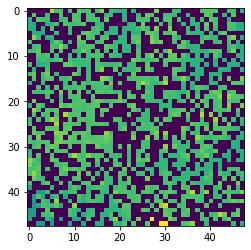

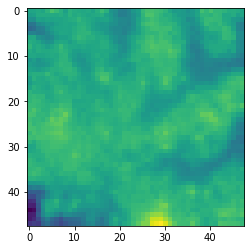

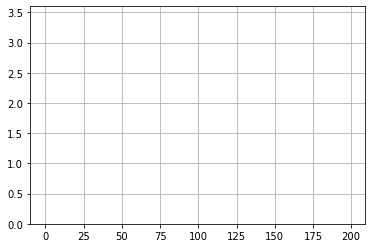

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 182] losses: (15.000074925422668, nan)


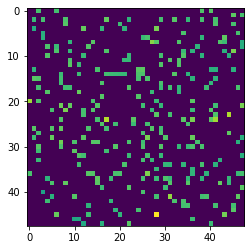

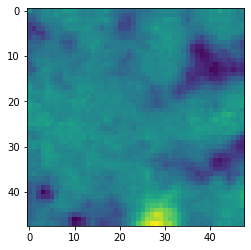

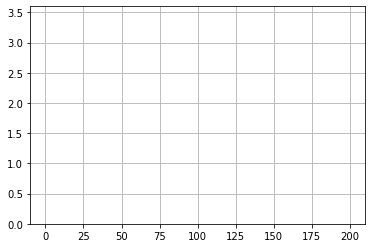

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 183] losses: (15.077315819263458, nan)


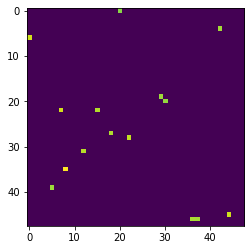

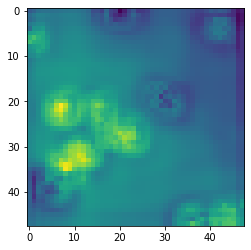

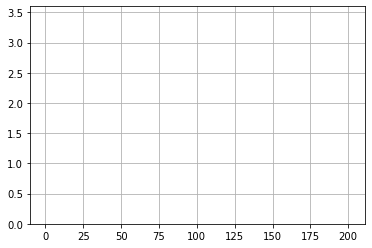

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 184] losses: (14.388590593338012, nan)


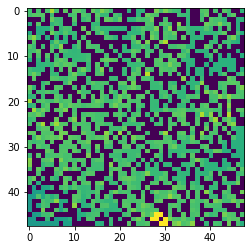

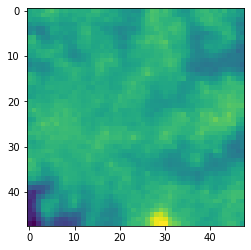

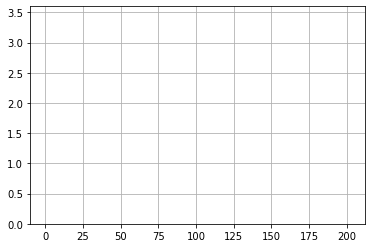

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 185] losses: (15.245306940078736, nan)


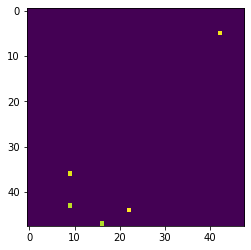

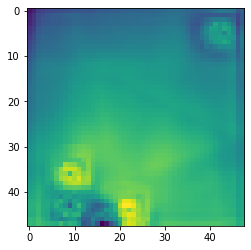

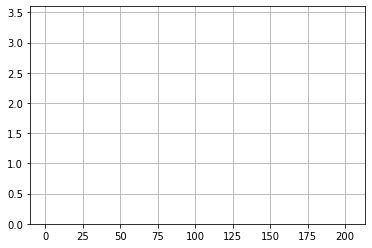

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 186] losses: (13.07391234755516, nan)


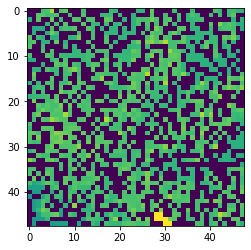

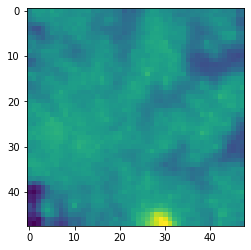

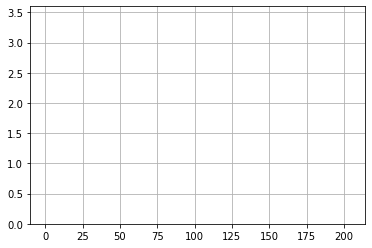

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 187] losses: (13.79697983622551, nan)


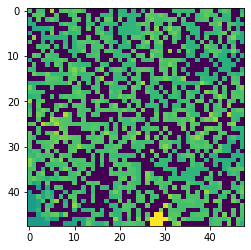

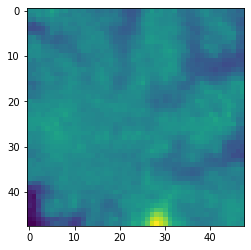

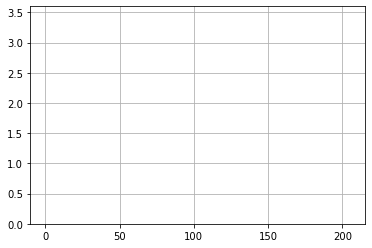

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 188] losses: (14.35467812538147, nan)


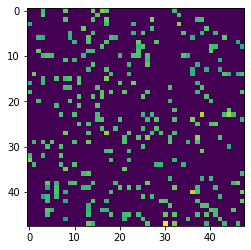

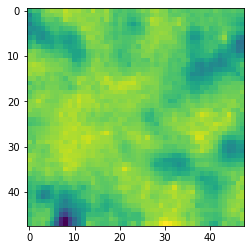

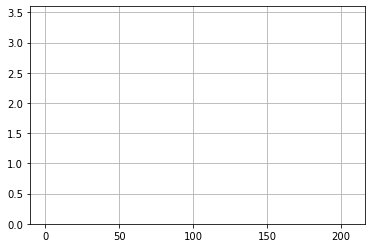

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 189] losses: (15.232438852787018, nan)


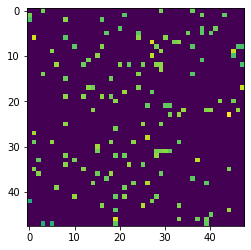

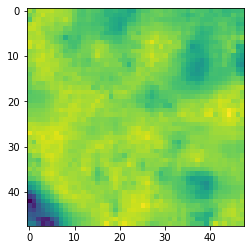

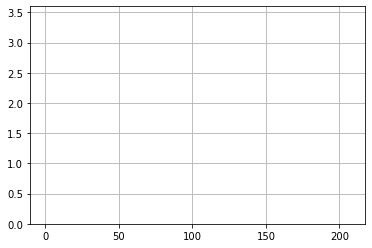

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 190] losses: (14.887114143371582, nan)


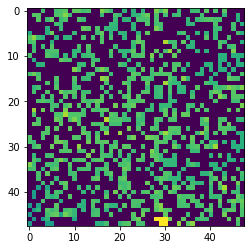

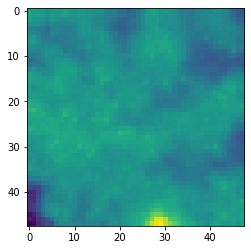

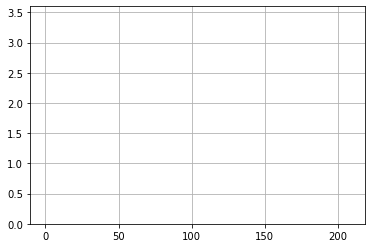

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 191] losses: (15.0090691614151, nan)


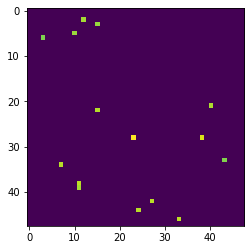

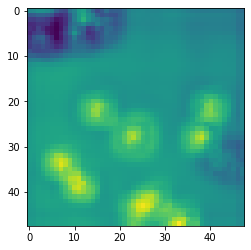

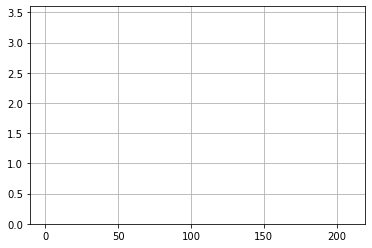

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 192] losses: (15.806937954425813, nan)


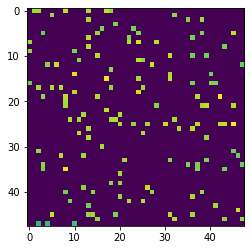

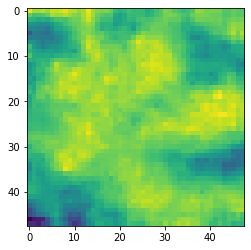

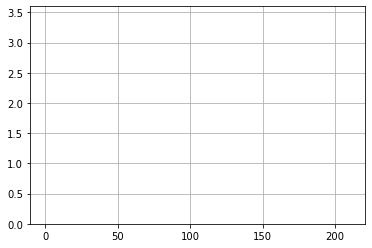

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 193] losses: (14.605908141136169, nan)


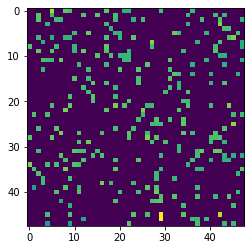

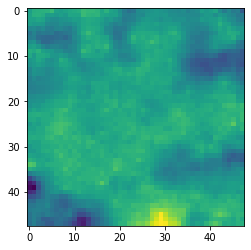

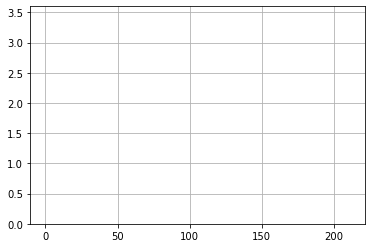

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 194] losses: (14.75976236820221, nan)


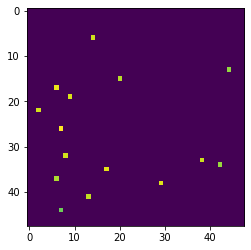

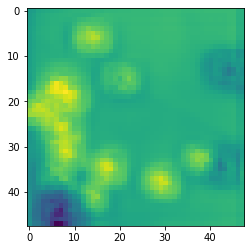

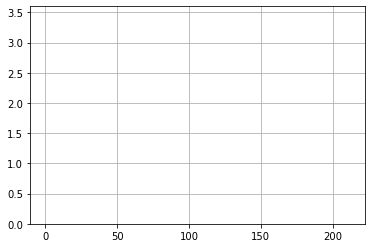

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 195] losses: (14.105077800750733, nan)


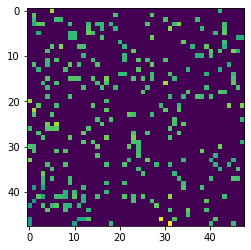

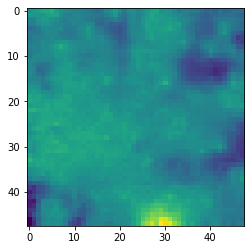

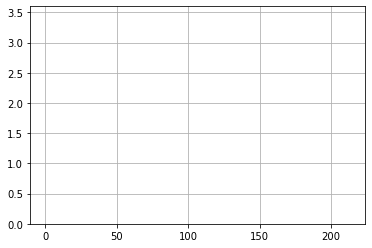

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 196] losses: (16.52040637612343, nan)


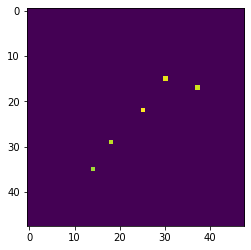

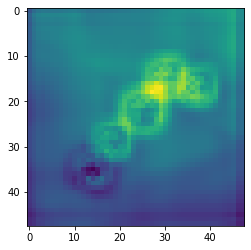

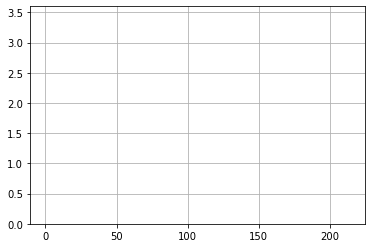

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 197] losses: (13.945737495422364, nan)


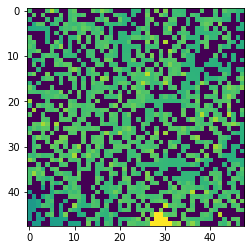

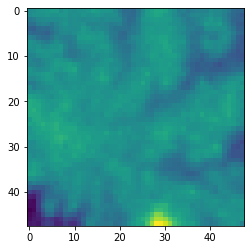

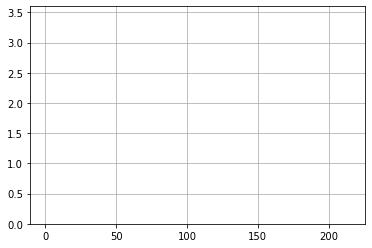

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 198] losses: (14.168746482133866, nan)


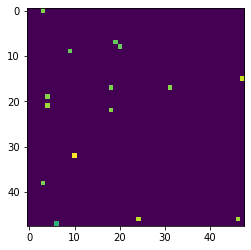

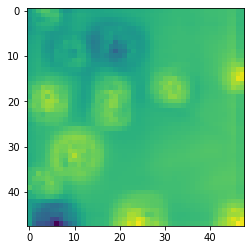

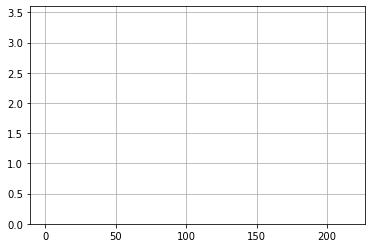

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 199] losses: (14.190839220285415, nan)


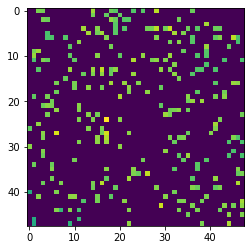

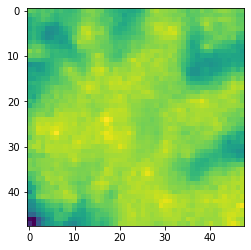

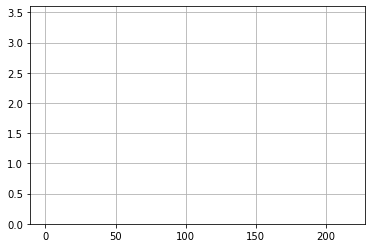

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 200] losses: (13.166683213710785, nan)


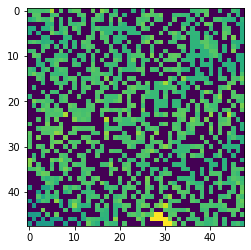

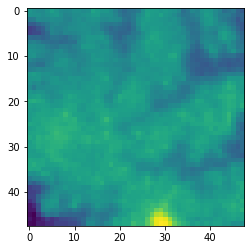

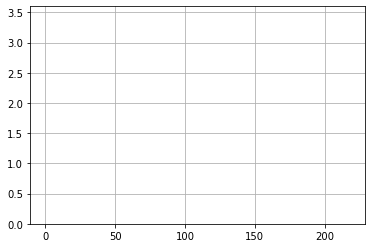

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 201] losses: (14.5753990483284, nan)


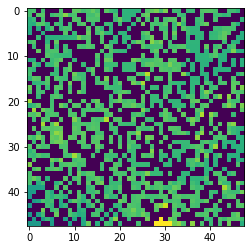

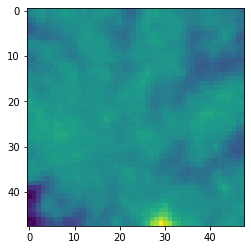

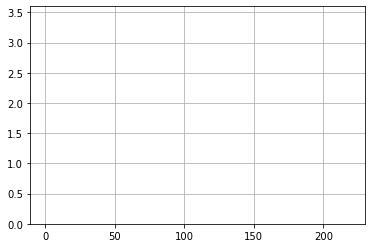

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 202] losses: (14.18381326198578, nan)


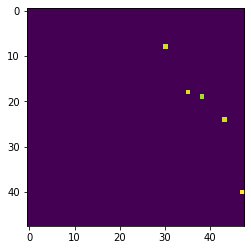

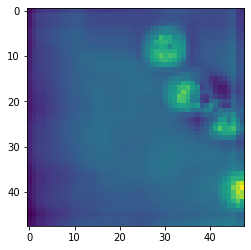

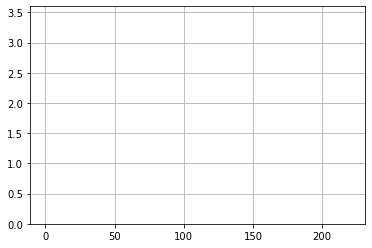

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 203] losses: (16.28509068250656, nan)


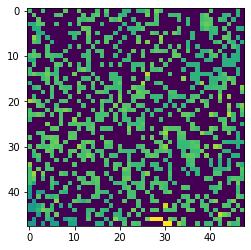

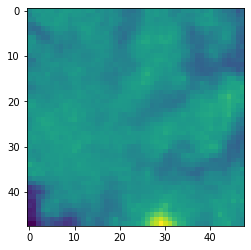

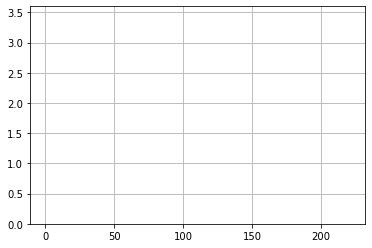

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 204] losses: (14.065667361021042, nan)


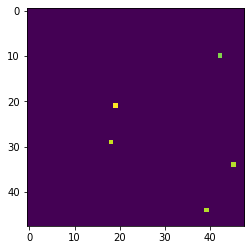

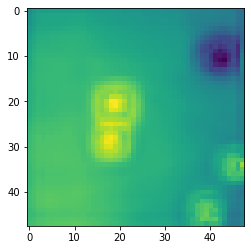

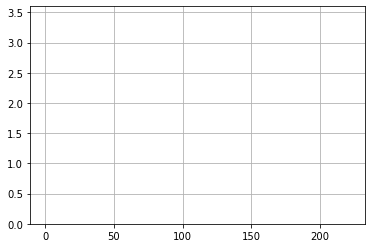

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 205] losses: (14.454801211357116, nan)


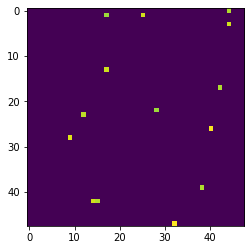

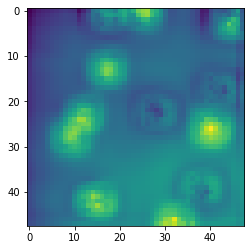

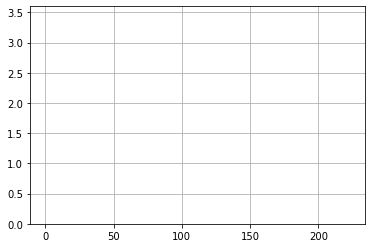

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 206] losses: (13.883009788990021, nan)


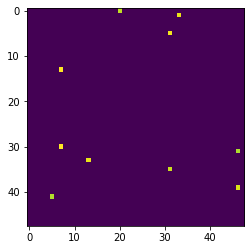

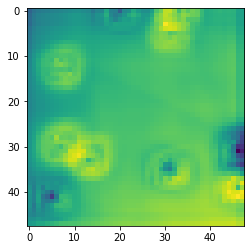

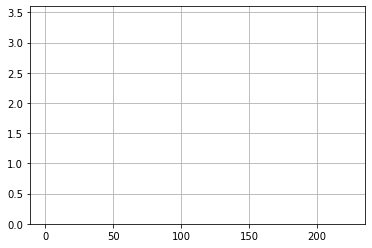

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 207] losses: (13.735410214662553, nan)


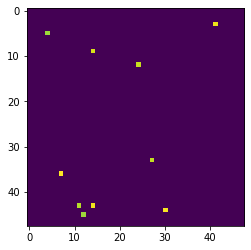

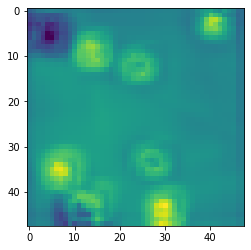

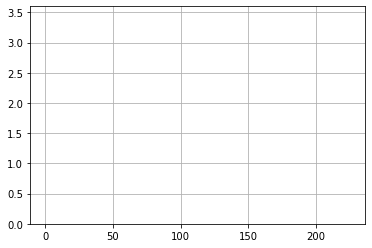

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 208] losses: (13.930240510702133, nan)


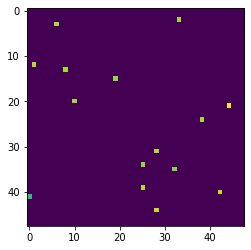

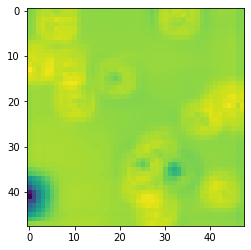

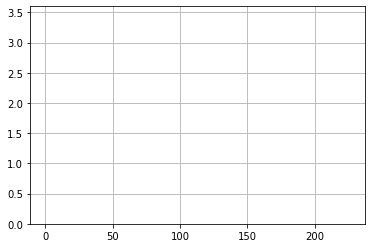

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 209] losses: (15.01100997209549, nan)


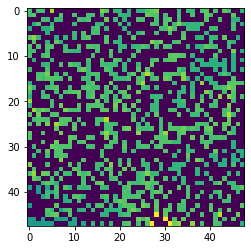

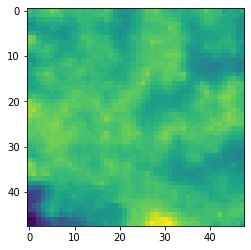

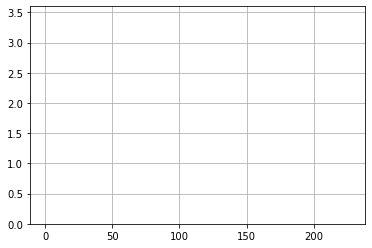

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 210] losses: (15.227799723148346, nan)


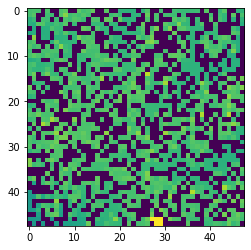

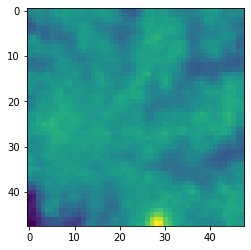

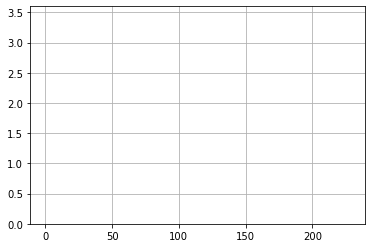

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 211] losses: (14.125160009860993, nan)


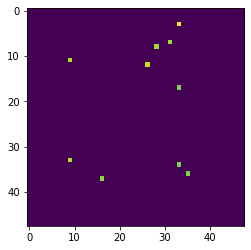

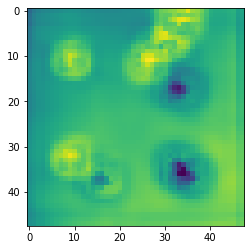

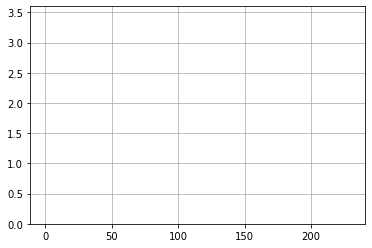

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 212] losses: (13.821070513725282, nan)


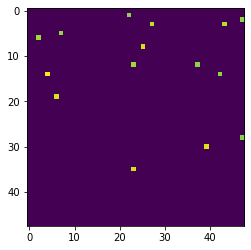

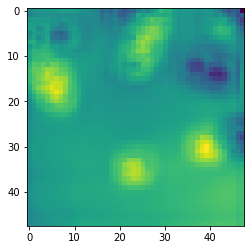

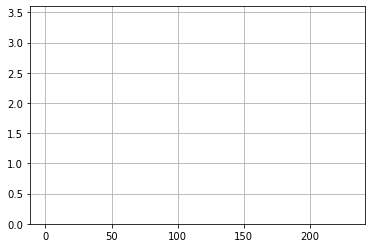

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 213] losses: (14.950887370109559, nan)


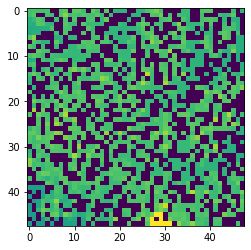

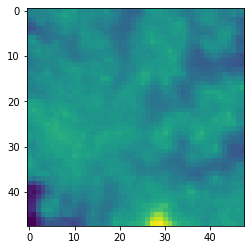

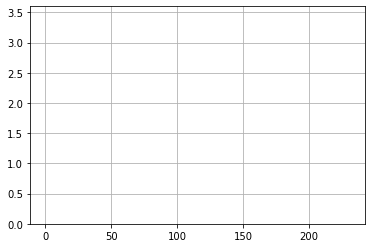

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 214] losses: (14.408649178743362, nan)


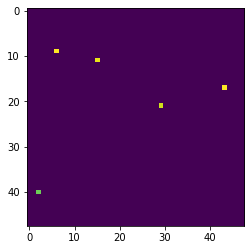

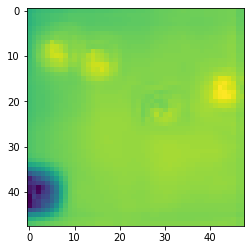

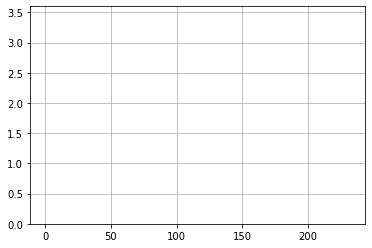

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 215] losses: (14.65848030090332, nan)


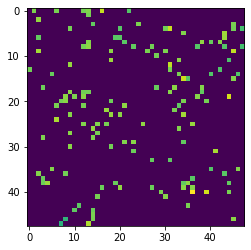

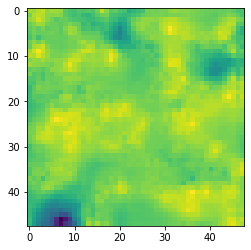

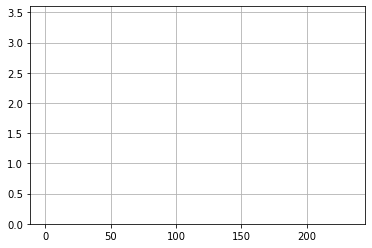

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 216] losses: (13.731568524837494, nan)


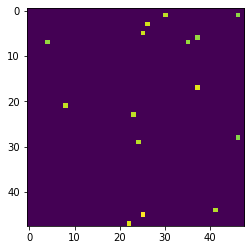

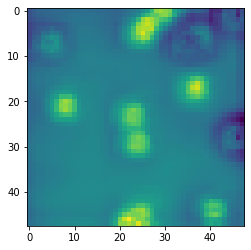

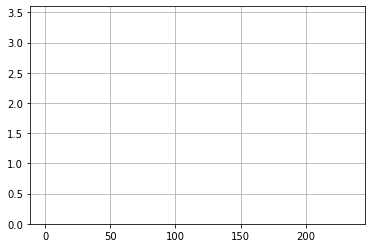

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 217] losses: (13.574345424175263, nan)


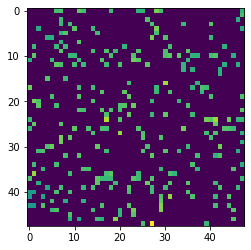

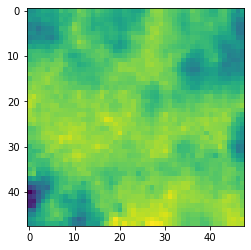

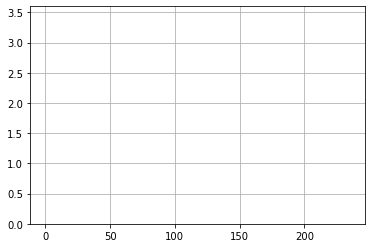

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 218] losses: (14.922160762548447, nan)


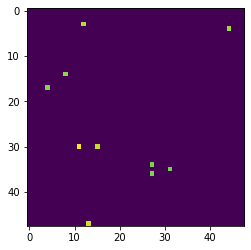

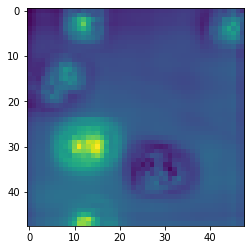

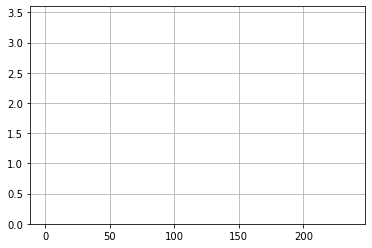

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 219] losses: (14.185249226093292, nan)


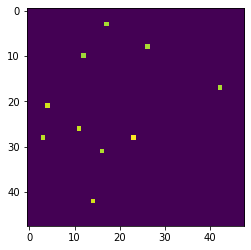

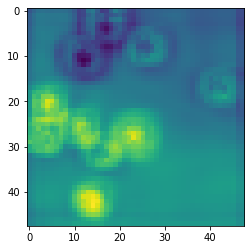

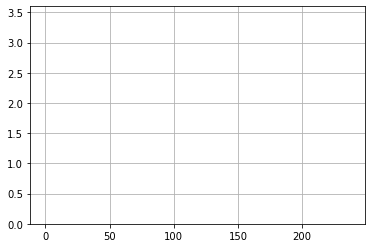

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 220] losses: (13.824571664333343, nan)


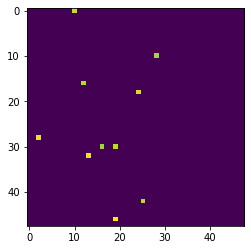

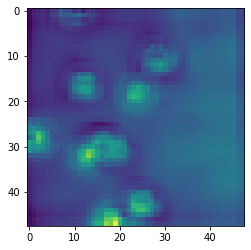

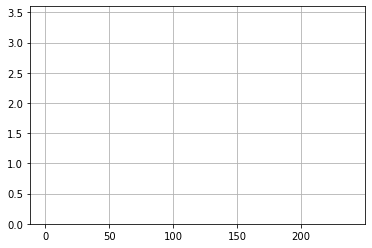

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 221] losses: (14.261397321224212, nan)


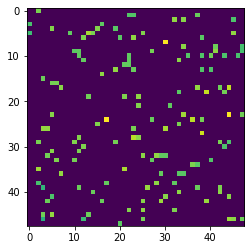

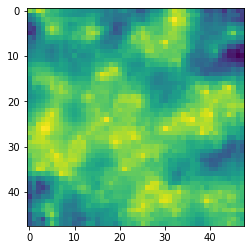

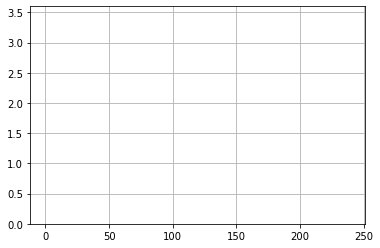

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 222] losses: (14.185176718235017, nan)


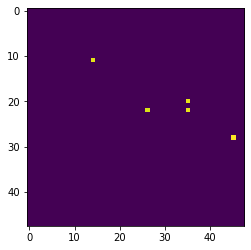

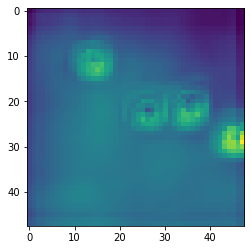

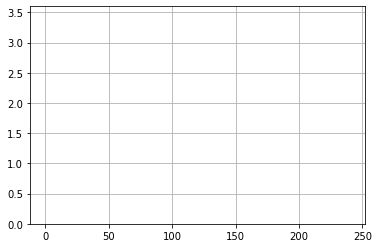

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 223] losses: (15.48755126953125, nan)


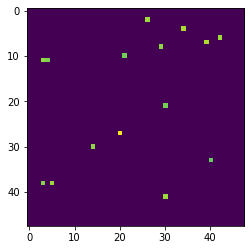

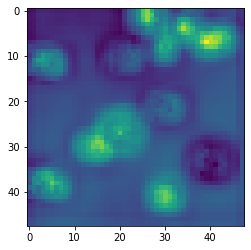

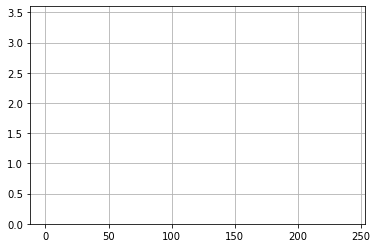

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 224] losses: (14.443260675668716, nan)


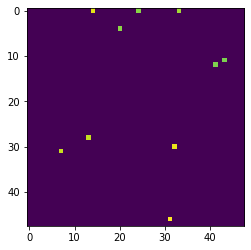

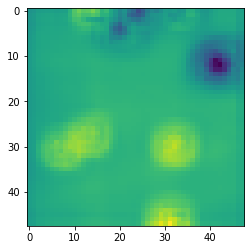

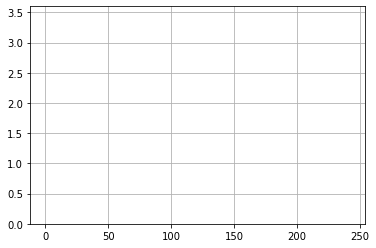

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 225] losses: (14.529034773111343, nan)


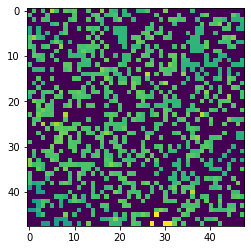

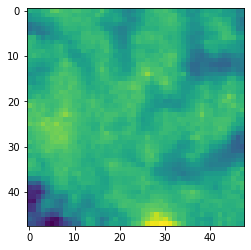

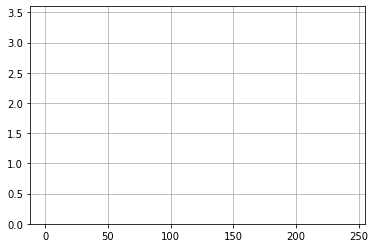

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 226] losses: (15.13442040681839, nan)


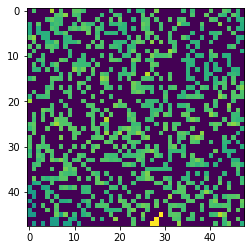

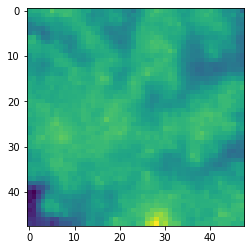

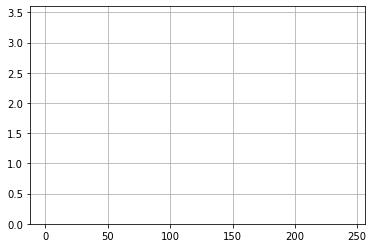

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 227] losses: (13.849620468616486, nan)


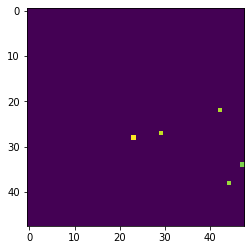

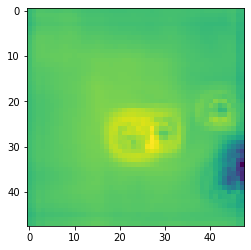

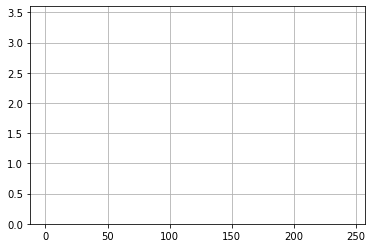

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 228] losses: (13.762511129379272, nan)


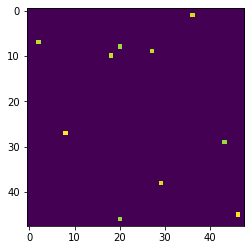

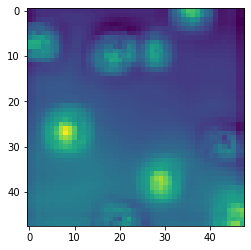

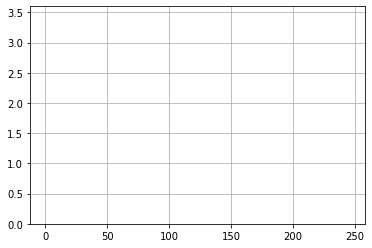

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 229] losses: (14.394253107309341, nan)


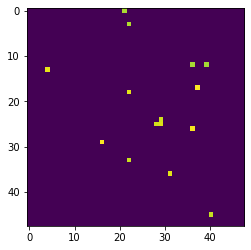

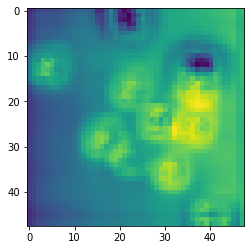

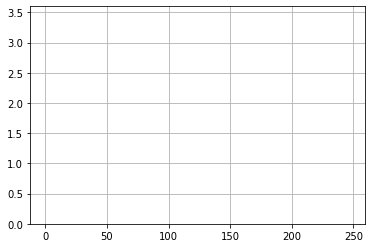

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 230] losses: (14.842914102077485, nan)


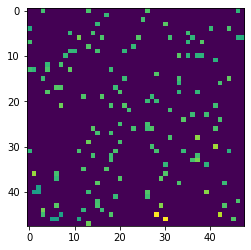

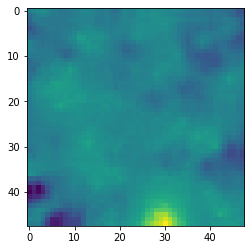

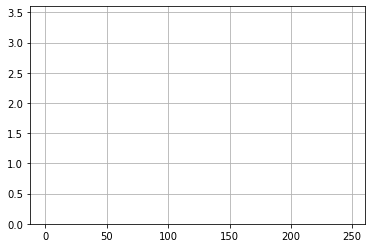

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 231] losses: (14.809066705703735, nan)


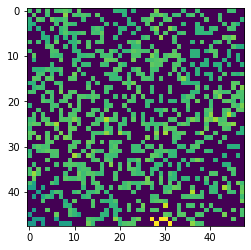

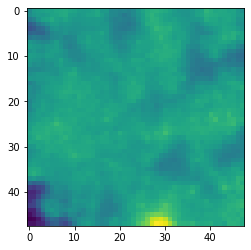

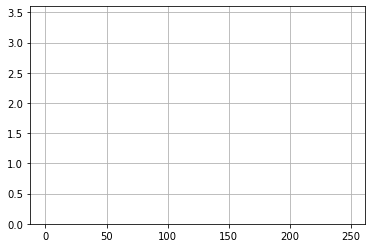

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 232] losses: (14.346327723264695, nan)


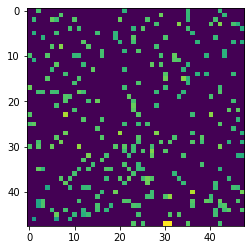

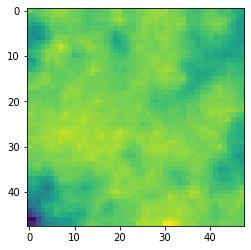

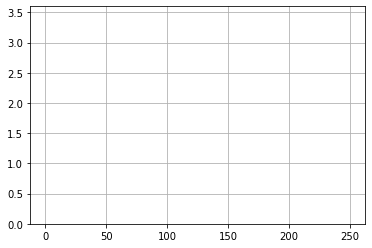

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 233] losses: (13.546126365661621, nan)


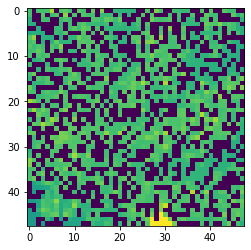

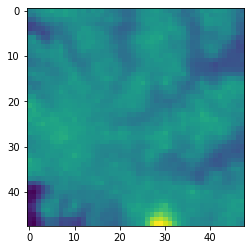

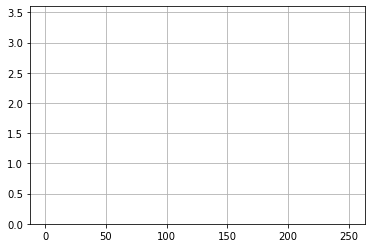

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 234] losses: (13.947903854846954, nan)


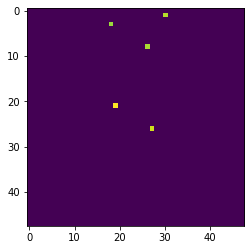

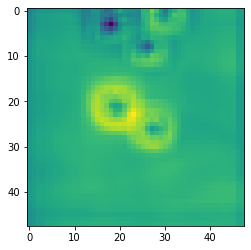

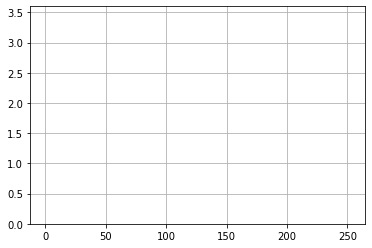

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 235] losses: (14.732310742139816, nan)


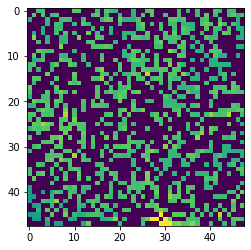

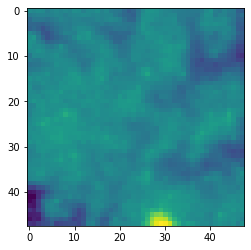

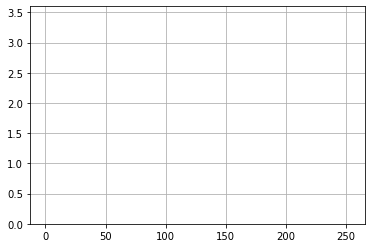

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 236] losses: (13.712970683574676, nan)


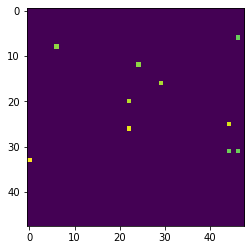

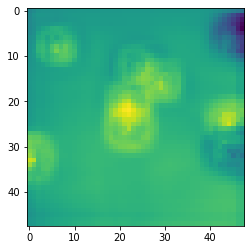

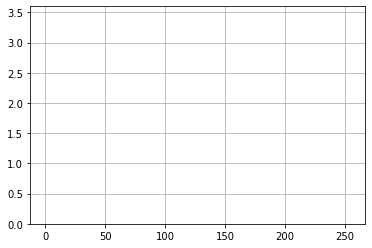

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 237] losses: (13.383961466550828, nan)


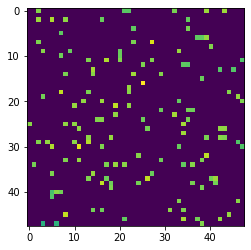

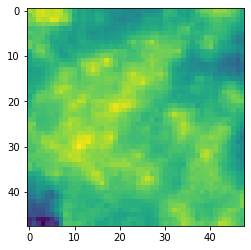

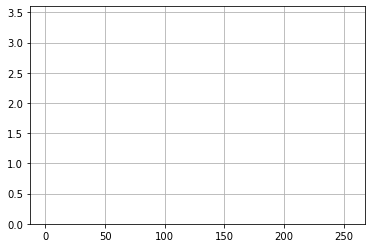

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 238] losses: (14.575911809206008, nan)


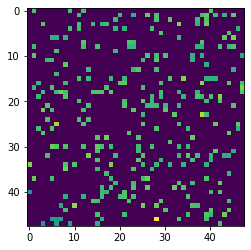

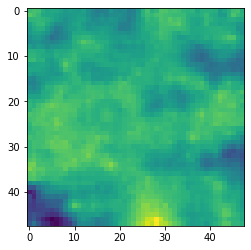

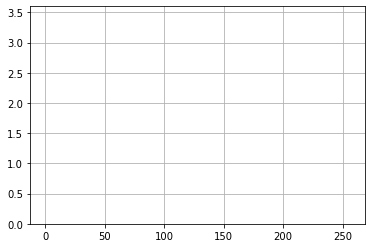

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 239] losses: (14.514462327957153, nan)


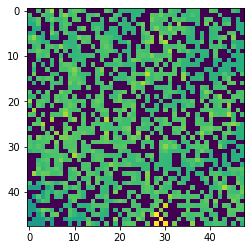

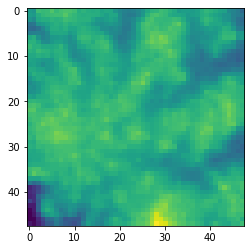

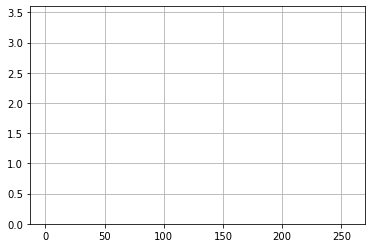

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 240] losses: (15.042882137298584, nan)


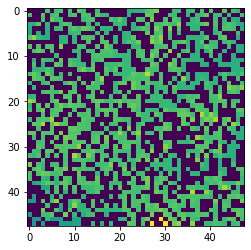

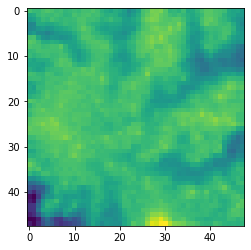

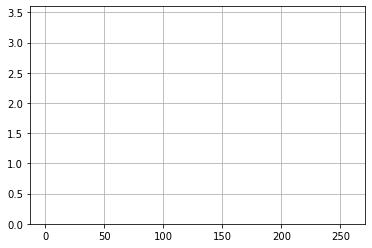

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 241] losses: (13.378677651882171, nan)


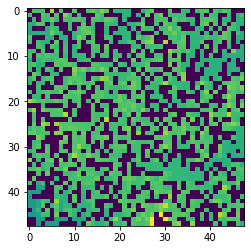

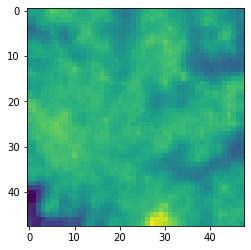

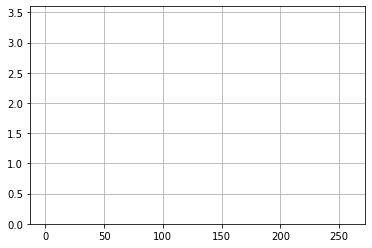

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 242] losses: (14.020178668498993, nan)


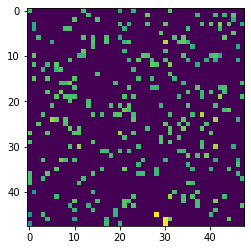

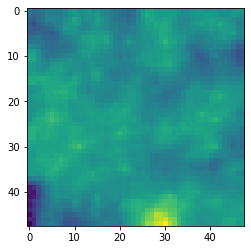

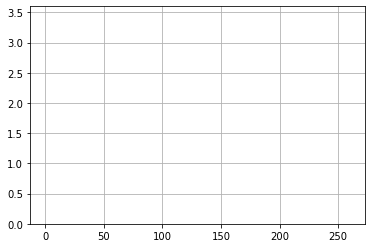

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 243] losses: (14.746104115247727, nan)


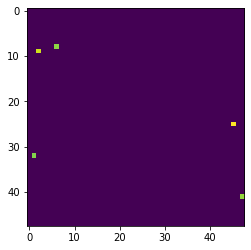

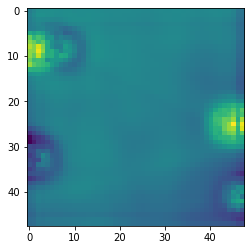

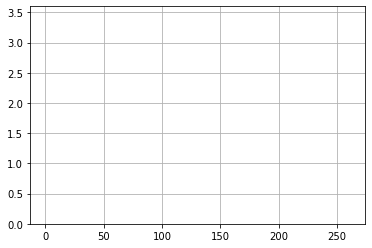

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 244] losses: (15.321683218479157, nan)


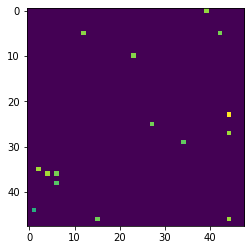

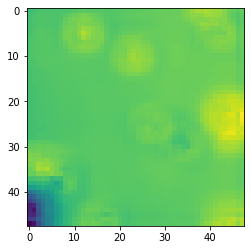

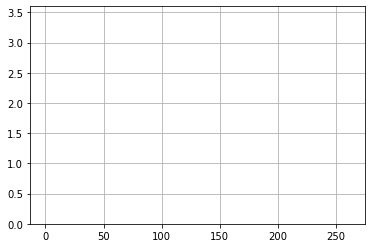

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 245] losses: (13.808497066497802, nan)


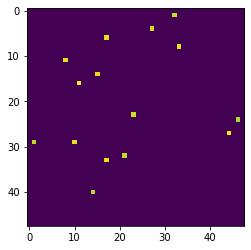

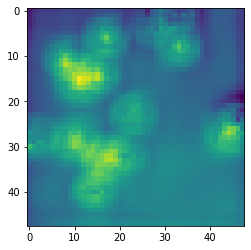

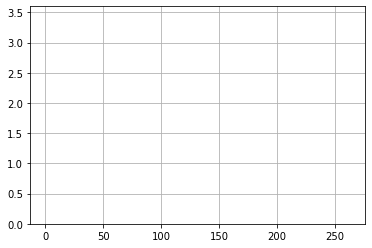

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 246] losses: (14.40844497203827, nan)


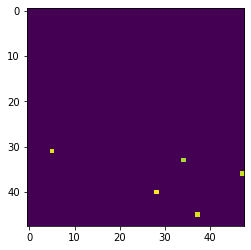

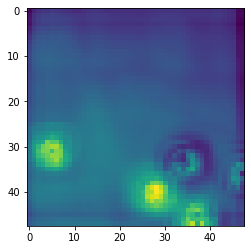

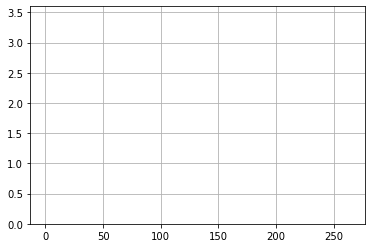

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 247] losses: (13.925357263088227, nan)


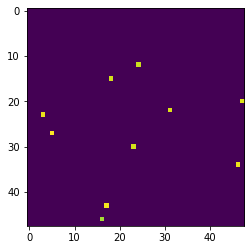

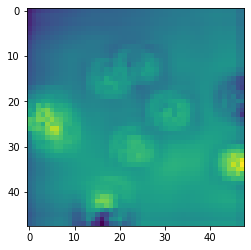

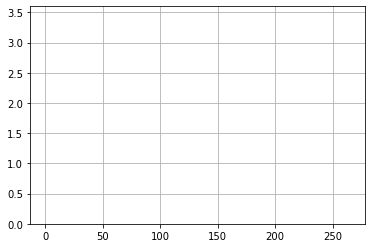

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 248] losses: (13.777931456565858, nan)


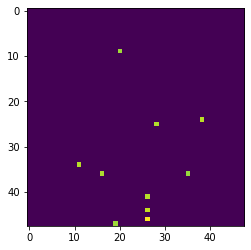

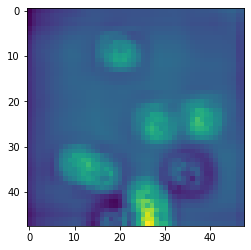

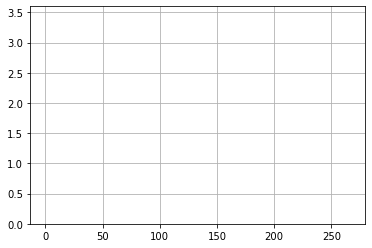

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 249] losses: (13.88098109960556, nan)


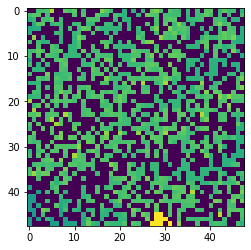

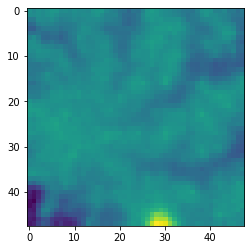

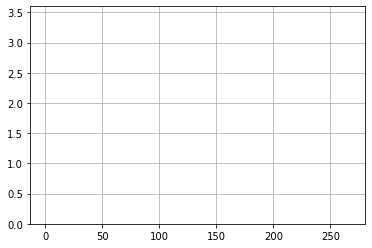

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 250] losses: (15.2358904838562, nan)


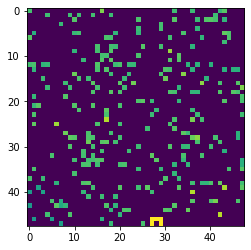

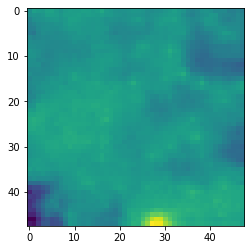

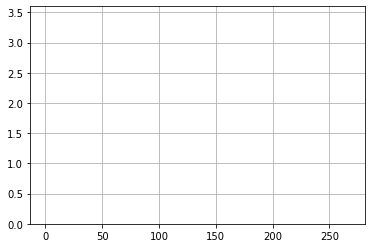

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 251] losses: (14.679118733406067, nan)


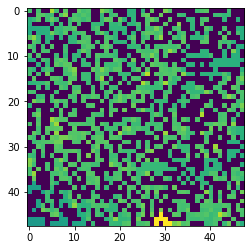

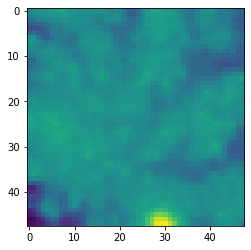

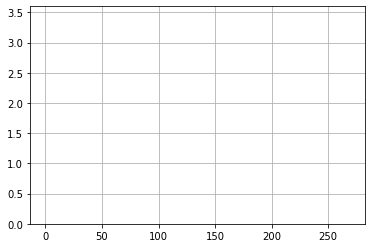

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 252] losses: (14.768718348741531, nan)


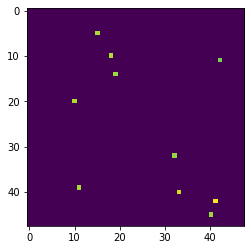

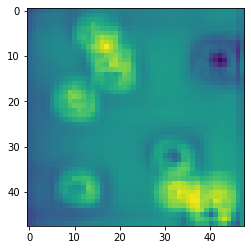

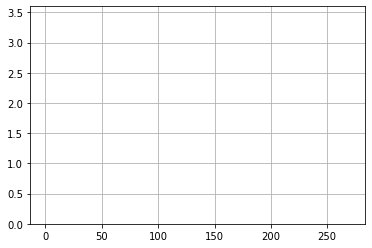

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 253] losses: (14.224561578035354, nan)


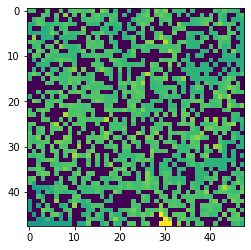

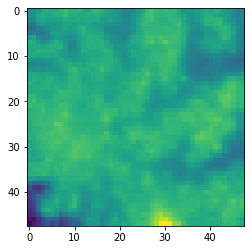

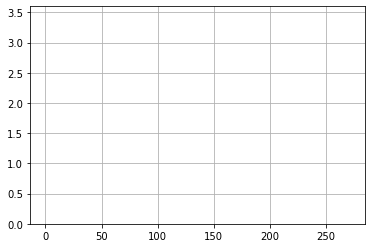

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 254] losses: (14.097461056709289, nan)


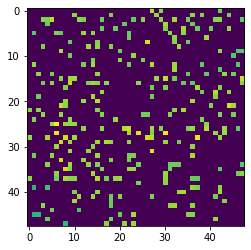

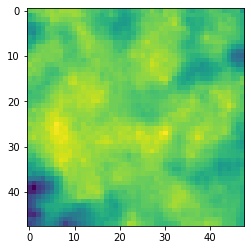

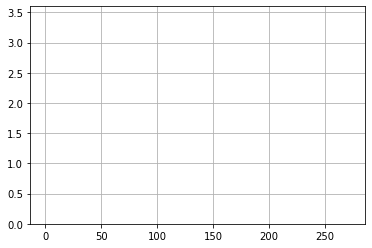

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 255] losses: (13.576027889251709, nan)


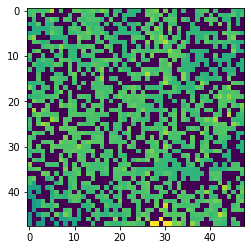

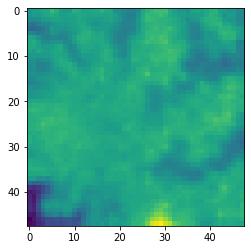

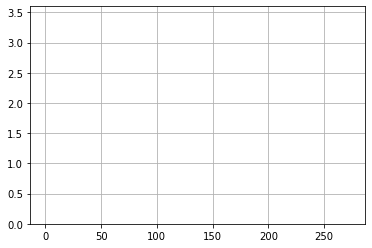

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 256] losses: (13.797097365856171, nan)


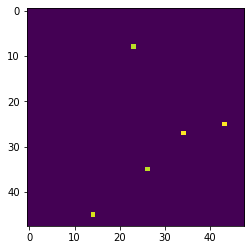

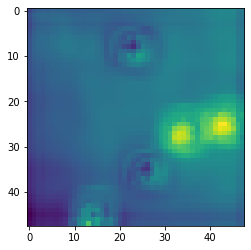

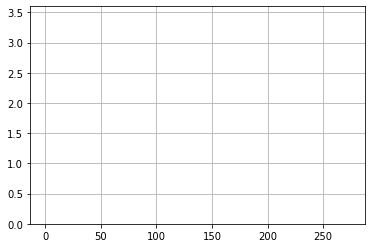

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 257] losses: (13.078029997348786, nan)


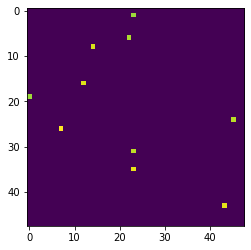

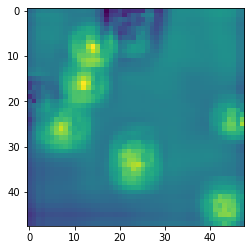

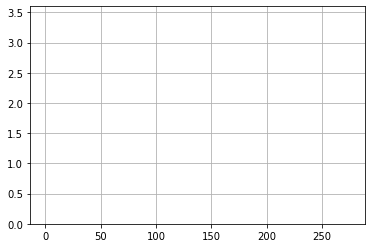

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 258] losses: (15.4209717297554, nan)


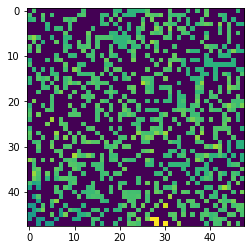

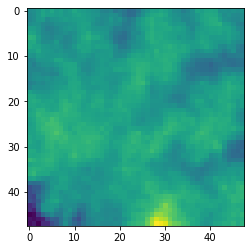

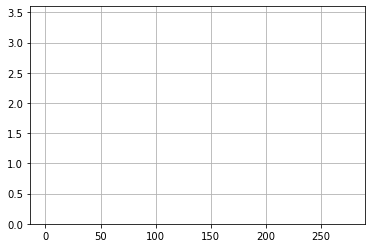

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 259] losses: (14.820704896450042, nan)


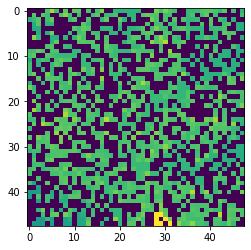

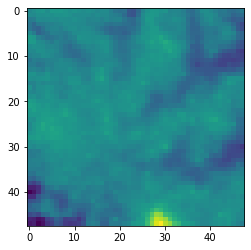

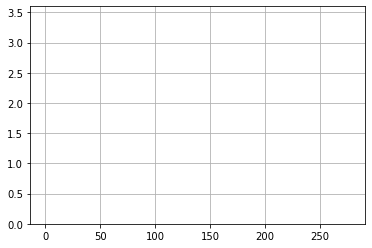

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 260] losses: (13.959556386470794, nan)


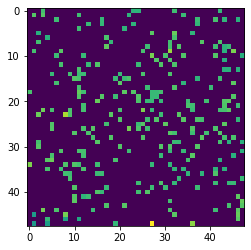

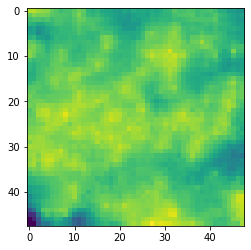

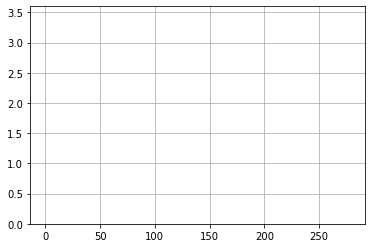

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 261] losses: (14.138374917507171, nan)


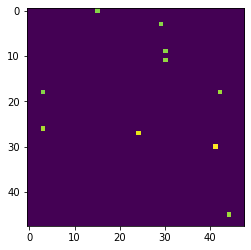

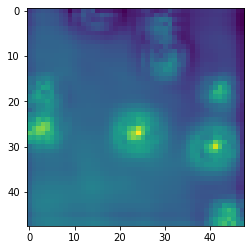

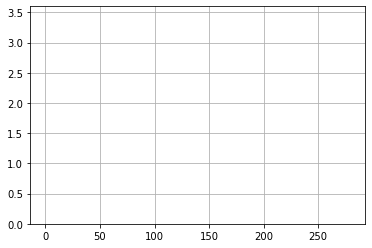

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 262] losses: (14.725956093072892, nan)


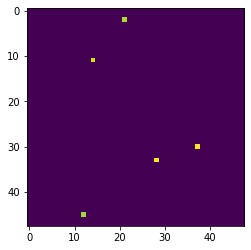

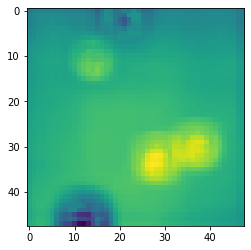

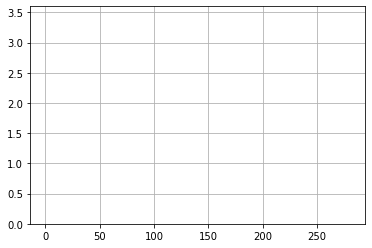

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 263] losses: (13.94400007367134, nan)


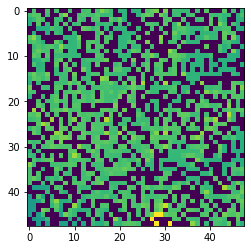

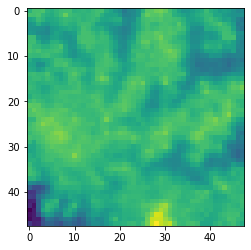

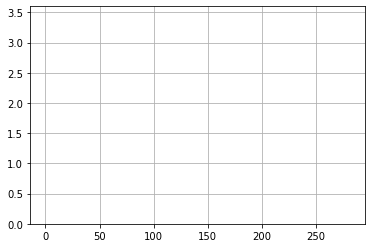

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 264] losses: (14.42989537000656, nan)


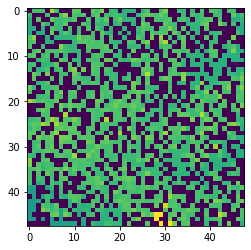

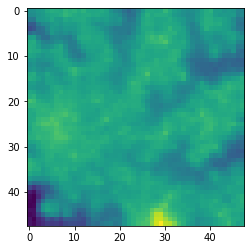

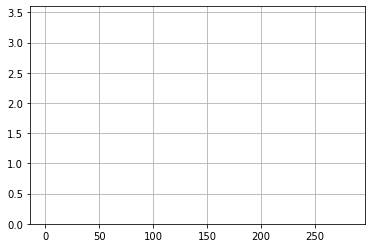

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 265] losses: (14.294661064147949, nan)


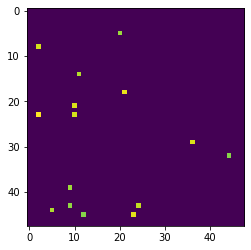

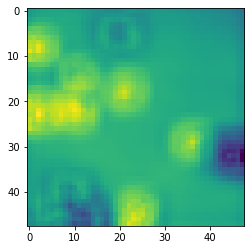

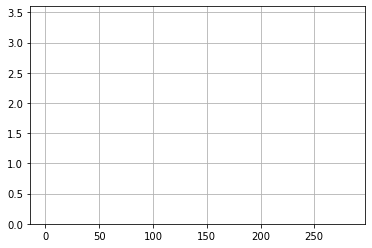

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 266] losses: (13.755524605512619, nan)


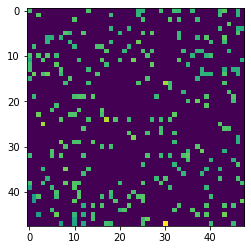

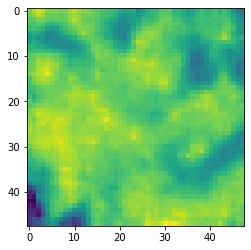

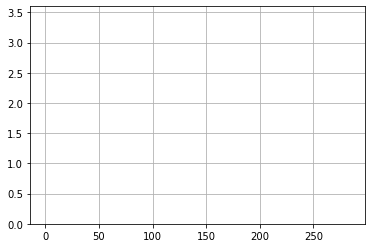

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 267] losses: (14.142190911769866, nan)


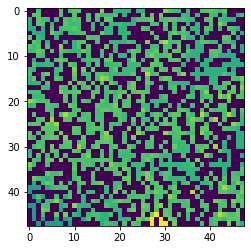

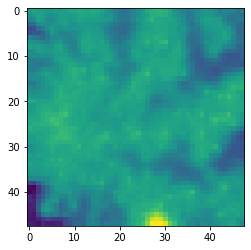

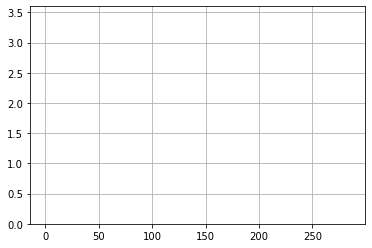

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 268] losses: (14.196741683483124, nan)


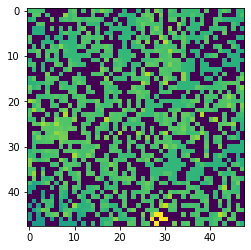

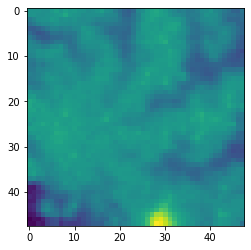

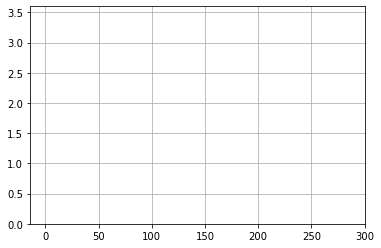

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 269] losses: (13.713845853805543, nan)


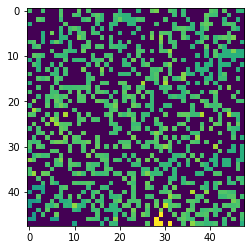

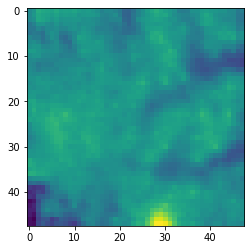

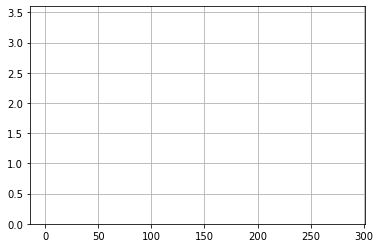

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 270] losses: (13.967514054775238, nan)


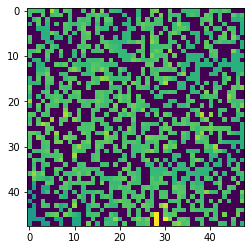

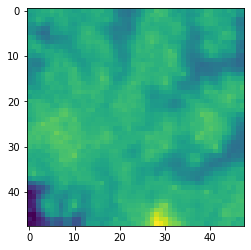

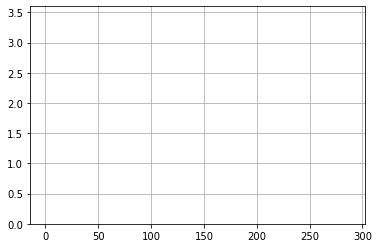

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 271] losses: (13.047986932992934, nan)


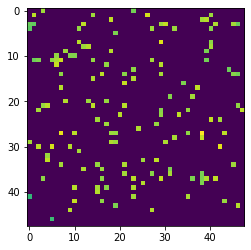

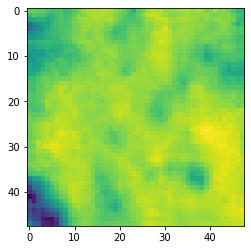

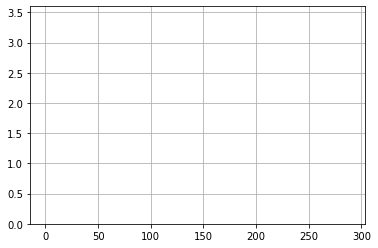

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 272] losses: (13.450061678886414, nan)


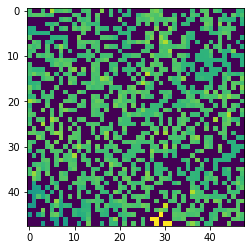

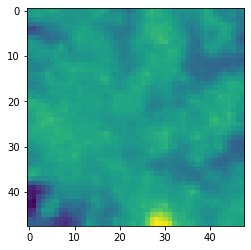

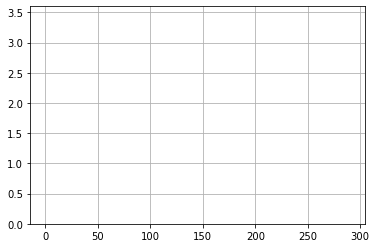

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 273] losses: (13.882487289905548, nan)


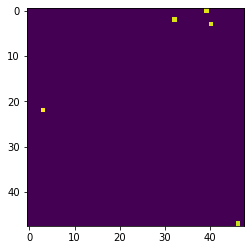

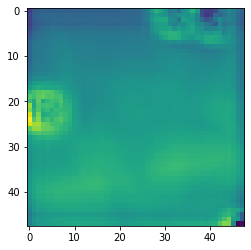

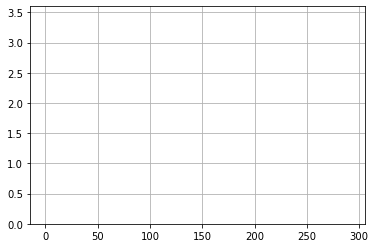

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 274] losses: (13.163394300937652, nan)


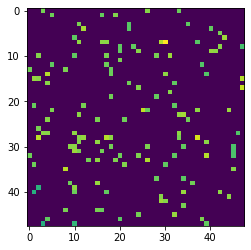

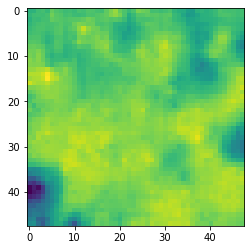

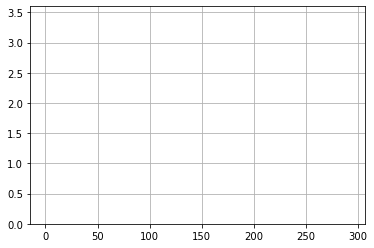

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 275] losses: (14.63998903989792, nan)


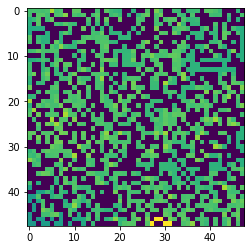

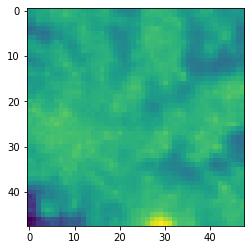

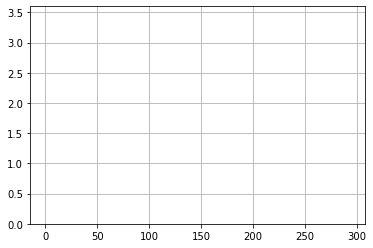

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 276] losses: (13.779290105104446, nan)


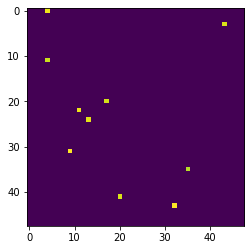

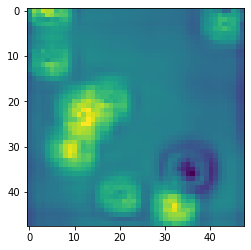

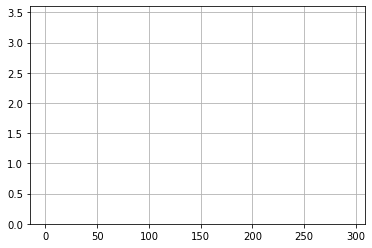

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 277] losses: (14.196689522266388, nan)


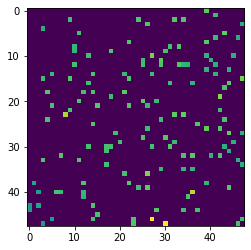

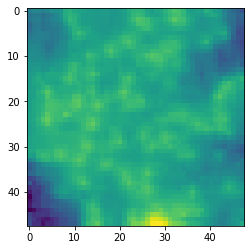

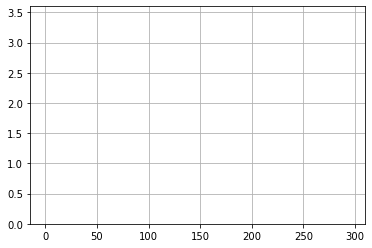

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 278] losses: (14.25951936841011, nan)


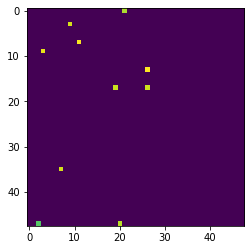

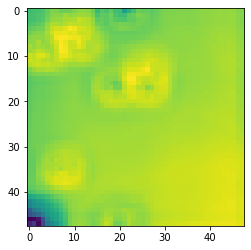

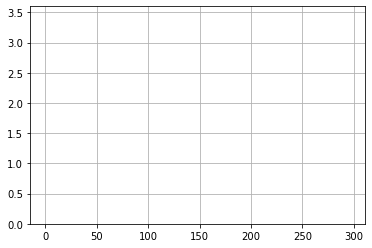

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 279] losses: (13.686675188541413, nan)


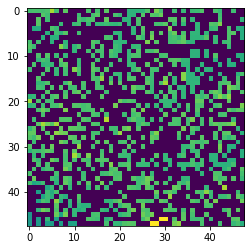

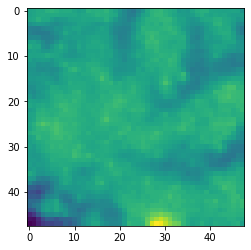

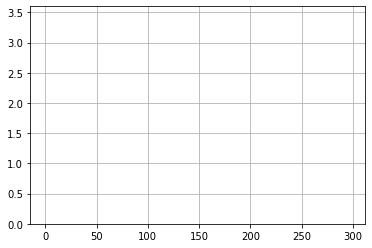

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 280] losses: (14.070919811725616, nan)


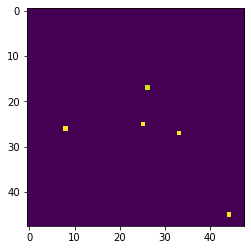

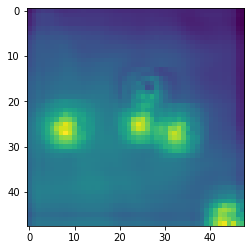

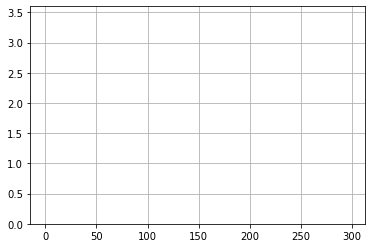

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 281] losses: (13.136568264961243, nan)


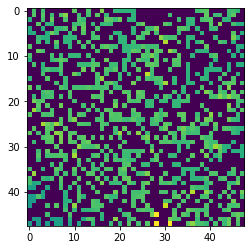

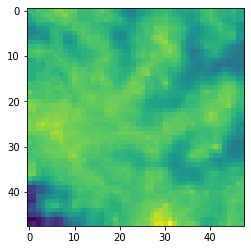

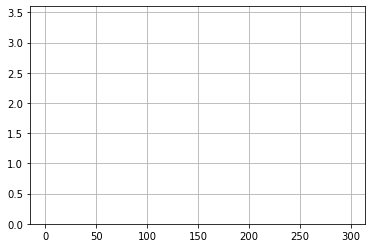

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 282] losses: (15.338310918807984, nan)


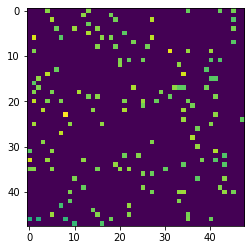

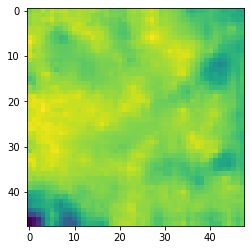

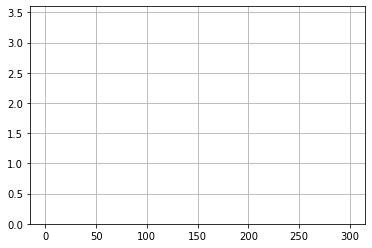

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 283] losses: (15.12458355307579, nan)


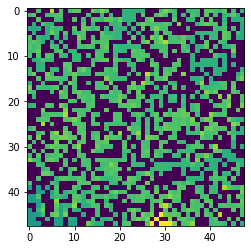

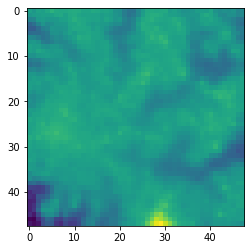

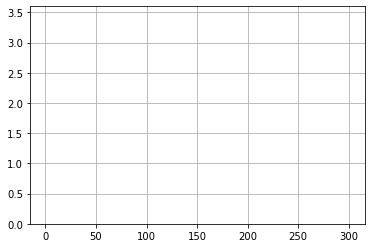

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 284] losses: (14.575408523082734, nan)


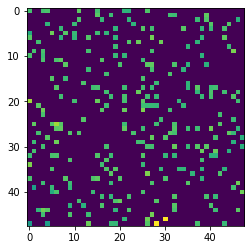

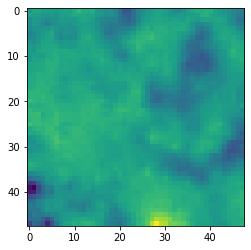

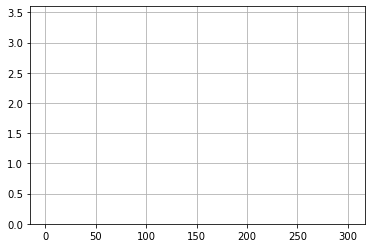

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 285] losses: (15.230603625774384, nan)


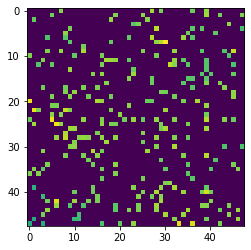

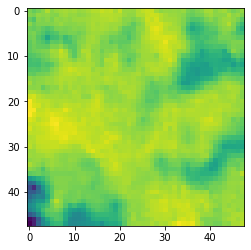

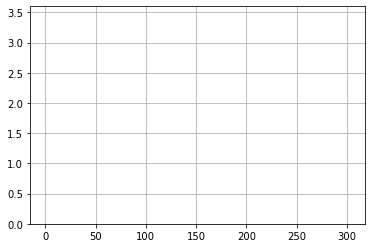

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 286] losses: (12.749531650543213, nan)


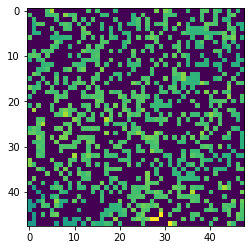

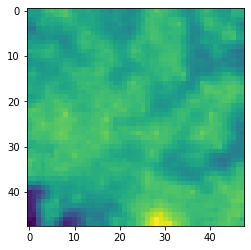

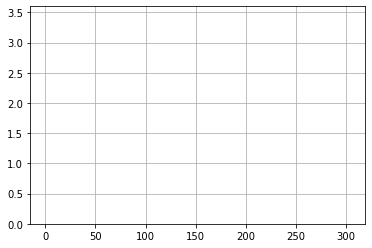

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 287] losses: (14.398036397695542, nan)


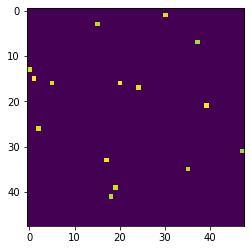

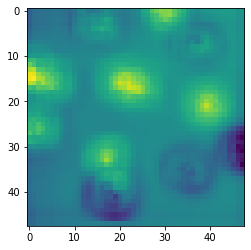

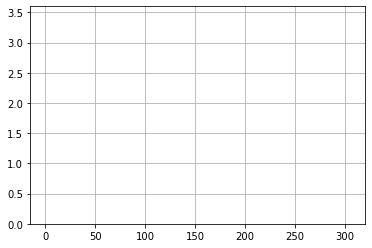

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 288] losses: (13.28997997045517, nan)


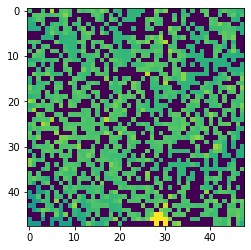

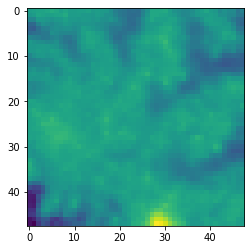

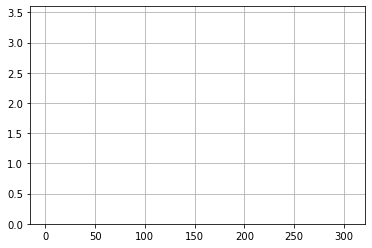

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 289] losses: (13.647737873792648, nan)


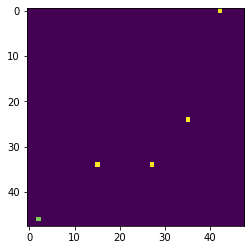

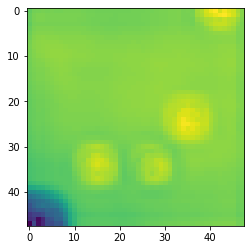

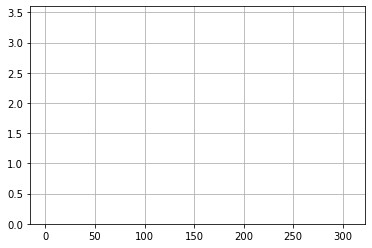

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 290] losses: (12.932472763061524, nan)


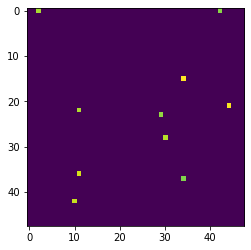

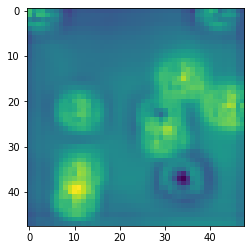

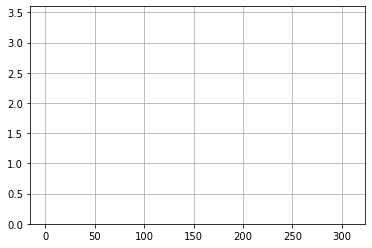

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 291] losses: (14.585754741430282, nan)


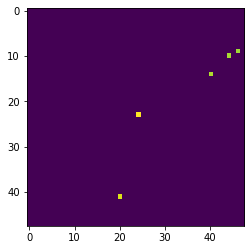

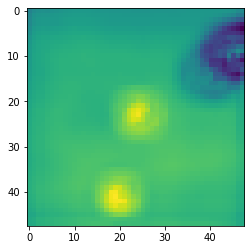

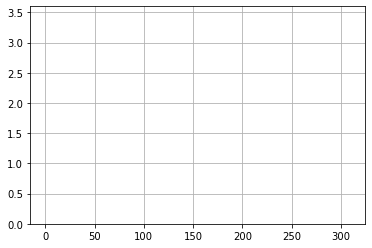

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 292] losses: (13.37694116950035, nan)


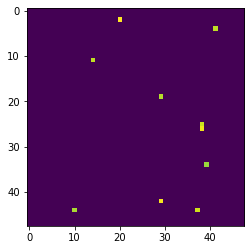

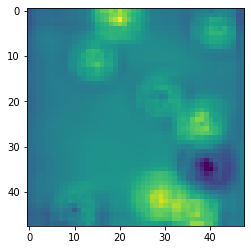

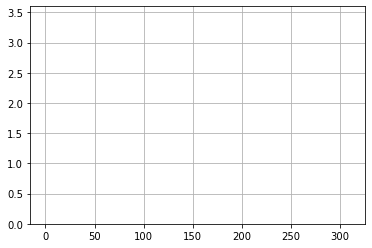

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 293] losses: (13.656562277078628, nan)


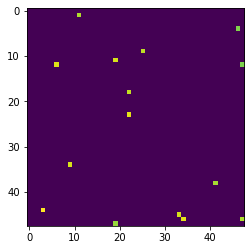

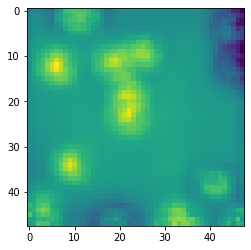

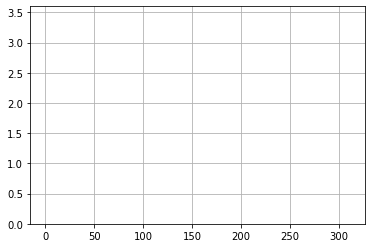

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 294] losses: (14.386575506925583, nan)


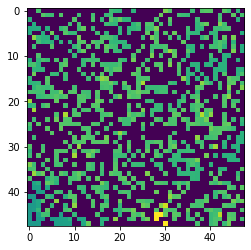

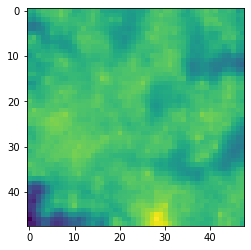

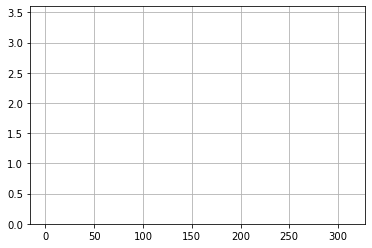

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 295] losses: (14.082498281002044, nan)


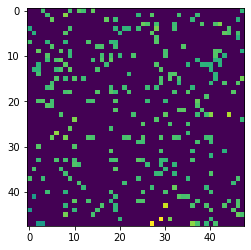

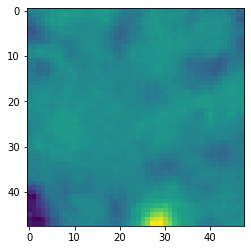

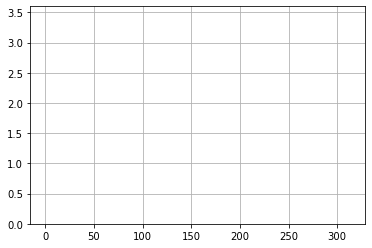

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 296] losses: (14.383433649539947, nan)


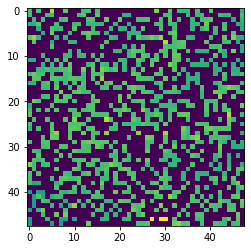

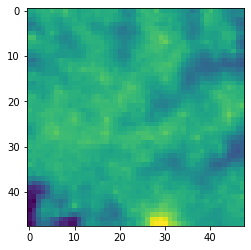

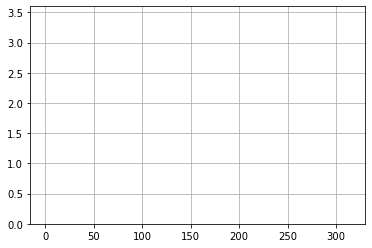

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 297] losses: (13.807516481876373, nan)


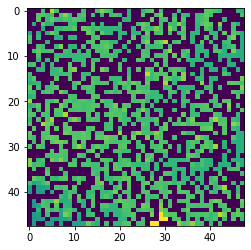

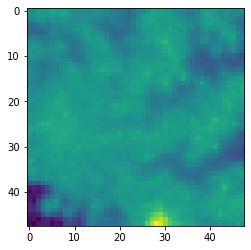

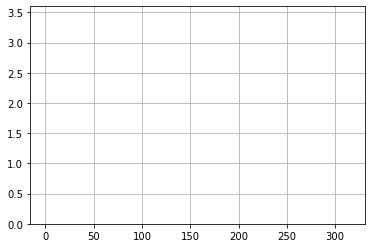

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 298] losses: (13.84588058948517, nan)


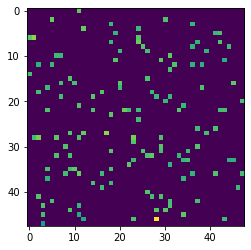

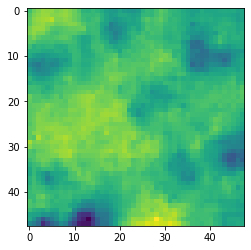

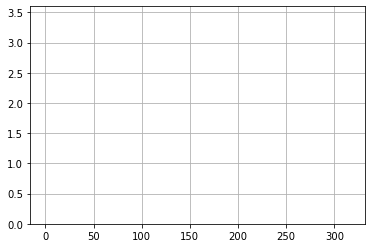

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 299] losses: (14.422532767057419, nan)


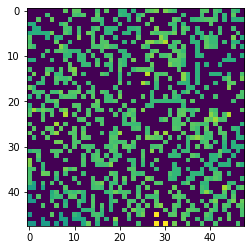

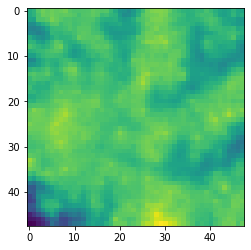

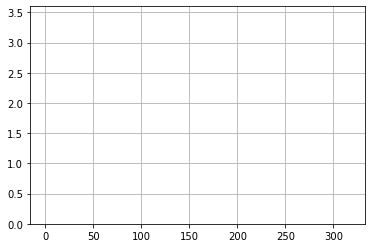

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 300] losses: (13.239646286964417, nan)


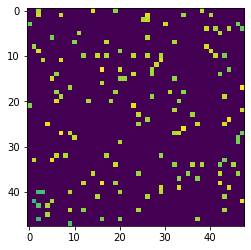

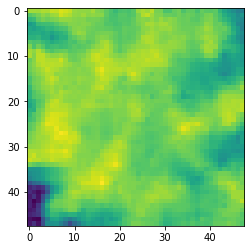

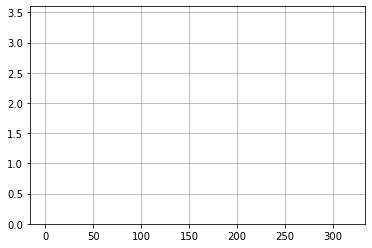

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 301] losses: (13.31705576658249, nan)


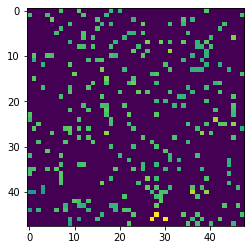

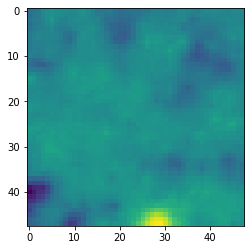

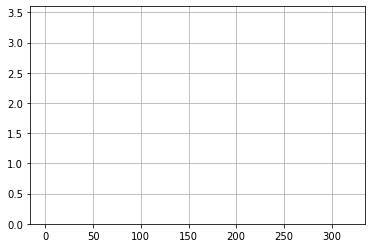

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 302] losses: (13.814433246850967, nan)


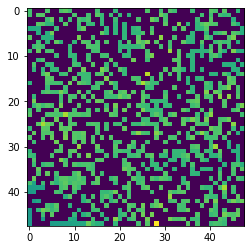

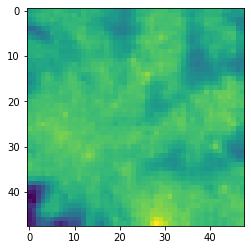

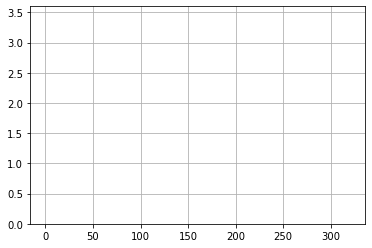

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 303] losses: (14.47342834353447, nan)


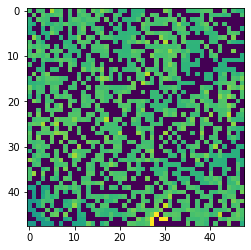

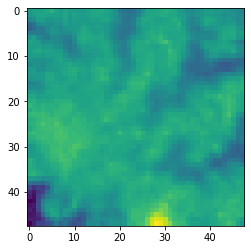

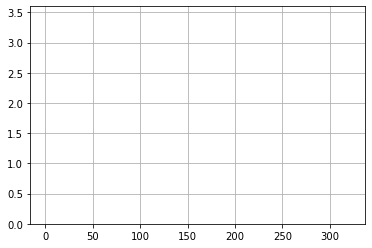

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 304] losses: (13.927302795648576, nan)


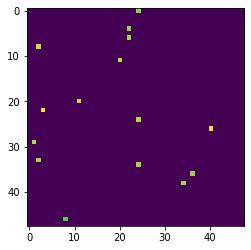

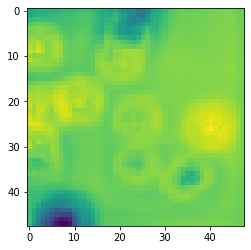

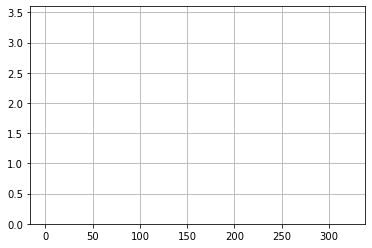

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 305] losses: (13.52188432097435, nan)


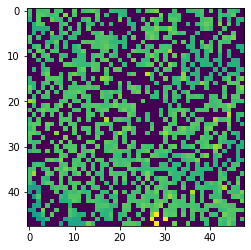

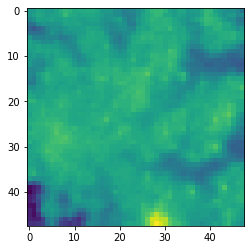

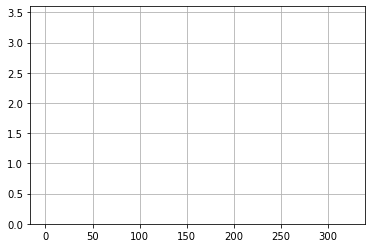

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 306] losses: (13.268256075382233, nan)


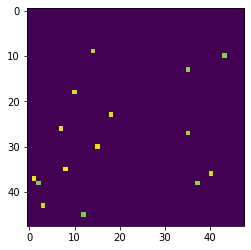

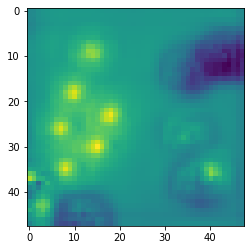

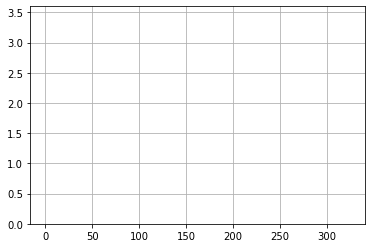

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 307] losses: (13.82655042886734, nan)


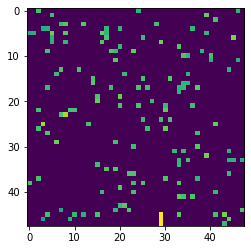

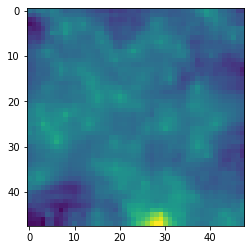

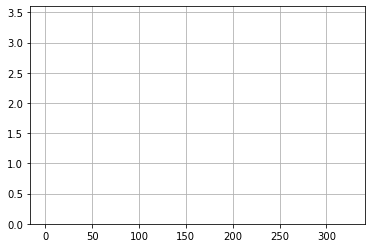

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 308] losses: (13.26790544629097, nan)


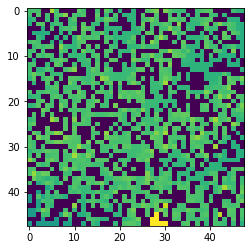

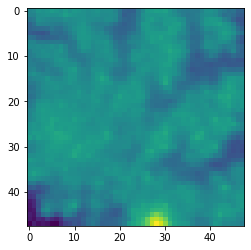

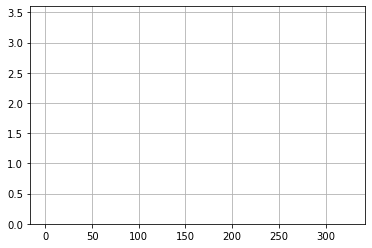

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 309] losses: (13.91914840221405, nan)


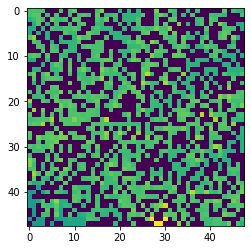

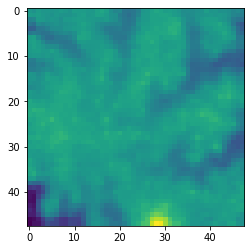

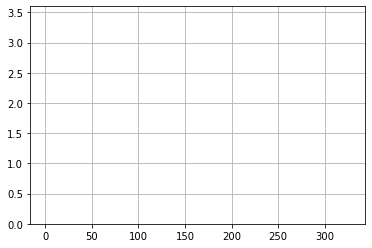

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 310] losses: (13.919825528860093, nan)


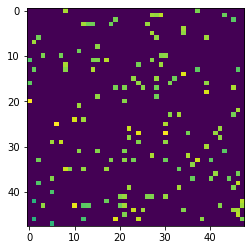

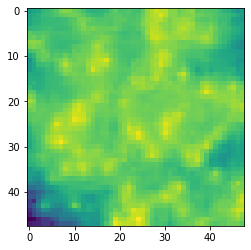

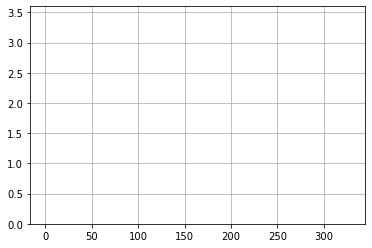

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 311] losses: (14.542158330678939, nan)


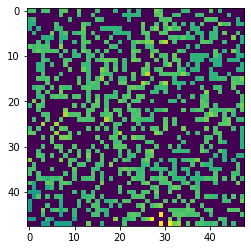

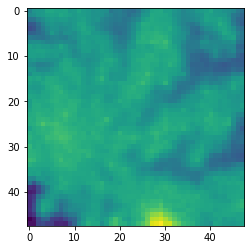

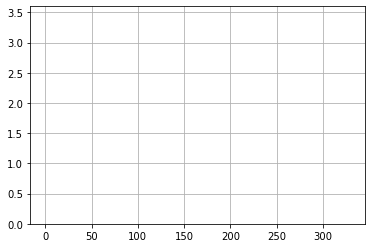

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 312] losses: (14.77965481042862, nan)


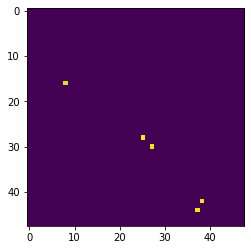

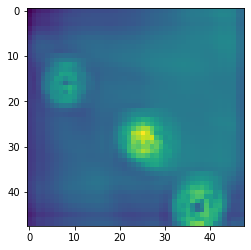

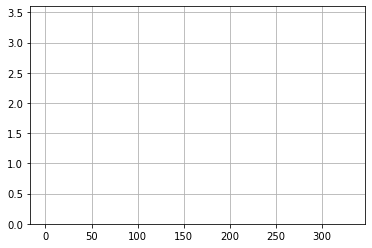

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 313] losses: (13.131563659906387, nan)


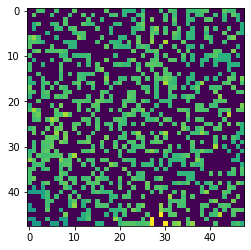

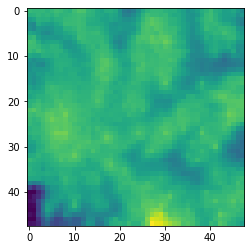

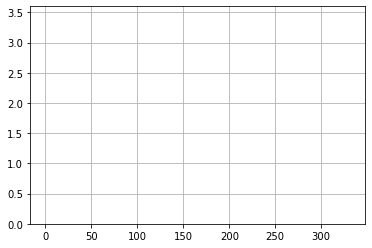

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 314] losses: (12.905133451223373, nan)


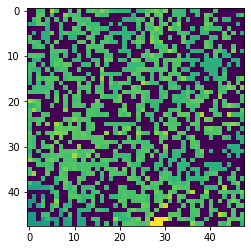

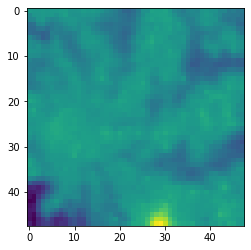

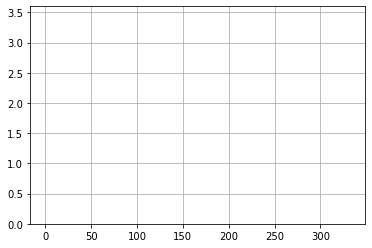

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 315] losses: (13.57411793589592, nan)


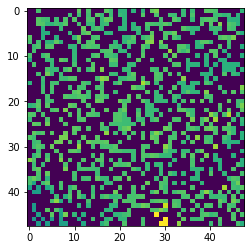

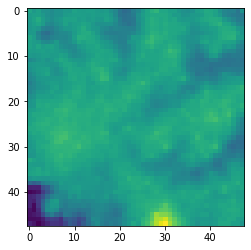

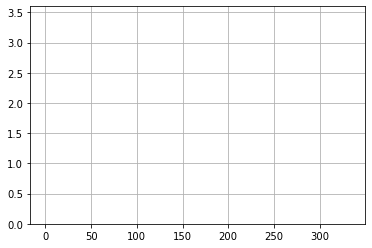

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 316] losses: (13.72324092388153, nan)


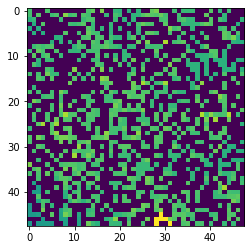

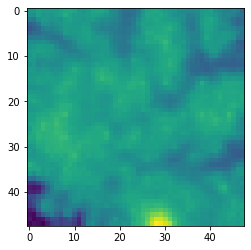

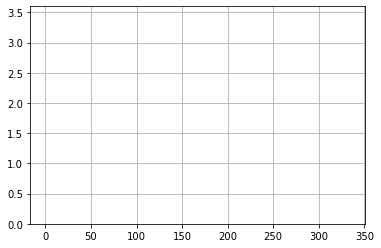

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 317] losses: (14.730945887565612, nan)


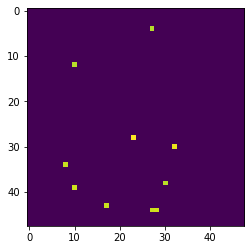

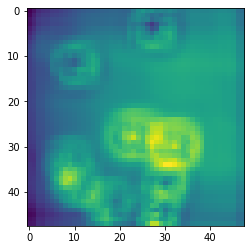

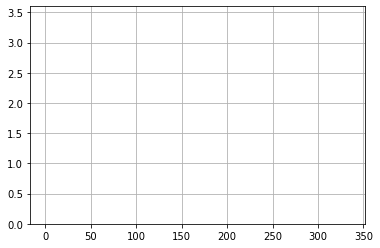

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 318] losses: (13.897980618476868, nan)


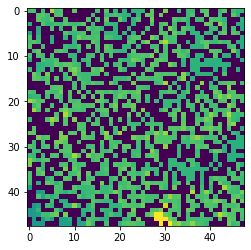

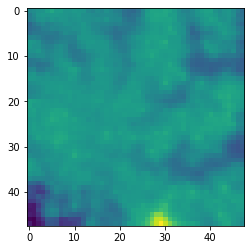

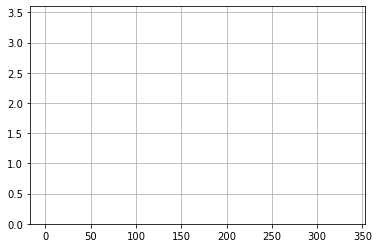

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 319] losses: (14.690690622329711, nan)


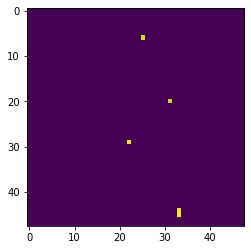

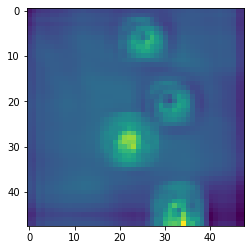

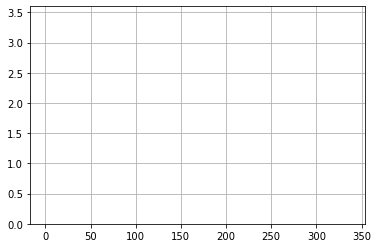

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 320] losses: (13.754903732538223, nan)


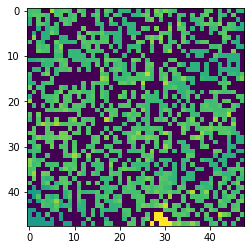

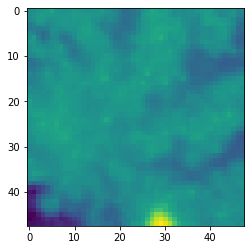

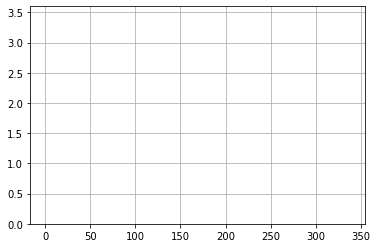

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 321] losses: (12.80063247680664, nan)


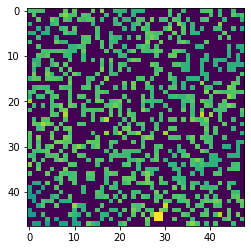

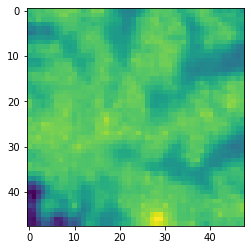

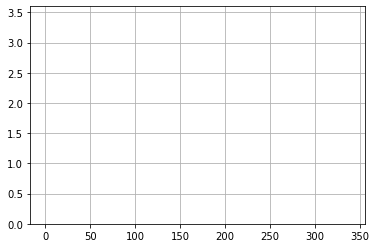

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 322] losses: (13.731442477703094, nan)


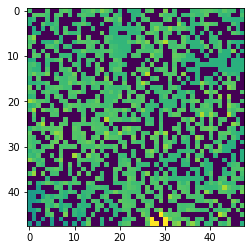

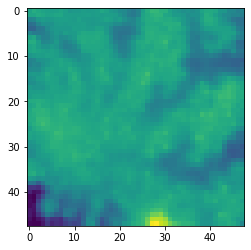

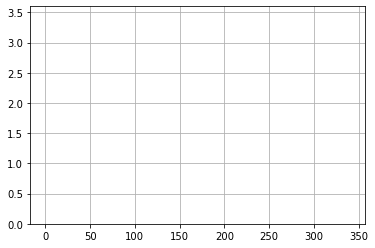

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 323] losses: (13.592665449380874, nan)


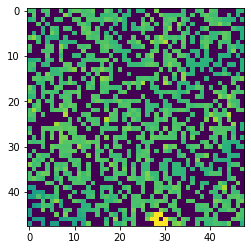

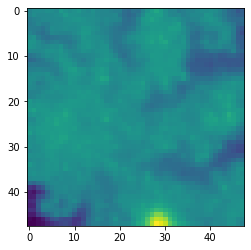

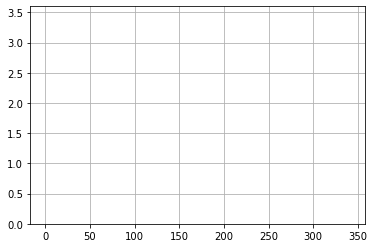

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 324] losses: (13.316707051992417, nan)


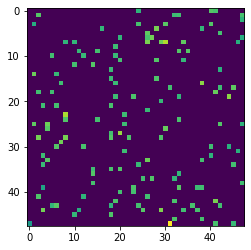

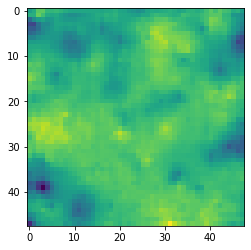

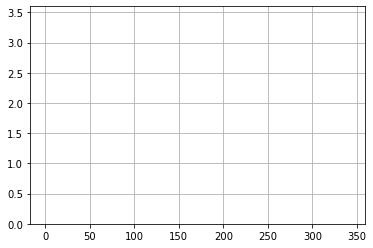

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 325] losses: (13.120096426010132, nan)


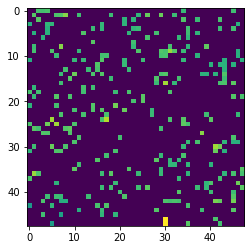

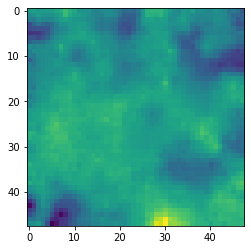

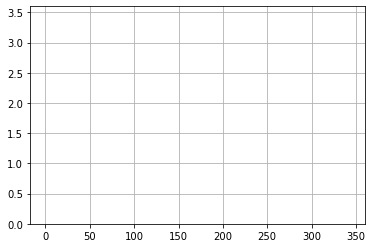

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 326] losses: (12.481771543025971, nan)


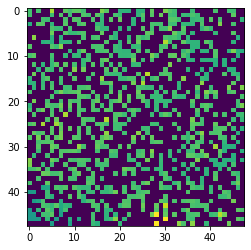

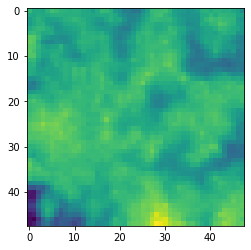

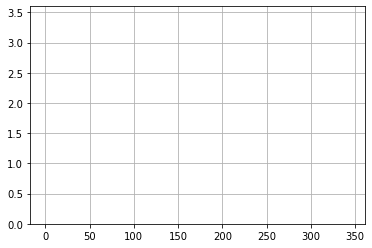

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 327] losses: (14.480319166183472, nan)


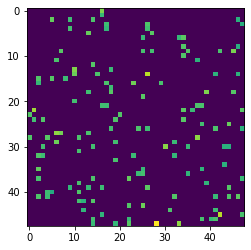

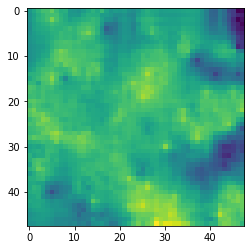

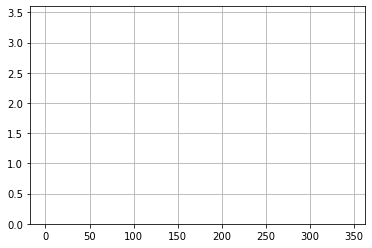

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 328] losses: (13.62615800499916, nan)


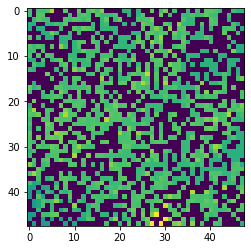

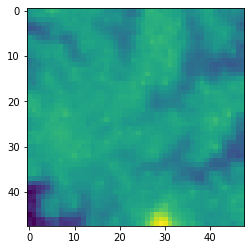

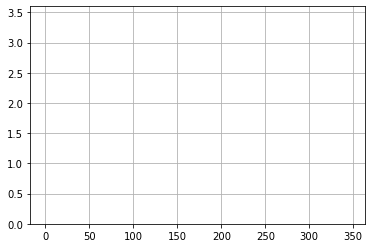

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 329] losses: (14.136522471904755, nan)


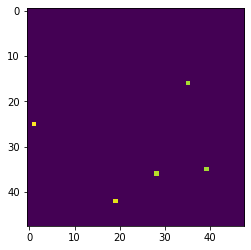

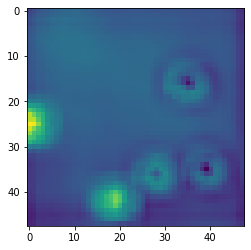

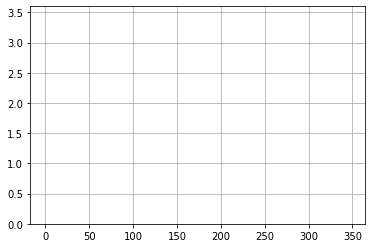

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 330] losses: (13.148280265331268, nan)


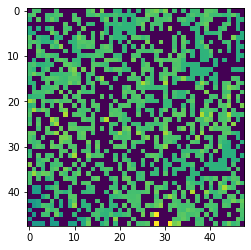

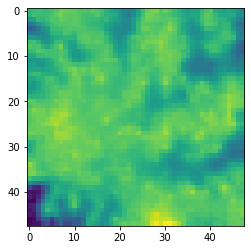

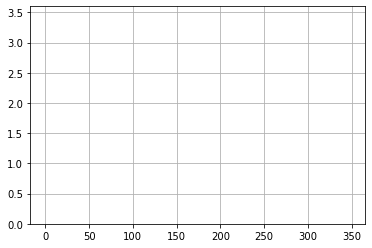

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 331] losses: (13.26312477350235, nan)


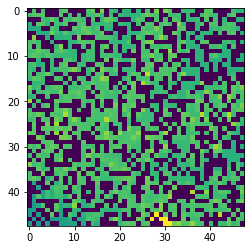

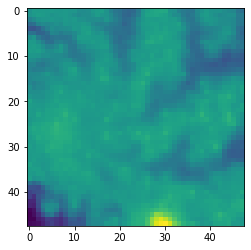

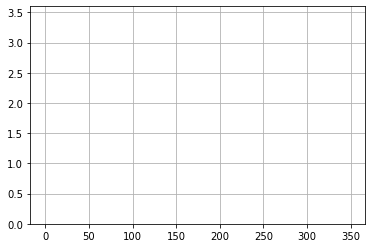

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 332] losses: (13.233907129764557, nan)


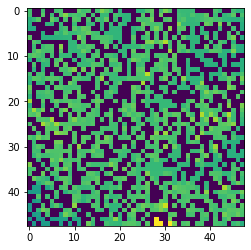

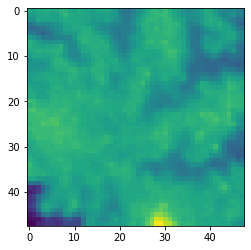

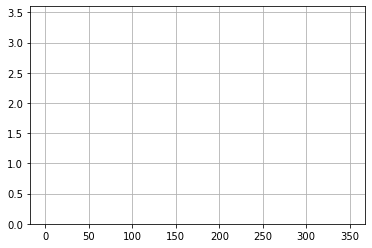

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 333] losses: (13.810441740751266, nan)


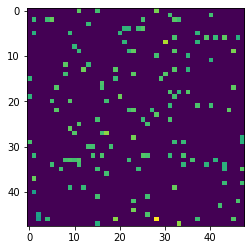

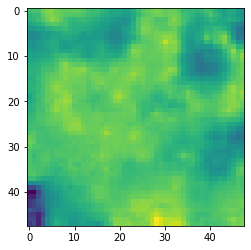

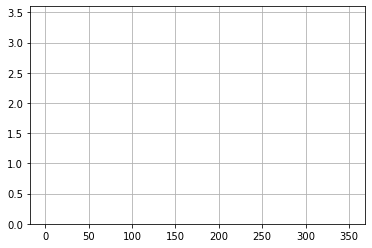

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 334] losses: (14.33028706908226, nan)


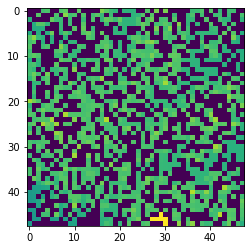

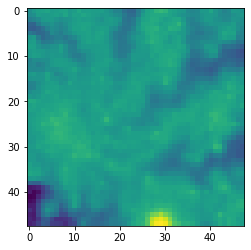

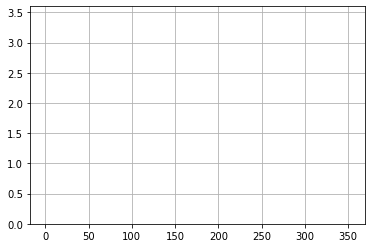

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 335] losses: (13.783677552938462, nan)


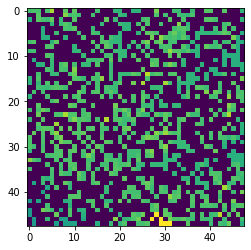

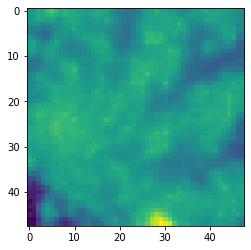

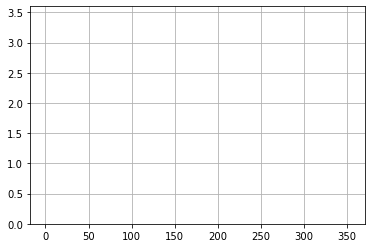

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 336] losses: (13.418576022386551, nan)


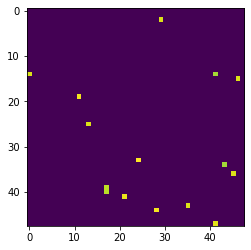

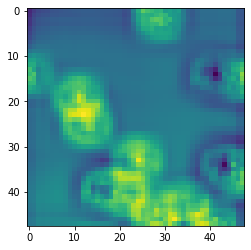

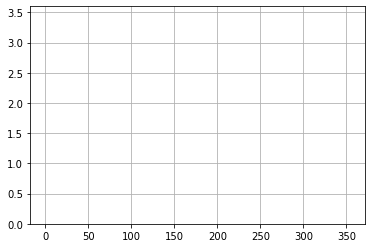

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 337] losses: (14.09023596048355, nan)


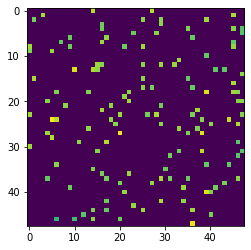

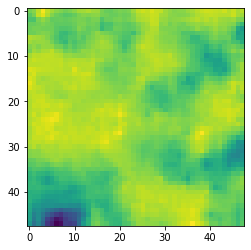

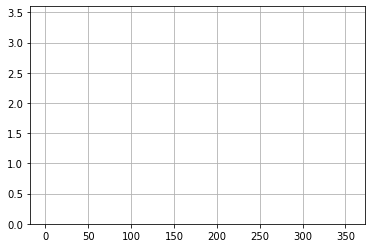

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 338] losses: (13.965050712823867, nan)


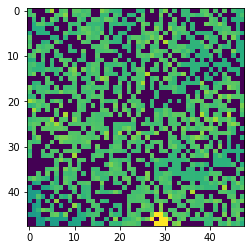

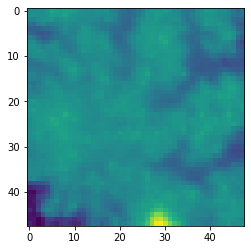

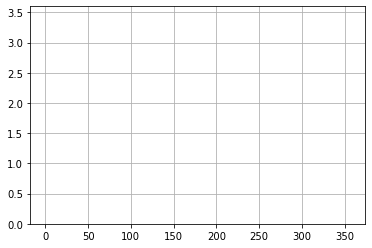

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 339] losses: (13.61071771621704, nan)


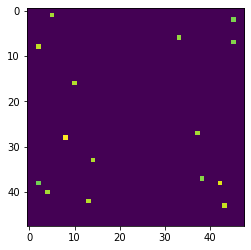

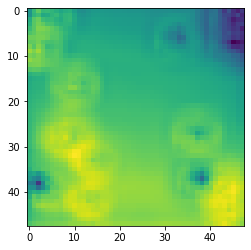

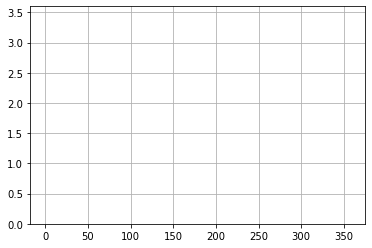

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 340] losses: (13.500179401636125, nan)


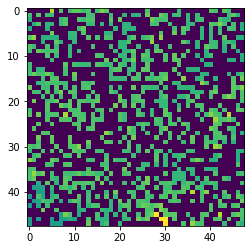

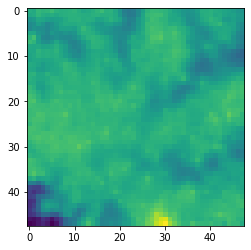

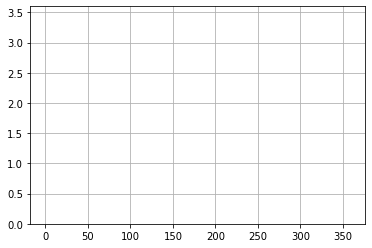

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 341] losses: (13.833455953598023, nan)


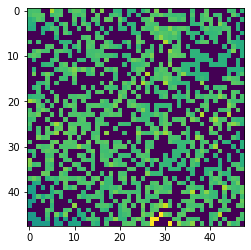

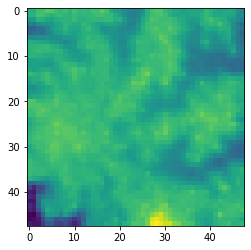

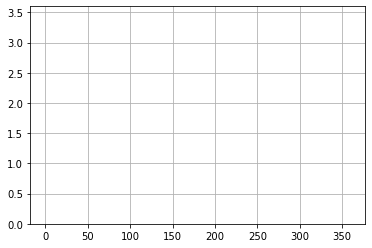

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 342] losses: (13.102885076999664, nan)


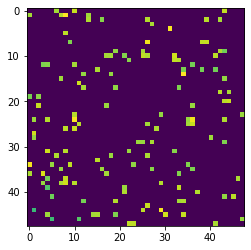

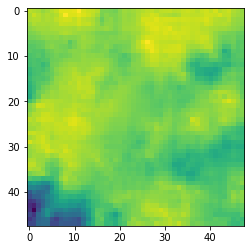

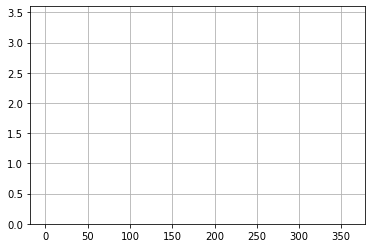

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 343] losses: (13.76629108786583, nan)


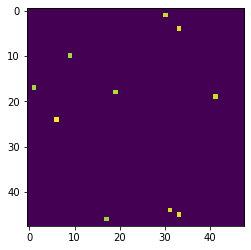

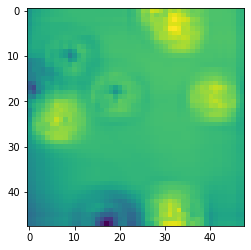

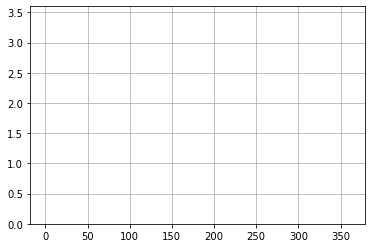

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 344] losses: (13.307704029083252, nan)


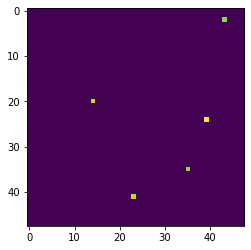

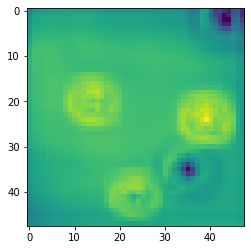

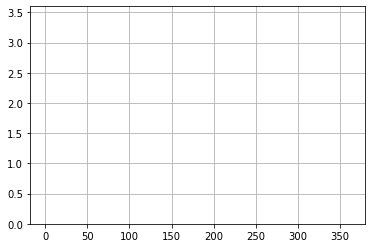

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 345] losses: (13.28888463139534, nan)


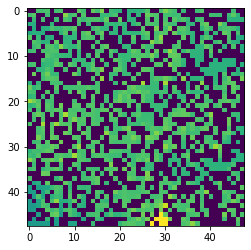

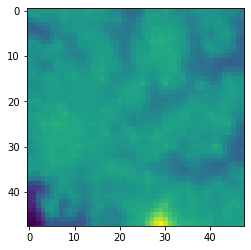

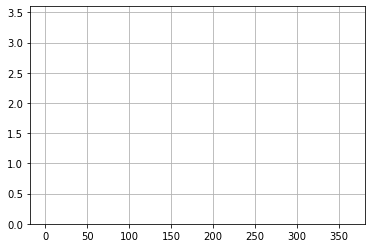

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 346] losses: (14.520442374944686, nan)


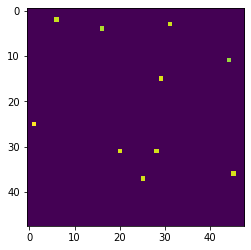

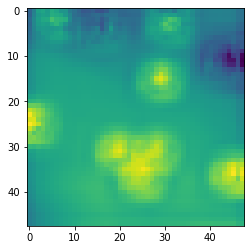

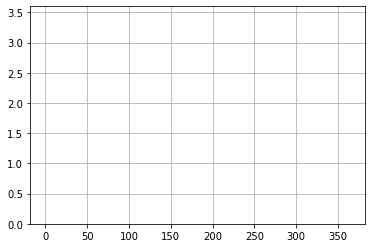

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 347] losses: (13.031409878730773, nan)


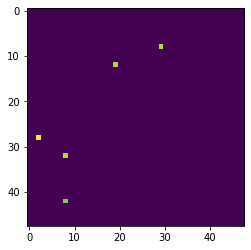

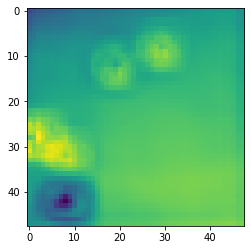

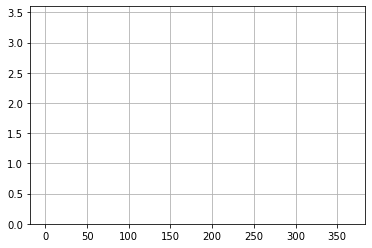

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 348] losses: (14.174222165346146, nan)


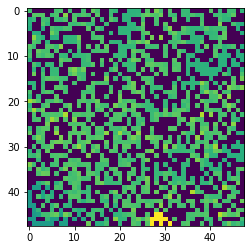

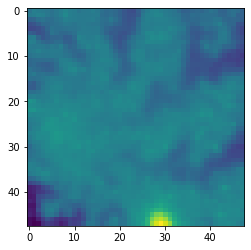

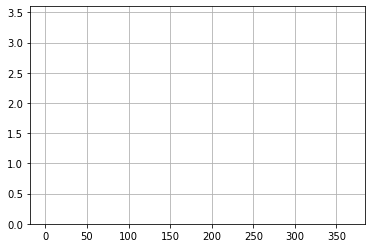

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 349] losses: (14.268760786056518, nan)


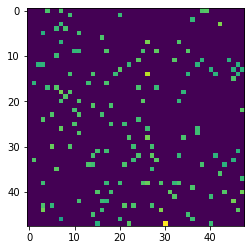

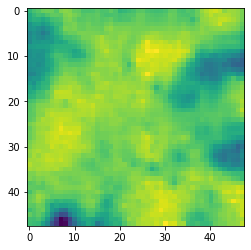

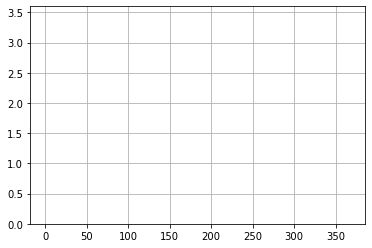

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 350] losses: (13.529461801052094, nan)


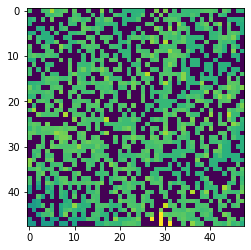

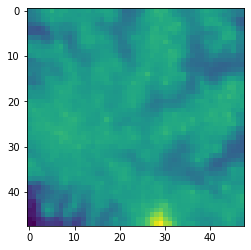

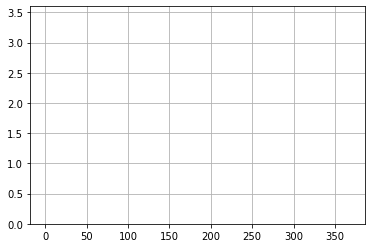

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 351] losses: (13.309518033266068, nan)


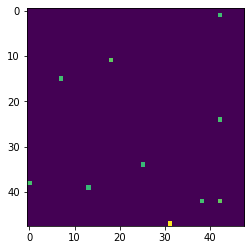

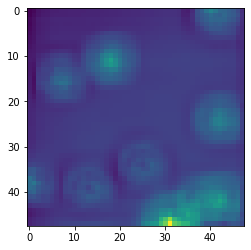

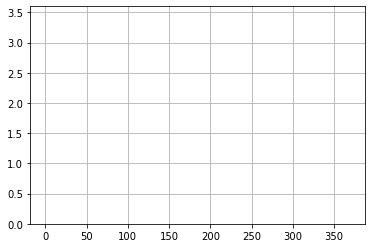

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 352] losses: (14.146361088752746, nan)


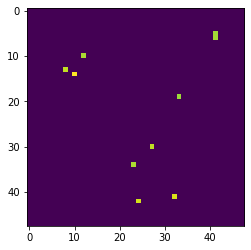

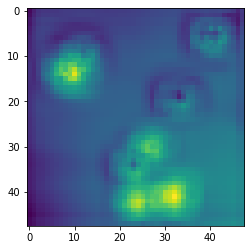

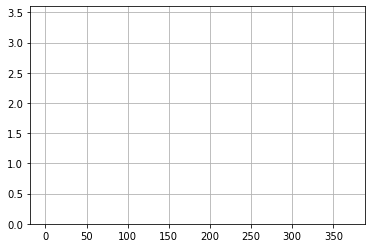

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 353] losses: (12.910780121088028, nan)


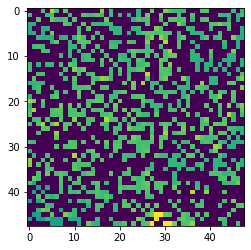

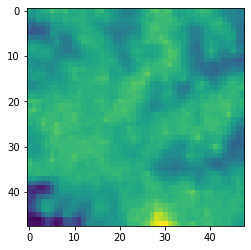

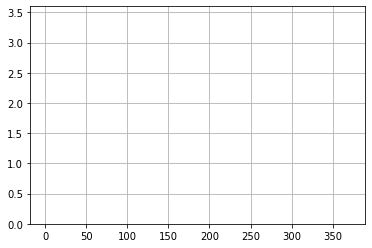

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 354] losses: (13.638469434976578, nan)


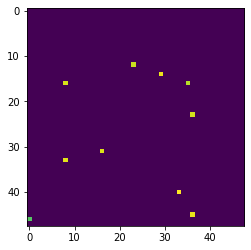

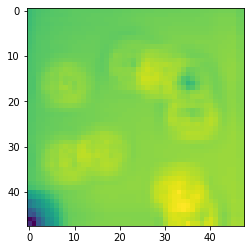

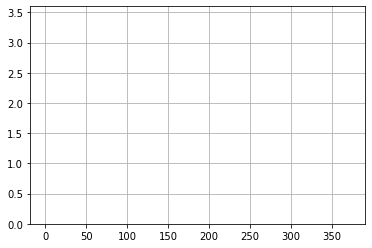

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 355] losses: (13.351177451610566, nan)


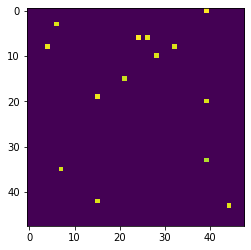

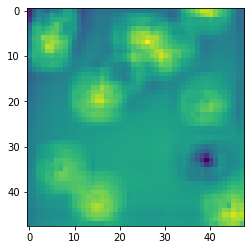

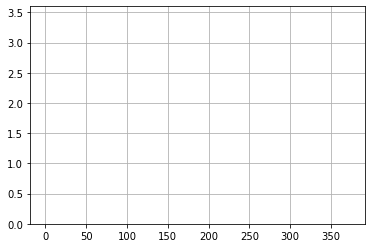

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 356] losses: (13.930055928230285, nan)


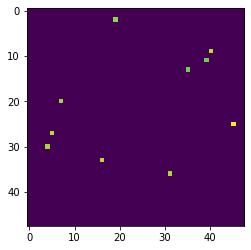

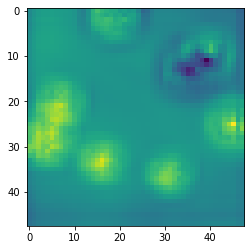

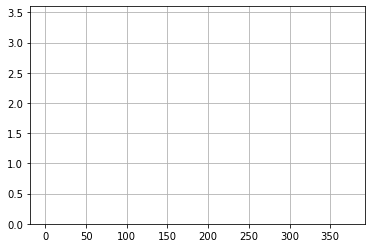

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 357] losses: (14.031407902240753, nan)


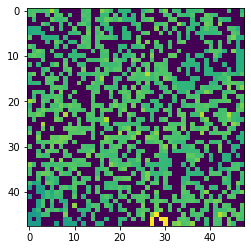

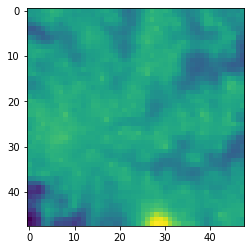

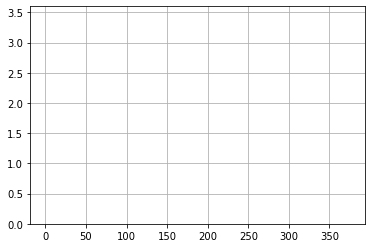

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 358] losses: (13.223511972427367, nan)


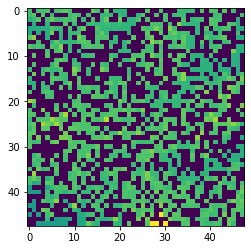

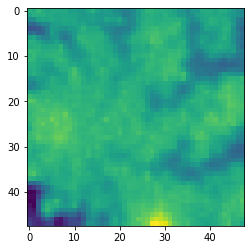

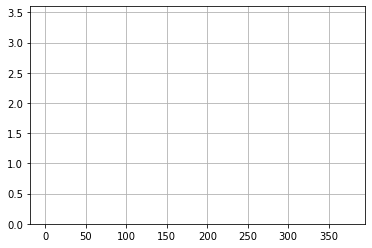

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 359] losses: (13.016716955900192, nan)


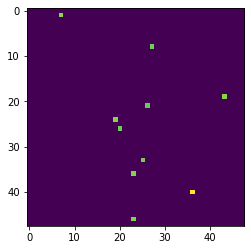

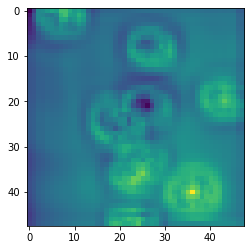

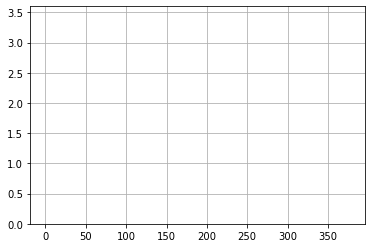

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 360] losses: (14.633591620922088, nan)


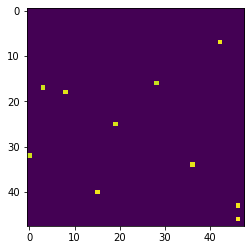

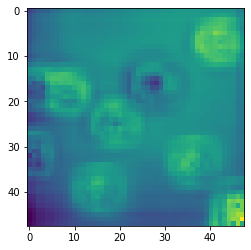

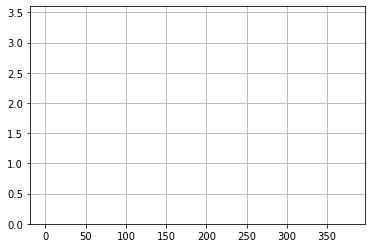

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 361] losses: (14.245045775175095, nan)


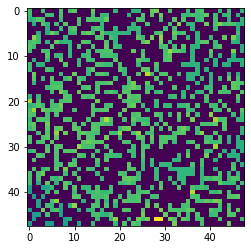

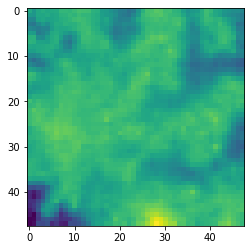

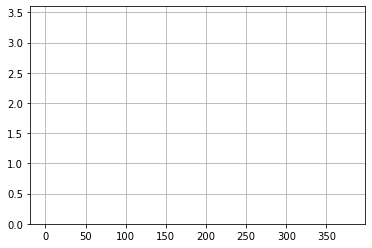

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 362] losses: (13.594627920389176, nan)


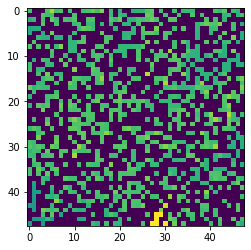

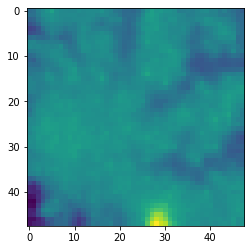

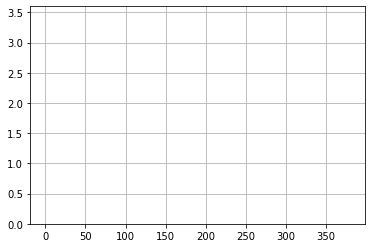

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 363] losses: (14.194623528718948, nan)


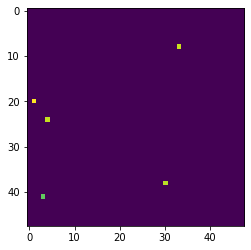

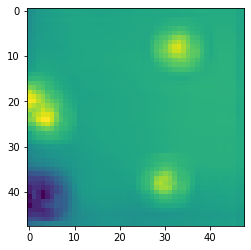

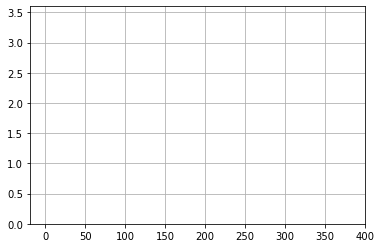

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 364] losses: (13.985182976722717, nan)


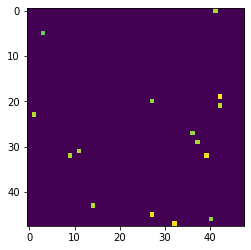

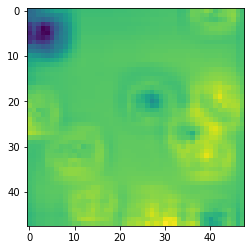

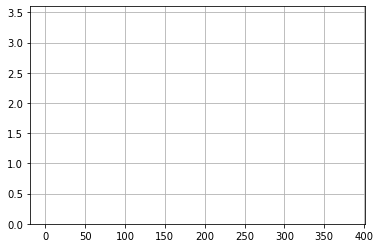

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 365] losses: (13.46224944114685, nan)


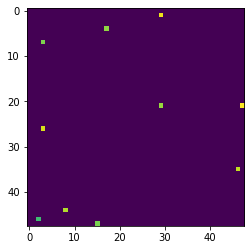

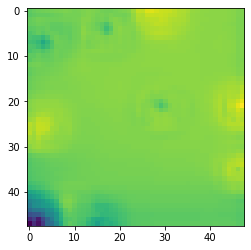

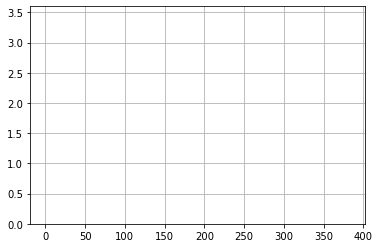

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 366] losses: (13.223246395587921, nan)


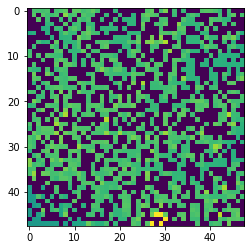

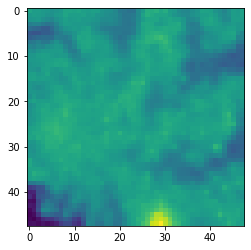

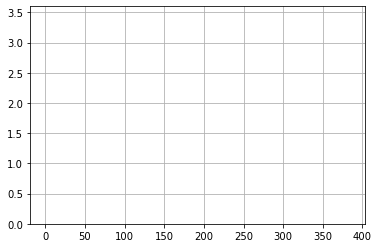

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 367] losses: (13.610113620758057, nan)


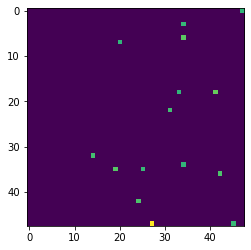

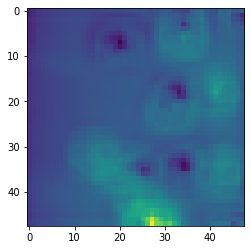

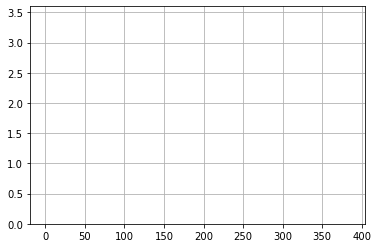

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 368] losses: (13.569040066003799, nan)


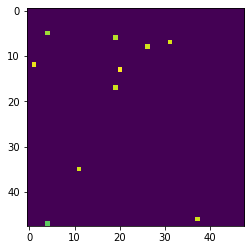

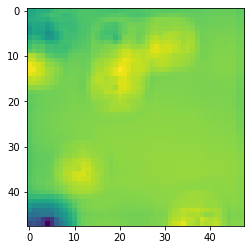

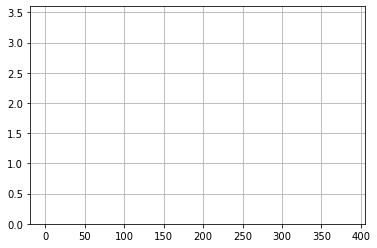

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 369] losses: (14.548393493890762, nan)


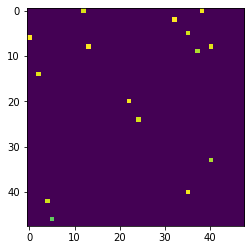

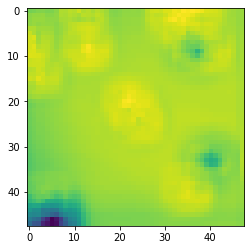

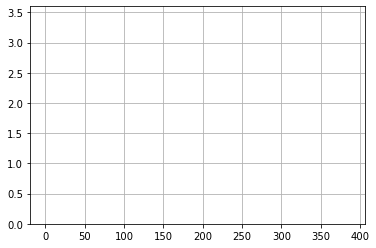

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 370] losses: (13.112988355159759, nan)


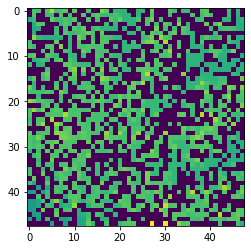

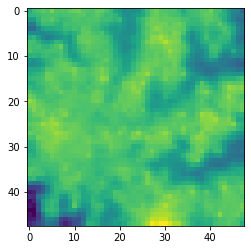

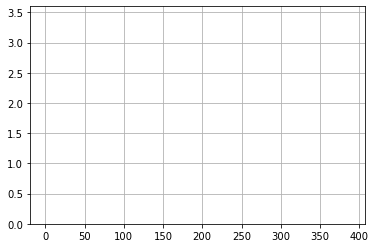

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 371] losses: (13.284063755273818, nan)


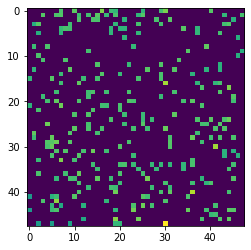

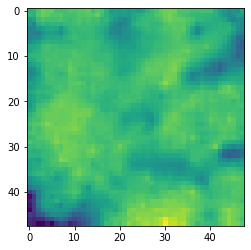

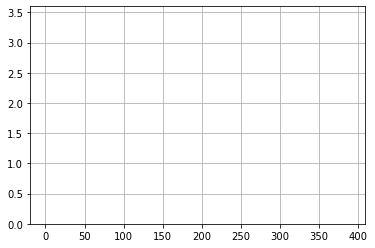

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 372] losses: (12.791705919504166, nan)


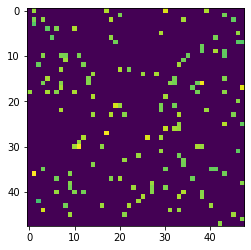

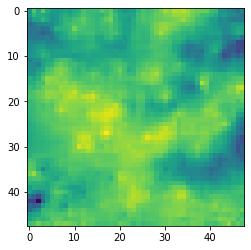

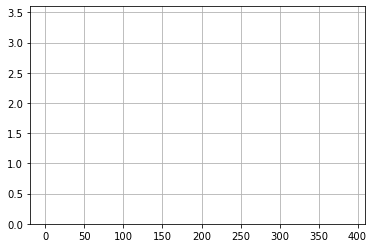

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 373] losses: (13.714984939098358, nan)


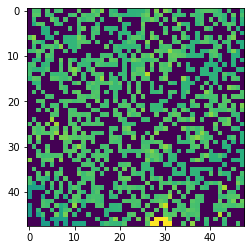

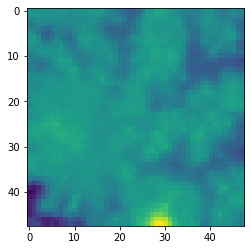

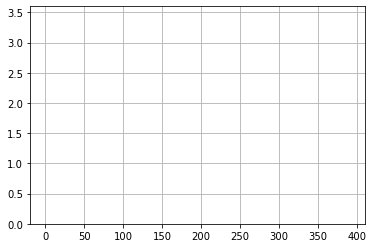

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 374] losses: (13.677081837654114, nan)


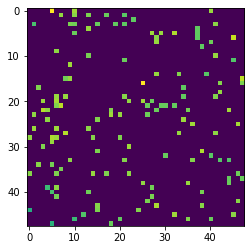

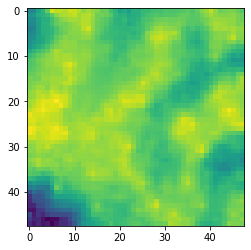

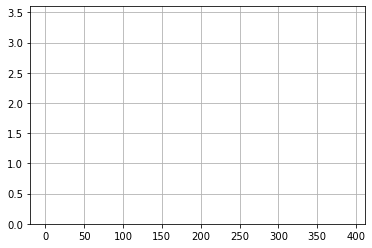

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 375] losses: (14.203812274932861, nan)


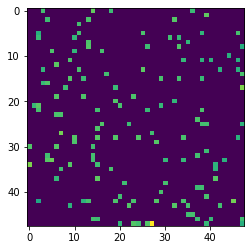

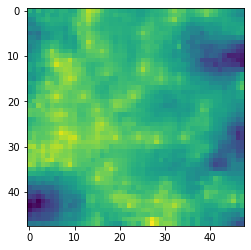

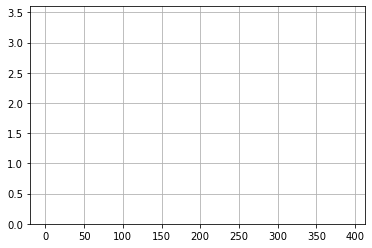

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 376] losses: (12.906509813070297, nan)


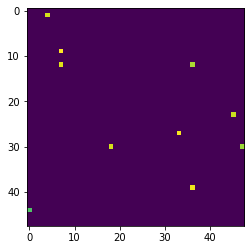

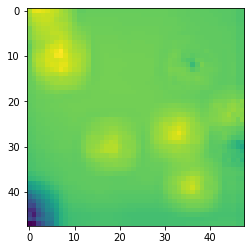

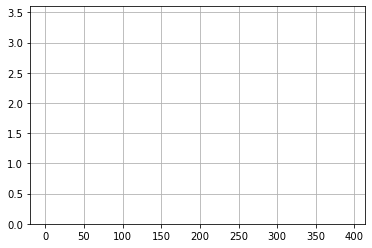

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 377] losses: (13.468933596611024, nan)


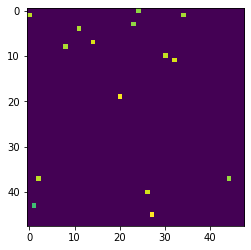

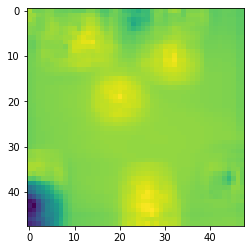

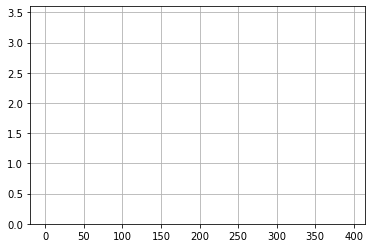

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 378] losses: (13.32430692076683, nan)


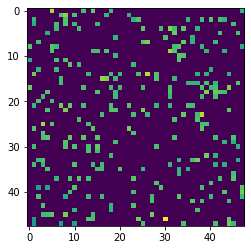

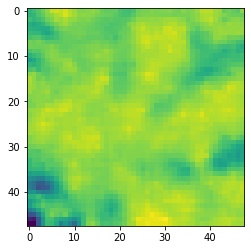

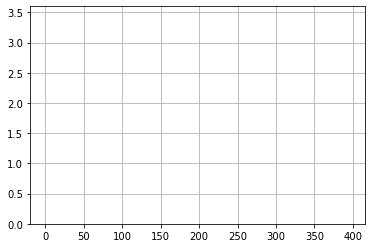

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 379] losses: (12.872044028043748, nan)


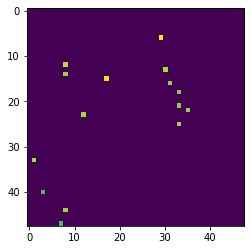

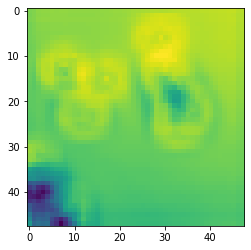

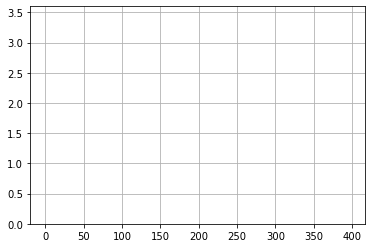

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 380] losses: (14.49951549768448, nan)


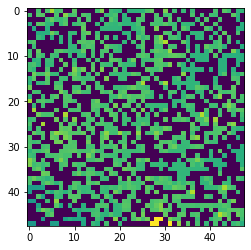

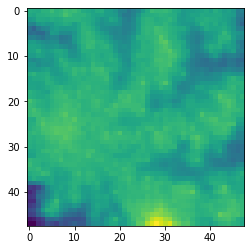

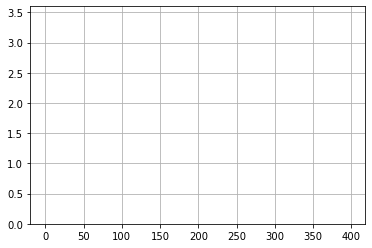

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 381] losses: (12.987329313755035, nan)


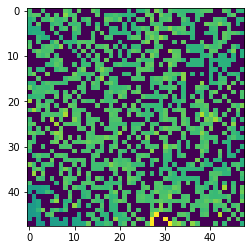

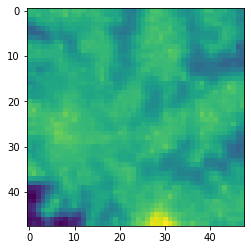

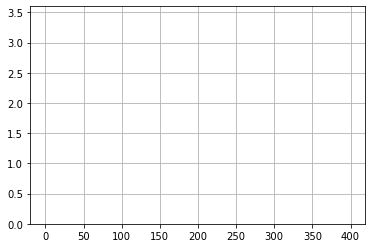

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 382] losses: (13.56017177581787, nan)


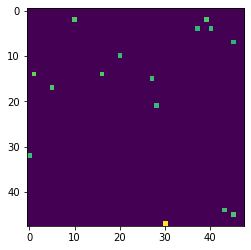

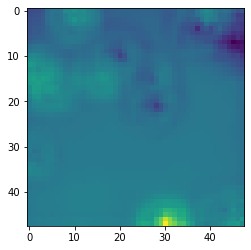

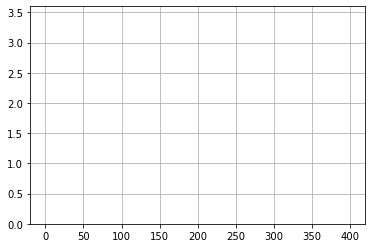

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 383] losses: (14.205510346889495, nan)


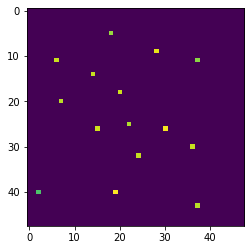

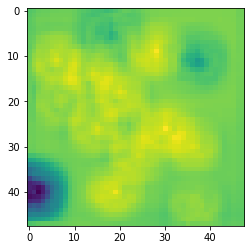

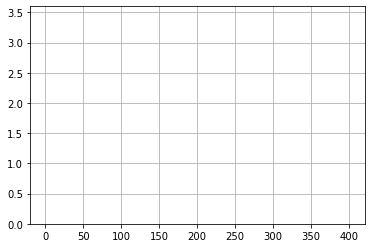

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 384] losses: (14.201271576881409, nan)


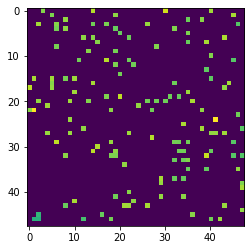

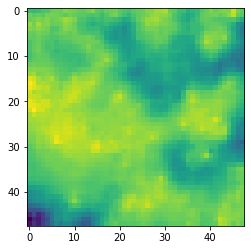

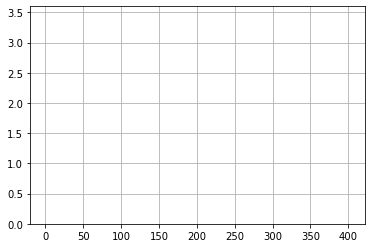

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 385] losses: (12.722560442686081, nan)


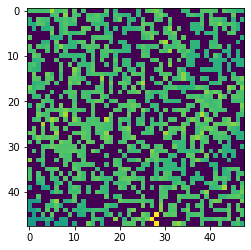

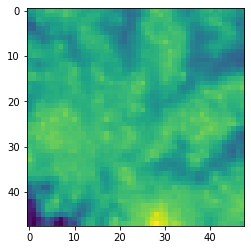

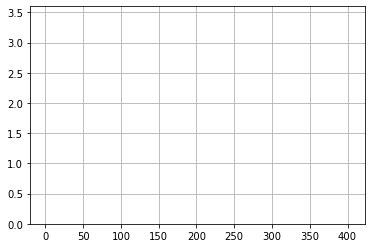

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 386] losses: (13.280380939245225, nan)


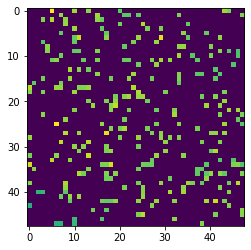

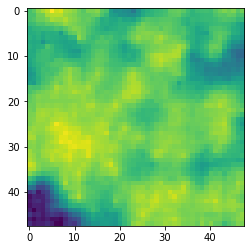

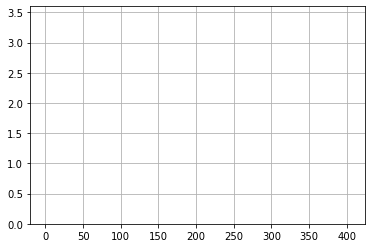

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 387] losses: (13.349731266498566, nan)


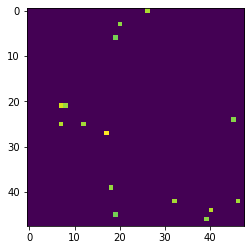

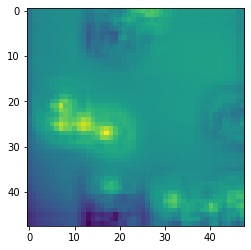

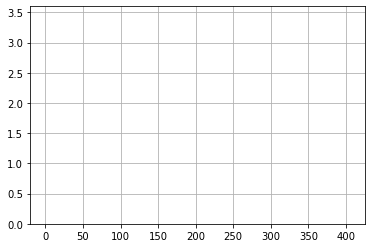

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 388] losses: (14.70078618645668, nan)


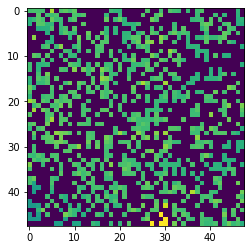

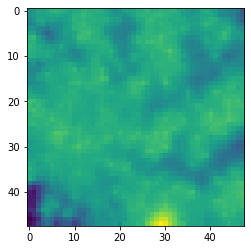

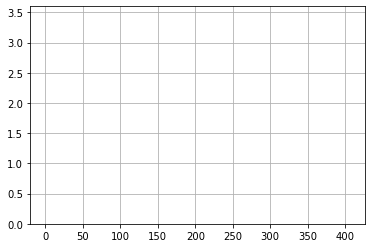

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 389] losses: (12.636600295305252, nan)


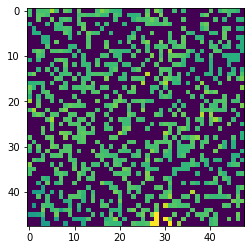

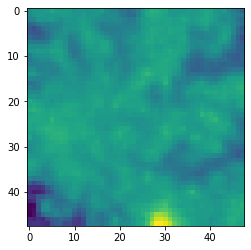

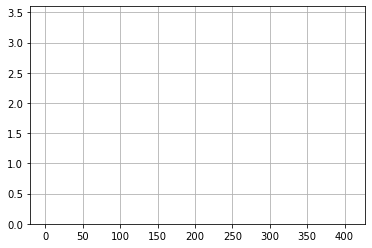

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 390] losses: (13.291840969324111, nan)


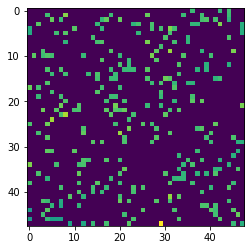

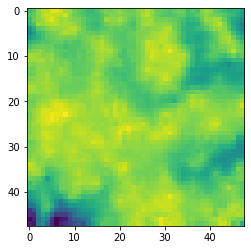

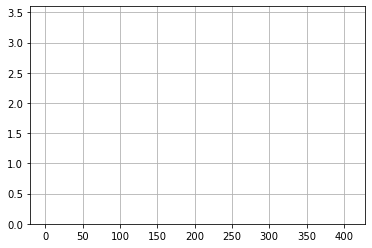

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 391] losses: (13.77025488615036, nan)


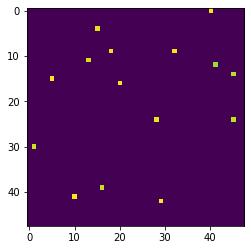

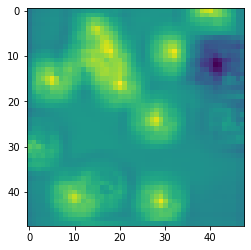

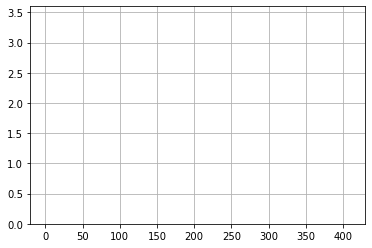

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 392] losses: (13.752382725477219, nan)


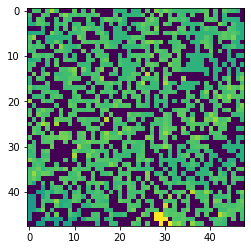

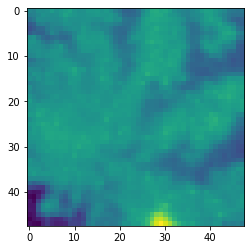

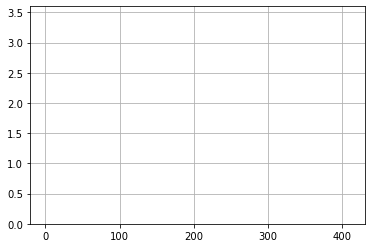

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 393] losses: (14.662413213253021, nan)


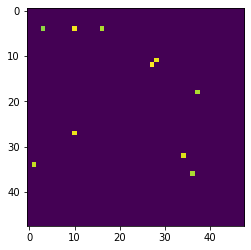

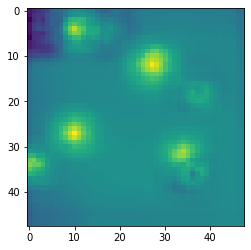

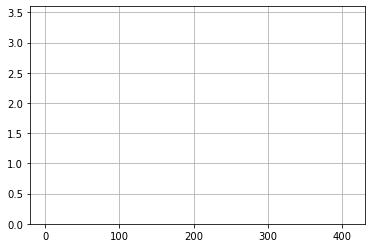

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 394] losses: (12.638589610457421, nan)


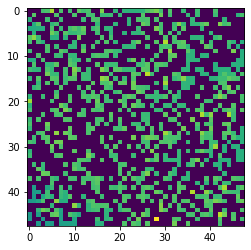

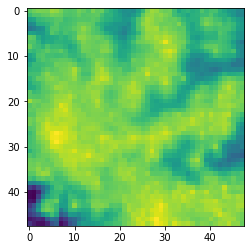

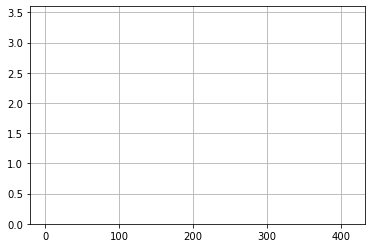

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 395] losses: (13.736536798477173, nan)


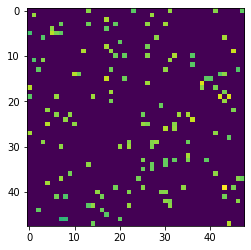

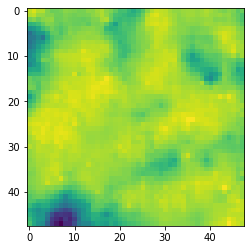

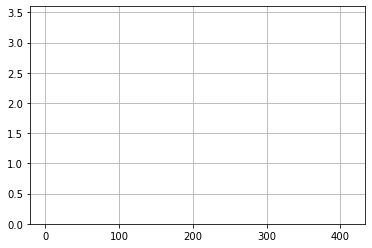

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 396] losses: (12.593321952819824, nan)


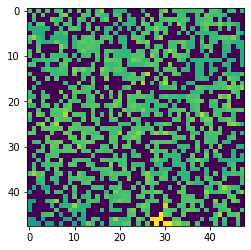

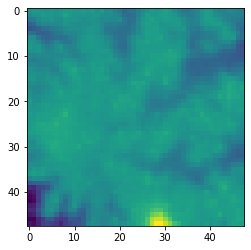

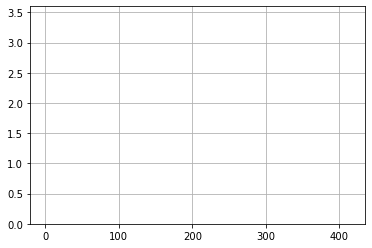

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 397] losses: (13.53401850938797, nan)


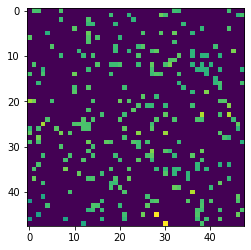

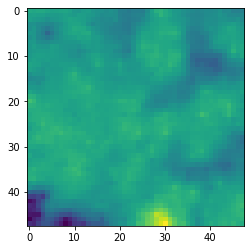

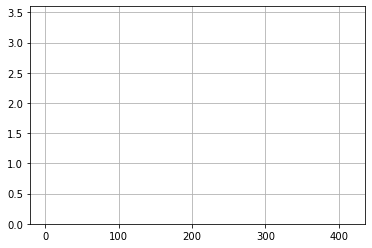

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 398] losses: (13.208483258485794, nan)


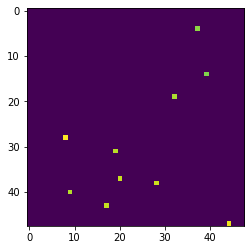

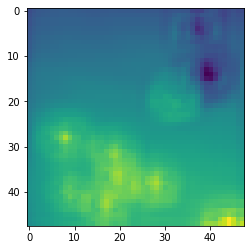

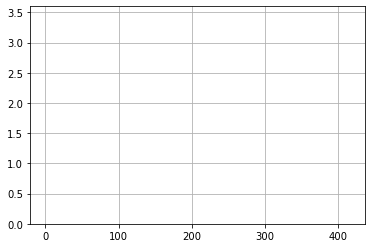

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 399] losses: (13.127840414047242, nan)


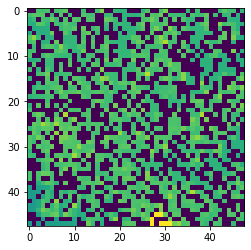

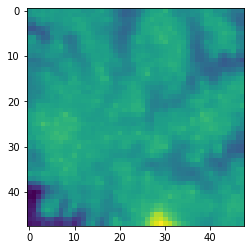

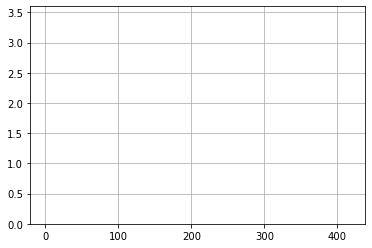

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 400] losses: (12.814986661672592, nan)


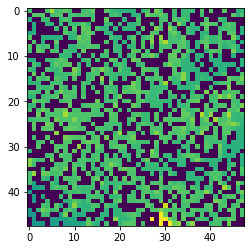

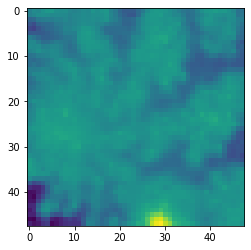

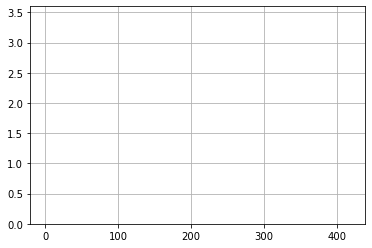

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 401] losses: (13.408864660859107, nan)


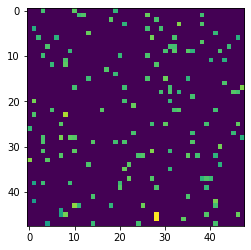

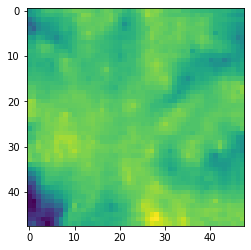

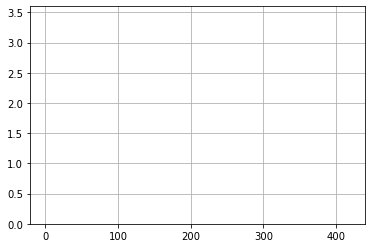

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 402] losses: (13.257641060352325, nan)


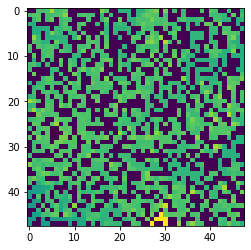

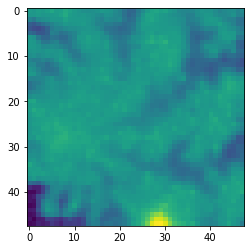

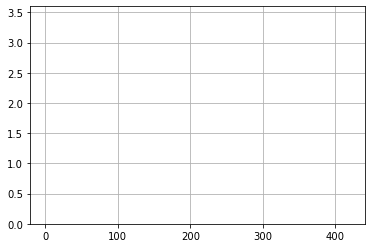

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 403] losses: (13.371236755847931, nan)


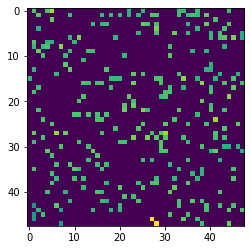

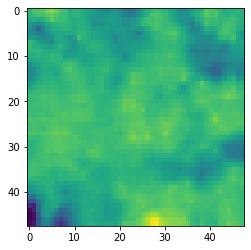

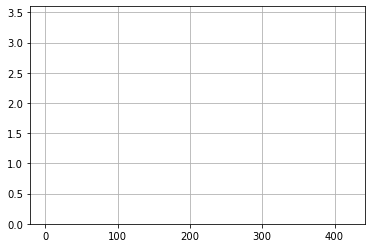

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 404] losses: (12.950625543594361, nan)


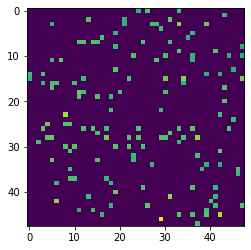

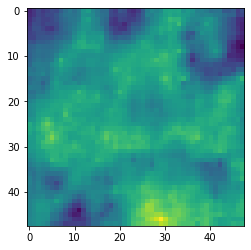

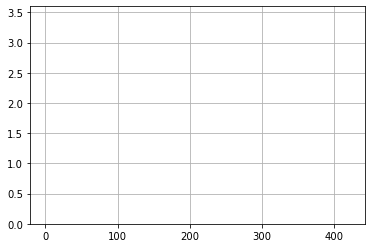

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 405] losses: (14.287356364727021, nan)


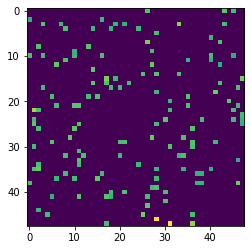

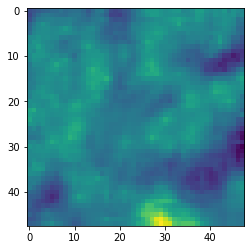

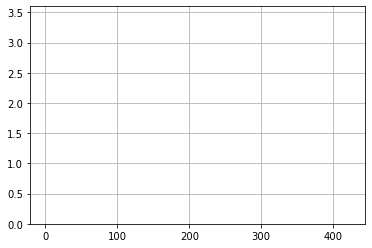

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 406] losses: (13.170825809240341, nan)


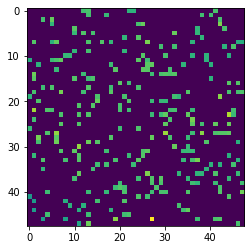

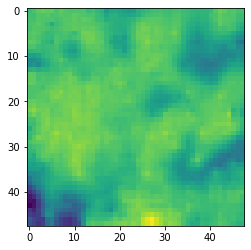

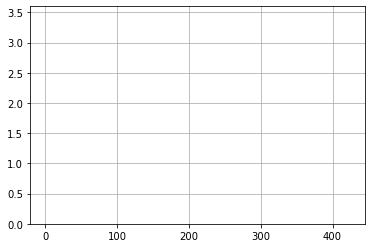

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 407] losses: (12.885064392089843, nan)


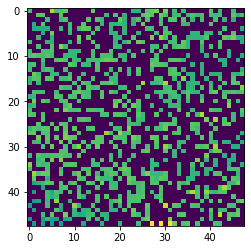

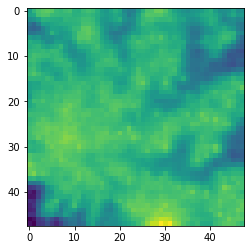

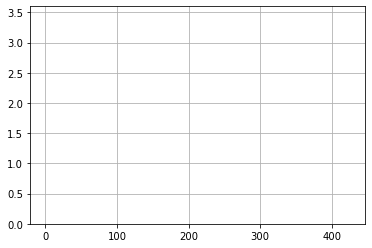

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 408] losses: (14.247083426713944, nan)


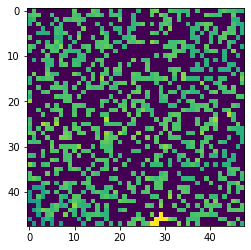

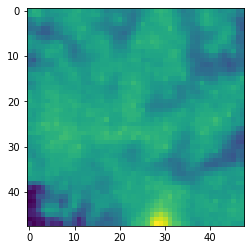

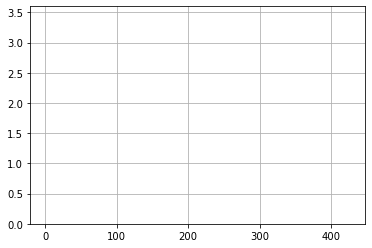

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 409] losses: (12.942136702537537, nan)


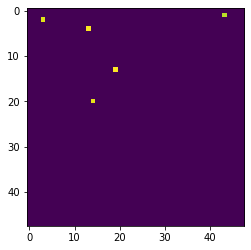

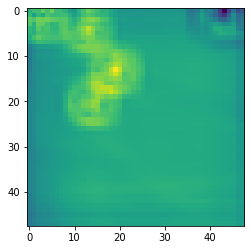

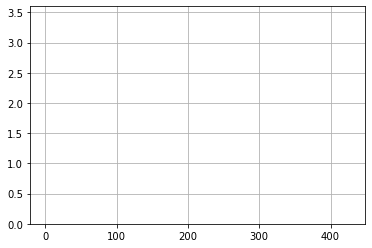

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 410] losses: (13.121384534835816, nan)


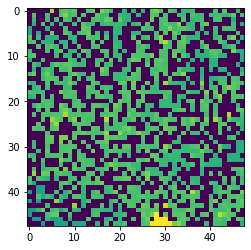

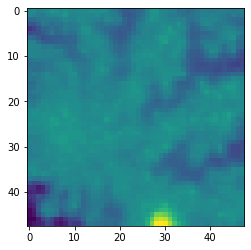

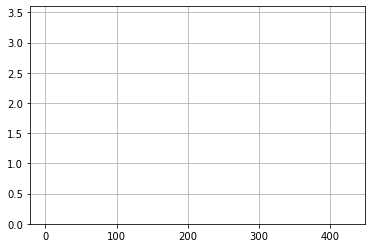

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 411] losses: (13.532765954732895, nan)


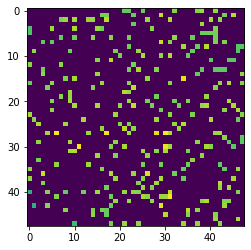

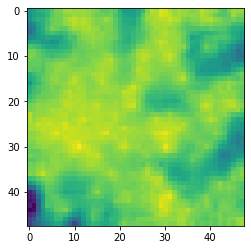

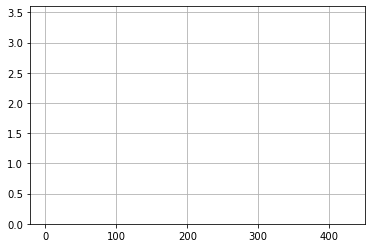

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 412] losses: (13.653163006305695, nan)


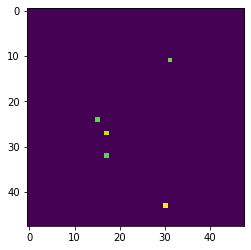

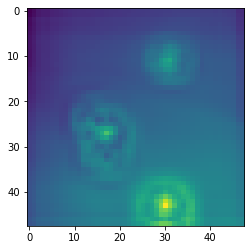

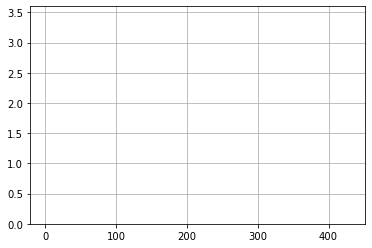

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 413] losses: (13.621120508909225, nan)


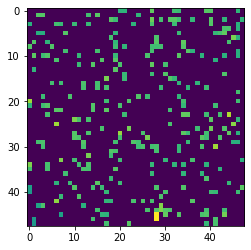

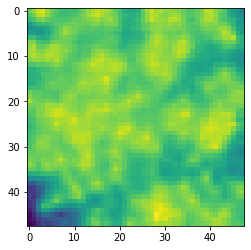

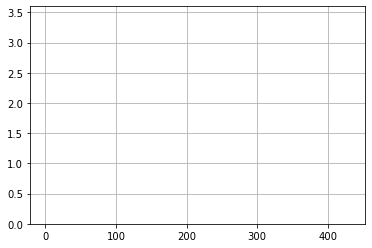

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 414] losses: (11.827808355093003, nan)


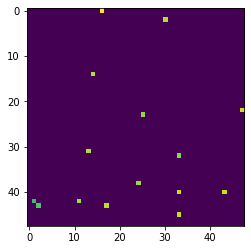

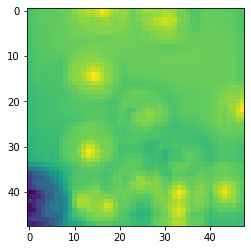

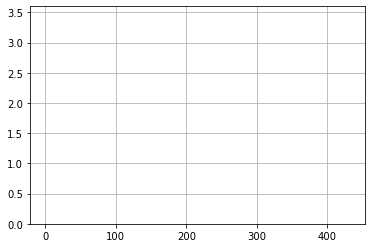

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 415] losses: (13.554317206144333, nan)


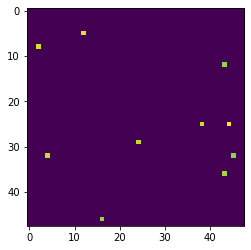

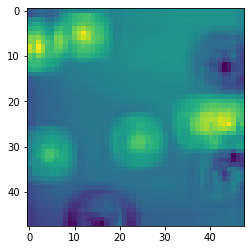

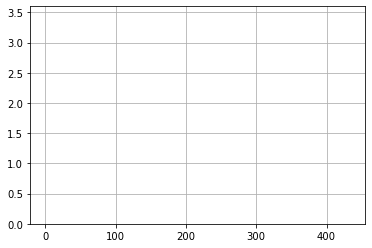

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 416] losses: (13.673417468070983, nan)


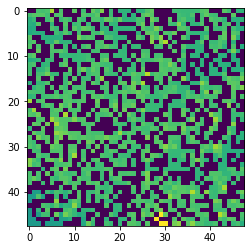

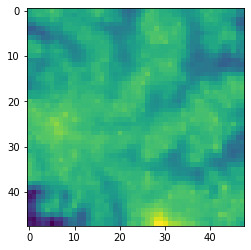

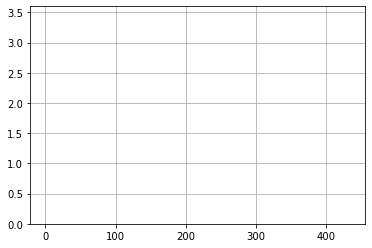

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 417] losses: (13.883913214206695, nan)


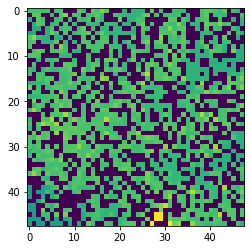

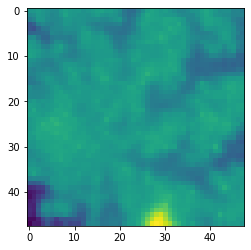

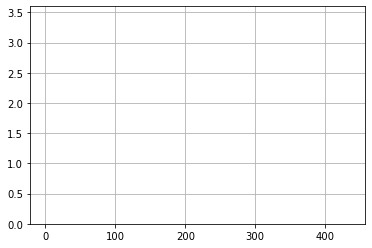

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 418] losses: (13.737475996017457, nan)


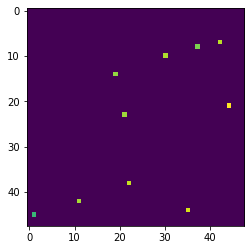

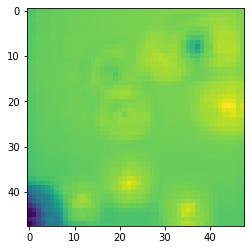

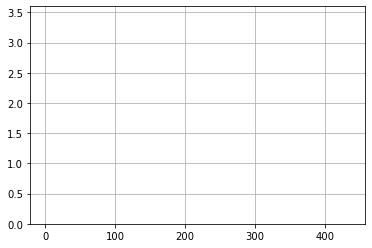

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 419] losses: (13.70370397567749, nan)


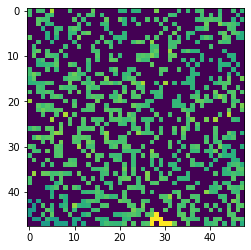

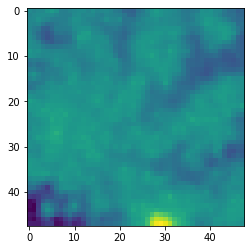

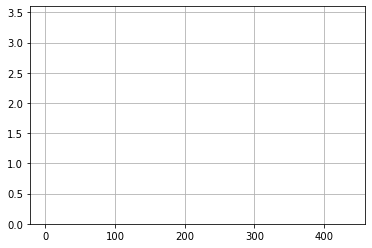

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 420] losses: (13.842542095184326, nan)


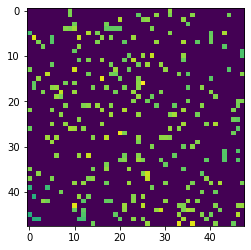

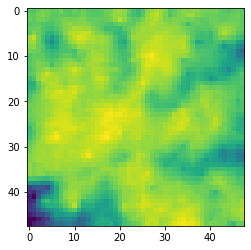

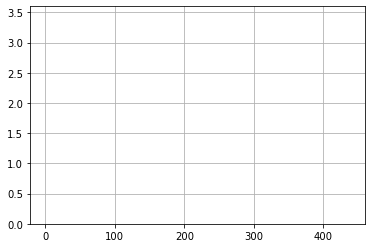

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 421] losses: (13.338540790081025, nan)


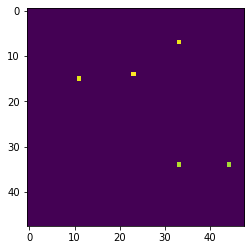

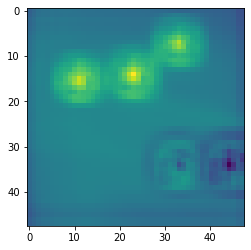

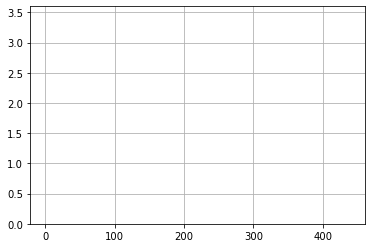

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 422] losses: (13.408363335132599, nan)


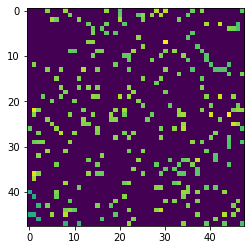

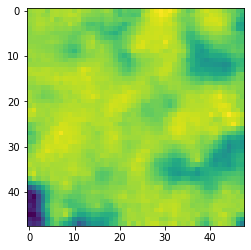

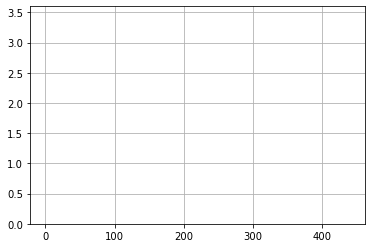

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 423] losses: (13.297326335906982, nan)


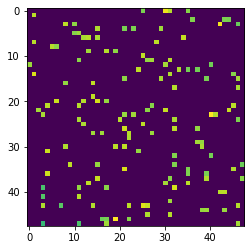

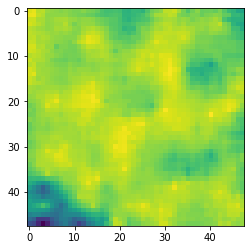

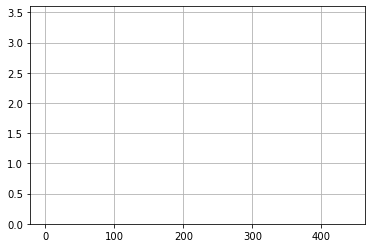

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 424] losses: (13.595792050361633, nan)


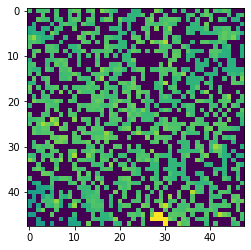

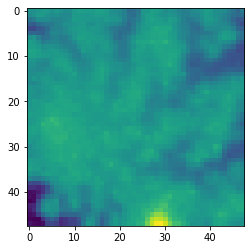

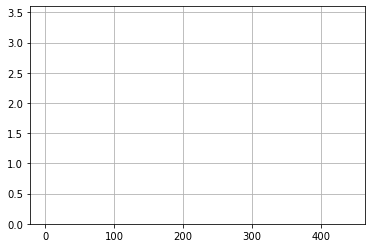

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 425] losses: (12.747878999710084, nan)


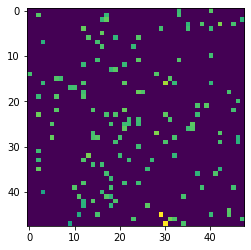

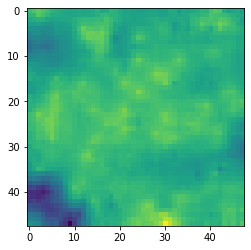

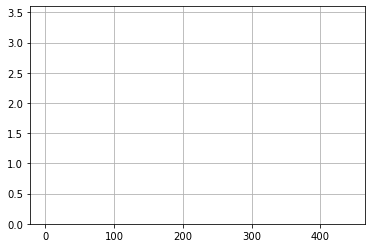

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 426] losses: (14.241225382089615, nan)


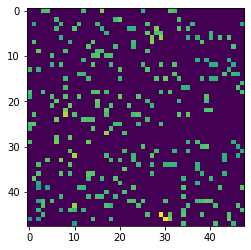

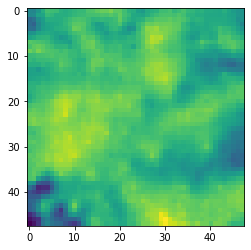

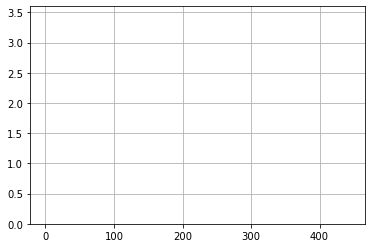

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 427] losses: (12.958011564016342, nan)


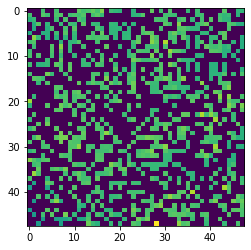

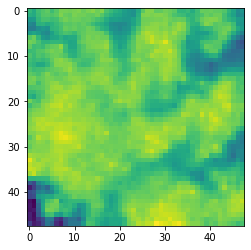

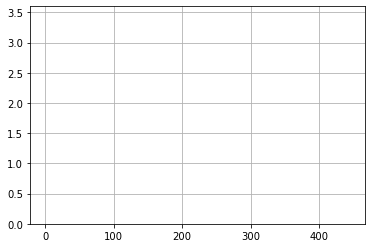

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 428] losses: (13.041360858678818, nan)


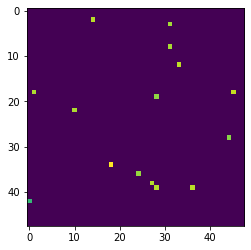

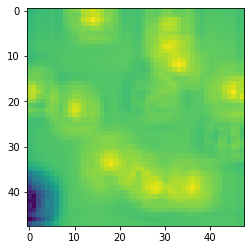

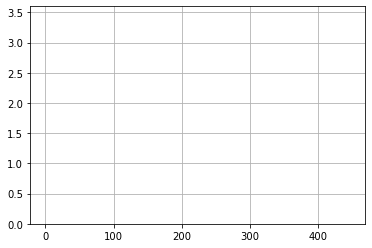

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 429] losses: (13.52263911128044, nan)


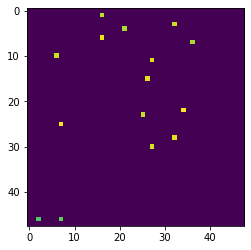

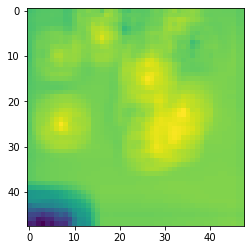

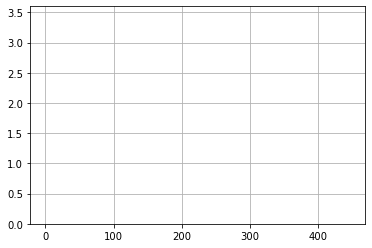

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 430] losses: (12.912922263145447, nan)


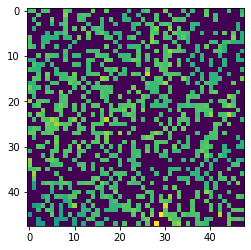

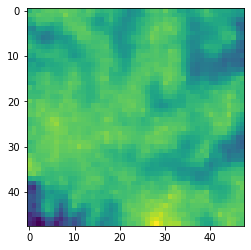

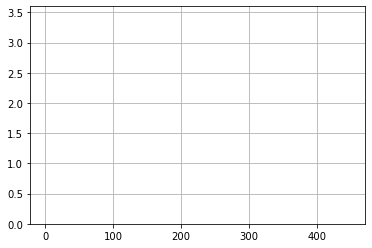

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 431] losses: (13.774975898265838, nan)


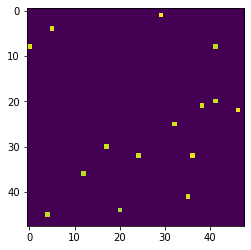

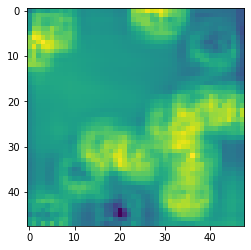

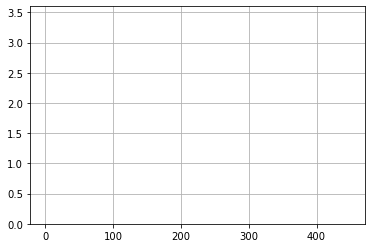

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 432] losses: (13.780232518911362, nan)


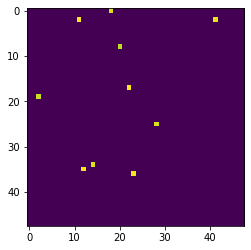

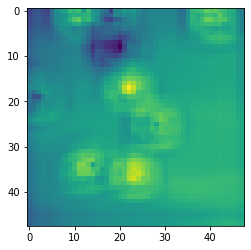

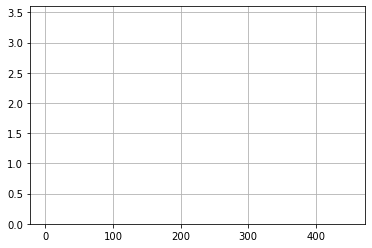

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 433] losses: (12.237255083322525, nan)


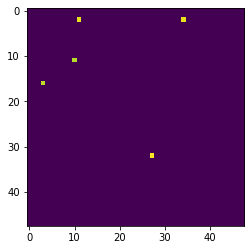

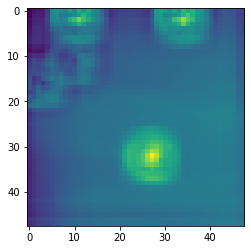

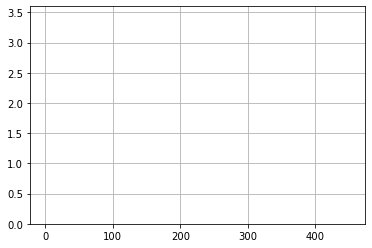

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 434] losses: (13.84403027534485, nan)


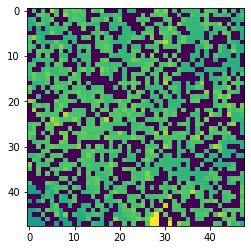

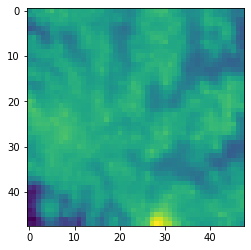

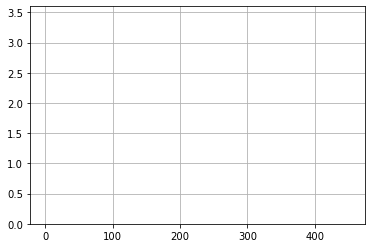

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 435] losses: (12.80006183028221, nan)


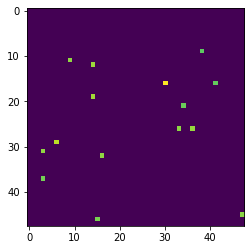

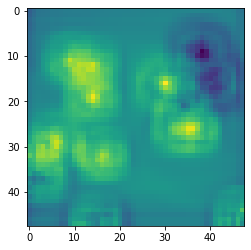

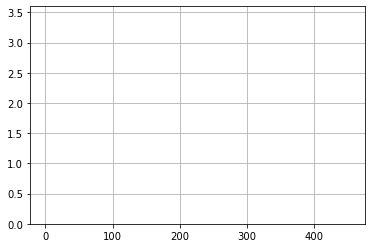

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 436] losses: (14.542244819402695, nan)


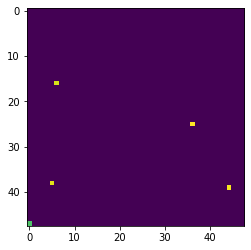

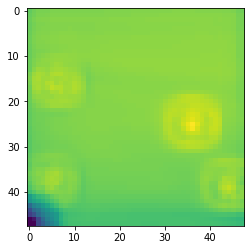

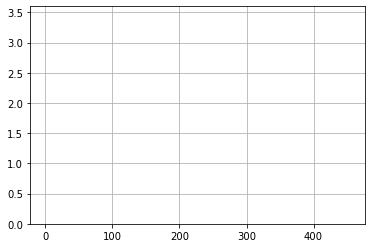

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 437] losses: (12.426485480070115, nan)


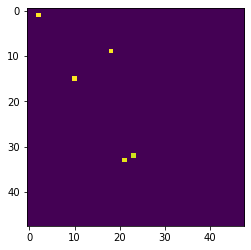

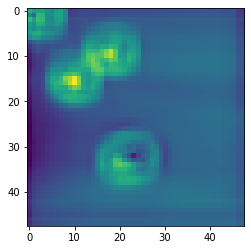

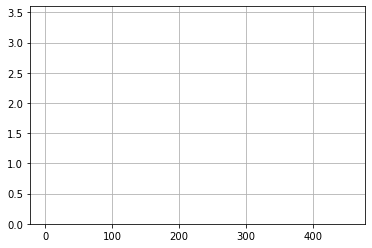

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 438] losses: (14.23756797492504, nan)


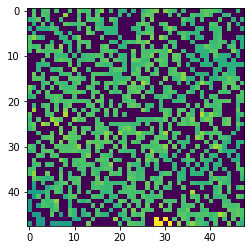

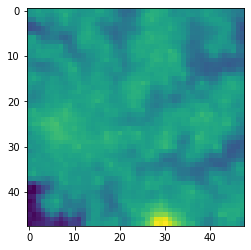

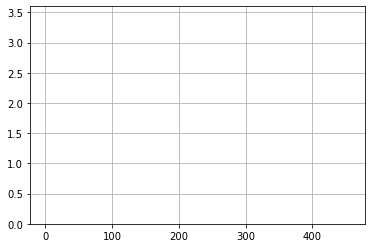

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 439] losses: (13.367901717424393, nan)


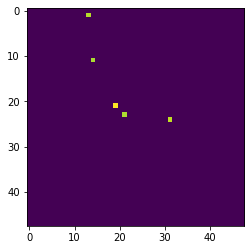

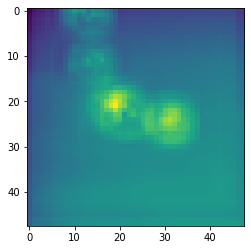

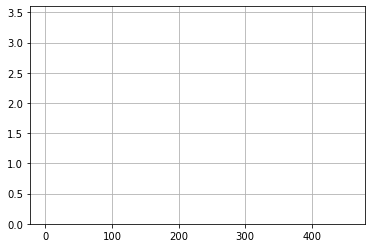

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 440] losses: (12.24486009120941, nan)


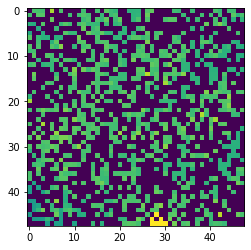

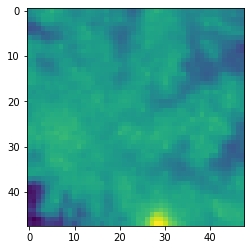

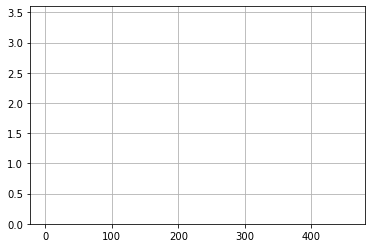

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 441] losses: (12.504534012079239, nan)


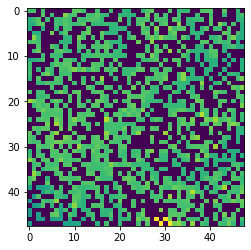

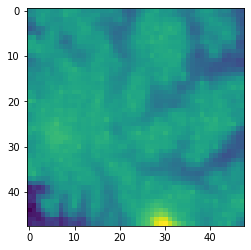

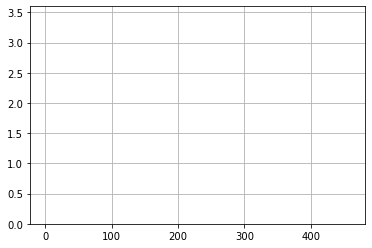

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 442] losses: (13.368588778972626, nan)


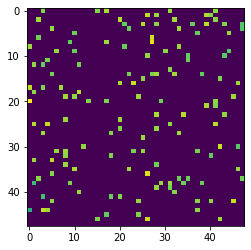

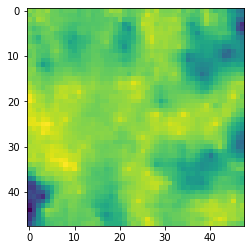

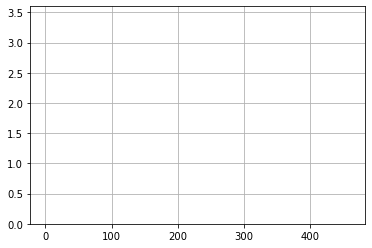

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 443] losses: (13.858662974834441, nan)


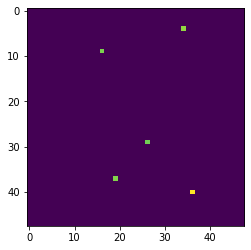

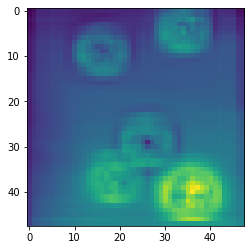

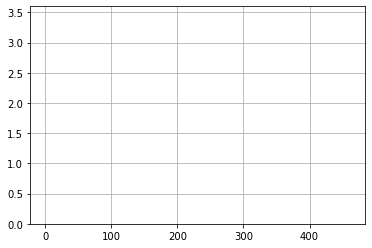

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 444] losses: (13.42394953250885, nan)


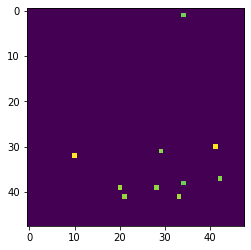

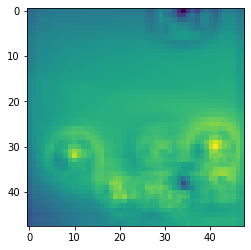

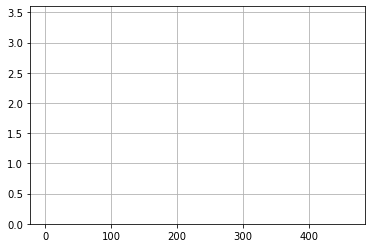

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 445] losses: (14.134901314973831, nan)


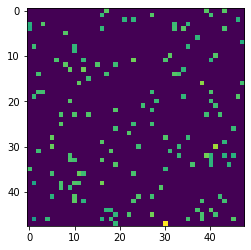

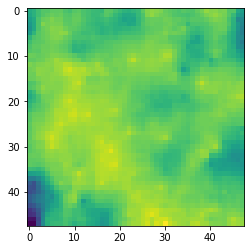

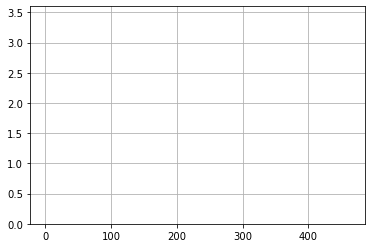

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 446] losses: (12.570360275506973, nan)


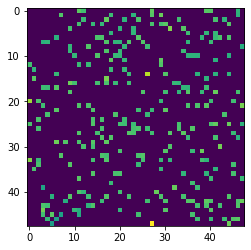

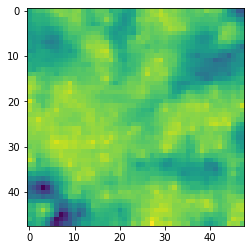

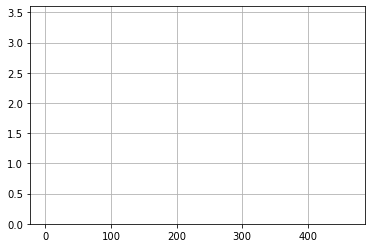

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 447] losses: (12.763235441446305, nan)


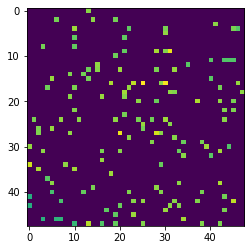

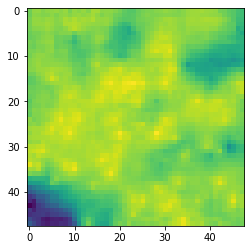

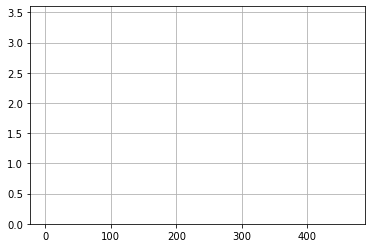

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 448] losses: (12.79763785660267, nan)


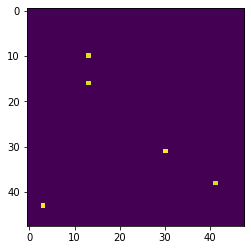

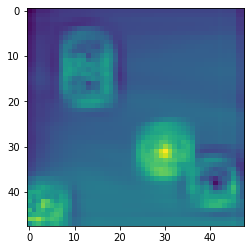

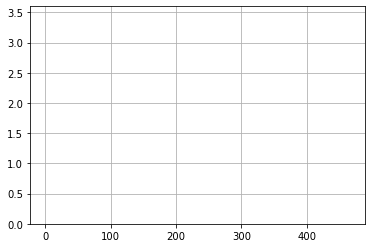

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 449] losses: (13.99234727859497, nan)


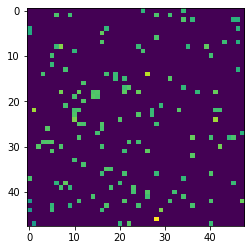

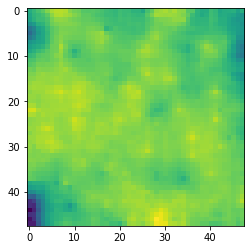

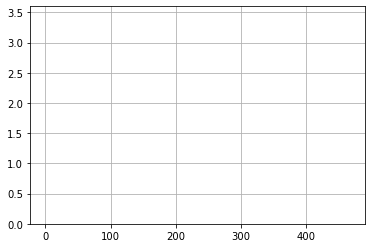

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 450] losses: (13.607749710083008, nan)


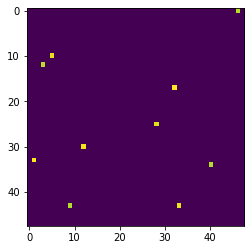

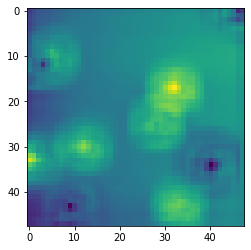

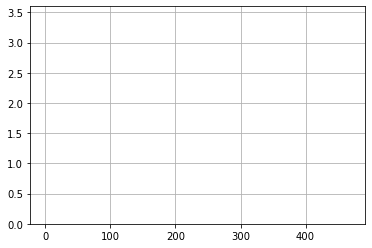

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 451] losses: (13.308628731966019, nan)


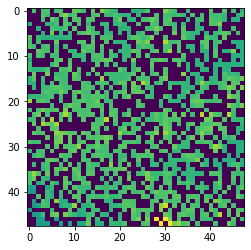

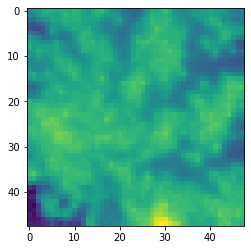

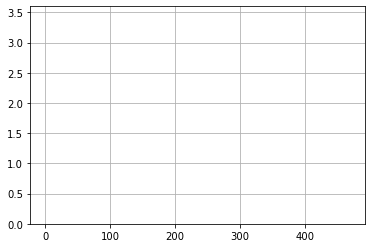

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 452] losses: (12.319930989742279, nan)


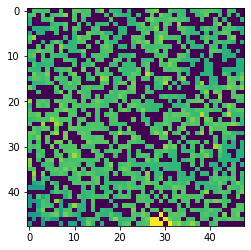

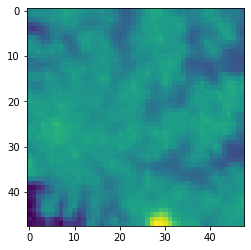

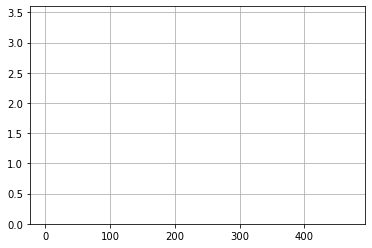

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 453] losses: (14.823931313753128, nan)


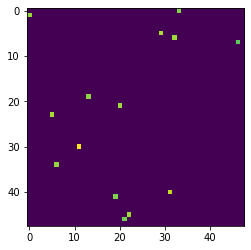

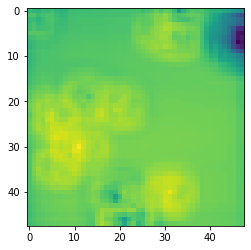

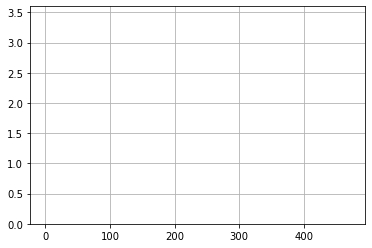

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 454] losses: (12.617585604190827, nan)


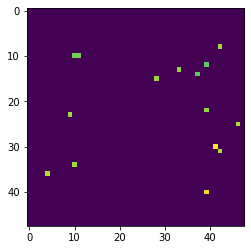

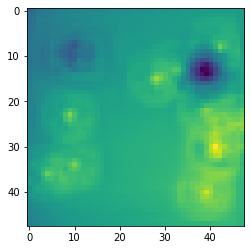

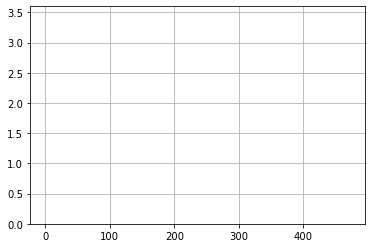

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 455] losses: (13.212858393192292, nan)


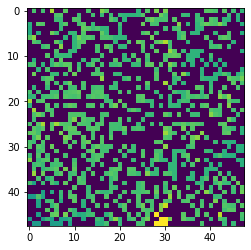

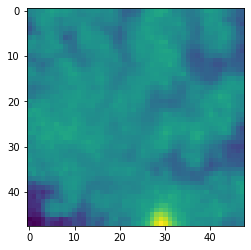

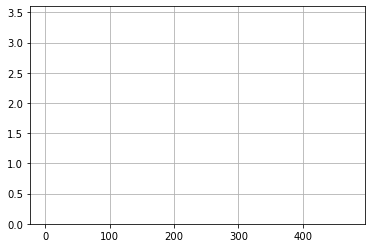

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 456] losses: (13.823154773712158, nan)


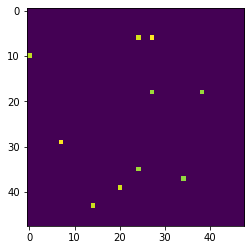

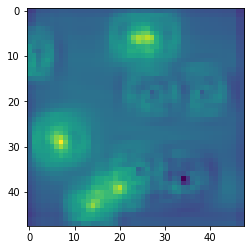

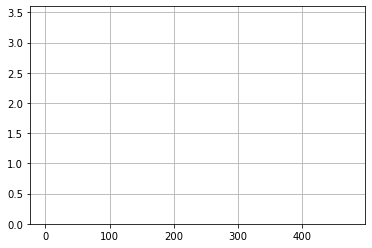

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 457] losses: (13.595873818397521, nan)


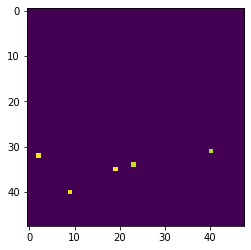

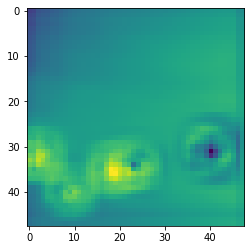

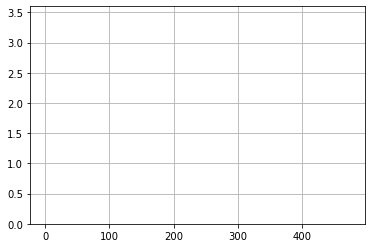

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 458] losses: (12.93086331963539, nan)


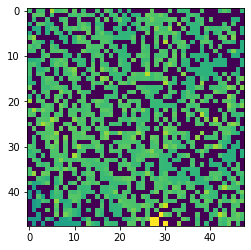

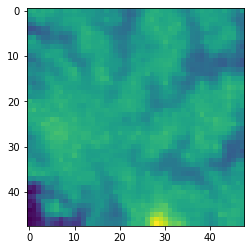

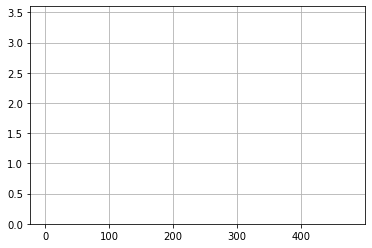

  0%|          | 0/200 [00:00<?, ?it/s]

[0, 459] losses: (12.963496899604797, nan)


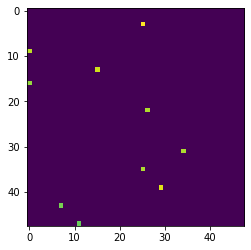

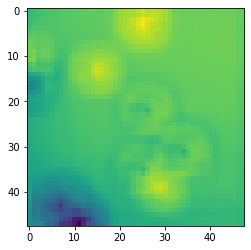

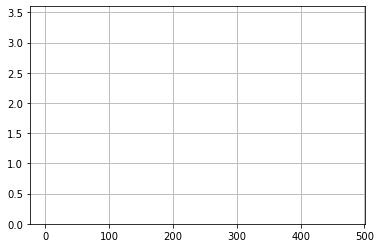

  0%|          | 0/200 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [21]:
bnum = 4
train_gen, train_steps = getbatchgen(range(train_num), getimages, batchsize=bnum)
optimizer = torch.optim.Adam(lr=1e-4, betas=(0.9, 0.999), params=net.parameters())
rdp, rdt = 0, 0  # running losses of disc(p) and disc(t)

for epoch in range(net.epoch, 2000):  # loop over the dataset multiple times
    net.epoch = epoch

    running_loss1 = []
    running_loss2 = []
    for k in range(train_num//bnum):
        for _ in trange(200):
            # get the inputs; data is a list of [inputs, labels]
            LR, HR = next(train_gen)
            LR = addmask(LR)
            LR, HR = np2t(LR, HR)

            # forward
            SR = net(LR)
            
            # update network
            net.zero_grad()
            loss1, loss2, loss3, loss4 = lossfunction(SR, HR)
            loss = loss1 + loss2 + loss3 + loss4
            loss.backward()
            optimizer.step()

            # print statistics
            running_loss1 += [loss1.item()]
            #running_loss2 += [loss2.item()]
            
            if net.iters % 200 == 0:
                LR, HR = getimages_val(range(0, 500, 10))
                LR = addmask(LR)
                LR, HR = np2t(LR, HR)
                SR = net.eval(LR)
                loss1, loss2, loss3, loss4 = lossfunction(SR, HR)
                loss = loss1 + loss2 + loss3 + loss4
                net.trainloss.append(loss.item())
                net.valloss.append(loss.item())
            net.iters += 1
            
            # Gewichte untersuchen
            ##net.weights.append(t2np(net.convblocks1[2].weight[10, 10:20, 1, 1]))

        ### All kind of around-stuff ###
        print('[{}, {}] losses: {}'.format(epoch, k, (np.mean(running_loss1), np.mean(running_loss2))))
        #print(f'dt = {rdt: .03f}, dp = {rdp: .03f}')
        running_loss1 = []

        # Show fixed image (validation)
        LR, HR = getimages_val([ifixed])
        LR = addmask(LR)
        LR = torch.from_numpy(1*LR.astype('float32')).cuda()
        SR = net(LR)
        showimg(LR[0,:,:,0])
        showimg(SR[0])
        plt.plot(net.valloss)
        plt.ylim((0,3.6))
        plt.grid()
        plt.show()

print('Finished Training')
